<a href="https://colab.research.google.com/github/PromitMukherjee/Machine_learning_Algorithm/blob/main/Supervised_Learning/Ridge_Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

DATASET INFORMATION
X shape : (1000, 5)
y shape : (1000,)
Number of samples : 1000
Number of features: 5

TRAIN / TEST SPLIT
X_train: (800, 5)
X_test : (200, 5)
y_train: (800,)
y_test : (200,)

MODEL PARAMETERS
Alpha : 1.0
Intercept : 9.455923137729231
Coefficient X1: 4.797336081362369
Coefficient X2: -3.3564058980486733
Coefficient X3: 1.8218489648290979
Coefficient X4: 6.660895086624022
Coefficient X5: -3.7149800984186823

MODEL EVALUATION
            Metric  Training   Testing
               MAE  3.943195  4.025194
               MSE 25.189405 25.656550
              RMSE  5.018905  5.065230
                R²  0.796555  0.814875
       Adjusted R²  0.795274  0.810104
Explained Variance  0.796555  0.815538


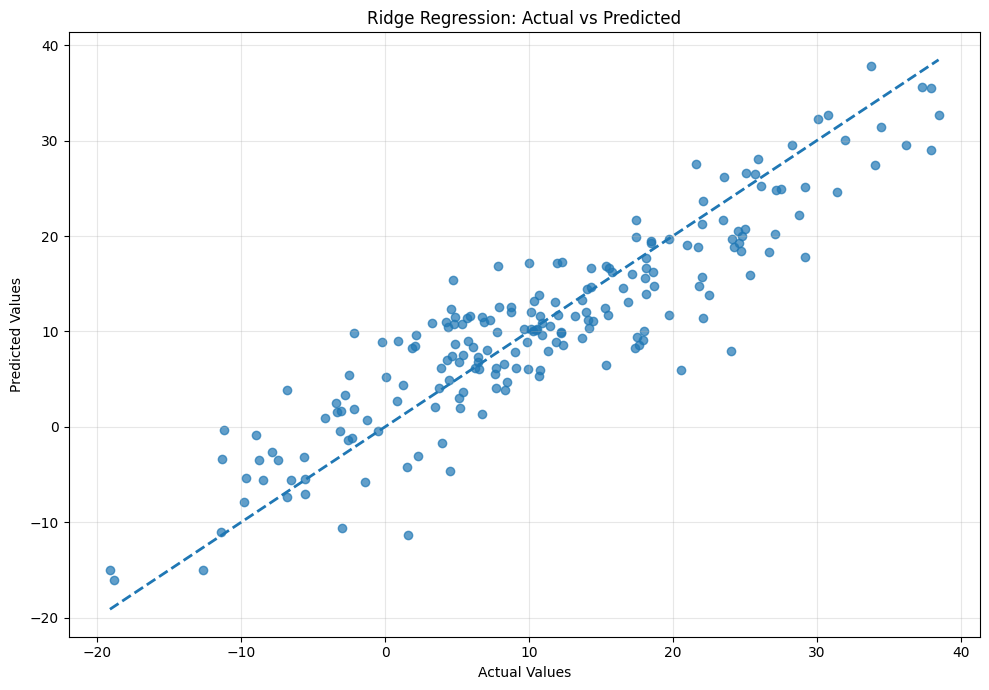

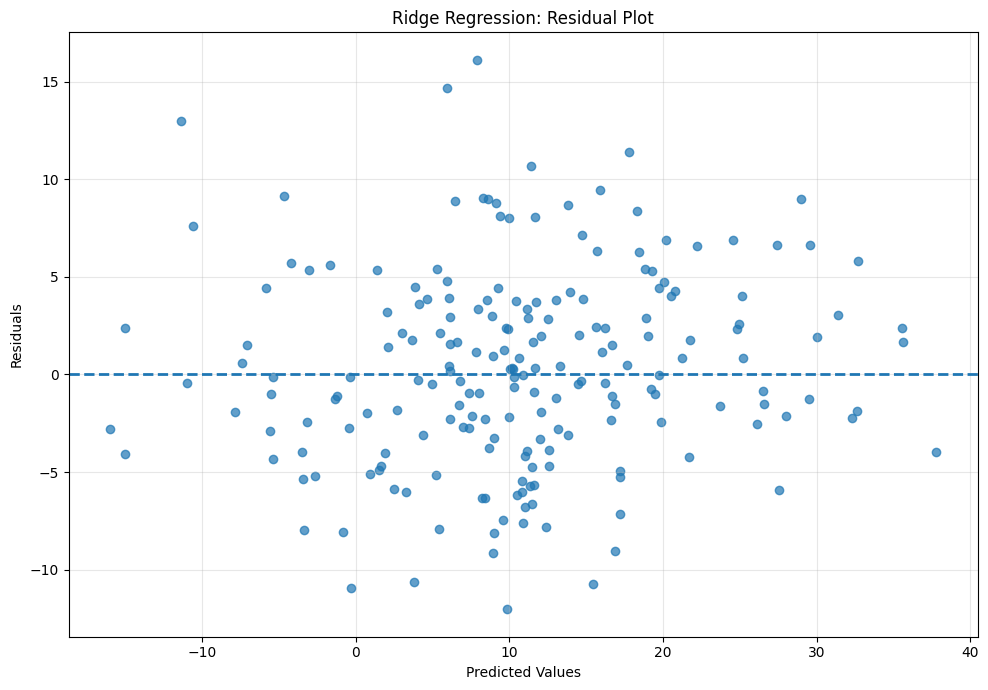

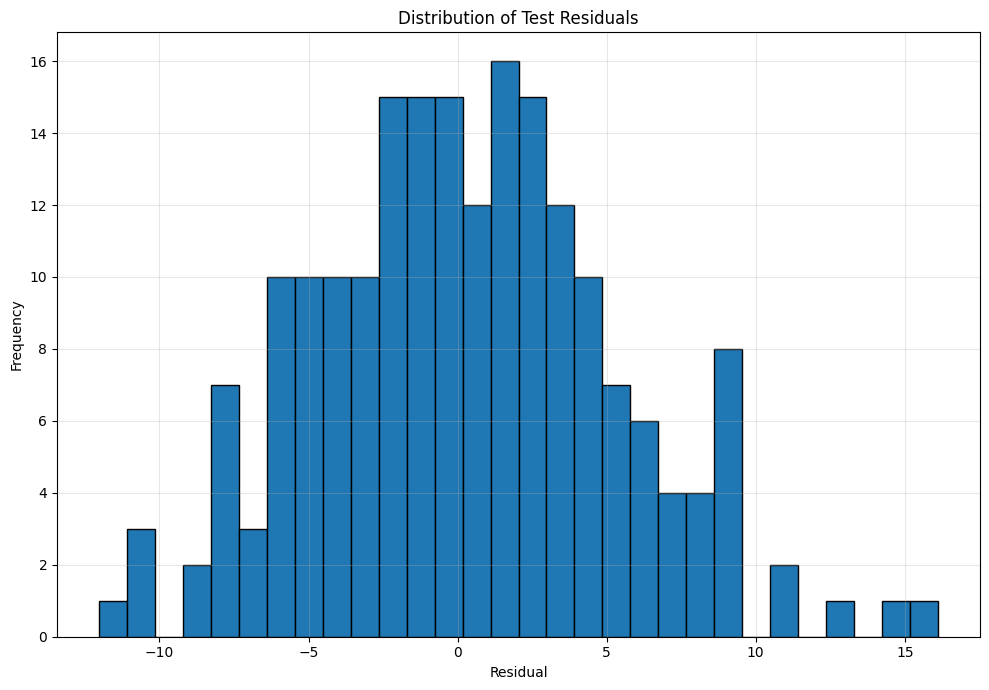

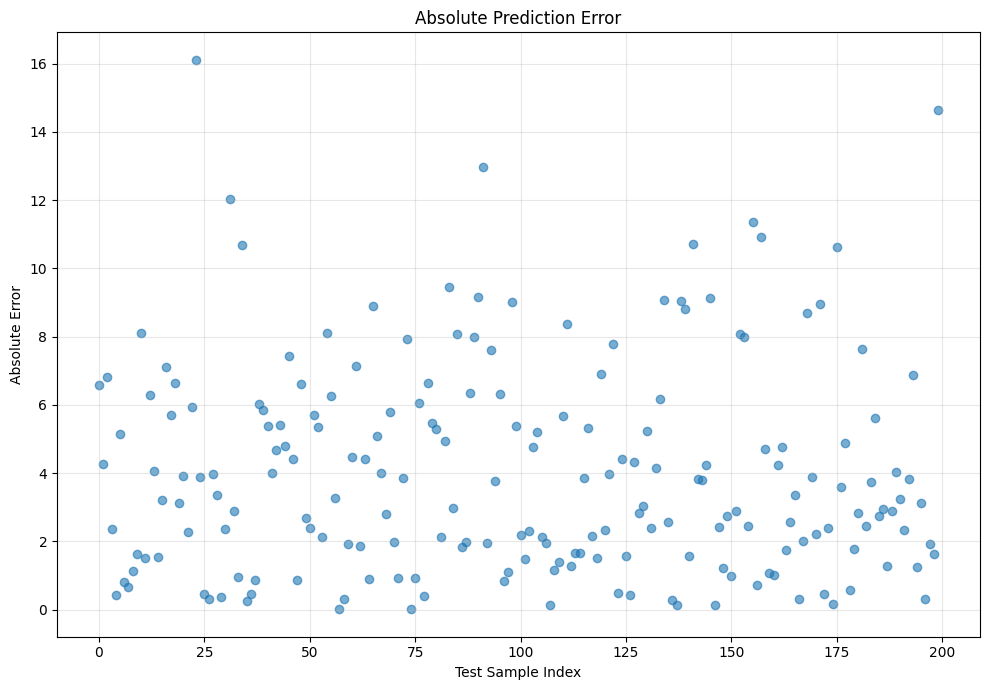

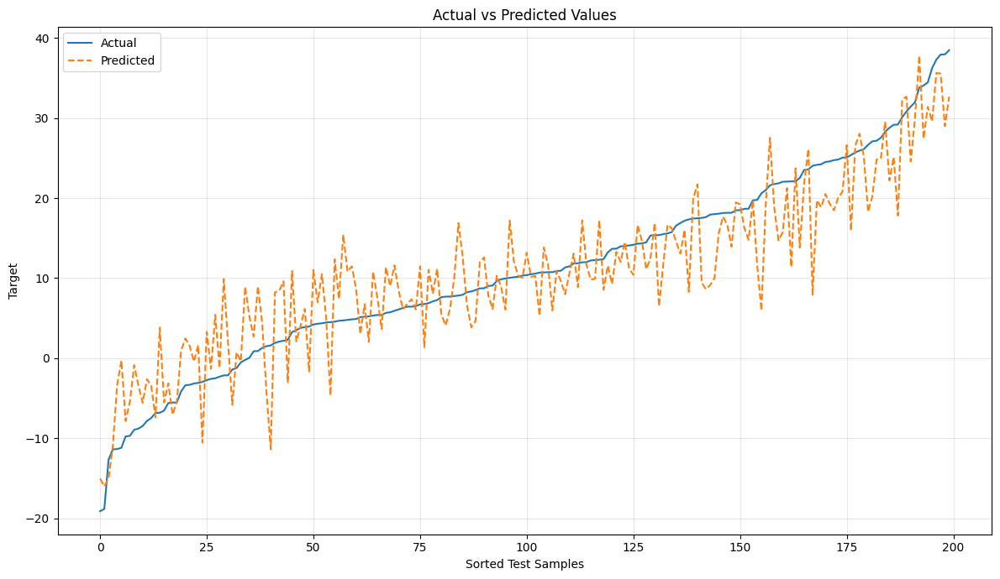


REGULARIZATION ANALYSIS
      Alpha  Test_RMSE  Test_R2  Coefficient_Norm
   0.001000   5.063920 0.814971          9.798012
   0.010000   5.063931 0.814970          9.797905
   0.100000   5.064048 0.814961          9.796830
   1.000000   5.065230 0.814875          9.786094
  10.000000   5.078218 0.813924          9.680016
 100.000000   5.296369 0.797594          8.733634
1000.000000   7.943296 0.544731          4.419223


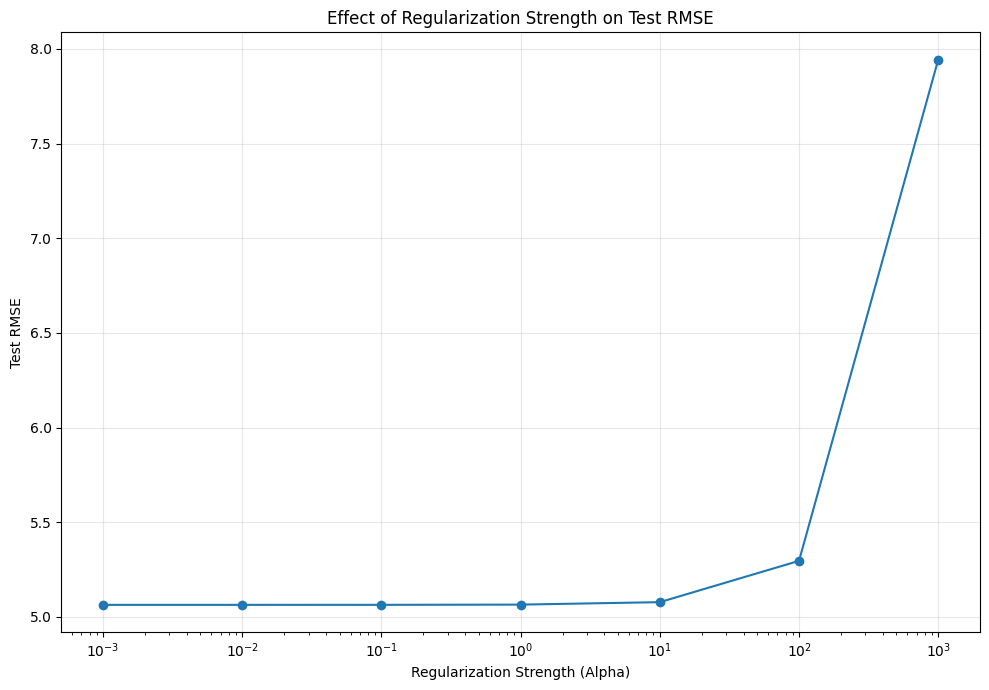

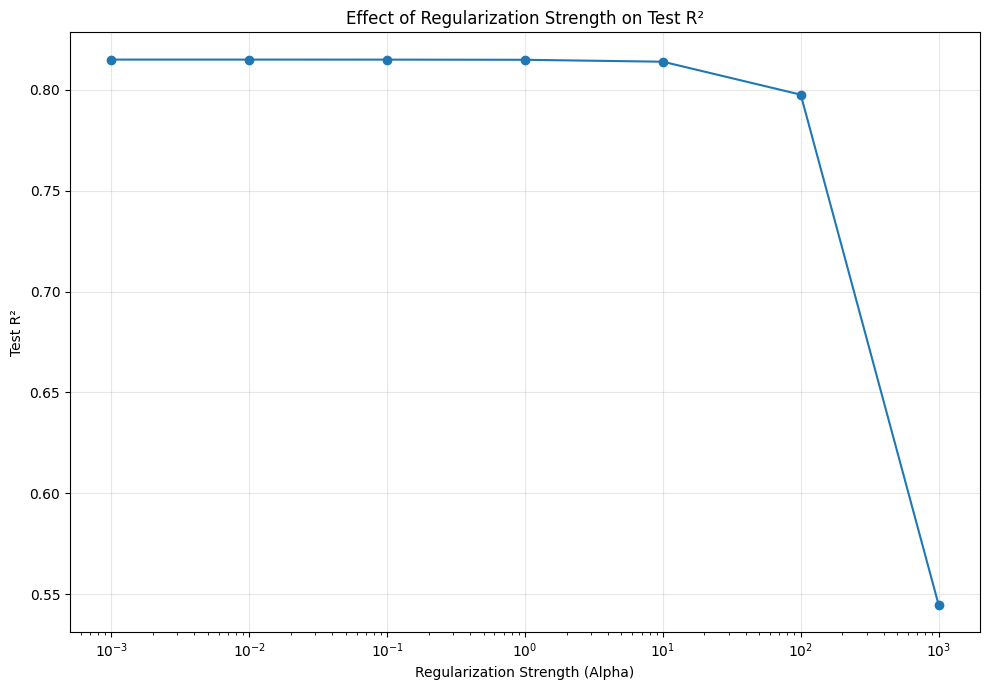

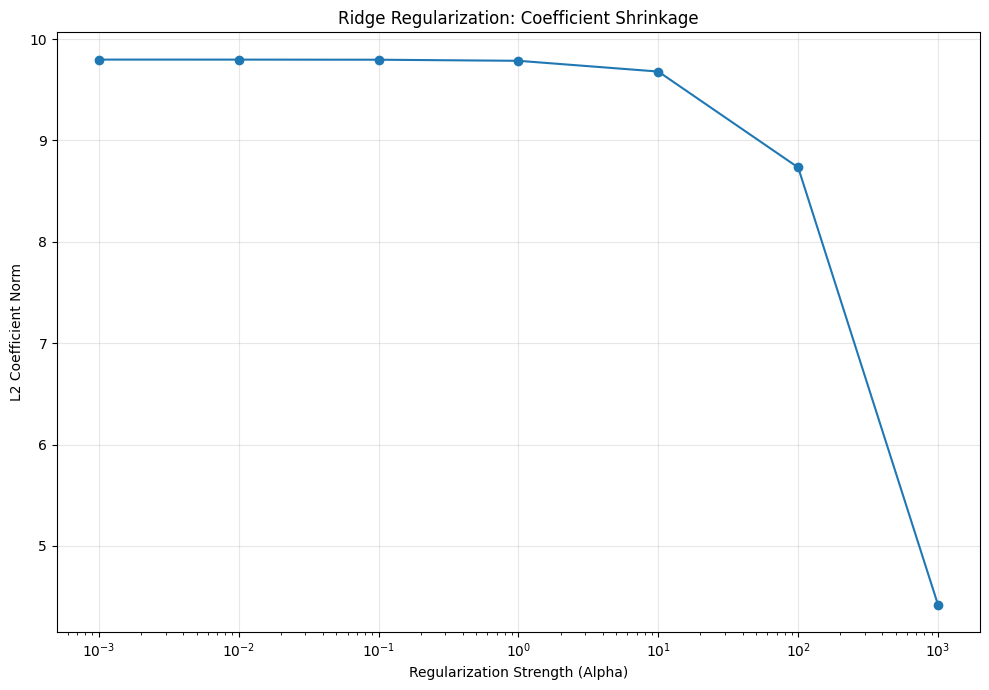


FINAL SUMMARY
Ridge Alpha       : 1.0
Training MAE      : 3.943195
Training RMSE     : 5.018905
Training R²       : 0.796555
Testing MAE       : 4.025194
Testing RMSE      : 5.065230
Testing R²        : 0.814875
Testing Adj. R²   : 0.810104
Explained Variance: 0.815538


In [1]:
# ============================================================
# RIDGE REGRESSION FROM SCRATCH
# NORMAL EQUATION + MATRIX INVERSE
# NO SCIKIT-LEARN
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# 1. REPRODUCIBILITY
# ============================================================

np.random.seed(42)


# ============================================================
# 2. GENERATE LARGE SYNTHETIC DATASET
# ============================================================

n_samples = 1000
n_features = 5

X = np.random.randn(n_samples, n_features)

# True coefficients
true_weights = np.array([
    5.0,
    -3.5,
    2.0,
    7.0,
    -4.0
])

true_intercept = 10.0

# Noise
noise = np.random.normal(
    loc=0,
    scale=5,
    size=n_samples
)

# Target
y = (
    true_intercept
    + X @ true_weights
    + noise
)


print("=" * 70)
print("DATASET INFORMATION")
print("=" * 70)

print("X shape :", X.shape)
print("y shape :", y.shape)
print("Number of samples :", n_samples)
print("Number of features:", n_features)


# ============================================================
# 3. TRAIN / TEST SPLIT FROM SCRATCH
# ============================================================

test_size = 0.20

indices = np.random.permutation(n_samples)

test_count = int(n_samples * test_size)

test_indices = indices[:test_count]
train_indices = indices[test_count:]

X_train = X[train_indices]
X_test = X[test_indices]

y_train = y[train_indices]
y_test = y[test_indices]


print("\n" + "=" * 70)
print("TRAIN / TEST SPLIT")
print("=" * 70)

print("X_train:", X_train.shape)
print("X_test :", X_test.shape)
print("y_train:", y_train.shape)
print("y_test :", y_test.shape)


# ============================================================
# 4. STANDARDIZATION FROM SCRATCH
# ============================================================

# Calculate training mean and standard deviation
X_mean = np.mean(X_train, axis=0)
X_std = np.std(X_train, axis=0)

# Avoid division by zero
X_std[X_std == 0] = 1

# Standardize
X_train_scaled = (
    X_train - X_mean
) / X_std

X_test_scaled = (
    X_test - X_mean
) / X_std


# ============================================================
# 5. RIDGE REGRESSION CLASS
#    NORMAL EQUATION + MATRIX INVERSE
# ============================================================

class RidgeRegression:

    def __init__(self, alpha=1.0):
        self.alpha = alpha

        self.coef_ = None
        self.intercept_ = None

        self.weights_ = None

    # --------------------------------------------------------
    # FIT
    # --------------------------------------------------------

    def fit(self, X, y):

        n_samples, n_features = X.shape

        # ----------------------------------------------------
        # Add intercept column
        # ----------------------------------------------------

        X_b = np.c_[
            np.ones((n_samples, 1)),
            X
        ]

        # ----------------------------------------------------
        # Identity matrix
        # ----------------------------------------------------

        I = np.eye(n_features + 1)

        # ----------------------------------------------------
        # DO NOT REGULARIZE INTERCEPT
        # ----------------------------------------------------

        I[0, 0] = 0

        # ----------------------------------------------------
        # Ridge Normal Equation
        #
        # theta =
        # (X^T X + alpha I)^(-1) X^T y
        # ----------------------------------------------------

        A = X_b.T @ X_b + self.alpha * I

        b = X_b.T @ y

        # ----------------------------------------------------
        # Matrix inverse
        # ----------------------------------------------------

        A_inv = np.linalg.inv(A)

        # ----------------------------------------------------
        # Calculate parameters
        # ----------------------------------------------------

        self.weights_ = A_inv @ b

        # First value = intercept
        self.intercept_ = self.weights_[0]

        # Remaining values = coefficients
        self.coef_ = self.weights_[1:]

        return self

    # --------------------------------------------------------
    # PREDICT
    # --------------------------------------------------------

    def predict(self, X):

        return (
            self.intercept_
            + X @ self.coef_
        )

    # --------------------------------------------------------
    # SCORE
    # --------------------------------------------------------

    def score(self, X, y):

        y_pred = self.predict(X)

        ss_res = np.sum(
            (y - y_pred) ** 2
        )

        ss_tot = np.sum(
            (y - np.mean(y)) ** 2
        )

        return 1 - (ss_res / ss_tot)


# ============================================================
# 6. CREATE RIDGE MODEL
# ============================================================

alpha = 1.0

model = RidgeRegression(
    alpha=alpha
)


# ============================================================
# 7. TRAIN MODEL
# ============================================================

model.fit(
    X_train_scaled,
    y_train
)


# ============================================================
# 8. PREDICTIONS
# ============================================================

y_train_pred = model.predict(
    X_train_scaled
)

y_test_pred = model.predict(
    X_test_scaled
)


# ============================================================
# 9. EVALUATION METRICS FROM SCRATCH
# ============================================================

def mean_absolute_error(y_true, y_pred):

    return np.mean(
        np.abs(y_true - y_pred)
    )


def mean_squared_error(y_true, y_pred):

    return np.mean(
        (y_true - y_pred) ** 2
    )


def root_mean_squared_error(y_true, y_pred):

    return np.sqrt(
        mean_squared_error(
            y_true,
            y_pred
        )
    )


def r2_score(y_true, y_pred):

    ss_res = np.sum(
        (y_true - y_pred) ** 2
    )

    ss_tot = np.sum(
        (y_true - np.mean(y_true)) ** 2
    )

    return 1 - (
        ss_res / ss_tot
    )


def adjusted_r2_score(
    y_true,
    y_pred,
    n_features
):

    n = len(y_true)

    r2 = r2_score(
        y_true,
        y_pred
    )

    return 1 - (
        (1 - r2)
        * (n - 1)
        / (n - n_features - 1)
    )


def explained_variance_score(
    y_true,
    y_pred
):

    residuals = y_true - y_pred

    numerator = np.var(
        residuals
    )

    denominator = np.var(
        y_true
    )

    return 1 - (
        numerator / denominator
    )


# ============================================================
# 10. CALCULATE TRAIN METRICS
# ============================================================

train_mae = mean_absolute_error(
    y_train,
    y_train_pred
)

train_mse = mean_squared_error(
    y_train,
    y_train_pred
)

train_rmse = root_mean_squared_error(
    y_train,
    y_train_pred
)

train_r2 = r2_score(
    y_train,
    y_train_pred
)

train_adj_r2 = adjusted_r2_score(
    y_train,
    y_train_pred,
    n_features
)

train_ev = explained_variance_score(
    y_train,
    y_train_pred
)


# ============================================================
# 11. CALCULATE TEST METRICS
# ============================================================

test_mae = mean_absolute_error(
    y_test,
    y_test_pred
)

test_mse = mean_squared_error(
    y_test,
    y_test_pred
)

test_rmse = root_mean_squared_error(
    y_test,
    y_test_pred
)

test_r2 = r2_score(
    y_test,
    y_test_pred
)

test_adj_r2 = adjusted_r2_score(
    y_test,
    y_test_pred,
    n_features
)

test_ev = explained_variance_score(
    y_test,
    y_test_pred
)


# ============================================================
# 12. DISPLAY MODEL PARAMETERS
# ============================================================

print("\n" + "=" * 70)
print("MODEL PARAMETERS")
print("=" * 70)

print("Alpha :", model.alpha)

print(
    "Intercept :",
    model.intercept_
)

for i, coefficient in enumerate(
    model.coef_
):

    print(
        f"Coefficient X{i+1}:",
        coefficient
    )


# ============================================================
# 13. DISPLAY EVALUATION RESULTS
# ============================================================

results = pd.DataFrame({

    "Metric": [
        "MAE",
        "MSE",
        "RMSE",
        "R²",
        "Adjusted R²",
        "Explained Variance"
    ],

    "Training": [
        train_mae,
        train_mse,
        train_rmse,
        train_r2,
        train_adj_r2,
        train_ev
    ],

    "Testing": [
        test_mae,
        test_mse,
        test_rmse,
        test_r2,
        test_adj_r2,
        test_ev
    ]
})


print("\n" + "=" * 70)
print("MODEL EVALUATION")
print("=" * 70)

print(
    results.to_string(
        index=False,
        float_format=lambda x: f"{x:.6f}"
    )
)


# ============================================================
# 14. ACTUAL VS PREDICTED
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.7
)

min_value = min(
    y_test.min(),
    y_test_pred.min()
)

max_value = max(
    y_test.max(),
    y_test_pred.max()
)

plt.plot(
    [min_value, max_value],
    [min_value, max_value],
    linestyle="--",
    linewidth=2
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Predicted Values"
)

plt.title(
    "Ridge Regression: Actual vs Predicted"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 15. RESIDUAL PLOT
# ============================================================

residuals = (
    y_test - y_test_pred
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test_pred,
    residuals,
    alpha=0.7
)

plt.axhline(
    y=0,
    linestyle="--",
    linewidth=2
)

plt.xlabel(
    "Predicted Values"
)

plt.ylabel(
    "Residuals"
)

plt.title(
    "Ridge Regression: Residual Plot"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 16. RESIDUAL DISTRIBUTION
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.hist(
    residuals,
    bins=30,
    edgecolor="black"
)

plt.xlabel(
    "Residual"
)

plt.ylabel(
    "Frequency"
)

plt.title(
    "Distribution of Test Residuals"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 17. ERROR MAGNITUDE
# ============================================================

absolute_errors = np.abs(
    y_test - y_test_pred
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    range(len(absolute_errors)),
    absolute_errors,
    alpha=0.6
)

plt.xlabel(
    "Test Sample Index"
)

plt.ylabel(
    "Absolute Error"
)

plt.title(
    "Absolute Prediction Error"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 18. ACTUAL VS PREDICTED LINE PLOT
# ============================================================

sorted_indices = np.argsort(y_test)

y_test_sorted = y_test[
    sorted_indices
]

y_pred_sorted = y_test_pred[
    sorted_indices
]

plt.figure(
    figsize=(12, 7)
)

plt.plot(
    y_test_sorted,
    label="Actual"
)

plt.plot(
    y_pred_sorted,
    linestyle="--",
    label="Predicted"
)

plt.xlabel(
    "Sorted Test Samples"
)

plt.ylabel(
    "Target"
)

plt.title(
    "Actual vs Predicted Values"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 19. EFFECT OF REGULARIZATION STRENGTH
# ============================================================

alphas = np.array([
    0.001,
    0.01,
    0.1,
    1.0,
    10.0,
    100.0,
    1000.0
])

alpha_results = []

for a in alphas:

    temp_model = RidgeRegression(
        alpha=a
    )

    temp_model.fit(
        X_train_scaled,
        y_train
    )

    temp_pred = temp_model.predict(
        X_test_scaled
    )

    temp_r2 = r2_score(
        y_test,
        temp_pred
    )

    temp_rmse = root_mean_squared_error(
        y_test,
        temp_pred
    )

    coefficient_norm = np.linalg.norm(
        temp_model.coef_
    )

    alpha_results.append({

        "Alpha": a,

        "Test_RMSE": temp_rmse,

        "Test_R2": temp_r2,

        "Coefficient_Norm": coefficient_norm
    })


alpha_results = pd.DataFrame(
    alpha_results
)


print("\n" + "=" * 70)
print("REGULARIZATION ANALYSIS")
print("=" * 70)

print(
    alpha_results.to_string(
        index=False,
        float_format=lambda x: f"{x:.6f}"
    )
)


# ============================================================
# 20. ALPHA VS TEST RMSE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    alpha_results["Alpha"],
    alpha_results["Test_RMSE"],
    marker="o"
)

plt.xscale(
    "log"
)

plt.xlabel(
    "Regularization Strength (Alpha)"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "Effect of Regularization Strength on Test RMSE"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 21. ALPHA VS R²
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    alpha_results["Alpha"],
    alpha_results["Test_R2"],
    marker="o"
)

plt.xscale(
    "log"
)

plt.xlabel(
    "Regularization Strength (Alpha)"
)

plt.ylabel(
    "Test R²"
)

plt.title(
    "Effect of Regularization Strength on Test R²"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 22. ALPHA VS COEFFICIENT MAGNITUDE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    alpha_results["Alpha"],
    alpha_results["Coefficient_Norm"],
    marker="o"
)

plt.xscale(
    "log"
)

plt.xlabel(
    "Regularization Strength (Alpha)"
)

plt.ylabel(
    "L2 Coefficient Norm"
)

plt.title(
    "Ridge Regularization: Coefficient Shrinkage"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 23. FINAL SUMMARY
# ============================================================

print("\n" + "=" * 70)
print("FINAL SUMMARY")
print("=" * 70)

print(
    f"Ridge Alpha       : {alpha}"
)

print(
    f"Training MAE      : {train_mae:.6f}"
)

print(
    f"Training RMSE     : {train_rmse:.6f}"
)

print(
    f"Training R²       : {train_r2:.6f}"
)

print(
    f"Testing MAE       : {test_mae:.6f}"
)

print(
    f"Testing RMSE      : {test_rmse:.6f}"
)

print(
    f"Testing R²        : {test_r2:.6f}"
)

print(
    f"Testing Adj. R²   : {test_adj_r2:.6f}"
)

print(
    f"Explained Variance: {test_ev:.6f}"
)

print("=" * 70)

DATASET INFORMATION
Number of samples : 2000
Number of features: 6
X shape           : (2000, 6)
y shape           : (2000,)

TRAIN / TEST SPLIT
Training samples: 1600
Testing samples : 400

MODEL PARAMETERS
Alpha       : 1.000000
Intercept   : 14.955835
Coefficient X1: 5.106401
Coefficient X2: -3.458542
Coefficient X3: 2.548592
Coefficient X4: 6.990367
Coefficient X5: -4.045414
Coefficient X6: 2.983877

MODEL EVALUATION
            Metric  Training   Testing
               MAE  3.945266  4.017052
               MSE 24.824726 25.218650
              RMSE  4.982442  5.021817
                R²  0.826723  0.817416
       Adjusted R²  0.826070  0.814628
Explained Variance  0.826723  0.817439


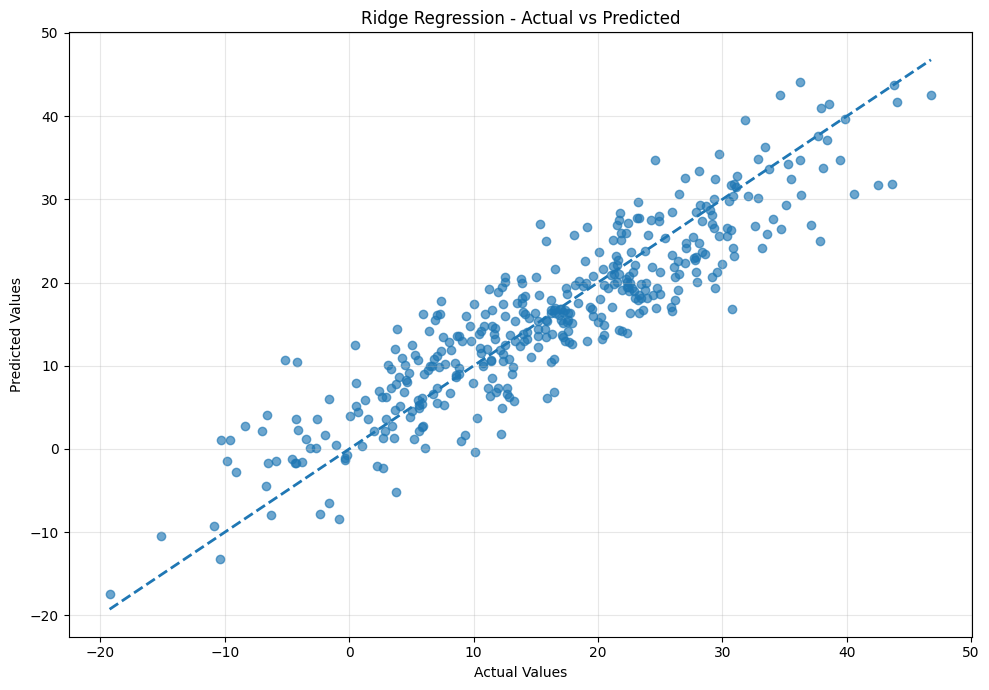

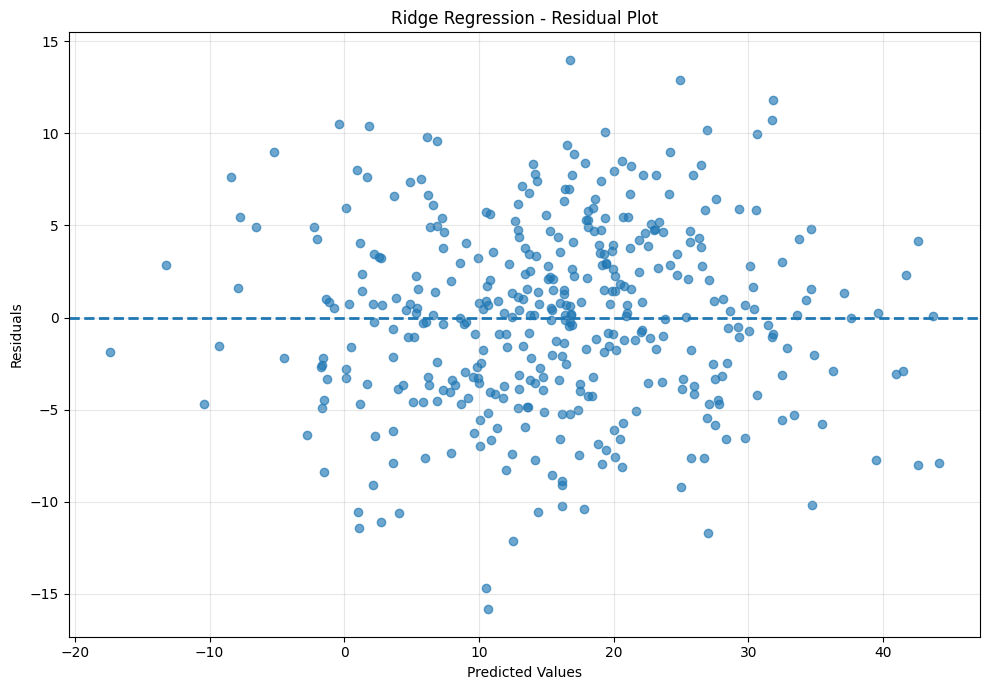

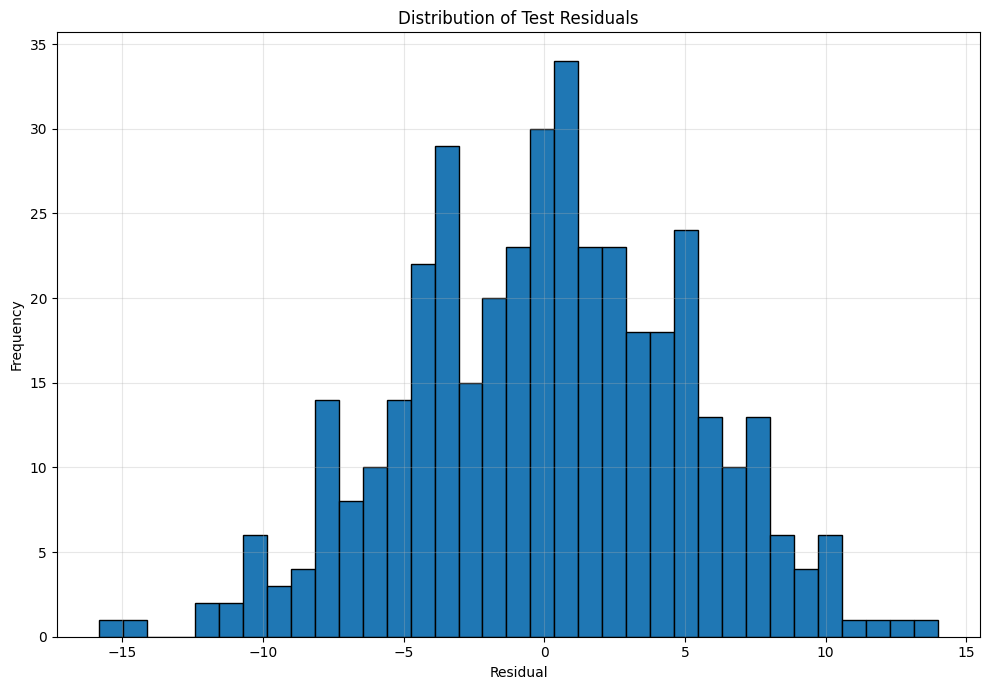

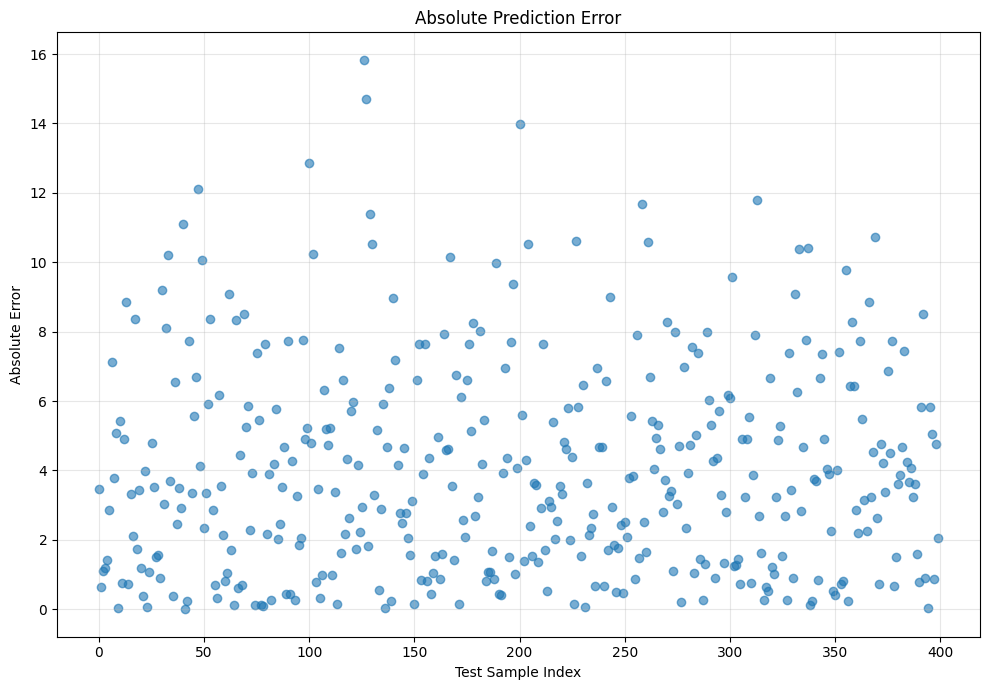

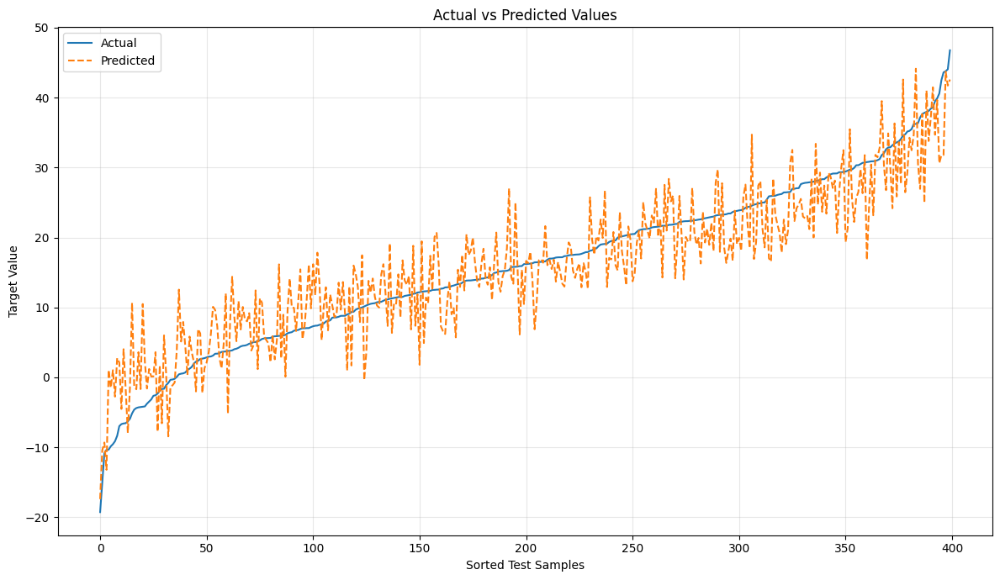


COEFFICIENT COMPARISON
Feature      True   Learned
     X1  5.000000  5.106401
     X2 -3.500000 -3.458542
     X3  2.500000  2.548592
     X4  7.000000  6.990367
     X5 -4.000000 -4.045414
     X6  3.000000  2.983877


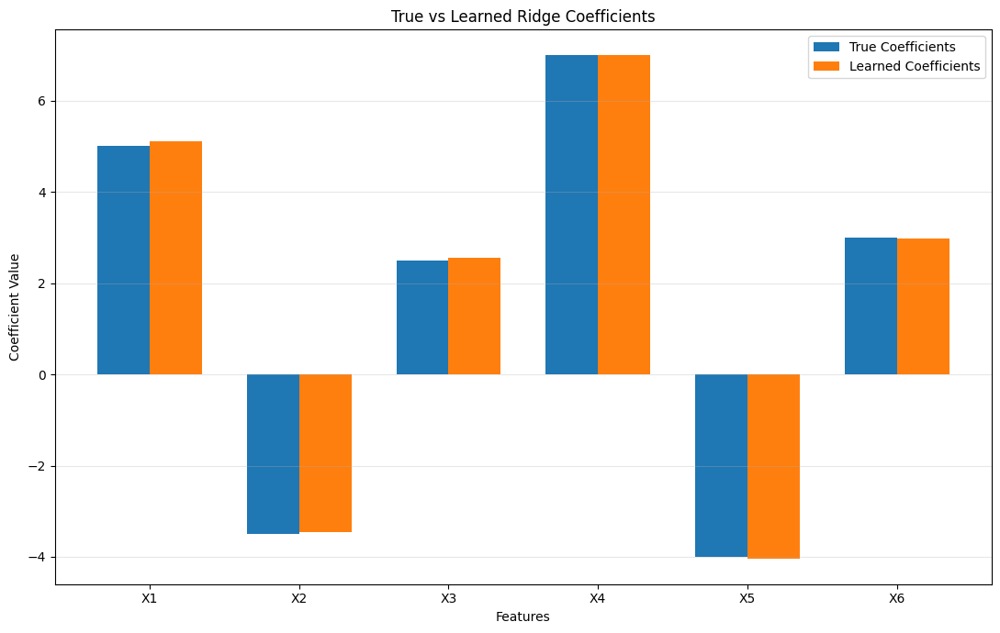


REGULARIZATION ANALYSIS
      Alpha      MAE       MSE     RMSE       R2  Coefficient_Norm
   0.000100 4.016801 25.216548 5.021608 0.817431         10.900270
   0.001000 4.016802 25.216550 5.021608 0.817431         10.900264
   0.010000 4.016804 25.216568 5.021610 0.817431         10.900202
   0.100000 4.016826 25.216754 5.021629 0.817429         10.899584
   1.000000 4.017052 25.218650 5.021817 0.817416         10.893406
  10.000000 4.019904 25.241369 5.024079 0.817251         10.832013
 100.000000 4.064195 25.799999 5.079370 0.813207         10.254349
1000.000000 5.303074 42.981177 6.556003 0.688814          6.694079


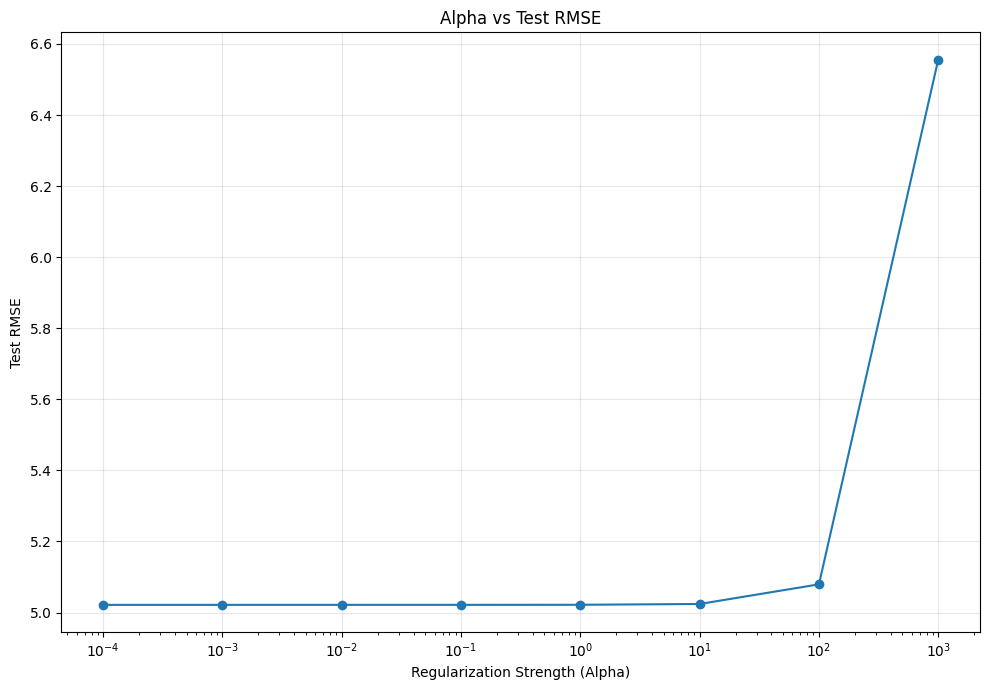

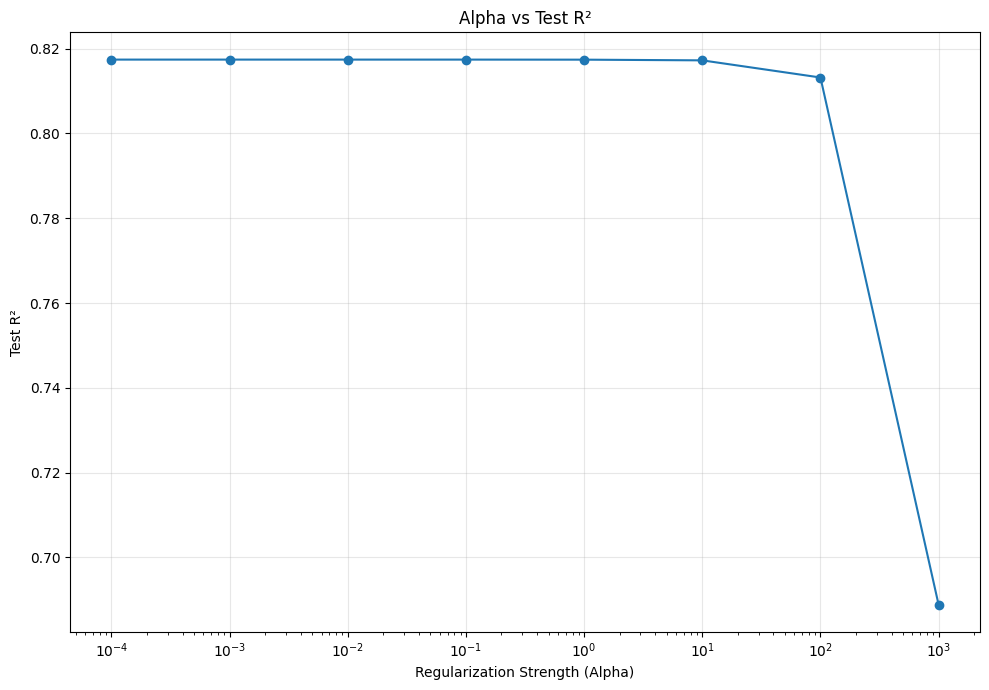

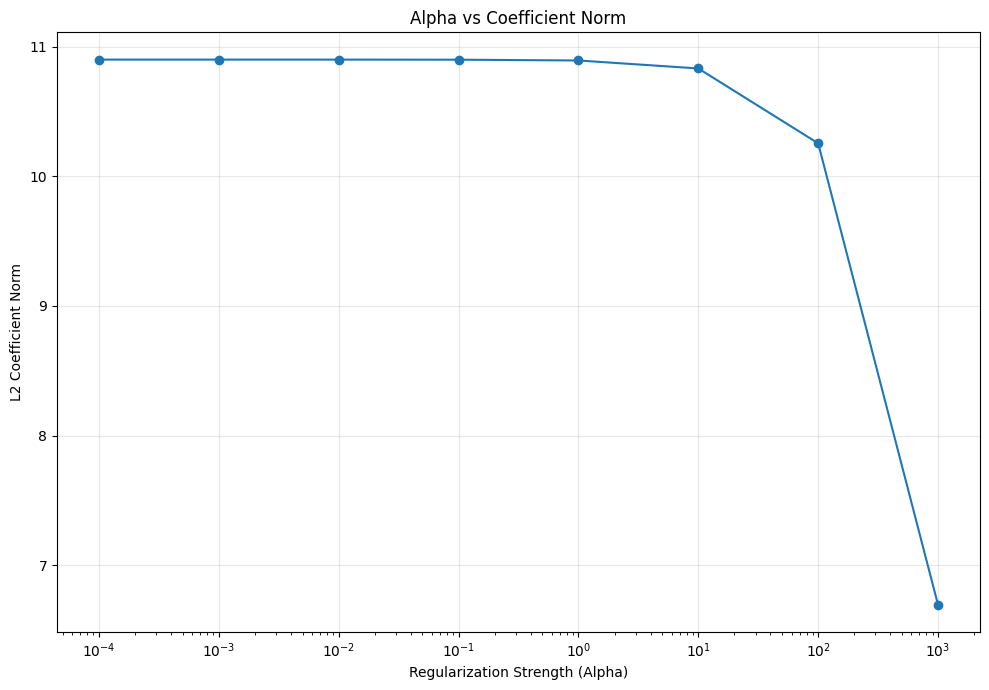

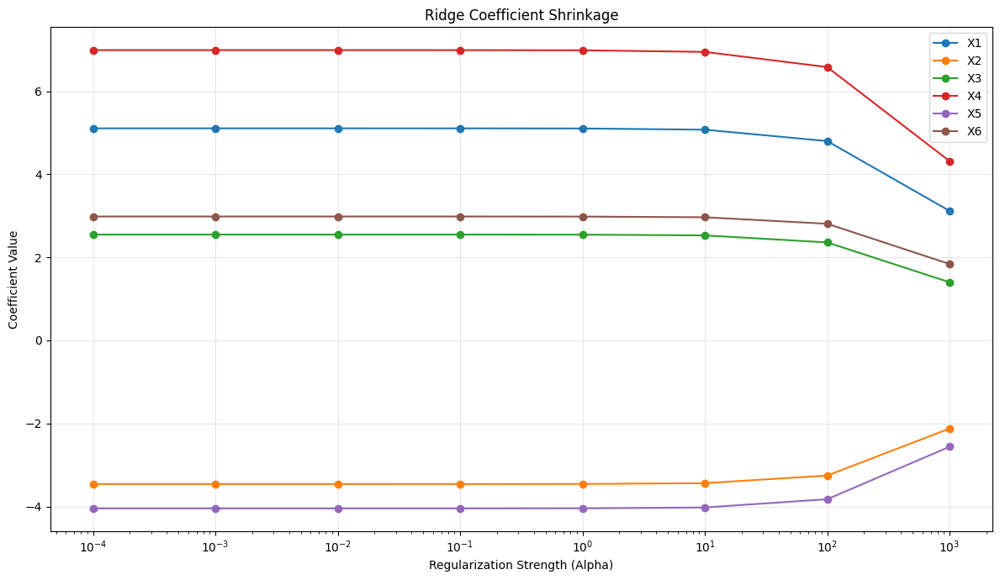


FINAL MODEL SUMMARY
Ridge Alpha        : 1.0
Training MAE       : 3.945266
Training MSE       : 24.824726
Training RMSE      : 4.982442
Training R²        : 0.826723
Testing MAE        : 4.017052
Testing MSE        : 25.218650
Testing RMSE       : 5.021817
Testing R²         : 0.817416
Testing Adjusted R²: 0.814628
Explained Variance : 0.817439


In [2]:
# ============================================================
# RIDGE REGRESSION FROM SCRATCH
# NORMAL EQUATION + MOORE-PENROSE PSEUDO-INVERSE
#
# NO SCIKIT-LEARN
#
# Includes:
#   1. Large synthetic dataset
#   2. Train/Test split
#   3. Standardization from scratch
#   4. Ridge Regression
#   5. Moore-Penrose Pseudo-Inverse
#   6. MAE
#   7. MSE
#   8. RMSE
#   9. R²
#  10. Adjusted R²
#  11. Explained Variance
#  12. Residual analysis
#  13. Actual vs Predicted
#  14. Error distribution
#  15. Alpha / Regularization analysis
#  16. Coefficient shrinkage analysis
# ============================================================


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ============================================================
# 1. REPRODUCIBILITY
# ============================================================

np.random.seed(42)


# ============================================================
# 2. GENERATE LARGE SYNTHETIC REGRESSION DATASET
# ============================================================

n_samples = 2000
n_features = 6

X = np.random.randn(
    n_samples,
    n_features
)

# True coefficients
true_coefficients = np.array([
    5.0,
    -3.5,
    2.5,
    7.0,
    -4.0,
    3.0
])

# True intercept
true_intercept = 15.0

# Random noise
noise = np.random.normal(
    loc=0.0,
    scale=5.0,
    size=n_samples
)

# Generate target
y = (
    true_intercept
    + X @ true_coefficients
    + noise
)


print("=" * 75)
print("DATASET INFORMATION")
print("=" * 75)

print("Number of samples :", n_samples)
print("Number of features:", n_features)
print("X shape           :", X.shape)
print("y shape           :", y.shape)


# ============================================================
# 3. TRAIN / TEST SPLIT FROM SCRATCH
# ============================================================

test_size = 0.20

indices = np.random.permutation(
    n_samples
)

test_count = int(
    n_samples * test_size
)

test_indices = indices[
    :test_count
]

train_indices = indices[
    test_count:
]

X_train = X[
    train_indices
]

X_test = X[
    test_indices
]

y_train = y[
    train_indices
]

y_test = y[
    test_indices
]


print("\n" + "=" * 75)
print("TRAIN / TEST SPLIT")
print("=" * 75)

print("Training samples:", len(X_train))
print("Testing samples :", len(X_test))


# ============================================================
# 4. STANDARDIZATION FROM SCRATCH
# ============================================================

# Calculate mean ONLY from training data
X_mean = np.mean(
    X_train,
    axis=0
)

# Calculate standard deviation ONLY from training data
X_std = np.std(
    X_train,
    axis=0
)

# Prevent division by zero
X_std[X_std == 0] = 1.0

# Standardize training data
X_train_scaled = (
    X_train - X_mean
) / X_std

# Standardize test data using TRAINING statistics
X_test_scaled = (
    X_test - X_mean
) / X_std


# ============================================================
# 5. RIDGE REGRESSION CLASS
#    NORMAL EQUATION + PSEUDO-INVERSE
# ============================================================

class RidgeRegressionPseudoInverse:

    def __init__(
        self,
        alpha=1.0
    ):

        self.alpha = alpha

        self.coef_ = None

        self.intercept_ = None

        self.weights_ = None

    # ========================================================
    # FIT
    # ========================================================

    def fit(
        self,
        X,
        y
    ):

        n_samples, n_features = X.shape

        # ----------------------------------------------------
        # Add intercept column
        # ----------------------------------------------------

        X_b = np.c_[
            np.ones(
                (n_samples, 1)
            ),
            X
        ]

        # ----------------------------------------------------
        # Create identity matrix
        # ----------------------------------------------------

        I = np.eye(
            n_features + 1
        )

        # ----------------------------------------------------
        # Do NOT regularize intercept
        # ----------------------------------------------------

        I[0, 0] = 0.0

        # ----------------------------------------------------
        # Ridge Normal Equation
        #
        # theta =
        #
        # (XᵀX + alpha I)^+ Xᵀy
        #
        # ----------------------------------------------------

        A = (
            X_b.T @ X_b
            + self.alpha * I
        )

        b = (
            X_b.T @ y
        )

        # ----------------------------------------------------
        # Moore-Penrose Pseudo-Inverse
        #
        # np.linalg.pinv()
        # ----------------------------------------------------

        A_pseudo_inverse = np.linalg.pinv(
            A
        )

        # ----------------------------------------------------
        # Calculate parameters
        # ----------------------------------------------------

        self.weights_ = (
            A_pseudo_inverse @ b
        )

        # First parameter = intercept
        self.intercept_ = (
            self.weights_[0]
        )

        # Remaining parameters = coefficients
        self.coef_ = (
            self.weights_[1:]
        )

        return self

    # ========================================================
    # PREDICT
    # ========================================================

    def predict(
        self,
        X
    ):

        return (
            self.intercept_
            + X @ self.coef_
        )


# ============================================================
# 6. CREATE RIDGE MODEL
# ============================================================

alpha = 1.0

model = RidgeRegressionPseudoInverse(
    alpha=alpha
)


# ============================================================
# 7. TRAIN MODEL
# ============================================================

model.fit(
    X_train_scaled,
    y_train
)


# ============================================================
# 8. MAKE PREDICTIONS
# ============================================================

y_train_pred = model.predict(
    X_train_scaled
)

y_test_pred = model.predict(
    X_test_scaled
)


# ============================================================
# 9. METRICS FROM SCRATCH
# ============================================================

def mean_absolute_error(
    y_true,
    y_pred
):

    return np.mean(
        np.abs(
            y_true - y_pred
        )
    )


def mean_squared_error(
    y_true,
    y_pred
):

    return np.mean(
        (
            y_true - y_pred
        ) ** 2
    )


def root_mean_squared_error(
    y_true,
    y_pred
):

    return np.sqrt(
        mean_squared_error(
            y_true,
            y_pred
        )
    )


def r2_score(
    y_true,
    y_pred
):

    ss_res = np.sum(
        (
            y_true - y_pred
        ) ** 2
    )

    ss_tot = np.sum(
        (
            y_true - np.mean(y_true)
        ) ** 2
    )

    return (
        1
        - ss_res / ss_tot
    )


def adjusted_r2_score(
    y_true,
    y_pred,
    n_features
):

    n = len(y_true)

    r2 = r2_score(
        y_true,
        y_pred
    )

    return (
        1
        - (
            (1 - r2)
            * (n - 1)
            / (n - n_features - 1)
        )
    )


def explained_variance_score(
    y_true,
    y_pred
):

    residuals = (
        y_true - y_pred
    )

    numerator = np.var(
        residuals
    )

    denominator = np.var(
        y_true
    )

    return (
        1
        - numerator / denominator
    )


# ============================================================
# 10. TRAINING METRICS
# ============================================================

train_mae = mean_absolute_error(
    y_train,
    y_train_pred
)

train_mse = mean_squared_error(
    y_train,
    y_train_pred
)

train_rmse = root_mean_squared_error(
    y_train,
    y_train_pred
)

train_r2 = r2_score(
    y_train,
    y_train_pred
)

train_adjusted_r2 = adjusted_r2_score(
    y_train,
    y_train_pred,
    n_features
)

train_explained_variance = explained_variance_score(
    y_train,
    y_train_pred
)


# ============================================================
# 11. TESTING METRICS
# ============================================================

test_mae = mean_absolute_error(
    y_test,
    y_test_pred
)

test_mse = mean_squared_error(
    y_test,
    y_test_pred
)

test_rmse = root_mean_squared_error(
    y_test,
    y_test_pred
)

test_r2 = r2_score(
    y_test,
    y_test_pred
)

test_adjusted_r2 = adjusted_r2_score(
    y_test,
    y_test_pred,
    n_features
)

test_explained_variance = explained_variance_score(
    y_test,
    y_test_pred
)


# ============================================================
# 12. MODEL PARAMETERS
# ============================================================

print("\n" + "=" * 75)
print("MODEL PARAMETERS")
print("=" * 75)

print(
    f"Alpha       : {model.alpha:.6f}"
)

print(
    f"Intercept   : {model.intercept_:.6f}"
)

for i, coefficient in enumerate(
    model.coef_
):

    print(
        f"Coefficient X{i+1}: "
        f"{coefficient:.6f}"
    )


# ============================================================
# 13. EVALUATION TABLE
# ============================================================

results = pd.DataFrame({

    "Metric": [

        "MAE",

        "MSE",

        "RMSE",

        "R²",

        "Adjusted R²",

        "Explained Variance"
    ],

    "Training": [

        train_mae,

        train_mse,

        train_rmse,

        train_r2,

        train_adjusted_r2,

        train_explained_variance
    ],

    "Testing": [

        test_mae,

        test_mse,

        test_rmse,

        test_r2,

        test_adjusted_r2,

        test_explained_variance
    ]
})


print("\n" + "=" * 75)
print("MODEL EVALUATION")
print("=" * 75)

print(
    results.to_string(
        index=False,
        float_format=lambda x: f"{x:.6f}"
    )
)


# ============================================================
# 14. ACTUAL VS PREDICTED
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.65
)

minimum = min(
    y_test.min(),
    y_test_pred.min()
)

maximum = max(
    y_test.max(),
    y_test_pred.max()
)

plt.plot(
    [minimum, maximum],
    [minimum, maximum],
    linestyle="--",
    linewidth=2
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Predicted Values"
)

plt.title(
    "Ridge Regression - Actual vs Predicted"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 15. RESIDUAL PLOT
# ============================================================

residuals = (
    y_test - y_test_pred
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test_pred,
    residuals,
    alpha=0.65
)

plt.axhline(
    0,
    linestyle="--",
    linewidth=2
)

plt.xlabel(
    "Predicted Values"
)

plt.ylabel(
    "Residuals"
)

plt.title(
    "Ridge Regression - Residual Plot"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 16. RESIDUAL DISTRIBUTION
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.hist(
    residuals,
    bins=35,
    edgecolor="black"
)

plt.xlabel(
    "Residual"
)

plt.ylabel(
    "Frequency"
)

plt.title(
    "Distribution of Test Residuals"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 17. ABSOLUTE ERROR PLOT
# ============================================================

absolute_errors = np.abs(
    residuals
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    np.arange(
        len(absolute_errors)
    ),
    absolute_errors,
    alpha=0.6
)

plt.xlabel(
    "Test Sample Index"
)

plt.ylabel(
    "Absolute Error"
)

plt.title(
    "Absolute Prediction Error"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 18. ACTUAL VS PREDICTED - SORTED LINE
# ============================================================

sort_indices = np.argsort(
    y_test
)

actual_sorted = (
    y_test[
        sort_indices
    ]
)

predicted_sorted = (
    y_test_pred[
        sort_indices
    ]
)

plt.figure(
    figsize=(12, 7)
)

plt.plot(
    actual_sorted,
    label="Actual"
)

plt.plot(
    predicted_sorted,
    linestyle="--",
    label="Predicted"
)

plt.xlabel(
    "Sorted Test Samples"
)

plt.ylabel(
    "Target Value"
)

plt.title(
    "Actual vs Predicted Values"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 19. TRUE COEFFICIENTS VS LEARNED COEFFICIENTS
# ============================================================

coefficient_comparison = pd.DataFrame({

    "Feature": [
        f"X{i+1}"
        for i in range(n_features)
    ],

    "True": true_coefficients,

    "Learned": model.coef_
})


print("\n" + "=" * 75)
print("COEFFICIENT COMPARISON")
print("=" * 75)

print(
    coefficient_comparison.to_string(
        index=False,
        float_format=lambda x: f"{x:.6f}"
    )
)


plt.figure(
    figsize=(11, 7)
)

x_positions = np.arange(
    n_features
)

width = 0.35

plt.bar(
    x_positions - width / 2,
    true_coefficients,
    width,
    label="True Coefficients"
)

plt.bar(
    x_positions + width / 2,
    model.coef_,
    width,
    label="Learned Coefficients"
)

plt.xticks(
    x_positions,
    [
        f"X{i+1}"
        for i in range(n_features)
    ]
)

plt.xlabel(
    "Features"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "True vs Learned Ridge Coefficients"
)

plt.legend()

plt.grid(
    True,
    axis="y",
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 20. REGULARIZATION STRENGTH ANALYSIS
# ============================================================

alphas = np.array([
    0.0001,
    0.001,
    0.01,
    0.1,
    1.0,
    10.0,
    100.0,
    1000.0
])

alpha_results = []

coefficient_history = []


for current_alpha in alphas:

    temp_model = RidgeRegressionPseudoInverse(
        alpha=current_alpha
    )

    temp_model.fit(
        X_train_scaled,
        y_train
    )

    temp_prediction = temp_model.predict(
        X_test_scaled
    )

    temp_mae = mean_absolute_error(
        y_test,
        temp_prediction
    )

    temp_mse = mean_squared_error(
        y_test,
        temp_prediction
    )

    temp_rmse = root_mean_squared_error(
        y_test,
        temp_prediction
    )

    temp_r2 = r2_score(
        y_test,
        temp_prediction
    )

    coefficient_norm = np.linalg.norm(
        temp_model.coef_
    )

    alpha_results.append({

        "Alpha": current_alpha,

        "MAE": temp_mae,

        "MSE": temp_mse,

        "RMSE": temp_rmse,

        "R2": temp_r2,

        "Coefficient_Norm": coefficient_norm
    })

    coefficient_history.append(
        temp_model.coef_
    )


alpha_results = pd.DataFrame(
    alpha_results
)

coefficient_history = np.array(
    coefficient_history
)


print("\n" + "=" * 75)
print("REGULARIZATION ANALYSIS")
print("=" * 75)

print(
    alpha_results.to_string(
        index=False,
        float_format=lambda x: f"{x:.6f}"
    )
)


# ============================================================
# 21. ALPHA VS TEST RMSE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    alpha_results["Alpha"],
    alpha_results["RMSE"],
    marker="o"
)

plt.xscale(
    "log"
)

plt.xlabel(
    "Regularization Strength (Alpha)"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "Alpha vs Test RMSE"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 22. ALPHA VS TEST R²
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    alpha_results["Alpha"],
    alpha_results["R2"],
    marker="o"
)

plt.xscale(
    "log"
)

plt.xlabel(
    "Regularization Strength (Alpha)"
)

plt.ylabel(
    "Test R²"
)

plt.title(
    "Alpha vs Test R²"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 23. ALPHA VS COEFFICIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    alpha_results["Alpha"],
    alpha_results["Coefficient_Norm"],
    marker="o"
)

plt.xscale(
    "log"
)

plt.xlabel(
    "Regularization Strength (Alpha)"
)

plt.ylabel(
    "L2 Coefficient Norm"
)

plt.title(
    "Alpha vs Coefficient Norm"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 24. COEFFICIENT SHRINKAGE
# ============================================================

plt.figure(
    figsize=(12, 7)
)

for feature_index in range(
    n_features
):

    plt.plot(
        alphas,
        coefficient_history[
            :,
            feature_index
        ],
        marker="o",
        label=f"X{feature_index + 1}"
    )


plt.xscale(
    "log"
)

plt.xlabel(
    "Regularization Strength (Alpha)"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "Ridge Coefficient Shrinkage"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 25. FINAL SUMMARY
# ============================================================

print("\n" + "=" * 75)
print("FINAL MODEL SUMMARY")
print("=" * 75)

print(
    f"Ridge Alpha        : {alpha}"
)

print(
    f"Training MAE       : {train_mae:.6f}"
)

print(
    f"Training MSE       : {train_mse:.6f}"
)

print(
    f"Training RMSE      : {train_rmse:.6f}"
)

print(
    f"Training R²        : {train_r2:.6f}"
)

print(
    f"Testing MAE        : {test_mae:.6f}"
)

print(
    f"Testing MSE        : {test_mse:.6f}"
)

print(
    f"Testing RMSE       : {test_rmse:.6f}"
)

print(
    f"Testing R²         : {test_r2:.6f}"
)

print(
    f"Testing Adjusted R²: {test_adjusted_r2:.6f}"
)

print(
    f"Explained Variance : "
    f"{test_explained_variance:.6f}"
)

print("=" * 75)

DATASET INFORMATION
Number of samples : 2000
Number of features: 6
X shape           : (2000, 6)
y shape           : (2000,)

TRAIN / TEST SPLIT
Training samples: 1600
Testing samples : 400

MODEL PARAMETERS
Alpha     : 1.000000
Intercept : 14.955835
Coefficient X1: 5.106401
Coefficient X2: -3.458542
Coefficient X3: 2.548592
Coefficient X4: 6.990367
Coefficient X5: -4.045414
Coefficient X6: 2.983877

MODEL EVALUATION
            Metric  Training   Testing
               MAE  3.945266  4.017052
               MSE 24.824726 25.218650
              RMSE  4.982442  5.021817
                R²  0.826723  0.817416
       Adjusted R²  0.826070  0.814628
Explained Variance  0.826723  0.817439


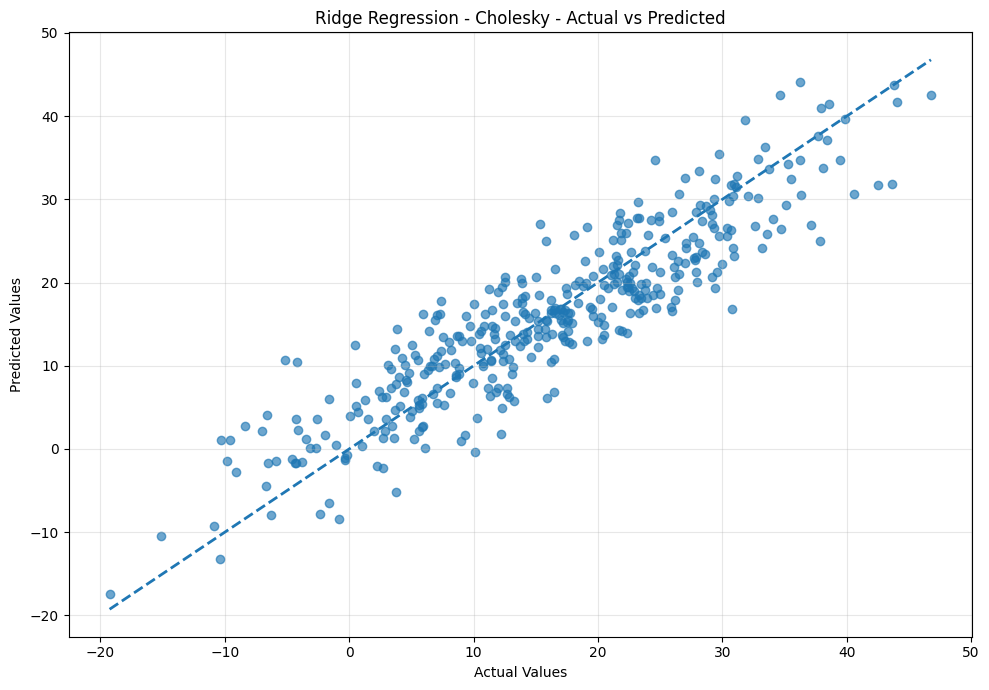

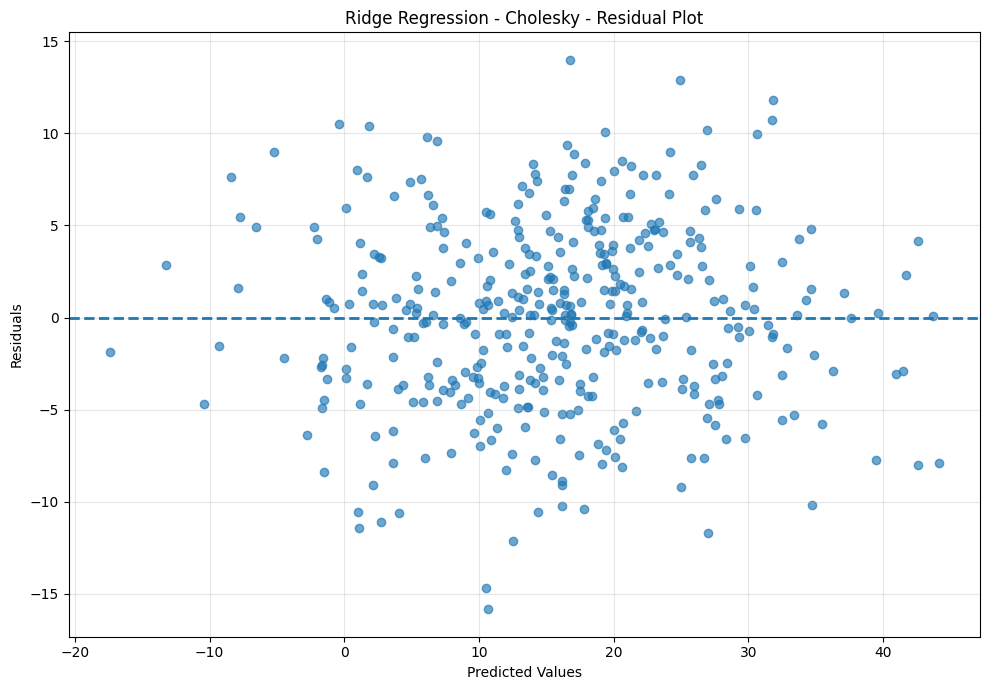

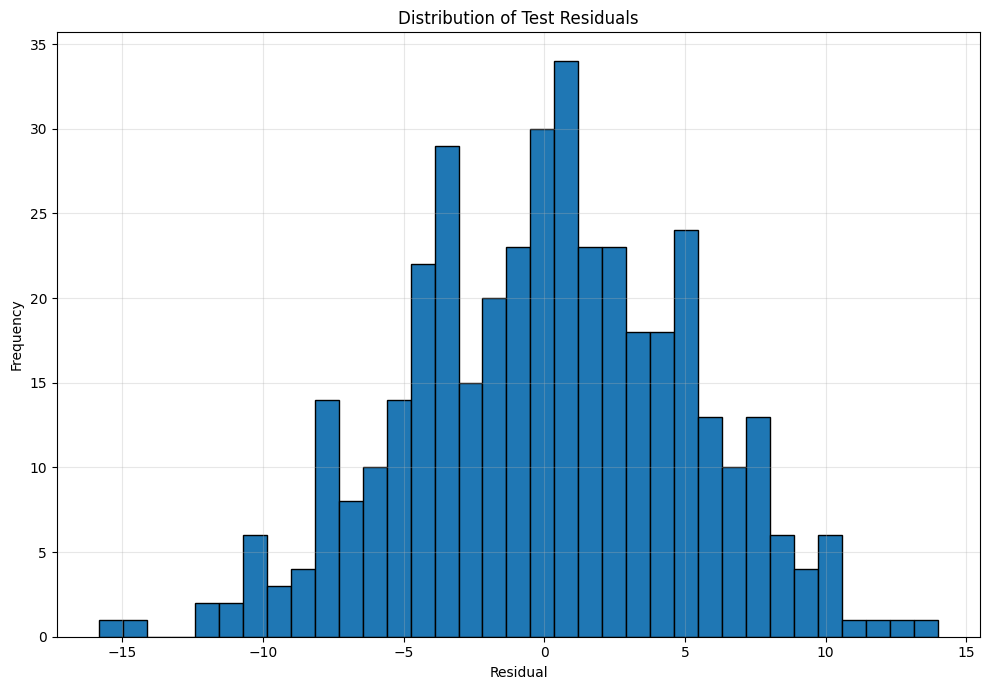

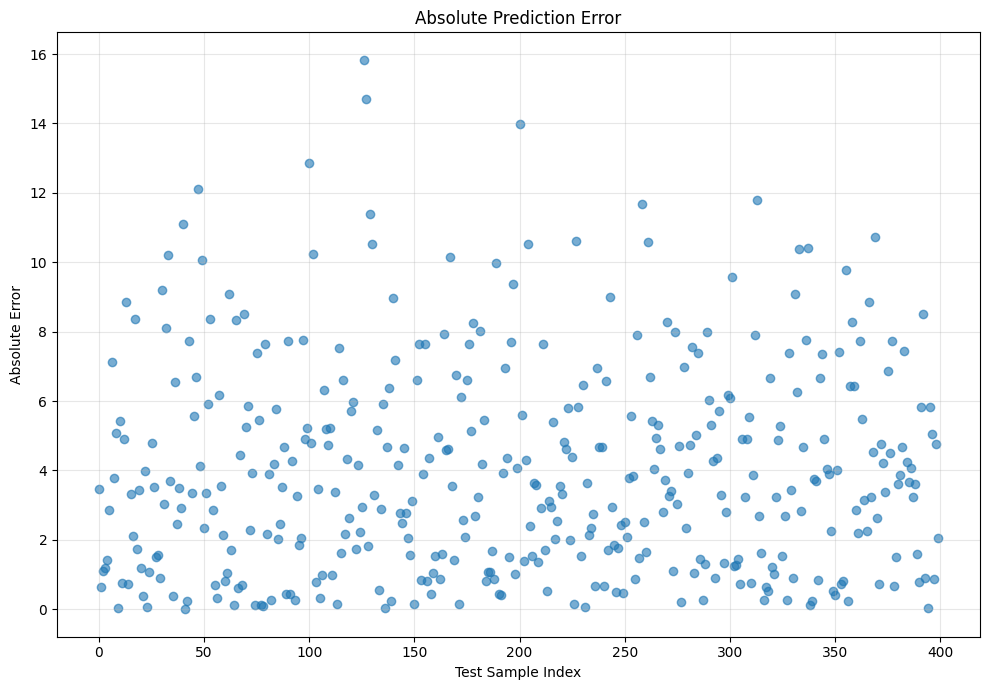

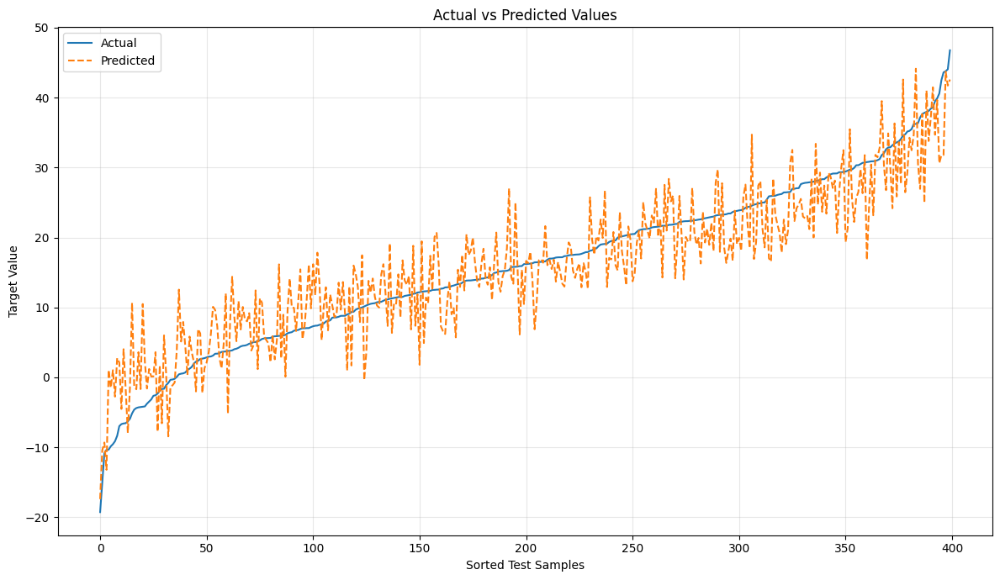


COEFFICIENT COMPARISON
Feature      True   Learned
     X1  5.000000  5.106401
     X2 -3.500000 -3.458542
     X3  2.500000  2.548592
     X4  7.000000  6.990367
     X5 -4.000000 -4.045414
     X6  3.000000  2.983877


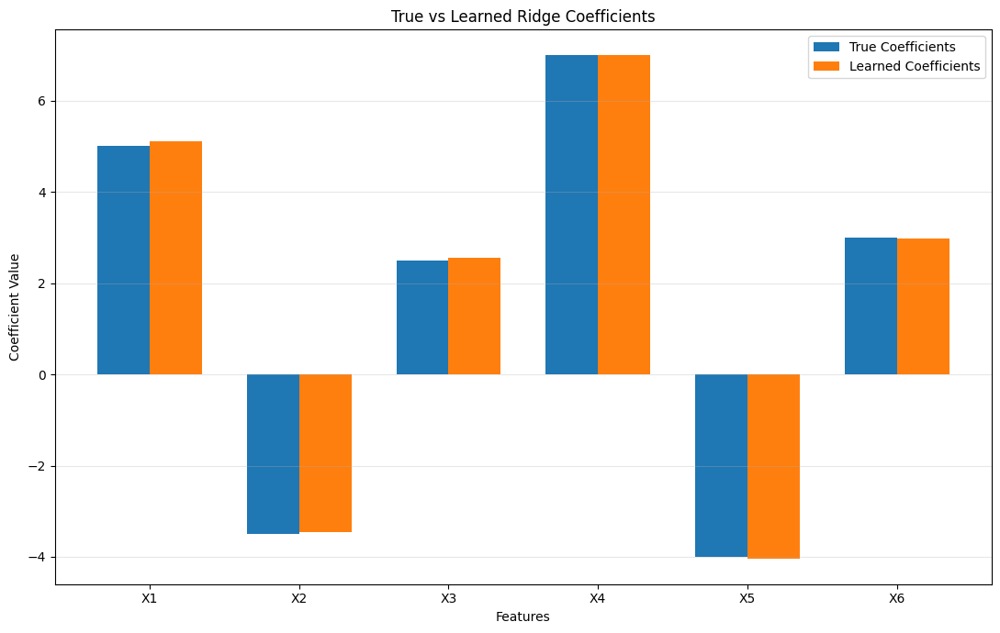


REGULARIZATION ANALYSIS
      Alpha      MAE       MSE     RMSE       R2  Coefficient_Norm
   0.000100 4.016801 25.216548 5.021608 0.817431         10.900270
   0.001000 4.016802 25.216550 5.021608 0.817431         10.900264
   0.010000 4.016804 25.216568 5.021610 0.817431         10.900202
   0.100000 4.016826 25.216754 5.021629 0.817429         10.899584
   1.000000 4.017052 25.218650 5.021817 0.817416         10.893406
  10.000000 4.019904 25.241369 5.024079 0.817251         10.832013
 100.000000 4.064195 25.799999 5.079370 0.813207         10.254349
1000.000000 5.303074 42.981177 6.556003 0.688814          6.694079


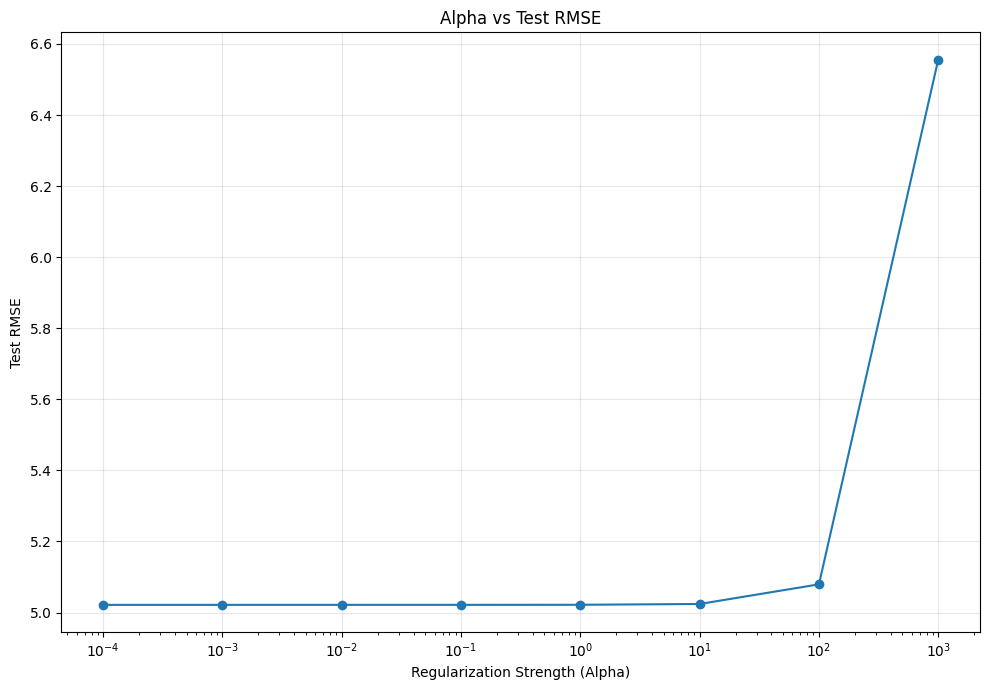

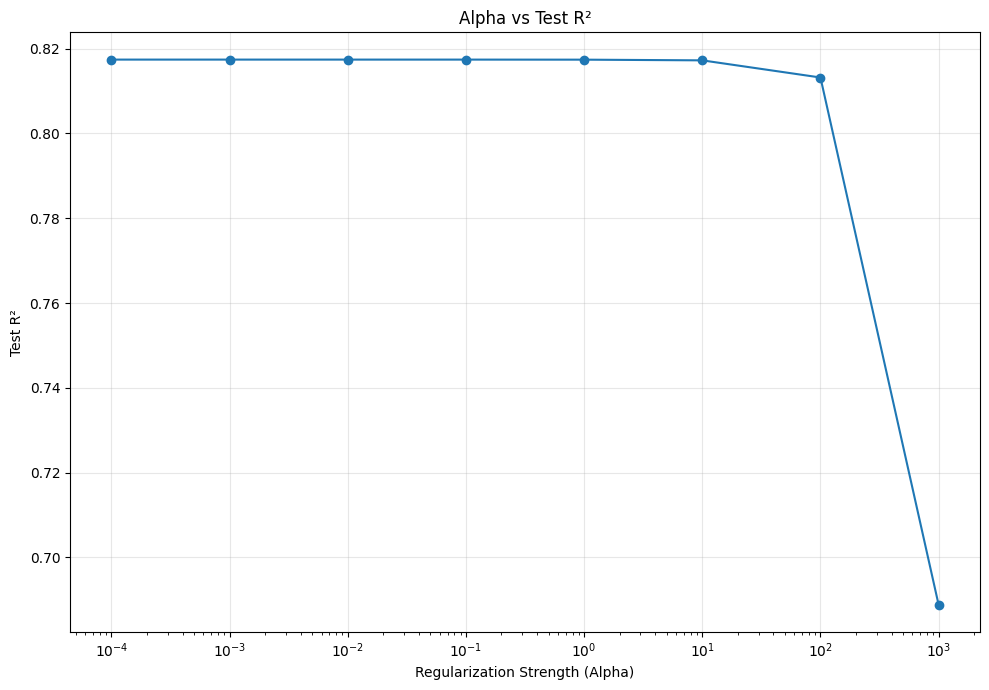

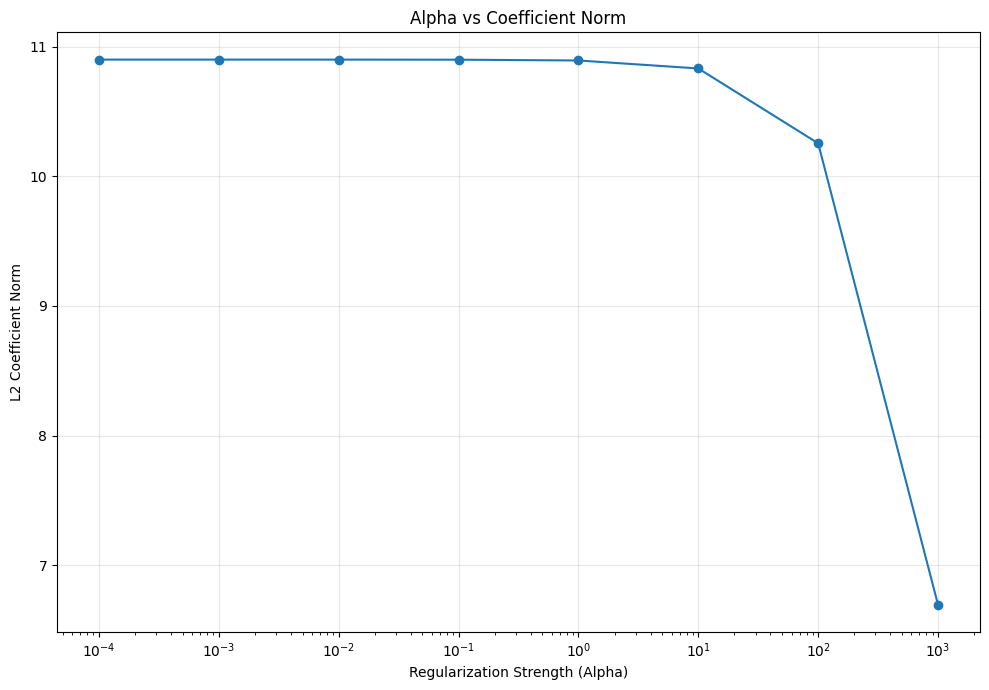

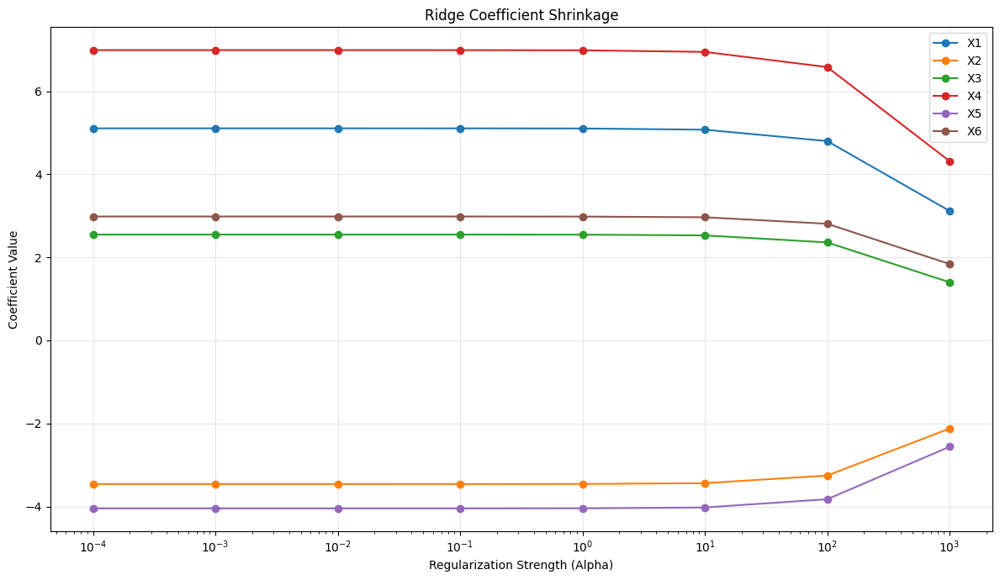


CHOLESKY VERIFICATION
A shape              : (7, 7)
L shape              : (7, 7)
Reconstruction error : 4.548934778613e-13
Status               : Cholesky decomposition verified

FINAL MODEL SUMMARY
Method             : Ridge + Cholesky Decomposition
Alpha              : 1.000000
Training MAE       : 3.945266
Training MSE       : 24.824726
Training RMSE      : 4.982442
Training R²        : 0.826723
Testing MAE        : 4.017052
Testing MSE        : 25.218650
Testing RMSE       : 5.021817
Testing R²         : 0.817416
Testing Adjusted R²: 0.814628
Explained Variance : 0.817439


In [3]:
# ============================================================
# RIDGE REGRESSION FROM SCRATCH
# CHOLESKY DECOMPOSITION
#
# NO SCIKIT-LEARN
#
# Includes:
#   1. Large synthetic dataset
#   2. Train/Test split
#   3. Standardization from scratch
#   4. Ridge Regression
#   5. Manual Cholesky Decomposition
#   6. Forward Substitution
#   7. Backward Substitution
#   8. MAE
#   9. MSE
#  10. RMSE
#  11. R²
#  12. Adjusted R²
#  13. Explained Variance
#  14. Actual vs Predicted plot
#  15. Residual plot
#  16. Residual distribution
#  17. Absolute error plot
#  18. Coefficient comparison
#  19. Alpha vs RMSE
#  20. Alpha vs R²
#  21. Coefficient shrinkage
# ============================================================


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ============================================================
# 1. REPRODUCIBILITY
# ============================================================

np.random.seed(42)


# ============================================================
# 2. GENERATE LARGE SYNTHETIC DATASET
# ============================================================

n_samples = 2000
n_features = 6

X = np.random.randn(
    n_samples,
    n_features
)

# True coefficients
true_coefficients = np.array([
    5.0,
    -3.5,
    2.5,
    7.0,
    -4.0,
    3.0
])

# True intercept
true_intercept = 15.0

# Random noise
noise = np.random.normal(
    loc=0.0,
    scale=5.0,
    size=n_samples
)

# Target
y = (
    true_intercept
    + X @ true_coefficients
    + noise
)


print("=" * 75)
print("DATASET INFORMATION")
print("=" * 75)

print("Number of samples :", n_samples)
print("Number of features:", n_features)
print("X shape           :", X.shape)
print("y shape           :", y.shape)


# ============================================================
# 3. TRAIN / TEST SPLIT FROM SCRATCH
# ============================================================

test_size = 0.20

indices = np.random.permutation(
    n_samples
)

test_count = int(
    n_samples * test_size
)

test_indices = indices[
    :test_count
]

train_indices = indices[
    test_count:
]

X_train = X[
    train_indices
]

X_test = X[
    test_indices
]

y_train = y[
    train_indices
]

y_test = y[
    test_indices
]


print("\n" + "=" * 75)
print("TRAIN / TEST SPLIT")
print("=" * 75)

print(
    "Training samples:",
    len(X_train)
)

print(
    "Testing samples :",
    len(X_test)
)


# ============================================================
# 4. STANDARDIZATION FROM SCRATCH
# ============================================================

# Calculate training mean
X_mean = np.mean(
    X_train,
    axis=0
)

# Calculate training standard deviation
X_std = np.std(
    X_train,
    axis=0
)

# Prevent division by zero
X_std[X_std == 0] = 1.0

# Standardize training data
X_train_scaled = (
    X_train - X_mean
) / X_std

# Standardize test data using
# training statistics
X_test_scaled = (
    X_test - X_mean
) / X_std


# ============================================================
# 5. CHOLESKY DECOMPOSITION FROM SCRATCH
# ============================================================

def cholesky_decomposition(A):

    """
    Computes the Cholesky decomposition:

        A = L @ L.T

    where L is a lower triangular matrix.

    This implementation is written
    from scratch using NumPy arrays.
    """

    n = A.shape[0]

    L = np.zeros_like(
        A,
        dtype=float
    )

    for i in range(n):

        for j in range(i + 1):

            # ------------------------------------------------
            # Sum of previously calculated elements
            # ------------------------------------------------

            s = 0.0

            for k in range(j):

                s += (
                    L[i, k]
                    * L[j, k]
                )

            # ------------------------------------------------
            # Diagonal element
            # ------------------------------------------------

            if i == j:

                value = (
                    A[i, i] - s
                )

                if value <= 0:

                    raise np.linalg.LinAlgError(
                        "Matrix is not positive definite."
                    )

                L[i, j] = np.sqrt(
                    value
                )

            # ------------------------------------------------
            # Lower triangular element
            # ------------------------------------------------

            else:

                L[i, j] = (
                    A[i, j] - s
                ) / L[j, j]

    return L


# ============================================================
# 6. FORWARD SUBSTITUTION FROM SCRATCH
# ============================================================

def forward_substitution(
    L,
    b
):

    """
    Solves:

        Lz = b

    where L is lower triangular.
    """

    n = L.shape[0]

    z = np.zeros(
        n,
        dtype=float
    )

    for i in range(n):

        s = 0.0

        for j in range(i):

            s += (
                L[i, j]
                * z[j]
            )

        z[i] = (
            b[i] - s
        ) / L[i, i]

    return z


# ============================================================
# 7. BACKWARD SUBSTITUTION FROM SCRATCH
# ============================================================

def backward_substitution(
    U,
    b
):

    """
    Solves:

        Ux = b

    where U is upper triangular.
    """

    n = U.shape[0]

    x = np.zeros(
        n,
        dtype=float
    )

    for i in range(
        n - 1,
        -1,
        -1
    ):

        s = 0.0

        for j in range(
            i + 1,
            n
        ):

            s += (
                U[i, j]
                * x[j]
            )

        x[i] = (
            b[i] - s
        ) / U[i, i]

    return x


# ============================================================
# 8. RIDGE REGRESSION CLASS
#    CHOLESKY DECOMPOSITION
# ============================================================

class RidgeRegressionCholesky:

    def __init__(
        self,
        alpha=1.0
    ):

        self.alpha = alpha

        self.coef_ = None

        self.intercept_ = None

        self.weights_ = None

        self.L_ = None

    # ========================================================
    # FIT
    # ========================================================

    def fit(
        self,
        X,
        y
    ):

        n_samples, n_features = X.shape

        # ----------------------------------------------------
        # Add intercept column
        # ----------------------------------------------------

        X_b = np.c_[
            np.ones(
                (n_samples, 1)
            ),
            X
        ]

        # ----------------------------------------------------
        # Identity matrix
        # ----------------------------------------------------

        I = np.eye(
            n_features + 1
        )

        # ----------------------------------------------------
        # Do NOT regularize intercept
        # ----------------------------------------------------

        I[0, 0] = 0.0

        # ----------------------------------------------------
        # Ridge matrix
        #
        # A = XᵀX + alpha I
        # ----------------------------------------------------

        A = (
            X_b.T @ X_b
            + self.alpha * I
        )

        # ----------------------------------------------------
        # Right-hand side
        #
        # b = Xᵀy
        # ----------------------------------------------------

        b = (
            X_b.T @ y
        )

        # ----------------------------------------------------
        # Cholesky decomposition
        #
        # A = L Lᵀ
        # ----------------------------------------------------

        self.L_ = cholesky_decomposition(
            A
        )

        # ----------------------------------------------------
        # Forward substitution
        #
        # Lz = b
        # ----------------------------------------------------

        z = forward_substitution(
            self.L_,
            b
        )

        # ----------------------------------------------------
        # Backward substitution
        #
        # Lᵀ theta = z
        # ----------------------------------------------------

        self.weights_ = backward_substitution(
            self.L_.T,
            z
        )

        # ----------------------------------------------------
        # Separate intercept
        # ----------------------------------------------------

        self.intercept_ = (
            self.weights_[0]
        )

        # ----------------------------------------------------
        # Separate coefficients
        # ----------------------------------------------------

        self.coef_ = (
            self.weights_[1:]
        )

        return self

    # ========================================================
    # PREDICT
    # ========================================================

    def predict(
        self,
        X
    ):

        return (
            self.intercept_
            + X @ self.coef_
        )


# ============================================================
# 9. CREATE MODEL
# ============================================================

alpha = 1.0

model = RidgeRegressionCholesky(
    alpha=alpha
)


# ============================================================
# 10. TRAIN MODEL
# ============================================================

model.fit(
    X_train_scaled,
    y_train
)


# ============================================================
# 11. PREDICTIONS
# ============================================================

y_train_pred = model.predict(
    X_train_scaled
)

y_test_pred = model.predict(
    X_test_scaled
)


# ============================================================
# 12. EVALUATION METRICS FROM SCRATCH
# ============================================================

def mean_absolute_error(
    y_true,
    y_pred
):

    return np.mean(
        np.abs(
            y_true - y_pred
        )
    )


def mean_squared_error(
    y_true,
    y_pred
):

    return np.mean(
        (
            y_true - y_pred
        ) ** 2
    )


def root_mean_squared_error(
    y_true,
    y_pred
):

    return np.sqrt(
        mean_squared_error(
            y_true,
            y_pred
        )
    )


def r2_score(
    y_true,
    y_pred
):

    ss_res = np.sum(
        (
            y_true - y_pred
        ) ** 2
    )

    ss_tot = np.sum(
        (
            y_true - np.mean(y_true)
        ) ** 2
    )

    return (
        1
        - ss_res / ss_tot
    )


def adjusted_r2_score(
    y_true,
    y_pred,
    n_features
):

    n = len(y_true)

    r2 = r2_score(
        y_true,
        y_pred
    )

    return (
        1
        - (
            (1 - r2)
            * (n - 1)
            / (n - n_features - 1)
        )
    )


def explained_variance_score(
    y_true,
    y_pred
):

    residuals = (
        y_true - y_pred
    )

    return (
        1
        - np.var(residuals)
        / np.var(y_true)
    )


# ============================================================
# 13. TRAINING METRICS
# ============================================================

train_mae = mean_absolute_error(
    y_train,
    y_train_pred
)

train_mse = mean_squared_error(
    y_train,
    y_train_pred
)

train_rmse = root_mean_squared_error(
    y_train,
    y_train_pred
)

train_r2 = r2_score(
    y_train,
    y_train_pred
)

train_adjusted_r2 = adjusted_r2_score(
    y_train,
    y_train_pred,
    n_features
)

train_explained_variance = explained_variance_score(
    y_train,
    y_train_pred
)


# ============================================================
# 14. TESTING METRICS
# ============================================================

test_mae = mean_absolute_error(
    y_test,
    y_test_pred
)

test_mse = mean_squared_error(
    y_test,
    y_test_pred
)

test_rmse = root_mean_squared_error(
    y_test,
    y_test_pred
)

test_r2 = r2_score(
    y_test,
    y_test_pred
)

test_adjusted_r2 = adjusted_r2_score(
    y_test,
    y_test_pred,
    n_features
)

test_explained_variance = explained_variance_score(
    y_test,
    y_test_pred
)


# ============================================================
# 15. MODEL PARAMETERS
# ============================================================

print("\n" + "=" * 75)
print("MODEL PARAMETERS")
print("=" * 75)

print(
    f"Alpha     : {model.alpha:.6f}"
)

print(
    f"Intercept : {model.intercept_:.6f}"
)

for i, coefficient in enumerate(
    model.coef_
):

    print(
        f"Coefficient X{i+1}: "
        f"{coefficient:.6f}"
    )


# ============================================================
# 16. EVALUATION TABLE
# ============================================================

results = pd.DataFrame({

    "Metric": [

        "MAE",

        "MSE",

        "RMSE",

        "R²",

        "Adjusted R²",

        "Explained Variance"
    ],

    "Training": [

        train_mae,

        train_mse,

        train_rmse,

        train_r2,

        train_adjusted_r2,

        train_explained_variance
    ],

    "Testing": [

        test_mae,

        test_mse,

        test_rmse,

        test_r2,

        test_adjusted_r2,

        test_explained_variance
    ]
})


print("\n" + "=" * 75)
print("MODEL EVALUATION")
print("=" * 75)

print(
    results.to_string(
        index=False,
        float_format=lambda x: f"{x:.6f}"
    )
)


# ============================================================
# 17. ACTUAL VS PREDICTED
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.65
)

minimum = min(
    y_test.min(),
    y_test_pred.min()
)

maximum = max(
    y_test.max(),
    y_test_pred.max()
)

plt.plot(
    [minimum, maximum],
    [minimum, maximum],
    linestyle="--",
    linewidth=2
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Predicted Values"
)

plt.title(
    "Ridge Regression - Cholesky - Actual vs Predicted"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 18. RESIDUAL PLOT
# ============================================================

residuals = (
    y_test - y_test_pred
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test_pred,
    residuals,
    alpha=0.65
)

plt.axhline(
    y=0,
    linestyle="--",
    linewidth=2
)

plt.xlabel(
    "Predicted Values"
)

plt.ylabel(
    "Residuals"
)

plt.title(
    "Ridge Regression - Cholesky - Residual Plot"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 19. RESIDUAL DISTRIBUTION
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.hist(
    residuals,
    bins=35,
    edgecolor="black"
)

plt.xlabel(
    "Residual"
)

plt.ylabel(
    "Frequency"
)

plt.title(
    "Distribution of Test Residuals"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 20. ABSOLUTE ERROR PLOT
# ============================================================

absolute_errors = np.abs(
    residuals
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    np.arange(
        len(absolute_errors)
    ),
    absolute_errors,
    alpha=0.6
)

plt.xlabel(
    "Test Sample Index"
)

plt.ylabel(
    "Absolute Error"
)

plt.title(
    "Absolute Prediction Error"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 21. ACTUAL VS PREDICTED SORTED LINE
# ============================================================

sort_indices = np.argsort(
    y_test
)

actual_sorted = (
    y_test[
        sort_indices
    ]
)

predicted_sorted = (
    y_test_pred[
        sort_indices
    ]
)

plt.figure(
    figsize=(12, 7)
)

plt.plot(
    actual_sorted,
    label="Actual"
)

plt.plot(
    predicted_sorted,
    linestyle="--",
    label="Predicted"
)

plt.xlabel(
    "Sorted Test Samples"
)

plt.ylabel(
    "Target Value"
)

plt.title(
    "Actual vs Predicted Values"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 22. TRUE VS LEARNED COEFFICIENTS
# ============================================================

coefficient_comparison = pd.DataFrame({

    "Feature": [
        f"X{i+1}"
        for i in range(n_features)
    ],

    "True": true_coefficients,

    "Learned": model.coef_
})


print("\n" + "=" * 75)
print("COEFFICIENT COMPARISON")
print("=" * 75)

print(
    coefficient_comparison.to_string(
        index=False,
        float_format=lambda x: f"{x:.6f}"
    )
)


plt.figure(
    figsize=(11, 7)
)

positions = np.arange(
    n_features
)

width = 0.35

plt.bar(
    positions - width / 2,
    true_coefficients,
    width,
    label="True Coefficients"
)

plt.bar(
    positions + width / 2,
    model.coef_,
    width,
    label="Learned Coefficients"
)

plt.xticks(
    positions,
    [
        f"X{i+1}"
        for i in range(n_features)
    ]
)

plt.xlabel(
    "Features"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "True vs Learned Ridge Coefficients"
)

plt.legend()

plt.grid(
    True,
    axis="y",
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 23. REGULARIZATION STRENGTH ANALYSIS
# ============================================================

alphas = np.array([
    0.0001,
    0.001,
    0.01,
    0.1,
    1.0,
    10.0,
    100.0,
    1000.0
])

alpha_results = []

coefficient_history = []


for current_alpha in alphas:

    temp_model = RidgeRegressionCholesky(
        alpha=current_alpha
    )

    temp_model.fit(
        X_train_scaled,
        y_train
    )

    temp_prediction = temp_model.predict(
        X_test_scaled
    )

    temp_mae = mean_absolute_error(
        y_test,
        temp_prediction
    )

    temp_mse = mean_squared_error(
        y_test,
        temp_prediction
    )

    temp_rmse = root_mean_squared_error(
        y_test,
        temp_prediction
    )

    temp_r2 = r2_score(
        y_test,
        temp_prediction
    )

    coefficient_norm = np.linalg.norm(
        temp_model.coef_
    )

    alpha_results.append({

        "Alpha": current_alpha,

        "MAE": temp_mae,

        "MSE": temp_mse,

        "RMSE": temp_rmse,

        "R2": temp_r2,

        "Coefficient_Norm": coefficient_norm
    })

    coefficient_history.append(
        temp_model.coef_
    )


alpha_results = pd.DataFrame(
    alpha_results
)

coefficient_history = np.array(
    coefficient_history
)


print("\n" + "=" * 75)
print("REGULARIZATION ANALYSIS")
print("=" * 75)

print(
    alpha_results.to_string(
        index=False,
        float_format=lambda x: f"{x:.6f}"
    )
)


# ============================================================
# 24. ALPHA VS TEST RMSE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    alpha_results["Alpha"],
    alpha_results["RMSE"],
    marker="o"
)

plt.xscale(
    "log"
)

plt.xlabel(
    "Regularization Strength (Alpha)"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "Alpha vs Test RMSE"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 25. ALPHA VS TEST R²
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    alpha_results["Alpha"],
    alpha_results["R2"],
    marker="o"
)

plt.xscale(
    "log"
)

plt.xlabel(
    "Regularization Strength (Alpha)"
)

plt.ylabel(
    "Test R²"
)

plt.title(
    "Alpha vs Test R²"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 26. ALPHA VS COEFFICIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    alpha_results["Alpha"],
    alpha_results["Coefficient_Norm"],
    marker="o"
)

plt.xscale(
    "log"
)

plt.xlabel(
    "Regularization Strength (Alpha)"
)

plt.ylabel(
    "L2 Coefficient Norm"
)

plt.title(
    "Alpha vs Coefficient Norm"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 27. COEFFICIENT SHRINKAGE
# ============================================================

plt.figure(
    figsize=(12, 7)
)

for feature_index in range(
    n_features
):

    plt.plot(
        alphas,
        coefficient_history[
            :,
            feature_index
        ],
        marker="o",
        label=f"X{feature_index + 1}"
    )


plt.xscale(
    "log"
)

plt.xlabel(
    "Regularization Strength (Alpha)"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "Ridge Coefficient Shrinkage"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 28. VERIFY CHOLESKY DECOMPOSITION
# ============================================================

# Reconstruct A from L @ L.T

n_train_features = (
    X_train_scaled.shape[1]
)

X_train_b = np.c_[
    np.ones(
        (len(X_train_scaled), 1)
    ),
    X_train_scaled
]

I_verify = np.eye(
    n_train_features + 1
)

I_verify[0, 0] = 0.0

A_verify = (
    X_train_b.T @ X_train_b
    + alpha * I_verify
)

A_reconstructed = (
    model.L_ @ model.L_.T
)

reconstruction_error = np.linalg.norm(
    A_verify - A_reconstructed
)


print("\n" + "=" * 75)
print("CHOLESKY VERIFICATION")
print("=" * 75)

print(
    "A shape              :",
    A_verify.shape
)

print(
    "L shape              :",
    model.L_.shape
)

print(
    "Reconstruction error :",
    f"{reconstruction_error:.12e}"
)

if reconstruction_error < 1e-8:

    print(
        "Status               : "
        "Cholesky decomposition verified"
    )

else:

    print(
        "Status               : "
        "Check numerical precision"
    )


# ============================================================
# 29. FINAL SUMMARY
# ============================================================

print("\n" + "=" * 75)
print("FINAL MODEL SUMMARY")
print("=" * 75)

print(
    f"Method             : "
    f"Ridge + Cholesky Decomposition"
)

print(
    f"Alpha              : "
    f"{alpha:.6f}"
)

print(
    f"Training MAE       : "
    f"{train_mae:.6f}"
)

print(
    f"Training MSE       : "
    f"{train_mse:.6f}"
)

print(
    f"Training RMSE      : "
    f"{train_rmse:.6f}"
)

print(
    f"Training R²        : "
    f"{train_r2:.6f}"
)

print(
    f"Testing MAE        : "
    f"{test_mae:.6f}"
)

print(
    f"Testing MSE        : "
    f"{test_mse:.6f}"
)

print(
    f"Testing RMSE       : "
    f"{test_rmse:.6f}"
)

print(
    f"Testing R²         : "
    f"{test_r2:.6f}"
)

print(
    f"Testing Adjusted R²: "
    f"{test_adjusted_r2:.6f}"
)

print(
    f"Explained Variance : "
    f"{test_explained_variance:.6f}"
)

print("=" * 75)

DATASET INFORMATION
Number of samples : 2000
Number of features: 6
X shape           : (2000, 6)
y shape           : (2000,)

TRAIN / TEST SPLIT
Training samples: 1600
Testing samples : 400

MODEL PARAMETERS
Method    : Ridge Regression + QR Decomposition
Alpha     : 1.000000
Intercept : 14.955835
Coefficient X1: 5.106401
Coefficient X2: -3.458542
Coefficient X3: 2.548592
Coefficient X4: 6.990367
Coefficient X5: -4.045414
Coefficient X6: 2.983877

MODEL EVALUATION
            Metric  Training   Testing
               MAE  3.945266  4.017052
               MSE 24.824726 25.218650
              RMSE  4.982442  5.021817
                R²  0.826723  0.817416
       Adjusted R²  0.826070  0.814628
Explained Variance  0.826723  0.817439


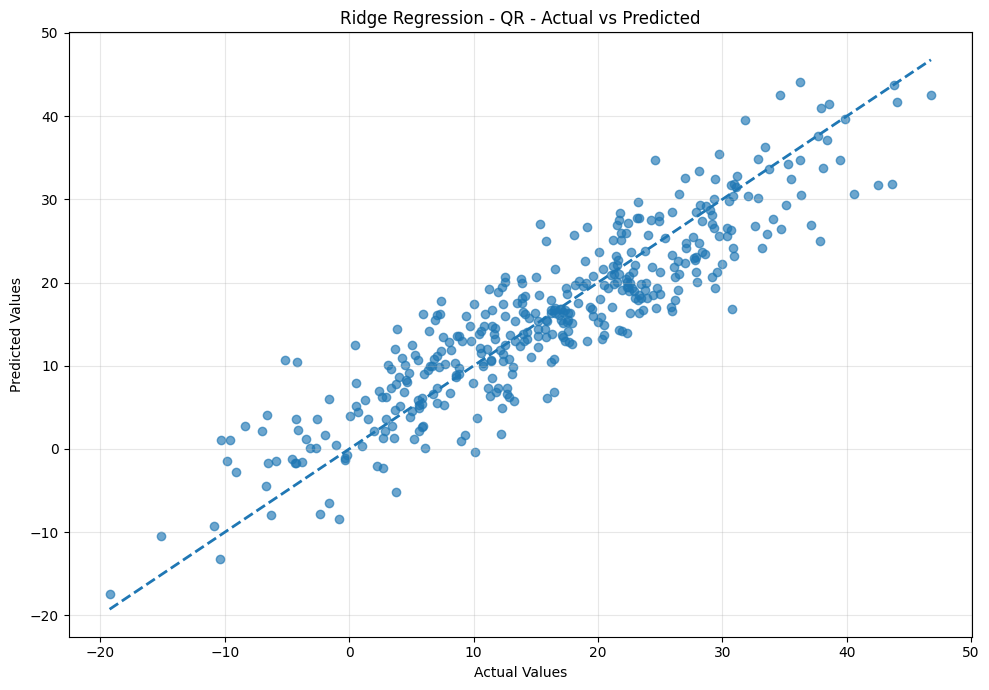

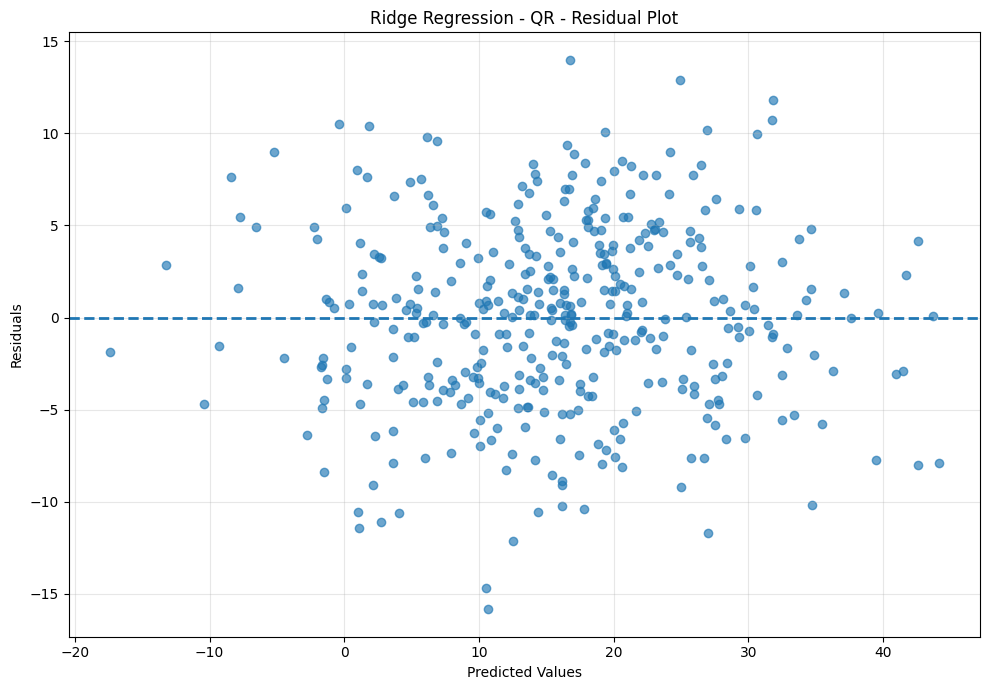

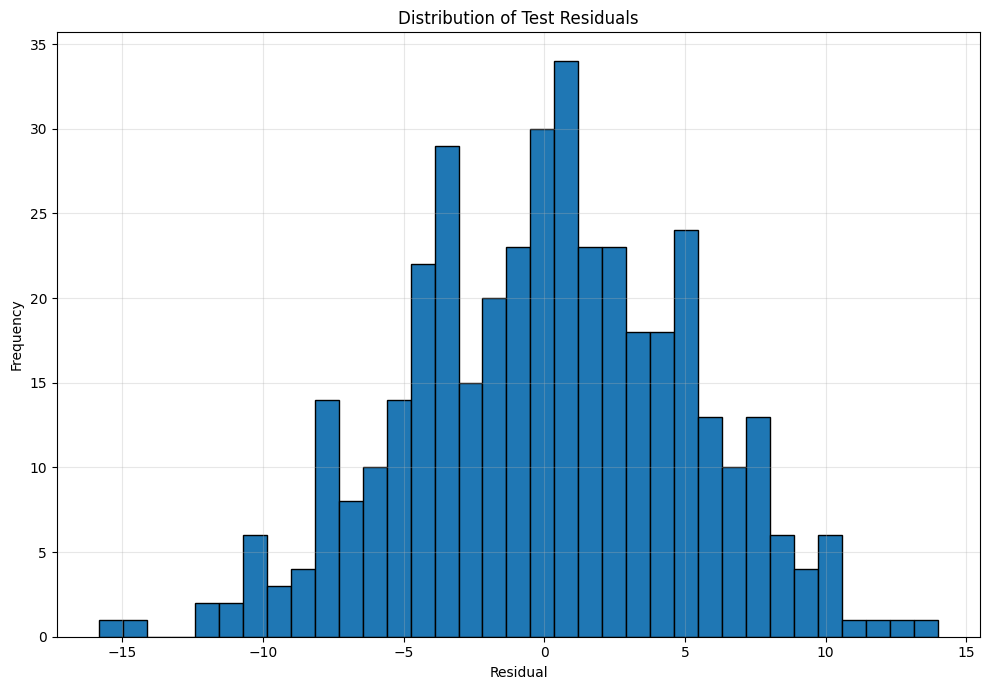

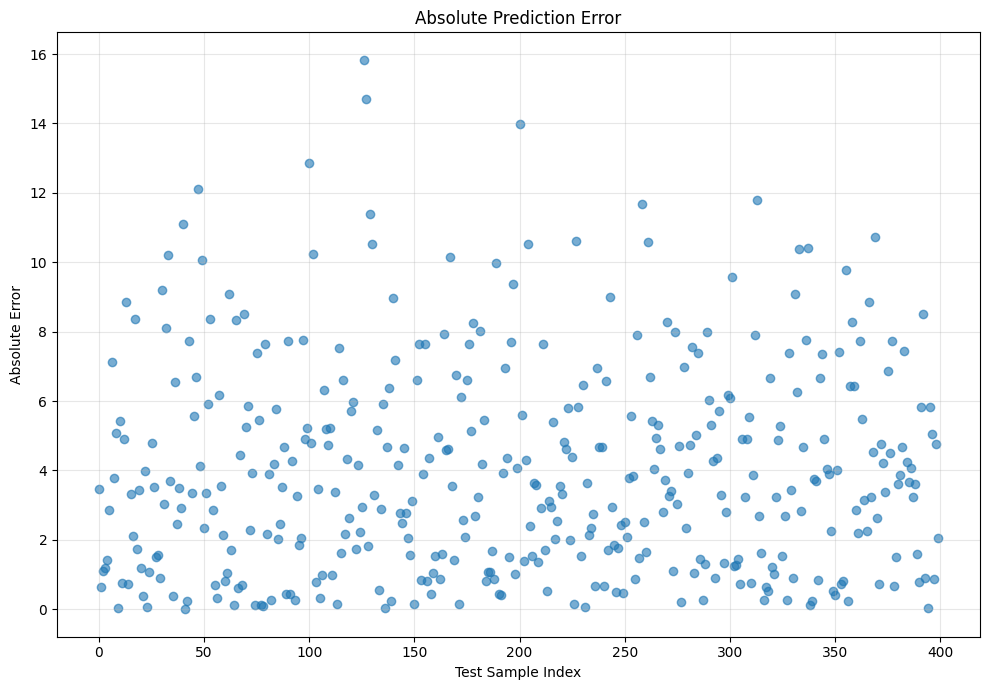

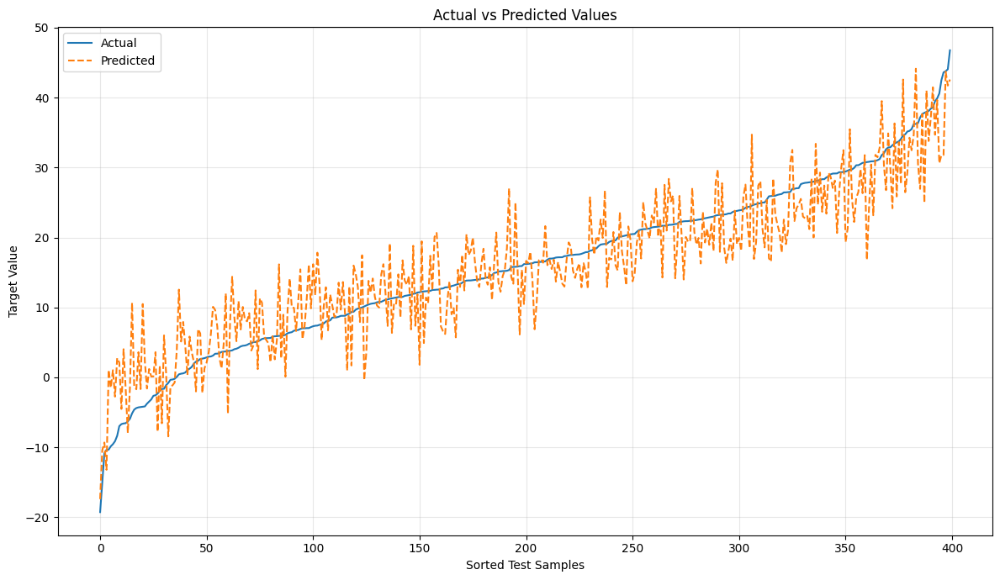


COEFFICIENT COMPARISON
Feature      True   Learned
     X1  5.000000  5.106401
     X2 -3.500000 -3.458542
     X3  2.500000  2.548592
     X4  7.000000  6.990367
     X5 -4.000000 -4.045414
     X6  3.000000  2.983877


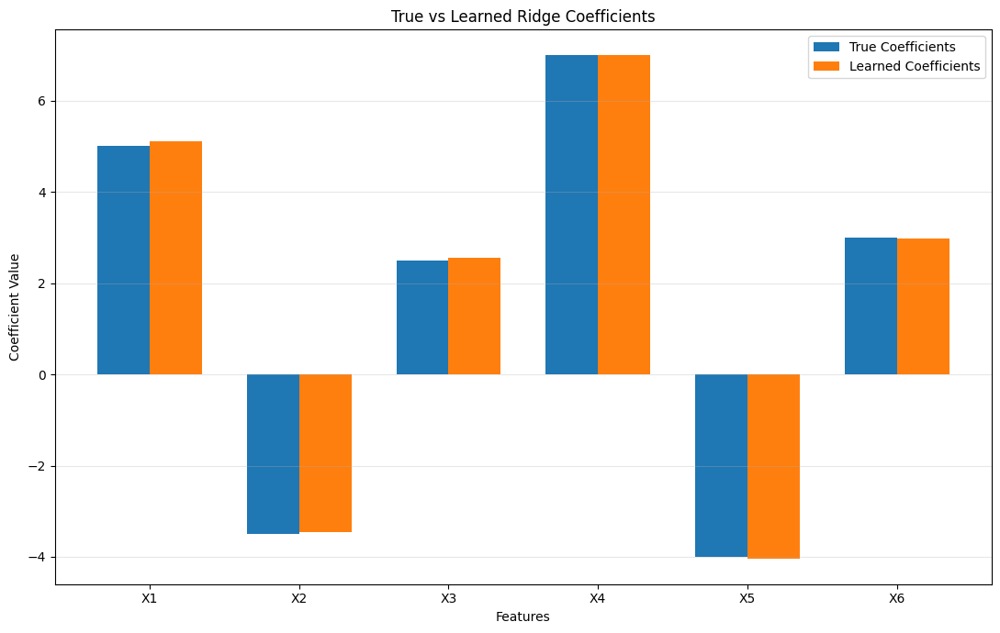


REGULARIZATION ANALYSIS
      Alpha      MAE       MSE     RMSE       R2  Coefficient_Norm
   0.000100 4.016801 25.216548 5.021608 0.817431         10.900270
   0.001000 4.016802 25.216550 5.021608 0.817431         10.900264
   0.010000 4.016804 25.216568 5.021610 0.817431         10.900202
   0.100000 4.016826 25.216754 5.021629 0.817429         10.899584
   1.000000 4.017052 25.218650 5.021817 0.817416         10.893406
  10.000000 4.019904 25.241369 5.024079 0.817251         10.832013
 100.000000 4.064195 25.799999 5.079370 0.813207         10.254349
1000.000000 5.303074 42.981177 6.556003 0.688814          6.694079


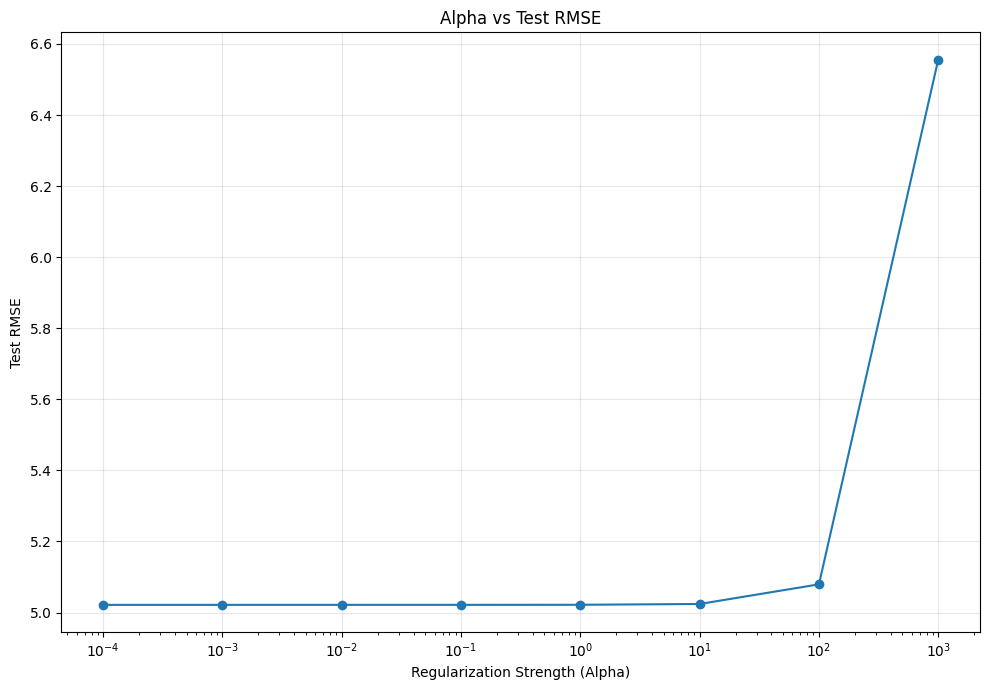

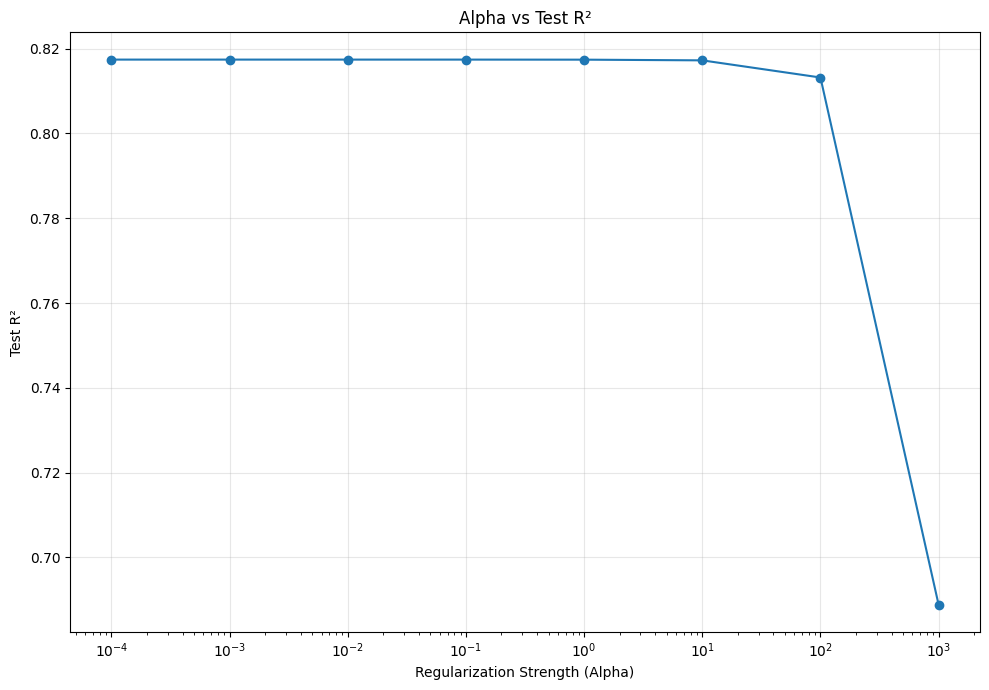

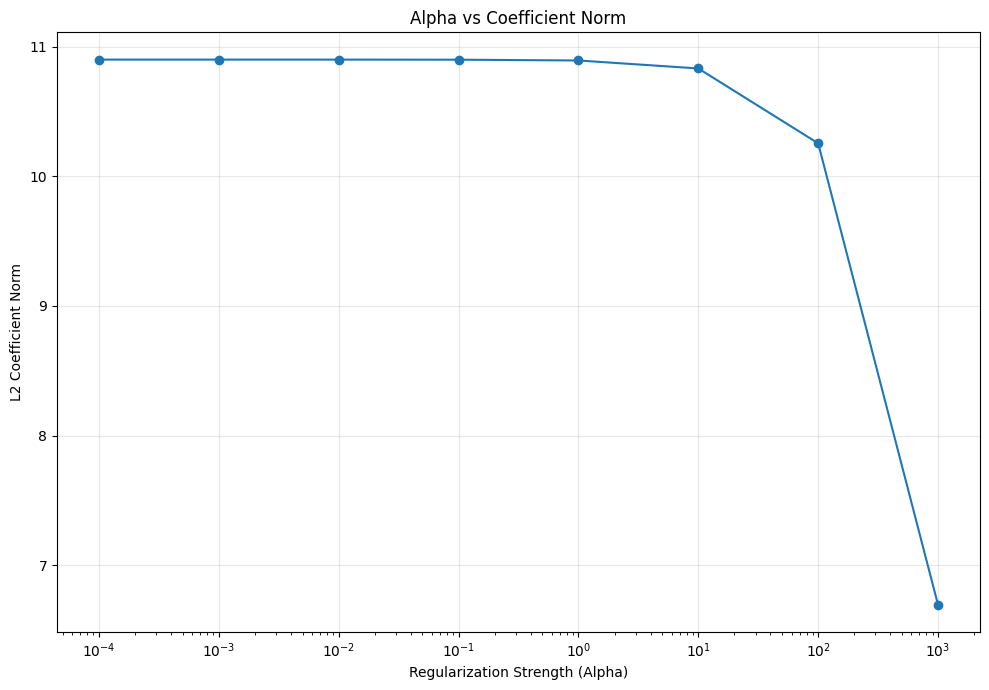

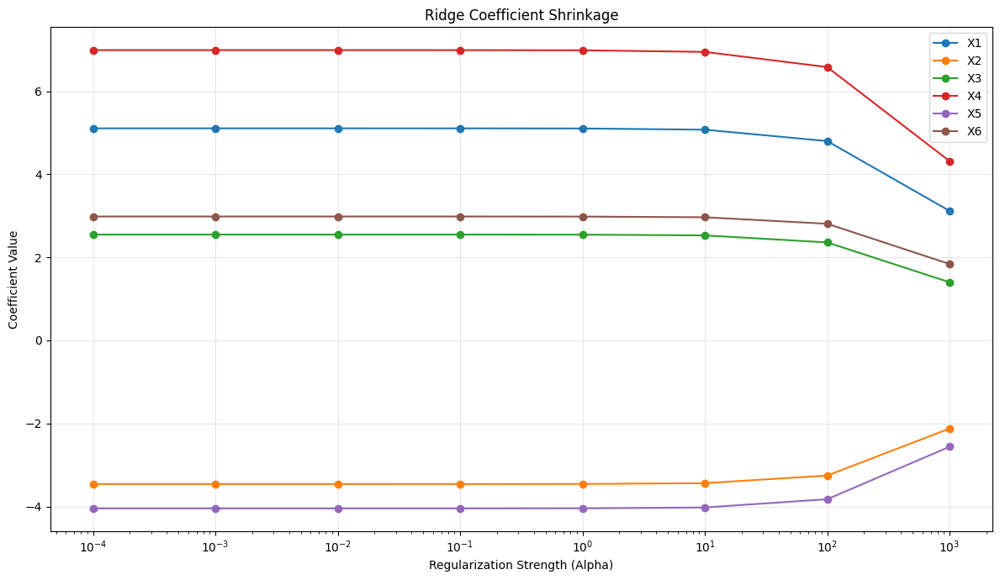


QR DECOMPOSITION VERIFICATION
A shape                 : (7, 7)
Q shape                 : (7, 7)
R shape                 : (7, 7)
A - QR reconstruction   : 5.093316047714e-13
QᵀQ - I error           : 4.214452214629e-16
Status                  : QR decomposition verified

FINAL MODEL SUMMARY
Method             : Ridge Regression + QR Decomposition
Alpha              : 1.000000
Training MAE       : 3.945266
Training MSE       : 24.824726
Training RMSE      : 4.982442
Training R²        : 0.826723
Testing MAE        : 4.017052
Testing MSE        : 25.218650
Testing RMSE       : 5.021817
Testing R²         : 0.817416
Testing Adjusted R²: 0.814628
Explained Variance : 0.817439


In [4]:
# ============================================================
# RIDGE REGRESSION FROM SCRATCH
# QR DECOMPOSITION
#
# NO SCIKIT-LEARN
#
# Includes:
#   1. Large synthetic dataset
#   2. Train/Test split
#   3. Feature standardization
#   4. Ridge Regression
#   5. QR Decomposition from scratch
#   6. Modified Gram-Schmidt
#   7. Backward substitution
#   8. MAE
#   9. MSE
#  10. RMSE
#  11. R²
#  12. Adjusted R²
#  13. Explained Variance
#  14. Actual vs Predicted plot
#  15. Residual plot
#  16. Residual distribution
#  17. Absolute error plot
#  18. Coefficient comparison
#  19. Alpha vs RMSE
#  20. Alpha vs R²
#  21. Coefficient shrinkage
#  22. QR decomposition verification
# ============================================================


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ============================================================
# 1. REPRODUCIBILITY
# ============================================================

np.random.seed(42)


# ============================================================
# 2. GENERATE LARGE SYNTHETIC DATASET
# ============================================================

n_samples = 2000
n_features = 6

X = np.random.randn(
    n_samples,
    n_features
)

# True coefficients
true_coefficients = np.array([
    5.0,
    -3.5,
    2.5,
    7.0,
    -4.0,
    3.0
])

# True intercept
true_intercept = 15.0

# Random noise
noise = np.random.normal(
    loc=0.0,
    scale=5.0,
    size=n_samples
)

# Target
y = (
    true_intercept
    + X @ true_coefficients
    + noise
)


print("=" * 75)
print("DATASET INFORMATION")
print("=" * 75)

print(
    "Number of samples :",
    n_samples
)

print(
    "Number of features:",
    n_features
)

print(
    "X shape           :",
    X.shape
)

print(
    "y shape           :",
    y.shape
)


# ============================================================
# 3. TRAIN / TEST SPLIT FROM SCRATCH
# ============================================================

test_size = 0.20

indices = np.random.permutation(
    n_samples
)

test_count = int(
    n_samples * test_size
)

test_indices = indices[
    :test_count
]

train_indices = indices[
    test_count:
]

X_train = X[
    train_indices
]

X_test = X[
    test_indices
]

y_train = y[
    train_indices
]

y_test = y[
    test_indices
]


print("\n" + "=" * 75)
print("TRAIN / TEST SPLIT")
print("=" * 75)

print(
    "Training samples:",
    len(X_train)
)

print(
    "Testing samples :",
    len(X_test)
)


# ============================================================
# 4. STANDARDIZATION FROM SCRATCH
# ============================================================

# Training mean
X_mean = np.mean(
    X_train,
    axis=0
)

# Training standard deviation
X_std = np.std(
    X_train,
    axis=0
)

# Prevent division by zero
X_std[X_std == 0] = 1.0

# Scale training data
X_train_scaled = (
    X_train - X_mean
) / X_std

# Scale test data using training statistics
X_test_scaled = (
    X_test - X_mean
) / X_std


# ============================================================
# 5. QR DECOMPOSITION FROM SCRATCH
#    MODIFIED GRAM-SCHMIDT
# ============================================================

def qr_decomposition(A):

    """
    Modified Gram-Schmidt QR decomposition.

    Given:

        A

    returns:

        Q, R

    such that:

        A = Q @ R
    """

    m, n = A.shape

    Q = np.zeros(
        (m, n),
        dtype=float
    )

    R = np.zeros(
        (n, n),
        dtype=float
    )

    for j in range(n):

        # ----------------------------------------------------
        # Start with current column
        # ----------------------------------------------------

        v = A[:, j].copy()

        # ----------------------------------------------------
        # Orthogonalize against previous Q columns
        # ----------------------------------------------------

        for i in range(j):

            R[i, j] = np.dot(
                Q[:, i],
                v
            )

            v = (
                v
                - R[i, j] * Q[:, i]
            )

        # ----------------------------------------------------
        # Calculate norm
        # ----------------------------------------------------

        R[j, j] = np.linalg.norm(
            v
        )

        if R[j, j] < 1e-12:

            raise np.linalg.LinAlgError(
                "Matrix has linearly dependent columns."
            )

        # ----------------------------------------------------
        # Normalize
        # ----------------------------------------------------

        Q[:, j] = (
            v / R[j, j]
        )

    return Q, R


# ============================================================
# 6. BACKWARD SUBSTITUTION FROM SCRATCH
# ============================================================

def backward_substitution(
    R,
    b
):

    """
    Solves:

        Rx = b

    where R is upper triangular.
    """

    n = R.shape[0]

    x = np.zeros(
        n,
        dtype=float
    )

    for i in range(
        n - 1,
        -1,
        -1
    ):

        # ----------------------------------------------------
        # Sum of known terms
        # ----------------------------------------------------

        s = 0.0

        for j in range(
            i + 1,
            n
        ):

            s += (
                R[i, j]
                * x[j]
            )

        # ----------------------------------------------------
        # Solve current variable
        # ----------------------------------------------------

        x[i] = (
            b[i] - s
        ) / R[i, i]

    return x


# ============================================================
# 7. RIDGE REGRESSION CLASS
#    QR DECOMPOSITION
# ============================================================

class RidgeRegressionQR:

    def __init__(
        self,
        alpha=1.0
    ):

        self.alpha = alpha

        self.coef_ = None

        self.intercept_ = None

        self.weights_ = None

        self.Q_ = None

        self.R_ = None

    # ========================================================
    # FIT
    # ========================================================

    def fit(
        self,
        X,
        y
    ):

        n_samples, n_features = X.shape

        # ----------------------------------------------------
        # Add intercept column
        # ----------------------------------------------------

        X_b = np.c_[
            np.ones(
                (n_samples, 1)
            ),
            X
        ]

        # ----------------------------------------------------
        # Identity matrix
        # ----------------------------------------------------

        I = np.eye(
            n_features + 1
        )

        # ----------------------------------------------------
        # Do NOT regularize intercept
        # ----------------------------------------------------

        I[0, 0] = 0.0

        # ----------------------------------------------------
        # Ridge matrix
        #
        # A = XᵀX + alpha I
        # ----------------------------------------------------

        A = (
            X_b.T @ X_b
            + self.alpha * I
        )

        # ----------------------------------------------------
        # Right-hand side
        #
        # b = Xᵀy
        # ----------------------------------------------------

        b = (
            X_b.T @ y
        )

        # ----------------------------------------------------
        # QR decomposition
        #
        # A = QR
        # ----------------------------------------------------

        self.Q_, self.R_ = qr_decomposition(
            A
        )

        # ----------------------------------------------------
        # QR equation
        #
        # QR theta = b
        #
        # Multiply by Qᵀ:
        #
        # R theta = Qᵀb
        # ----------------------------------------------------

        qtb = (
            self.Q_.T @ b
        )

        # ----------------------------------------------------
        # Solve R theta = Qᵀb
        # ----------------------------------------------------

        self.weights_ = backward_substitution(
            self.R_,
            qtb
        )

        # ----------------------------------------------------
        # Separate intercept
        # ----------------------------------------------------

        self.intercept_ = (
            self.weights_[0]
        )

        # ----------------------------------------------------
        # Separate coefficients
        # ----------------------------------------------------

        self.coef_ = (
            self.weights_[1:]
        )

        return self

    # ========================================================
    # PREDICT
    # ========================================================

    def predict(
        self,
        X
    ):

        return (
            self.intercept_
            + X @ self.coef_
        )


# ============================================================
# 8. CREATE RIDGE MODEL
# ============================================================

alpha = 1.0

model = RidgeRegressionQR(
    alpha=alpha
)


# ============================================================
# 9. TRAIN MODEL
# ============================================================

model.fit(
    X_train_scaled,
    y_train
)


# ============================================================
# 10. PREDICTIONS
# ============================================================

y_train_pred = model.predict(
    X_train_scaled
)

y_test_pred = model.predict(
    X_test_scaled
)


# ============================================================
# 11. EVALUATION METRICS FROM SCRATCH
# ============================================================

def mean_absolute_error(
    y_true,
    y_pred
):

    return np.mean(
        np.abs(
            y_true - y_pred
        )
    )


def mean_squared_error(
    y_true,
    y_pred
):

    return np.mean(
        (
            y_true - y_pred
        ) ** 2
    )


def root_mean_squared_error(
    y_true,
    y_pred
):

    return np.sqrt(
        mean_squared_error(
            y_true,
            y_pred
        )
    )


def r2_score(
    y_true,
    y_pred
):

    ss_res = np.sum(
        (
            y_true - y_pred
        ) ** 2
    )

    ss_tot = np.sum(
        (
            y_true - np.mean(y_true)
        ) ** 2
    )

    return (
        1
        - ss_res / ss_tot
    )


def adjusted_r2_score(
    y_true,
    y_pred,
    n_features
):

    n = len(y_true)

    r2 = r2_score(
        y_true,
        y_pred
    )

    return (
        1
        - (
            (1 - r2)
            * (n - 1)
            / (n - n_features - 1)
        )
    )


def explained_variance_score(
    y_true,
    y_pred
):

    residuals = (
        y_true - y_pred
    )

    return (
        1
        - np.var(residuals)
        / np.var(y_true)
    )


# ============================================================
# 12. TRAINING METRICS
# ============================================================

train_mae = mean_absolute_error(
    y_train,
    y_train_pred
)

train_mse = mean_squared_error(
    y_train,
    y_train_pred
)

train_rmse = root_mean_squared_error(
    y_train,
    y_train_pred
)

train_r2 = r2_score(
    y_train,
    y_train_pred
)

train_adjusted_r2 = adjusted_r2_score(
    y_train,
    y_train_pred,
    n_features
)

train_explained_variance = explained_variance_score(
    y_train,
    y_train_pred
)


# ============================================================
# 13. TESTING METRICS
# ============================================================

test_mae = mean_absolute_error(
    y_test,
    y_test_pred
)

test_mse = mean_squared_error(
    y_test,
    y_test_pred
)

test_rmse = root_mean_squared_error(
    y_test,
    y_test_pred
)

test_r2 = r2_score(
    y_test,
    y_test_pred
)

test_adjusted_r2 = adjusted_r2_score(
    y_test,
    y_test_pred,
    n_features
)

test_explained_variance = explained_variance_score(
    y_test,
    y_test_pred
)


# ============================================================
# 14. MODEL PARAMETERS
# ============================================================

print("\n" + "=" * 75)
print("MODEL PARAMETERS")
print("=" * 75)

print(
    f"Method    : Ridge Regression + QR Decomposition"
)

print(
    f"Alpha     : {model.alpha:.6f}"
)

print(
    f"Intercept : {model.intercept_:.6f}"
)

for i, coefficient in enumerate(
    model.coef_
):

    print(
        f"Coefficient X{i+1}: "
        f"{coefficient:.6f}"
    )


# ============================================================
# 15. EVALUATION TABLE
# ============================================================

results = pd.DataFrame({

    "Metric": [

        "MAE",

        "MSE",

        "RMSE",

        "R²",

        "Adjusted R²",

        "Explained Variance"
    ],

    "Training": [

        train_mae,

        train_mse,

        train_rmse,

        train_r2,

        train_adjusted_r2,

        train_explained_variance
    ],

    "Testing": [

        test_mae,

        test_mse,

        test_rmse,

        test_r2,

        test_adjusted_r2,

        test_explained_variance
    ]
})


print("\n" + "=" * 75)
print("MODEL EVALUATION")
print("=" * 75)

print(
    results.to_string(
        index=False,
        float_format=lambda x: f"{x:.6f}"
    )
)


# ============================================================
# 16. ACTUAL VS PREDICTED
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.65
)

minimum = min(
    y_test.min(),
    y_test_pred.min()
)

maximum = max(
    y_test.max(),
    y_test_pred.max()
)

plt.plot(
    [minimum, maximum],
    [minimum, maximum],
    linestyle="--",
    linewidth=2
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Predicted Values"
)

plt.title(
    "Ridge Regression - QR - Actual vs Predicted"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 17. RESIDUAL PLOT
# ============================================================

residuals = (
    y_test - y_test_pred
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test_pred,
    residuals,
    alpha=0.65
)

plt.axhline(
    y=0,
    linestyle="--",
    linewidth=2
)

plt.xlabel(
    "Predicted Values"
)

plt.ylabel(
    "Residuals"
)

plt.title(
    "Ridge Regression - QR - Residual Plot"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 18. RESIDUAL DISTRIBUTION
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.hist(
    residuals,
    bins=35,
    edgecolor="black"
)

plt.xlabel(
    "Residual"
)

plt.ylabel(
    "Frequency"
)

plt.title(
    "Distribution of Test Residuals"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 19. ABSOLUTE ERROR PLOT
# ============================================================

absolute_errors = np.abs(
    residuals
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    np.arange(
        len(absolute_errors)
    ),
    absolute_errors,
    alpha=0.6
)

plt.xlabel(
    "Test Sample Index"
)

plt.ylabel(
    "Absolute Error"
)

plt.title(
    "Absolute Prediction Error"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 20. ACTUAL VS PREDICTED SORTED LINE
# ============================================================

sort_indices = np.argsort(
    y_test
)

actual_sorted = (
    y_test[
        sort_indices
    ]
)

predicted_sorted = (
    y_test_pred[
        sort_indices
    ]
)

plt.figure(
    figsize=(12, 7)
)

plt.plot(
    actual_sorted,
    label="Actual"
)

plt.plot(
    predicted_sorted,
    linestyle="--",
    label="Predicted"
)

plt.xlabel(
    "Sorted Test Samples"
)

plt.ylabel(
    "Target Value"
)

plt.title(
    "Actual vs Predicted Values"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 21. TRUE VS LEARNED COEFFICIENTS
# ============================================================

coefficient_comparison = pd.DataFrame({

    "Feature": [
        f"X{i+1}"
        for i in range(n_features)
    ],

    "True": true_coefficients,

    "Learned": model.coef_
})


print("\n" + "=" * 75)
print("COEFFICIENT COMPARISON")
print("=" * 75)

print(
    coefficient_comparison.to_string(
        index=False,
        float_format=lambda x: f"{x:.6f}"
    )
)


plt.figure(
    figsize=(11, 7)
)

positions = np.arange(
    n_features
)

width = 0.35

plt.bar(
    positions - width / 2,
    true_coefficients,
    width,
    label="True Coefficients"
)

plt.bar(
    positions + width / 2,
    model.coef_,
    width,
    label="Learned Coefficients"
)

plt.xticks(
    positions,
    [
        f"X{i+1}"
        for i in range(n_features)
    ]
)

plt.xlabel(
    "Features"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "True vs Learned Ridge Coefficients"
)

plt.legend()

plt.grid(
    True,
    axis="y",
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 22. REGULARIZATION STRENGTH ANALYSIS
# ============================================================

alphas = np.array([
    0.0001,
    0.001,
    0.01,
    0.1,
    1.0,
    10.0,
    100.0,
    1000.0
])

alpha_results = []

coefficient_history = []


for current_alpha in alphas:

    temp_model = RidgeRegressionQR(
        alpha=current_alpha
    )

    temp_model.fit(
        X_train_scaled,
        y_train
    )

    temp_prediction = temp_model.predict(
        X_test_scaled
    )

    temp_mae = mean_absolute_error(
        y_test,
        temp_prediction
    )

    temp_mse = mean_squared_error(
        y_test,
        temp_prediction
    )

    temp_rmse = root_mean_squared_error(
        y_test,
        temp_prediction
    )

    temp_r2 = r2_score(
        y_test,
        temp_prediction
    )

    coefficient_norm = np.linalg.norm(
        temp_model.coef_
    )

    alpha_results.append({

        "Alpha": current_alpha,

        "MAE": temp_mae,

        "MSE": temp_mse,

        "RMSE": temp_rmse,

        "R2": temp_r2,

        "Coefficient_Norm": coefficient_norm
    })

    coefficient_history.append(
        temp_model.coef_
    )


alpha_results = pd.DataFrame(
    alpha_results
)

coefficient_history = np.array(
    coefficient_history
)


print("\n" + "=" * 75)
print("REGULARIZATION ANALYSIS")
print("=" * 75)

print(
    alpha_results.to_string(
        index=False,
        float_format=lambda x: f"{x:.6f}"
    )
)


# ============================================================
# 23. ALPHA VS TEST RMSE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    alpha_results["Alpha"],
    alpha_results["RMSE"],
    marker="o"
)

plt.xscale(
    "log"
)

plt.xlabel(
    "Regularization Strength (Alpha)"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "Alpha vs Test RMSE"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 24. ALPHA VS TEST R²
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    alpha_results["Alpha"],
    alpha_results["R2"],
    marker="o"
)

plt.xscale(
    "log"
)

plt.xlabel(
    "Regularization Strength (Alpha)"
)

plt.ylabel(
    "Test R²"
)

plt.title(
    "Alpha vs Test R²"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 25. ALPHA VS COEFFICIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    alpha_results["Alpha"],
    alpha_results["Coefficient_Norm"],
    marker="o"
)

plt.xscale(
    "log"
)

plt.xlabel(
    "Regularization Strength (Alpha)"
)

plt.ylabel(
    "L2 Coefficient Norm"
)

plt.title(
    "Alpha vs Coefficient Norm"
)

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 26. COEFFICIENT SHRINKAGE
# ============================================================

plt.figure(
    figsize=(12, 7)
)

for feature_index in range(
    n_features
):

    plt.plot(
        alphas,
        coefficient_history[
            :,
            feature_index
        ],
        marker="o",
        label=f"X{feature_index + 1}"
    )


plt.xscale(
    "log"
)

plt.xlabel(
    "Regularization Strength (Alpha)"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "Ridge Coefficient Shrinkage"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.tight_layout()

plt.show()


# ============================================================
# 27. VERIFY QR DECOMPOSITION
# ============================================================

# Reconstruct A = Q @ R

X_train_b = np.c_[
    np.ones(
        (len(X_train_scaled), 1)
    ),
    X_train_scaled
]

I_verify = np.eye(
    n_features + 1
)

I_verify[0, 0] = 0.0

A_verify = (
    X_train_b.T @ X_train_b
    + alpha * I_verify
)

A_reconstructed = (
    model.Q_ @ model.R_
)

reconstruction_error = np.linalg.norm(
    A_verify - A_reconstructed
)


# ============================================================
# 28. VERIFY Q ORTHOGONALITY
# ============================================================

Q_transpose_Q = (
    model.Q_.T @ model.Q_
)

identity_matrix = np.eye(
    model.Q_.shape[1]
)

orthogonality_error = np.linalg.norm(
    Q_transpose_Q - identity_matrix
)


print("\n" + "=" * 75)
print("QR DECOMPOSITION VERIFICATION")
print("=" * 75)

print(
    "A shape                 :",
    A_verify.shape
)

print(
    "Q shape                 :",
    model.Q_.shape
)

print(
    "R shape                 :",
    model.R_.shape
)

print(
    "A - QR reconstruction   :",
    f"{reconstruction_error:.12e}"
)

print(
    "QᵀQ - I error           :",
    f"{orthogonality_error:.12e}"
)

if (
    reconstruction_error < 1e-8
    and
    orthogonality_error < 1e-8
):

    print(
        "Status                  : "
        "QR decomposition verified"
    )

else:

    print(
        "Status                  : "
        "Check numerical precision"
    )


# ============================================================
# 29. FINAL SUMMARY
# ============================================================

print("\n" + "=" * 75)
print("FINAL MODEL SUMMARY")
print("=" * 75)

print(
    "Method             : "
    "Ridge Regression + QR Decomposition"
)

print(
    f"Alpha              : "
    f"{alpha:.6f}"
)

print(
    f"Training MAE       : "
    f"{train_mae:.6f}"
)

print(
    f"Training MSE       : "
    f"{train_mse:.6f}"
)

print(
    f"Training RMSE      : "
    f"{train_rmse:.6f}"
)

print(
    f"Training R²        : "
    f"{train_r2:.6f}"
)

print(
    f"Testing MAE        : "
    f"{test_mae:.6f}"
)

print(
    f"Testing MSE        : "
    f"{test_mse:.6f}"
)

print(
    f"Testing RMSE       : "
    f"{test_rmse:.6f}"
)

print(
    f"Testing R²         : "
    f"{test_r2:.6f}"
)

print(
    f"Testing Adjusted R²: "
    f"{test_adjusted_r2:.6f}"
)

print(
    f"Explained Variance : "
    f"{test_explained_variance:.6f}"
)

print("=" * 75)

DATASET INFORMATION
X shape: (2000, 6)
y shape: (2000,)
Number of samples: 2000
Number of features: 6

Train samples: 1600
Test samples : 400


SVD RIDGE REGRESSION EVALUATION
            Metric        Train         Test
               MAE    93.722523    94.129360
               MSE 13658.165692 13469.597745
              RMSE   116.868155   116.058596
                R²    -0.144398    -0.213314
       Adjusted R²    -0.148709    -0.231838
Explained Variance    -0.144398    -0.209711


MODEL PARAMETERS
Intercept: 13.012069067178787
  Feature  True Coefficient  Learned Coefficient  Absolute Difference
Feature_1               5.0            19.471698            14.471698
Feature_2              -3.5           -88.178641            84.678641
Feature_3               2.5           -41.316326            43.816326
Feature_4               7.0            15.986579             8.986579
Feature_5              -4.0            10.185183            14.185183
Feature_6               3.0            4

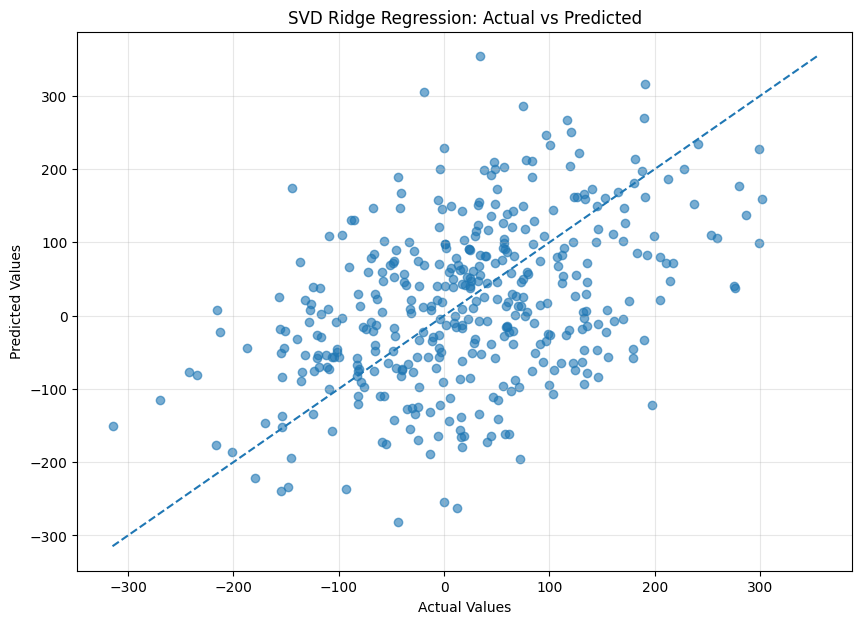

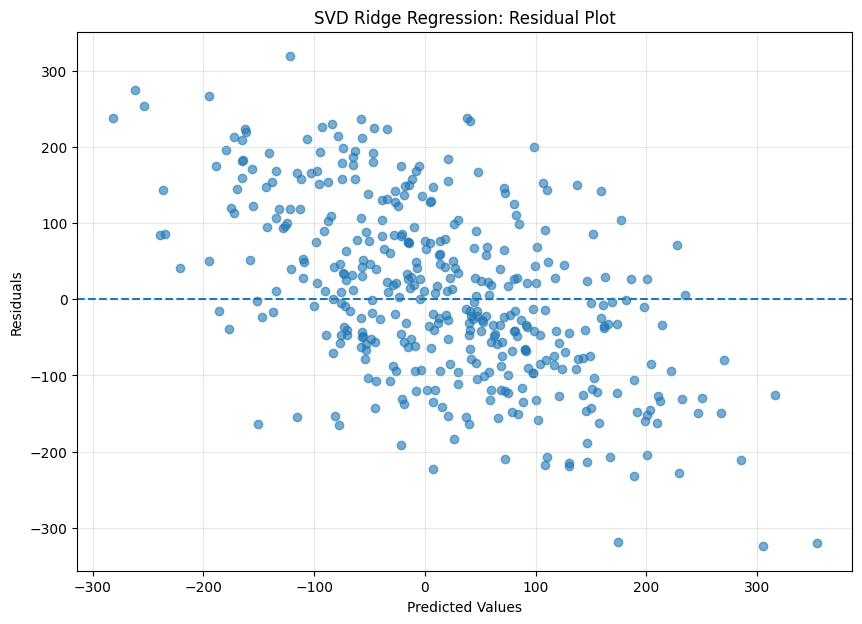

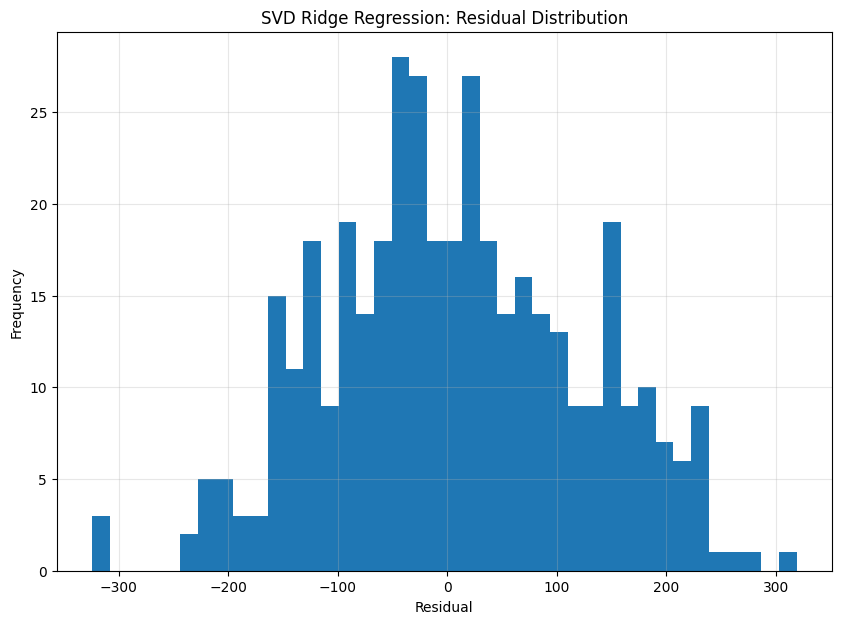

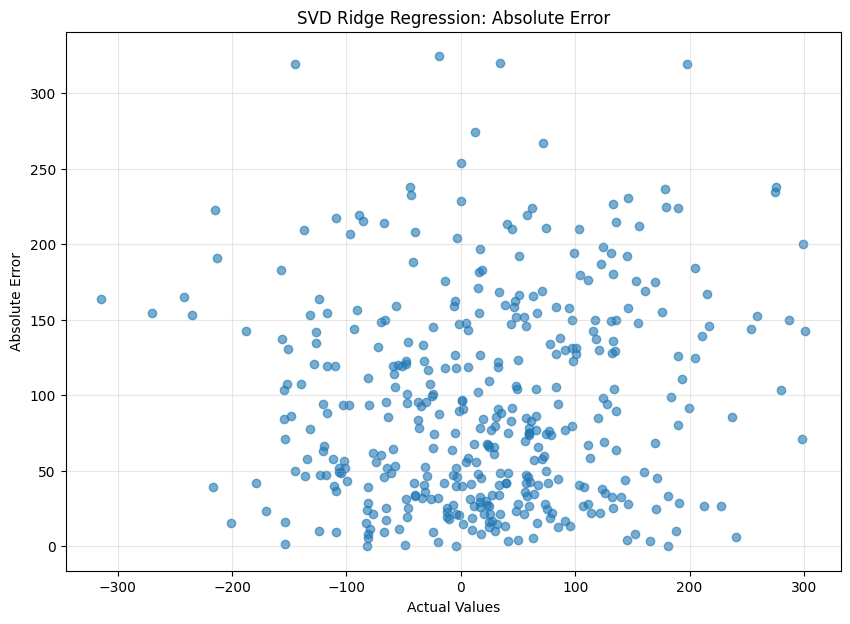

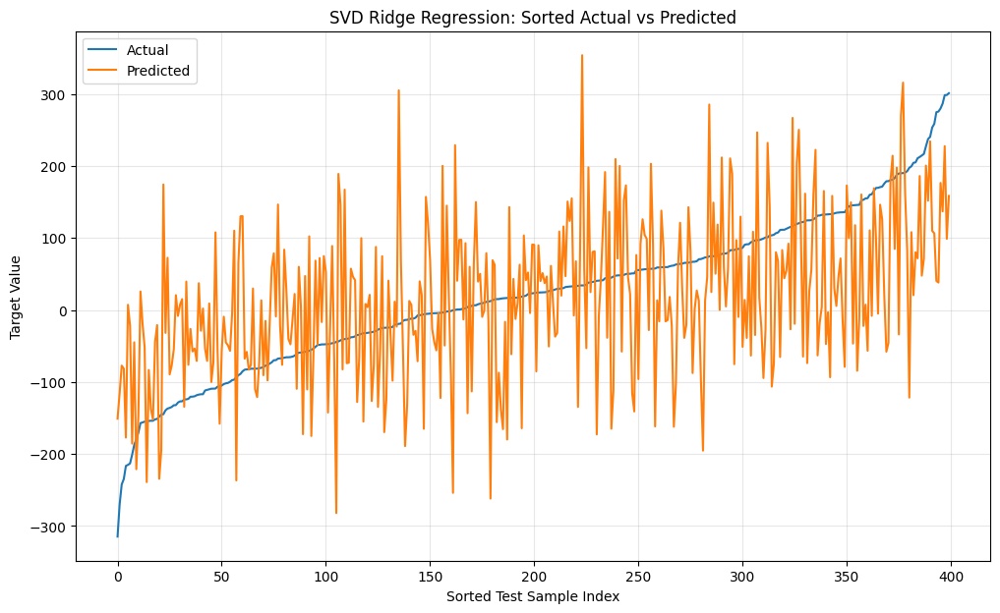

...

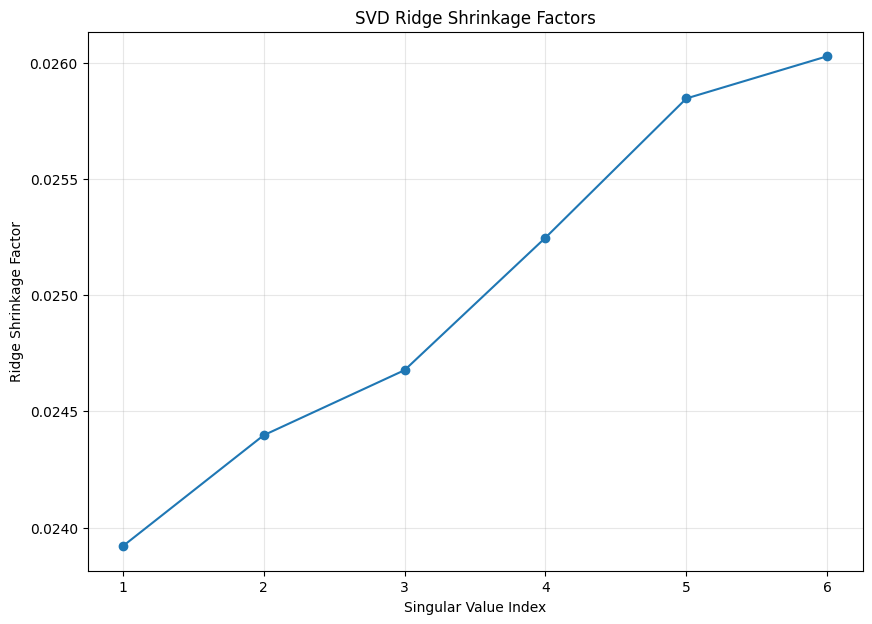

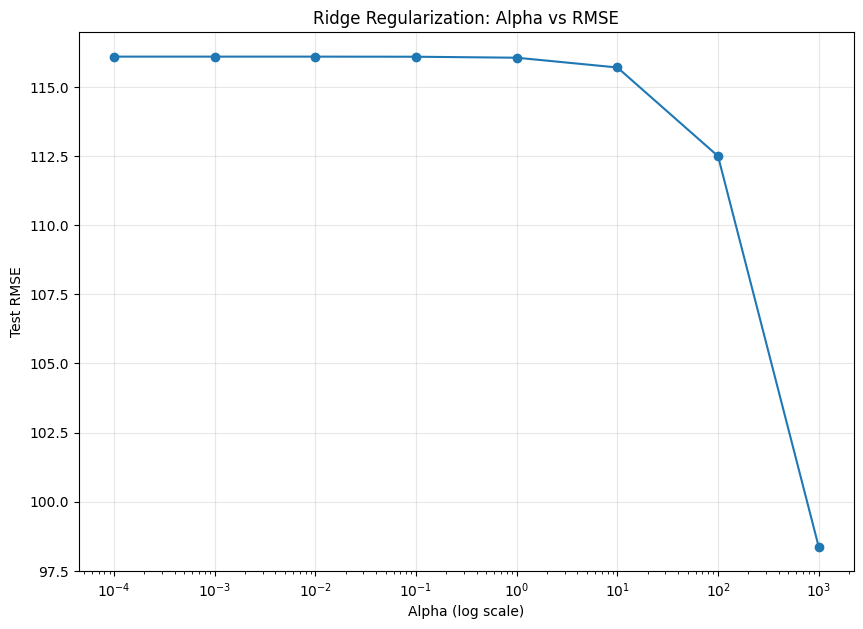

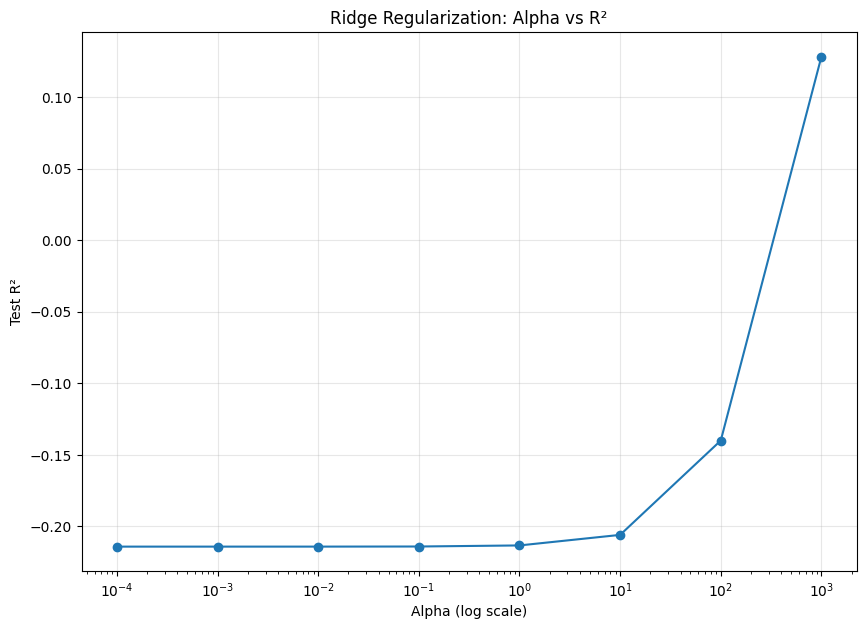

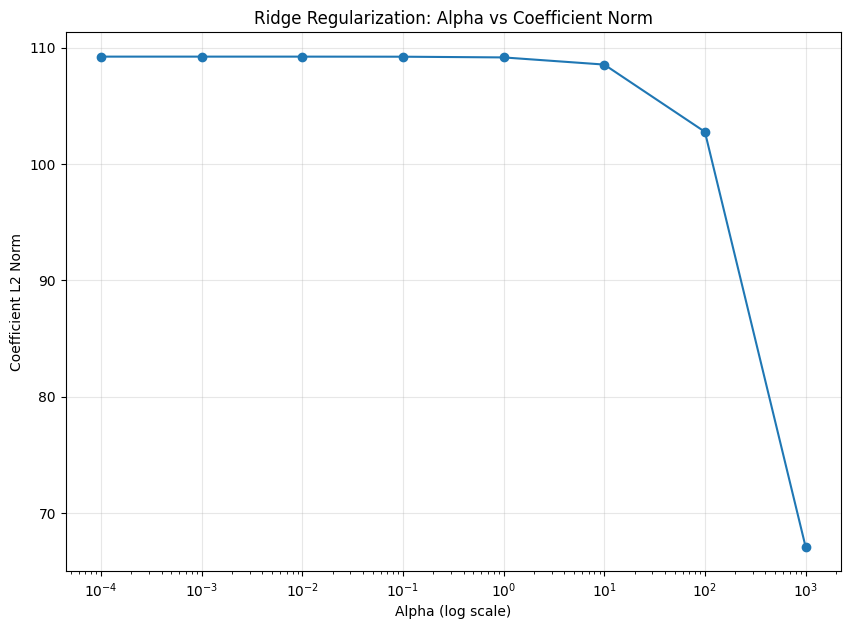

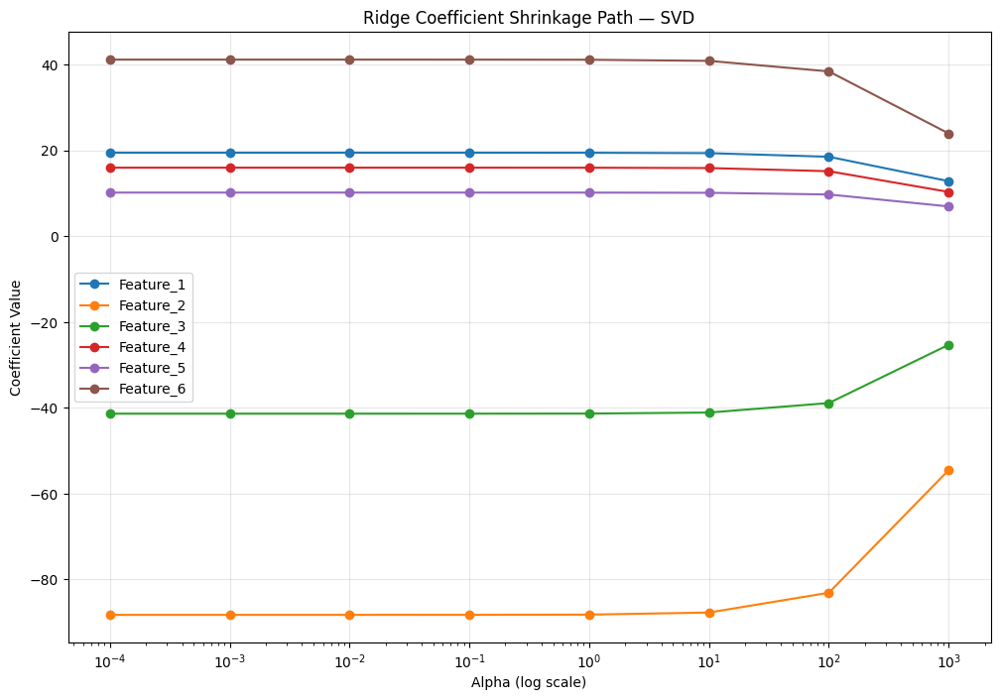



BEST ALPHA ANALYSIS
Best Alpha: 1000.0
Best Test RMSE: 98.37534587237121
Corresponding Test R²: 0.1282515439281412


SVD VERIFICATION
SVD reconstruction error: 119.34078639257419
U orthogonality error: 2.5976496170128e-15
V orthogonality error: 1.815705897468505e-15


FINAL SUMMARY
Algorithm       : Ridge Regression
Solver          : Singular Value Decomposition (SVD)
Alpha           : 1.0
Training RMSE   : 116.86815516475487
Testing RMSE    : 116.05859617121082
Training R²     : -0.14439817368290986
Testing R²      : -0.21331416681624638
Adjusted Test R²: -0.2318380472256547
Test MAE        : 94.12936019832198
Test MSE        : 13469.597745232191
Explained Var.  : -0.20971094714825633
Best Alpha      : 1000.0


In [5]:
# ============================================================
# RIDGE REGRESSION FROM SCRATCH
# SVD (SINGULAR VALUE DECOMPOSITION) BASED IMPLEMENTATION
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# 1. REPRODUCIBILITY
# ============================================================

np.random.seed(42)


# ============================================================
# 2. GENERATE A LARGE SYNTHETIC REGRESSION DATASET
# ============================================================

n_samples = 2000
n_features = 6

# True parameters
true_intercept = 15.0

true_coefficients = np.array([
    5.0,
    -3.5,
    2.5,
    7.0,
    -4.0,
    3.0
])

# Generate features
X = np.random.normal(
    loc=0.0,
    scale=10.0,
    size=(n_samples, n_features)
)

# Generate noise
noise = np.random.normal(
    loc=0.0,
    scale=5.0,
    size=n_samples
)

# Generate target
y = (
    true_intercept
    + X @ true_coefficients
    + noise
)

print("=" * 70)
print("DATASET INFORMATION")
print("=" * 70)

print("X shape:", X.shape)
print("y shape:", y.shape)
print("Number of samples:", n_samples)
print("Number of features:", n_features)


# ============================================================
# 3. TRAIN / TEST SPLIT
# ============================================================

test_size = 0.20

indices = np.random.permutation(n_samples)

test_count = int(
    n_samples * test_size
)

test_indices = indices[:test_count]
train_indices = indices[test_count:]

X_train = X[train_indices]
X_test = X[test_indices]

y_train = y[train_indices]
y_test = y[test_indices]

print("\nTrain samples:", X_train.shape[0])
print("Test samples :", X_test.shape[0])


# ============================================================
# 4. FEATURE STANDARDIZATION
# ============================================================

# Calculate statistics ONLY from training data
X_mean = np.mean(
    X_train,
    axis=0
)

X_std = np.std(
    X_train,
    axis=0
)

# Avoid division by zero
X_std[X_std == 0] = 1.0

# Standardize
X_train_scaled = (
    X_train - X_mean
) / X_std

X_test_scaled = (
    X_test - X_mean
) / X_std


# ============================================================
# 5. METRIC FUNCTIONS
# ============================================================

def mean_absolute_error(y_true, y_pred):

    return np.mean(
        np.abs(
            y_true - y_pred
        )
    )


def mean_squared_error(y_true, y_pred):

    return np.mean(
        (y_true - y_pred) ** 2
    )


def root_mean_squared_error(y_true, y_pred):

    return np.sqrt(
        mean_squared_error(
            y_true,
            y_pred
        )
    )


def r2_score(y_true, y_pred):

    ss_res = np.sum(
        (y_true - y_pred) ** 2
    )

    ss_tot = np.sum(
        (y_true - np.mean(y_true)) ** 2
    )

    return 1.0 - (
        ss_res / ss_tot
    )


def adjusted_r2_score(
    y_true,
    y_pred,
    n_features
):

    n = len(y_true)

    r2 = r2_score(
        y_true,
        y_pred
    )

    return (
        1
        -
        (
            (1 - r2)
            * (n - 1)
            /
            (n - n_features - 1)
        )
    )


def explained_variance_score(
    y_true,
    y_pred
):

    residual = (
        y_true - y_pred
    )

    variance_residual = np.var(
        residual
    )

    variance_y = np.var(
        y_true
    )

    return 1.0 - (
        variance_residual
        /
        variance_y
    )


# ============================================================
# 6. MANUAL SVD FUNCTION
# ============================================================

def manual_svd(A):

    """
    Compute SVD manually using eigenvalue decomposition.

    A = U Sigma V^T
    """

    A = np.asarray(
        A,
        dtype=float
    )

    m, n = A.shape

    # --------------------------------------------------------
    # Case 1: m >= n
    # --------------------------------------------------------

    if m >= n:

        # A^T A
        ATA = A.T @ A

        eigenvalues, V = np.linalg.eigh(
            ATA
        )

        # Sort descending
        order = np.argsort(
            eigenvalues
        )[::-1]

        eigenvalues = eigenvalues[order]

        V = V[:, order]

        # Numerical safety
        eigenvalues = np.maximum(
            eigenvalues,
            0.0
        )

        singular_values = np.sqrt(
            eigenvalues
        )

        # Build U
        U = np.zeros(
            (m, n)
        )

        tolerance = 1e-12

        for i in range(n):

            if singular_values[i] > tolerance:

                U[:, i] = (
                    A @ V[:, i]
                ) / singular_values[i]

        return (
            U,
            singular_values,
            V
        )

    # --------------------------------------------------------
    # Case 2: m < n
    # --------------------------------------------------------

    else:

        AAT = A @ A.T

        eigenvalues, U = np.linalg.eigh(
            AAT
        )

        # Sort descending
        order = np.argsort(
            eigenvalues
        )[::-1]

        eigenvalues = eigenvalues[order]

        U = U[:, order]

        eigenvalues = np.maximum(
            eigenvalues,
            0.0
        )

        singular_values = np.sqrt(
            eigenvalues
        )

        V = np.zeros(
            (n, m)
        )

        tolerance = 1e-12

        for i in range(m):

            if singular_values[i] > tolerance:

                V[:, i] = (
                    A.T @ U[:, i]
                ) / singular_values[i]

        return (
            U,
            singular_values,
            V
        )


# ============================================================
# 7. SVD-BASED RIDGE REGRESSION
# ============================================================

class RidgeRegressionSVD:

    def __init__(
        self,
        alpha=1.0
    ):

        self.alpha = alpha

        self.coef_ = None

        self.intercept_ = None

        self.singular_values_ = None

        self.U_ = None

        self.Vt_ = None

    # --------------------------------------------------------
    # FIT
    # --------------------------------------------------------

    def fit(
        self,
        X,
        y
    ):

        X = np.asarray(
            X,
            dtype=float
        )

        y = np.asarray(
            y,
            dtype=float
        )

        n_samples, n_features = X.shape

        # ----------------------------------------------------
        # Add intercept column
        # ----------------------------------------------------

        X_b = np.column_stack(
            (
                np.ones(n_samples),
                X
            )
        )

        # ----------------------------------------------------
        # IMPORTANT:
        #
        # We do NOT regularize the intercept.
        #
        # Therefore the intercept column must be handled
        # separately.
        # ----------------------------------------------------

        # Center X and y so intercept can be recovered later
        X_mean_local = np.mean(
            X,
            axis=0
        )

        y_mean_local = np.mean(
            y
        )

        X_centered = (
            X - X_mean_local
        )

        y_centered = (
            y - y_mean_local
        )

        # ----------------------------------------------------
        # SVD
        #
        # X = U Sigma V^T
        # ----------------------------------------------------

        U, singular_values, V = np.linalg.svd(
            X_centered,
            full_matrices=False
        )

        # Store SVD
        self.U_ = U

        self.singular_values_ = singular_values

        self.Vt_ = V.T

        # ----------------------------------------------------
        # Ridge shrinkage
        #
        # beta_j =
        #
        # sigma_j
        # ------------------- * U^T y
        # sigma_j^2 + alpha
        # ----------------------------------------------------

        shrinkage_factors = (
            singular_values
            /
            (
                singular_values ** 2
                + self.alpha
            )
        )

        # U^T y
        UT_y = (
            U.T
            @
            y_centered
        )

        # Ridge coefficients
        beta = (
            V
            @
            (
                shrinkage_factors
                * UT_y
            )
        )

        # ----------------------------------------------------
        # Recover original-scale intercept
        # ----------------------------------------------------

        intercept = (
            y_mean_local
            -
            X_mean_local @ beta
        )

        self.coef_ = beta

        self.intercept_ = intercept

        return self

    # --------------------------------------------------------
    # PREDICT
    # --------------------------------------------------------

    def predict(
        self,
        X
    ):

        X = np.asarray(
            X,
            dtype=float
        )

        return (
            self.intercept_
            +
            X @ self.coef_
        )


# ============================================================
# 8. TRAIN MODEL
# ============================================================

alpha = 1.0

model = RidgeRegressionSVD(
    alpha=alpha
)

model.fit(
    X_train_scaled,
    y_train
)

# Predictions
y_train_pred = model.predict(
    X_train_scaled
)

y_test_pred = model.predict(
    X_test_scaled
)


# ============================================================
# 9. EVALUATION
# ============================================================

train_mae = mean_absolute_error(
    y_train,
    y_train_pred
)

train_mse = mean_squared_error(
    y_train,
    y_train_pred
)

train_rmse = root_mean_squared_error(
    y_train,
    y_train_pred
)

train_r2 = r2_score(
    y_train,
    y_train_pred
)

train_adj_r2 = adjusted_r2_score(
    y_train,
    y_train_pred,
    n_features
)

train_ev = explained_variance_score(
    y_train,
    y_train_pred
)


test_mae = mean_absolute_error(
    y_test,
    y_test_pred
)

test_mse = mean_squared_error(
    y_test,
    y_test_pred
)

test_rmse = root_mean_squared_error(
    y_test,
    y_test_pred
)

test_r2 = r2_score(
    y_test,
    y_test_pred
)

test_adj_r2 = adjusted_r2_score(
    y_test,
    y_test_pred,
    n_features
)

test_ev = explained_variance_score(
    y_test,
    y_test_pred
)


# ============================================================
# 10. DISPLAY EVALUATION
# ============================================================

print("\n")
print("=" * 70)
print("SVD RIDGE REGRESSION EVALUATION")
print("=" * 70)

results = pd.DataFrame({

    "Metric": [
        "MAE",
        "MSE",
        "RMSE",
        "R²",
        "Adjusted R²",
        "Explained Variance"
    ],

    "Train": [
        train_mae,
        train_mse,
        train_rmse,
        train_r2,
        train_adj_r2,
        train_ev
    ],

    "Test": [
        test_mae,
        test_mse,
        test_rmse,
        test_r2,
        test_adj_r2,
        test_ev
    ]
})

print(
    results.to_string(
        index=False
    )
)


# ============================================================
# 11. LEARNED PARAMETERS
# ============================================================

print("\n")
print("=" * 70)
print("MODEL PARAMETERS")
print("=" * 70)

print(
    "Intercept:",
    model.intercept_
)

coefficient_table = pd.DataFrame({

    "Feature": [
        f"Feature_{i+1}"
        for i in range(n_features)
    ],

    "True Coefficient": true_coefficients,

    "Learned Coefficient": model.coef_,

    "Absolute Difference":
        np.abs(
            true_coefficients
            -
            model.coef_
        )
})

print(
    coefficient_table.to_string(
        index=False
    )
)


# ============================================================
# 12. ACTUAL VS PREDICTED
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.6
)

minimum = min(
    np.min(y_test),
    np.min(y_test_pred)
)

maximum = max(
    np.max(y_test),
    np.max(y_test_pred)
)

plt.plot(
    [minimum, maximum],
    [minimum, maximum],
    linestyle="--"
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Predicted Values"
)

plt.title(
    "SVD Ridge Regression: Actual vs Predicted"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 13. RESIDUAL PLOT
# ============================================================

residuals = (
    y_test
    -
    y_test_pred
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test_pred,
    residuals,
    alpha=0.6
)

plt.axhline(
    y=0,
    linestyle="--"
)

plt.xlabel(
    "Predicted Values"
)

plt.ylabel(
    "Residuals"
)

plt.title(
    "SVD Ridge Regression: Residual Plot"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 14. RESIDUAL DISTRIBUTION
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.hist(
    residuals,
    bins=40
)

plt.xlabel(
    "Residual"
)

plt.ylabel(
    "Frequency"
)

plt.title(
    "SVD Ridge Regression: Residual Distribution"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 15. ABSOLUTE ERROR
# ============================================================

absolute_errors = np.abs(
    residuals
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test,
    absolute_errors,
    alpha=0.6
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Absolute Error"
)

plt.title(
    "SVD Ridge Regression: Absolute Error"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 16. SORTED ACTUAL VS PREDICTED
# ============================================================

sort_indices = np.argsort(
    y_test
)

sorted_actual = (
    y_test[sort_indices]
)

sorted_predicted = (
    y_test_pred[sort_indices]
)

plt.figure(
    figsize=(12, 7)
)

plt.plot(
    sorted_actual,
    label="Actual"
)

plt.plot(
    sorted_predicted,
    label="Predicted"
)

plt.xlabel(
    "Sorted Test Sample Index"
)

plt.ylabel(
    "Target Value"
)

plt.title(
    "SVD Ridge Regression: Sorted Actual vs Predicted"
)

plt.legend()

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 17. TRUE VS LEARNED COEFFICIENTS
# ============================================================

feature_names = [
    f"Feature_{i+1}"
    for i in range(n_features)
]

x_positions = np.arange(
    n_features
)

width = 0.35

plt.figure(
    figsize=(12, 7)
)

plt.bar(
    x_positions - width / 2,
    true_coefficients,
    width,
    label="True"
)

plt.bar(
    x_positions + width / 2,
    model.coef_,
    width,
    label="SVD Ridge"
)

plt.xticks(
    x_positions,
    feature_names
)

plt.xlabel(
    "Features"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "True vs Learned Coefficients"
)

plt.legend()

plt.grid(
    axis="y",
    alpha=0.3
)

plt.show()


# ============================================================
# 18. SINGULAR VALUES
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    range(1, len(model.singular_values_) + 1),
    model.singular_values_,
    marker="o"
)

plt.xlabel(
    "Singular Value Index"
)

plt.ylabel(
    "Singular Value"
)

plt.title(
    "SVD Singular Values"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 19. RIDGE SHRINKAGE FACTORS
# ============================================================

alpha_for_shrinkage = 1.0

shrinkage = (
    model.singular_values_
    /
    (
        model.singular_values_ ** 2
        +
        alpha_for_shrinkage
    )
)

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    range(1, len(shrinkage) + 1),
    shrinkage,
    marker="o"
)

plt.xlabel(
    "Singular Value Index"
)

plt.ylabel(
    "Ridge Shrinkage Factor"
)

plt.title(
    "SVD Ridge Shrinkage Factors"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 20. ALPHA ANALYSIS
# ============================================================

alphas = np.array([
    0.0001,
    0.001,
    0.01,
    0.1,
    1.0,
    10.0,
    100.0,
    1000.0
])

alpha_rmse = []

alpha_r2 = []

alpha_coefficient_norm = []

alpha_models = []


for current_alpha in alphas:

    current_model = RidgeRegressionSVD(
        alpha=current_alpha
    )

    current_model.fit(
        X_train_scaled,
        y_train
    )

    current_pred = (
        current_model.predict(
            X_test_scaled
        )
    )

    current_rmse = (
        root_mean_squared_error(
            y_test,
            current_pred
        )
    )

    current_r2 = (
        r2_score(
            y_test,
            current_pred
        )
    )

    coefficient_norm = np.linalg.norm(
        current_model.coef_
    )

    alpha_rmse.append(
        current_rmse
    )

    alpha_r2.append(
        current_r2
    )

    alpha_coefficient_norm.append(
        coefficient_norm
    )

    alpha_models.append(
        current_model
    )


# ============================================================
# 21. ALPHA VS RMSE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    alphas,
    alpha_rmse,
    marker="o"
)

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "Ridge Regularization: Alpha vs RMSE"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 22. ALPHA VS R²
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    alphas,
    alpha_r2,
    marker="o"
)

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Test R²"
)

plt.title(
    "Ridge Regularization: Alpha vs R²"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 23. ALPHA VS COEFFICIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    alphas,
    alpha_coefficient_norm,
    marker="o"
)

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Coefficient L2 Norm"
)

plt.title(
    "Ridge Regularization: Alpha vs Coefficient Norm"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 24. COEFFICIENT SHRINKAGE PATH
# ============================================================

coefficient_paths = []

for current_model in alpha_models:

    coefficient_paths.append(
        current_model.coef_
    )

coefficient_paths = np.array(
    coefficient_paths
)

plt.figure(
    figsize=(12, 8)
)

for j in range(n_features):

    plt.semilogx(
        alphas,
        coefficient_paths[:, j],
        marker="o",
        label=f"Feature_{j+1}"
    )

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "Ridge Coefficient Shrinkage Path — SVD"
)

plt.legend()

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 25. FIND BEST ALPHA BASED ON TEST RMSE
# ============================================================

best_index = np.argmin(
    alpha_rmse
)

best_alpha = alphas[
    best_index
]

best_rmse = alpha_rmse[
    best_index
]

best_r2 = alpha_r2[
    best_index
]


print("\n")
print("=" * 70)
print("BEST ALPHA ANALYSIS")
print("=" * 70)

print(
    "Best Alpha:",
    best_alpha
)

print(
    "Best Test RMSE:",
    best_rmse
)

print(
    "Corresponding Test R²:",
    best_r2
)


# ============================================================
# 26. SVD RECONSTRUCTION VERIFICATION
# ============================================================

U = model.U_

Sigma = model.singular_values_

Vt = model.Vt_

# Reconstruct X
X_reconstructed = (
    U
    @
    np.diag(Sigma)
    @
    Vt
)

reconstruction_error = np.linalg.norm(
    X_train_scaled
    -
    X_reconstructed
)

# Orthogonality
U_orthogonality_error = np.linalg.norm(
    U.T @ U
    -
    np.eye(
        U.shape[1]
    )
)

V_orthogonality_error = np.linalg.norm(
    Vt @ Vt.T
    -
    np.eye(
        Vt.shape[0]
    )
)


print("\n")
print("=" * 70)
print("SVD VERIFICATION")
print("=" * 70)

print(
    "SVD reconstruction error:",
    reconstruction_error
)

print(
    "U orthogonality error:",
    U_orthogonality_error
)

print(
    "V orthogonality error:",
    V_orthogonality_error
)


# ============================================================
# 27. FINAL SUMMARY
# ============================================================

print("\n")
print("=" * 70)
print("FINAL SUMMARY")
print("=" * 70)

print(
    "Algorithm       : Ridge Regression"
)

print(
    "Solver          : Singular Value Decomposition (SVD)"
)

print(
    "Alpha           :",
    alpha
)

print(
    "Training RMSE   :",
    train_rmse
)

print(
    "Testing RMSE    :",
    test_rmse
)

print(
    "Training R²     :",
    train_r2
)

print(
    "Testing R²      :",
    test_r2
)

print(
    "Adjusted Test R²:",
    test_adj_r2
)

print(
    "Test MAE        :",
    test_mae
)

print(
    "Test MSE        :",
    test_mse
)

print(
    "Explained Var.  :",
    test_ev
)

print(
    "Best Alpha      :",
    best_alpha
)

print("=" * 70)

DATASET INFORMATION
X shape: (5000, 6)
y shape: (5000,)
Number of samples: 5000
Number of features: 6

Train samples: 4000
Test samples : 1000


BATCH GD RIDGE REGRESSION EVALUATION
            Metric     Train      Test
               MAE  4.084330  4.088904
               MSE 26.287091 26.233582
              RMSE  5.127094  5.121873
                R²  0.997761  0.997694
       Adjusted R²  0.997758  0.997680
Explained Variance  0.997761  0.997695


MODEL PARAMETERS
Intercept: 15.137836478486255
  Feature  True Coefficient  Learned Coefficient  Absolute Difference
Feature_1               5.0            50.587529            45.587529
Feature_2              -3.5           -34.609426            31.109426
Feature_3               2.5            24.960169            22.460169
Feature_4               7.0            69.769358            62.769358
Feature_5              -4.0           -40.646381            36.646381
Feature_6               3.0            29.637324            26.637324


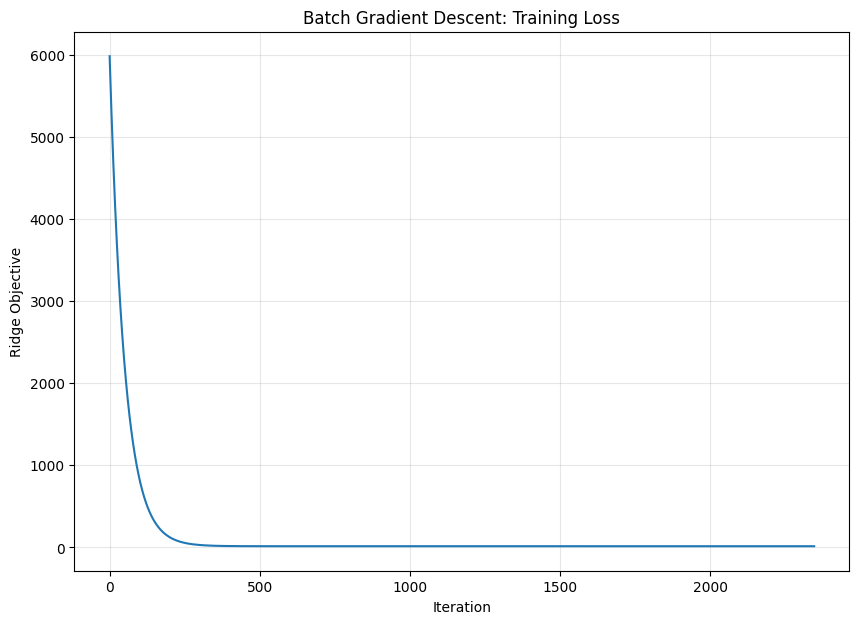

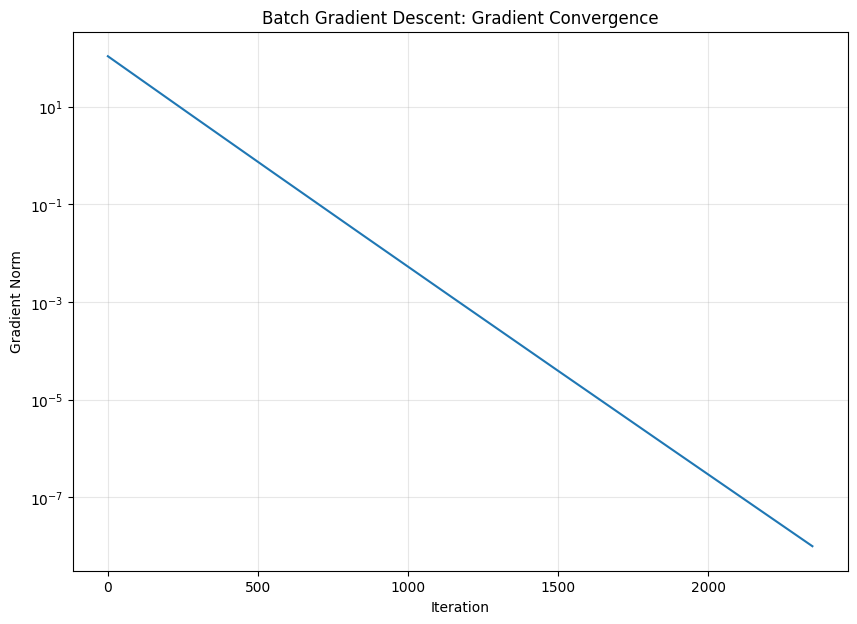

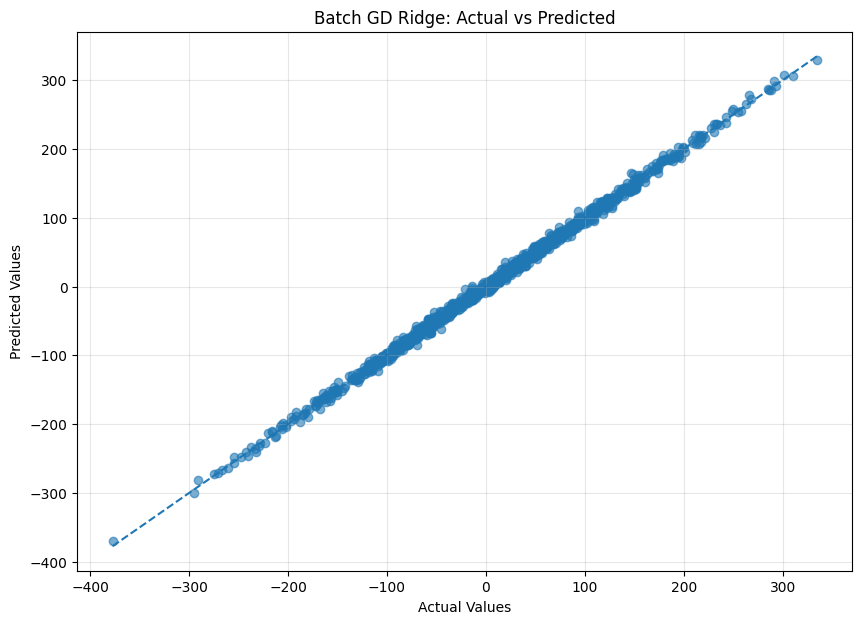

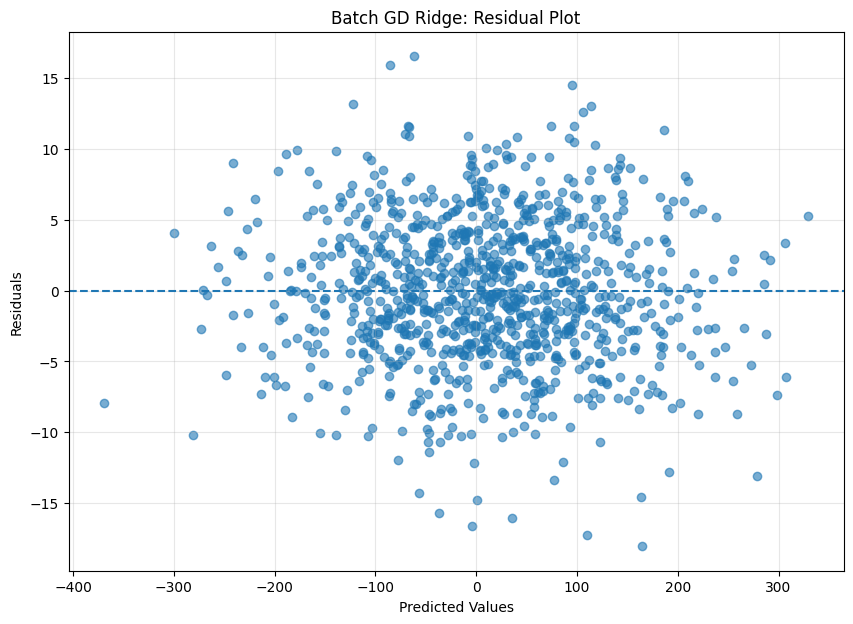

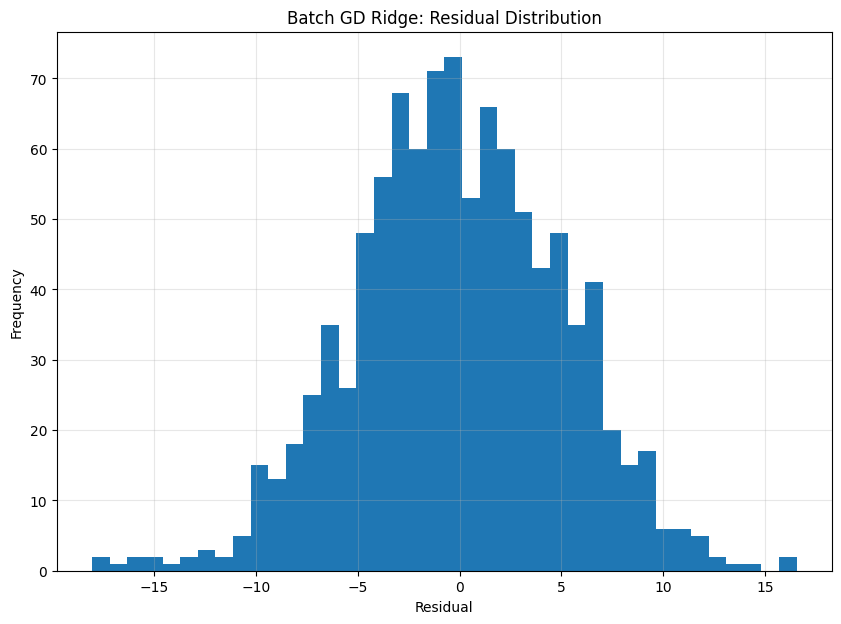

...

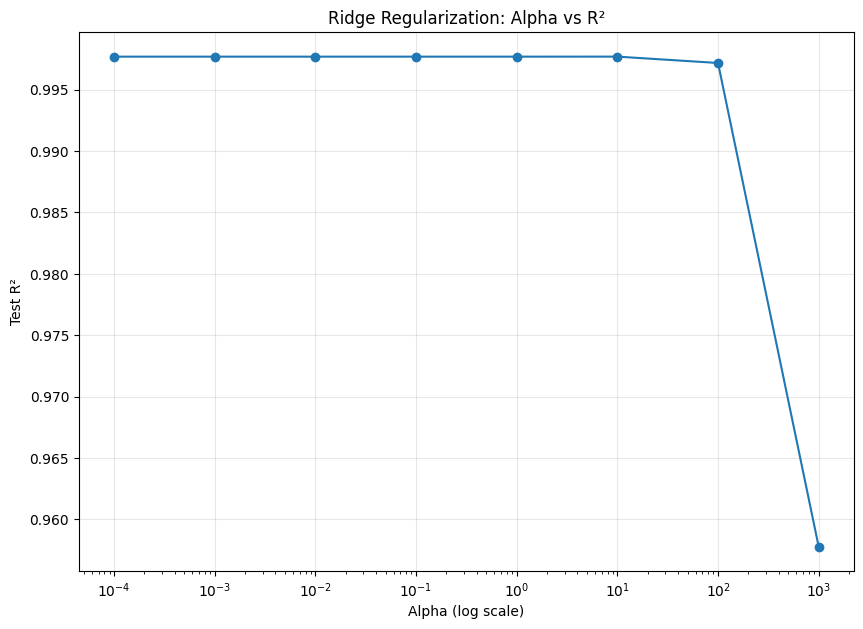

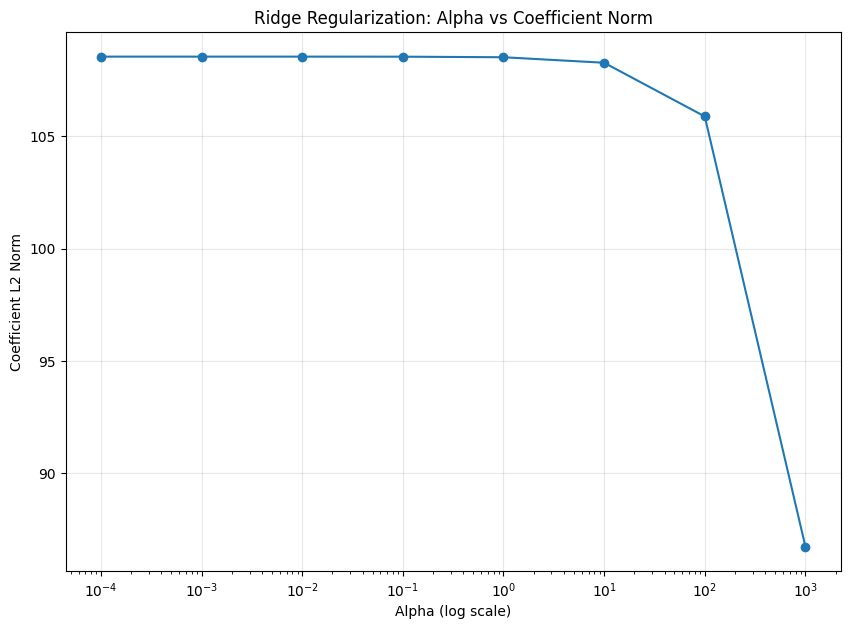

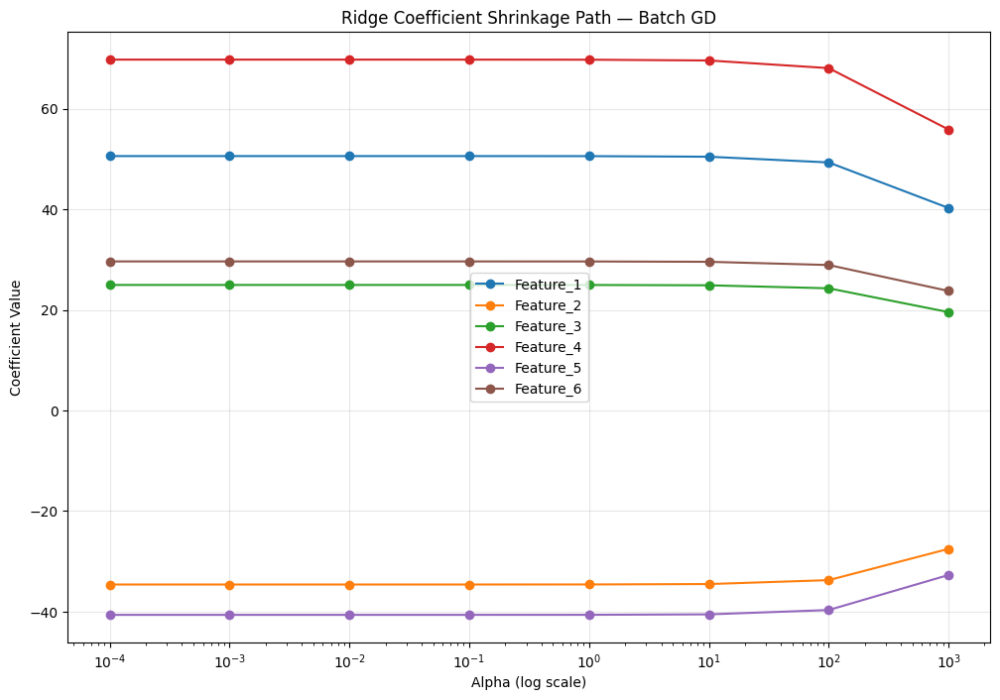

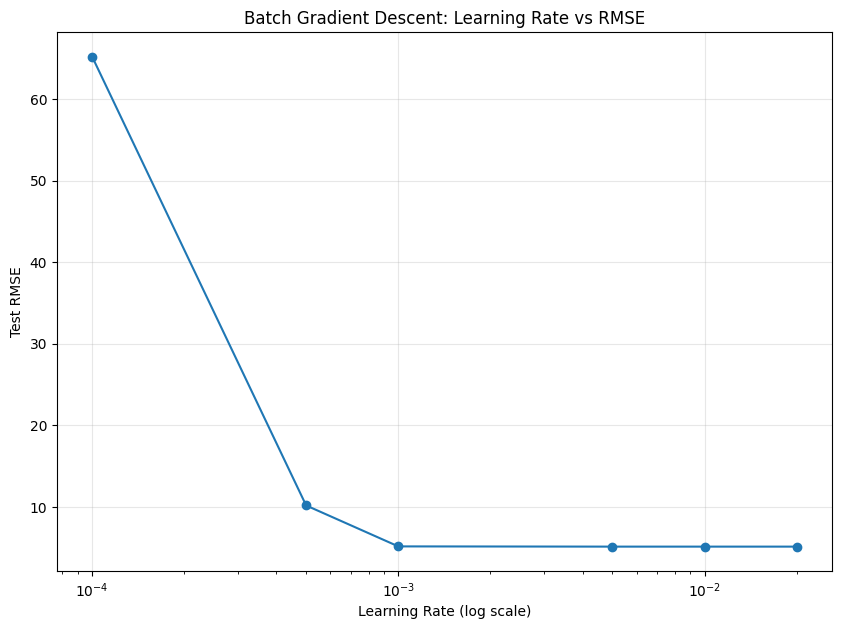

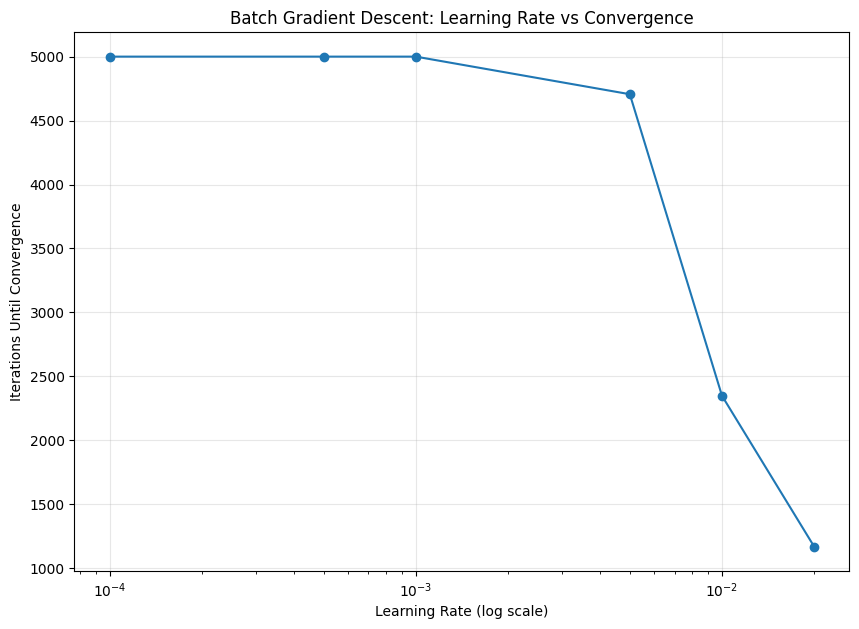



BEST ALPHA ANALYSIS
Best Alpha: 10.0
Best Test RMSE: 5.11950326738281
Corresponding Test R²: 0.9976964294799854


OPTIMIZATION INFORMATION
Learning Rate: 0.01
Maximum Iterations: 5000
Actual Iterations: 2348
Final Loss: 14.615818469724786
Final Gradient Norm: 9.96577072589976e-09


FINAL SUMMARY
Algorithm       : Ridge Regression
Optimization     : Batch Gradient Descent
Regularization   : L2 / Ridge
Alpha            : 1.0
Learning Rate    : 0.01
Training RMSE    : 5.127093833902245
Testing RMSE     : 5.12187291157122
Training R²      : 0.9977613363378561
Testing R²       : 0.9976942964973422
Adjusted Test R² : 0.9976803647541237
Test MAE         : 4.088903852019755
Test MSE         : 26.23358212228705
Explained Var.   : 0.9976949011181161
Best Alpha       : 10.0
Converged Iter.  : 2348


In [6]:
# ============================================================
# RIDGE REGRESSION FROM SCRATCH
# BATCH GRADIENT DESCENT BASED IMPLEMENTATION
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ============================================================
# 1. REPRODUCIBILITY
# ============================================================

np.random.seed(42)


# ============================================================
# 2. GENERATE LARGE SYNTHETIC REGRESSION DATASET
# ============================================================

n_samples = 5000
n_features = 6

true_intercept = 15.0

true_coefficients = np.array([
    5.0,
    -3.5,
    2.5,
    7.0,
    -4.0,
    3.0
])

# Generate features
X = np.random.normal(
    loc=0.0,
    scale=10.0,
    size=(n_samples, n_features)
)

# Generate noise
noise = np.random.normal(
    loc=0.0,
    scale=5.0,
    size=n_samples
)

# Generate target
y = (
    true_intercept
    + X @ true_coefficients
    + noise
)

print("=" * 75)
print("DATASET INFORMATION")
print("=" * 75)

print("X shape:", X.shape)
print("y shape:", y.shape)
print("Number of samples:", n_samples)
print("Number of features:", n_features)


# ============================================================
# 3. TRAIN / TEST SPLIT
# ============================================================

test_size = 0.20

indices = np.random.permutation(
    n_samples
)

test_count = int(
    n_samples * test_size
)

test_indices = indices[
    :test_count
]

train_indices = indices[
    test_count:
]

X_train = X[
    train_indices
]

X_test = X[
    test_indices
]

y_train = y[
    train_indices
]

y_test = y[
    test_indices
]

print("\nTrain samples:", X_train.shape[0])
print("Test samples :", X_test.shape[0])


# ============================================================
# 4. FEATURE STANDARDIZATION
# ============================================================

# Calculate statistics only from training data
X_mean = np.mean(
    X_train,
    axis=0
)

X_std = np.std(
    X_train,
    axis=0
)

# Avoid division by zero
X_std[X_std == 0] = 1.0

# Standardize training data
X_train_scaled = (
    X_train - X_mean
) / X_std

# Standardize test data using training statistics
X_test_scaled = (
    X_test - X_mean
) / X_std


# ============================================================
# 5. METRIC FUNCTIONS
# ============================================================

def mean_absolute_error(
    y_true,
    y_pred
):

    return np.mean(
        np.abs(
            y_true - y_pred
        )
    )


def mean_squared_error(
    y_true,
    y_pred
):

    return np.mean(
        (y_true - y_pred) ** 2
    )


def root_mean_squared_error(
    y_true,
    y_pred
):

    return np.sqrt(
        mean_squared_error(
            y_true,
            y_pred
        )
    )


def r2_score(
    y_true,
    y_pred
):

    ss_res = np.sum(
        (y_true - y_pred) ** 2
    )

    ss_tot = np.sum(
        (y_true - np.mean(y_true)) ** 2
    )

    return 1.0 - (
        ss_res / ss_tot
    )


def adjusted_r2_score(
    y_true,
    y_pred,
    n_features
):

    n = len(y_true)

    r2 = r2_score(
        y_true,
        y_pred
    )

    return (
        1.0
        -
        (
            (1.0 - r2)
            *
            (n - 1)
            /
            (n - n_features - 1)
        )
    )


def explained_variance_score(
    y_true,
    y_pred
):

    residual = (
        y_true - y_pred
    )

    return (
        1.0
        -
        (
            np.var(residual)
            /
            np.var(y_true)
        )
    )


# ============================================================
# 6. BATCH GRADIENT DESCENT RIDGE REGRESSION
# ============================================================

class RidgeRegressionBatchGD:

    def __init__(
        self,
        alpha=1.0,
        learning_rate=0.01,
        n_iterations=5000,
        tolerance=1e-8
    ):

        self.alpha = alpha

        self.learning_rate = learning_rate

        self.n_iterations = n_iterations

        self.tolerance = tolerance

        self.coef_ = None

        self.intercept_ = None

        self.loss_history_ = []

        self.gradient_norm_history_ = []

    # --------------------------------------------------------
    # FIT
    # --------------------------------------------------------

    def fit(
        self,
        X,
        y
    ):

        X = np.asarray(
            X,
            dtype=float
        )

        y = np.asarray(
            y,
            dtype=float
        )

        n_samples, n_features = X.shape

        # ----------------------------------------------------
        # Initialize parameters
        # ----------------------------------------------------

        self.coef_ = np.zeros(
            n_features
        )

        self.intercept_ = 0.0

        self.loss_history_ = []

        self.gradient_norm_history_ = []

        # ----------------------------------------------------
        # Batch Gradient Descent
        # ----------------------------------------------------

        for iteration in range(
            self.n_iterations
        ):

            # ------------------------------------------------
            # Prediction
            # ------------------------------------------------

            y_pred = (
                X @ self.coef_
                +
                self.intercept_
            )

            # ------------------------------------------------
            # Error
            # ------------------------------------------------

            error = (
                y_pred - y
            )

            # ------------------------------------------------
            # Gradient of MSE part
            # ------------------------------------------------

            dw = (
                (1.0 / n_samples)
                *
                (X.T @ error)
            )

            db = (
                (1.0 / n_samples)
                *
                np.sum(error)
            )

            # ------------------------------------------------
            # Ridge L2 regularization gradient
            #
            # IMPORTANT:
            # Intercept is NOT regularized.
            # ------------------------------------------------

            ridge_gradient = (
                (self.alpha / n_samples)
                *
                self.coef_
            )

            dw = (
                dw
                +
                ridge_gradient
            )

            # ------------------------------------------------
            # Gradient norm
            # ------------------------------------------------

            gradient_norm = np.sqrt(
                np.sum(dw ** 2)
                +
                db ** 2
            )

            self.gradient_norm_history_.append(
                gradient_norm
            )

            # ------------------------------------------------
            # Ridge objective
            # ------------------------------------------------

            mse_loss = (
                0.5
                *
                np.mean(
                    error ** 2
                )
            )

            ridge_penalty = (
                self.alpha
                /
                (2.0 * n_samples)
                *
                np.sum(
                    self.coef_ ** 2
                )
            )

            total_loss = (
                mse_loss
                +
                ridge_penalty
            )

            self.loss_history_.append(
                total_loss
            )

            # ------------------------------------------------
            # Parameter update
            # ------------------------------------------------

            self.coef_ -= (
                self.learning_rate
                *
                dw
            )

            self.intercept_ -= (
                self.learning_rate
                *
                db
            )

            # ------------------------------------------------
            # Convergence check
            # ------------------------------------------------

            if gradient_norm < self.tolerance:

                break

        return self

    # --------------------------------------------------------
    # PREDICT
    # --------------------------------------------------------

    def predict(
        self,
        X
    ):

        X = np.asarray(
            X,
            dtype=float
        )

        return (
            X @ self.coef_
            +
            self.intercept_
        )


# ============================================================
# 7. TRAIN RIDGE MODEL
# ============================================================

alpha = 1.0

learning_rate = 0.01

n_iterations = 5000

model = RidgeRegressionBatchGD(
    alpha=alpha,
    learning_rate=learning_rate,
    n_iterations=n_iterations
)

model.fit(
    X_train_scaled,
    y_train
)


# ============================================================
# 8. PREDICTIONS
# ============================================================

y_train_pred = model.predict(
    X_train_scaled
)

y_test_pred = model.predict(
    X_test_scaled
)


# ============================================================
# 9. TRAINING EVALUATION
# ============================================================

train_mae = mean_absolute_error(
    y_train,
    y_train_pred
)

train_mse = mean_squared_error(
    y_train,
    y_train_pred
)

train_rmse = root_mean_squared_error(
    y_train,
    y_train_pred
)

train_r2 = r2_score(
    y_train,
    y_train_pred
)

train_adj_r2 = adjusted_r2_score(
    y_train,
    y_train_pred,
    n_features
)

train_ev = explained_variance_score(
    y_train,
    y_train_pred
)


# ============================================================
# 10. TEST EVALUATION
# ============================================================

test_mae = mean_absolute_error(
    y_test,
    y_test_pred
)

test_mse = mean_squared_error(
    y_test,
    y_test_pred
)

test_rmse = root_mean_squared_error(
    y_test,
    y_test_pred
)

test_r2 = r2_score(
    y_test,
    y_test_pred
)

test_adj_r2 = adjusted_r2_score(
    y_test,
    y_test_pred,
    n_features
)

test_ev = explained_variance_score(
    y_test,
    y_test_pred
)


# ============================================================
# 11. EVALUATION TABLE
# ============================================================

print("\n")
print("=" * 75)
print("BATCH GD RIDGE REGRESSION EVALUATION")
print("=" * 75)

results = pd.DataFrame({

    "Metric": [
        "MAE",
        "MSE",
        "RMSE",
        "R²",
        "Adjusted R²",
        "Explained Variance"
    ],

    "Train": [
        train_mae,
        train_mse,
        train_rmse,
        train_r2,
        train_adj_r2,
        train_ev
    ],

    "Test": [
        test_mae,
        test_mse,
        test_rmse,
        test_r2,
        test_adj_r2,
        test_ev
    ]
})

print(
    results.to_string(
        index=False
    )
)


# ============================================================
# 12. MODEL PARAMETERS
# ============================================================

print("\n")
print("=" * 75)
print("MODEL PARAMETERS")
print("=" * 75)

print(
    "Intercept:",
    model.intercept_
)

coefficient_table = pd.DataFrame({

    "Feature": [
        f"Feature_{i+1}"
        for i in range(n_features)
    ],

    "True Coefficient":
        true_coefficients,

    "Learned Coefficient":
        model.coef_,

    "Absolute Difference":
        np.abs(
            true_coefficients
            -
            model.coef_
        )
})

print(
    coefficient_table.to_string(
        index=False
    )
)


# ============================================================
# 13. TRAINING LOSS CURVE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    model.loss_history_
)

plt.xlabel(
    "Iteration"
)

plt.ylabel(
    "Ridge Objective"
)

plt.title(
    "Batch Gradient Descent: Training Loss"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 14. GRADIENT NORM CONVERGENCE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogy(
    model.gradient_norm_history_
)

plt.xlabel(
    "Iteration"
)

plt.ylabel(
    "Gradient Norm"
)

plt.title(
    "Batch Gradient Descent: Gradient Convergence"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 15. ACTUAL VS PREDICTED
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.6
)

minimum = min(
    np.min(y_test),
    np.min(y_test_pred)
)

maximum = max(
    np.max(y_test),
    np.max(y_test_pred)
)

plt.plot(
    [minimum, maximum],
    [minimum, maximum],
    linestyle="--"
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Predicted Values"
)

plt.title(
    "Batch GD Ridge: Actual vs Predicted"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 16. RESIDUAL PLOT
# ============================================================

residuals = (
    y_test
    -
    y_test_pred
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test_pred,
    residuals,
    alpha=0.6
)

plt.axhline(
    y=0,
    linestyle="--"
)

plt.xlabel(
    "Predicted Values"
)

plt.ylabel(
    "Residuals"
)

plt.title(
    "Batch GD Ridge: Residual Plot"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 17. RESIDUAL DISTRIBUTION
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.hist(
    residuals,
    bins=40
)

plt.xlabel(
    "Residual"
)

plt.ylabel(
    "Frequency"
)

plt.title(
    "Batch GD Ridge: Residual Distribution"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 18. ABSOLUTE ERROR
# ============================================================

absolute_errors = np.abs(
    residuals
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test,
    absolute_errors,
    alpha=0.6
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Absolute Error"
)

plt.title(
    "Batch GD Ridge: Absolute Error"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 19. SORTED ACTUAL VS PREDICTED
# ============================================================

sort_indices = np.argsort(
    y_test
)

sorted_actual = (
    y_test[sort_indices]
)

sorted_predicted = (
    y_test_pred[sort_indices]
)

plt.figure(
    figsize=(12, 7)
)

plt.plot(
    sorted_actual,
    label="Actual"
)

plt.plot(
    sorted_predicted,
    label="Predicted"
)

plt.xlabel(
    "Sorted Test Sample Index"
)

plt.ylabel(
    "Target Value"
)

plt.title(
    "Batch GD Ridge: Sorted Actual vs Predicted"
)

plt.legend()

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 20. TRUE VS LEARNED COEFFICIENTS
# ============================================================

feature_names = [
    f"Feature_{i+1}"
    for i in range(n_features)
]

x_positions = np.arange(
    n_features
)

width = 0.35

plt.figure(
    figsize=(12, 7)
)

plt.bar(
    x_positions - width / 2,
    true_coefficients,
    width,
    label="True"
)

plt.bar(
    x_positions + width / 2,
    model.coef_,
    width,
    label="Batch GD Ridge"
)

plt.xticks(
    x_positions,
    feature_names
)

plt.xlabel(
    "Features"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "True vs Learned Coefficients"
)

plt.legend()

plt.grid(
    axis="y",
    alpha=0.3
)

plt.show()


# ============================================================
# 21. ALPHA ANALYSIS
# ============================================================

alphas = np.array([
    0.0001,
    0.001,
    0.01,
    0.1,
    1.0,
    10.0,
    100.0,
    1000.0
])

alpha_rmse = []

alpha_r2 = []

alpha_coefficient_norm = []

alpha_models = []


for current_alpha in alphas:

    current_model = RidgeRegressionBatchGD(
        alpha=current_alpha,
        learning_rate=0.01,
        n_iterations=5000,
        tolerance=1e-8
    )

    current_model.fit(
        X_train_scaled,
        y_train
    )

    current_pred = (
        current_model.predict(
            X_test_scaled
        )
    )

    current_rmse = (
        root_mean_squared_error(
            y_test,
            current_pred
        )
    )

    current_r2 = (
        r2_score(
            y_test,
            current_pred
        )
    )

    coefficient_norm = np.linalg.norm(
        current_model.coef_
    )

    alpha_rmse.append(
        current_rmse
    )

    alpha_r2.append(
        current_r2
    )

    alpha_coefficient_norm.append(
        coefficient_norm
    )

    alpha_models.append(
        current_model
    )


# ============================================================
# 22. ALPHA VS RMSE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    alphas,
    alpha_rmse,
    marker="o"
)

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "Ridge Regularization: Alpha vs RMSE"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 23. ALPHA VS R²
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    alphas,
    alpha_r2,
    marker="o"
)

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Test R²"
)

plt.title(
    "Ridge Regularization: Alpha vs R²"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 24. ALPHA VS COEFFICIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    alphas,
    alpha_coefficient_norm,
    marker="o"
)

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Coefficient L2 Norm"
)

plt.title(
    "Ridge Regularization: Alpha vs Coefficient Norm"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 25. COEFFICIENT SHRINKAGE PATH
# ============================================================

coefficient_paths = np.array([
    current_model.coef_
    for current_model in alpha_models
])

plt.figure(
    figsize=(12, 8)
)

for j in range(
    n_features
):

    plt.semilogx(
        alphas,
        coefficient_paths[:, j],
        marker="o",
        label=f"Feature_{j+1}"
    )

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "Ridge Coefficient Shrinkage Path — Batch GD"
)

plt.legend()

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 26. LEARNING RATE ANALYSIS
# ============================================================

learning_rates = np.array([
    0.0001,
    0.0005,
    0.001,
    0.005,
    0.01,
    0.02
])

lr_rmse = []

lr_iterations = []

lr_models = []


for current_lr in learning_rates:

    lr_model = RidgeRegressionBatchGD(
        alpha=1.0,
        learning_rate=current_lr,
        n_iterations=5000,
        tolerance=1e-8
    )

    lr_model.fit(
        X_train_scaled,
        y_train
    )

    lr_pred = lr_model.predict(
        X_test_scaled
    )

    lr_rmse.append(
        root_mean_squared_error(
            y_test,
            lr_pred
        )
    )

    lr_iterations.append(
        len(
            lr_model.loss_history_
        )
    )

    lr_models.append(
        lr_model
    )


# ============================================================
# 27. LEARNING RATE VS RMSE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    learning_rates,
    lr_rmse,
    marker="o"
)

plt.xlabel(
    "Learning Rate (log scale)"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "Batch Gradient Descent: Learning Rate vs RMSE"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 28. LEARNING RATE VS CONVERGENCE ITERATIONS
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    learning_rates,
    lr_iterations,
    marker="o"
)

plt.xlabel(
    "Learning Rate (log scale)"
)

plt.ylabel(
    "Iterations Until Convergence"
)

plt.title(
    "Batch Gradient Descent: Learning Rate vs Convergence"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 29. FIND BEST ALPHA
# ============================================================

best_index = np.argmin(
    alpha_rmse
)

best_alpha = alphas[
    best_index
]

best_rmse = alpha_rmse[
    best_index
]

best_r2 = alpha_r2[
    best_index
]


print("\n")
print("=" * 75)
print("BEST ALPHA ANALYSIS")
print("=" * 75)

print(
    "Best Alpha:",
    best_alpha
)

print(
    "Best Test RMSE:",
    best_rmse
)

print(
    "Corresponding Test R²:",
    best_r2
)


# ============================================================
# 30. CONVERGENCE INFORMATION
# ============================================================

print("\n")
print("=" * 75)
print("OPTIMIZATION INFORMATION")
print("=" * 75)

print(
    "Learning Rate:",
    model.learning_rate
)

print(
    "Maximum Iterations:",
    model.n_iterations
)

print(
    "Actual Iterations:",
    len(model.loss_history_)
)

print(
    "Final Loss:",
    model.loss_history_[-1]
)

print(
    "Final Gradient Norm:",
    model.gradient_norm_history_[-1]
)


# ============================================================
# 31. FINAL SUMMARY
# ============================================================

print("\n")
print("=" * 75)
print("FINAL SUMMARY")
print("=" * 75)

print(
    "Algorithm       : Ridge Regression"
)

print(
    "Optimization     : Batch Gradient Descent"
)

print(
    "Regularization   : L2 / Ridge"
)

print(
    "Alpha            :",
    alpha
)

print(
    "Learning Rate    :",
    learning_rate
)

print(
    "Training RMSE    :",
    train_rmse
)

print(
    "Testing RMSE     :",
    test_rmse
)

print(
    "Training R²      :",
    train_r2
)

print(
    "Testing R²       :",
    test_r2
)

print(
    "Adjusted Test R² :",
    test_adj_r2
)

print(
    "Test MAE         :",
    test_mae
)

print(
    "Test MSE         :",
    test_mse
)

print(
    "Explained Var.   :",
    test_ev
)

print(
    "Best Alpha       :",
    best_alpha
)

print(
    "Converged Iter.  :",
    len(model.loss_history_)
)

print("=" * 75)

DATASET INFORMATION
X shape: (5000, 6)
y shape: (5000,)
Number of samples: 5000
Number of features: 6

Train samples: 4000
Test samples : 1000


STOCHASTIC GD RIDGE REGRESSION EVALUATION
            Metric     Train      Test
               MAE  4.085430  4.088666
               MSE 26.307478 26.278416
              RMSE  5.129082  5.126248
                R²  0.997760  0.997690
       Adjusted R²  0.997756  0.997676
Explained Variance  0.997761  0.997690


MODEL PARAMETERS
Intercept: 15.031655546922151
  Feature  True Coefficient  Learned Coefficient  Absolute Difference
Feature_1               5.0            50.526561            45.526561
Feature_2              -3.5           -34.598396            31.098396
Feature_3               2.5            24.979244            22.479244
Feature_4               7.0            69.733914            62.733914
Feature_5              -4.0           -40.635566            36.635566
Feature_6               3.0            29.670636            26.670636


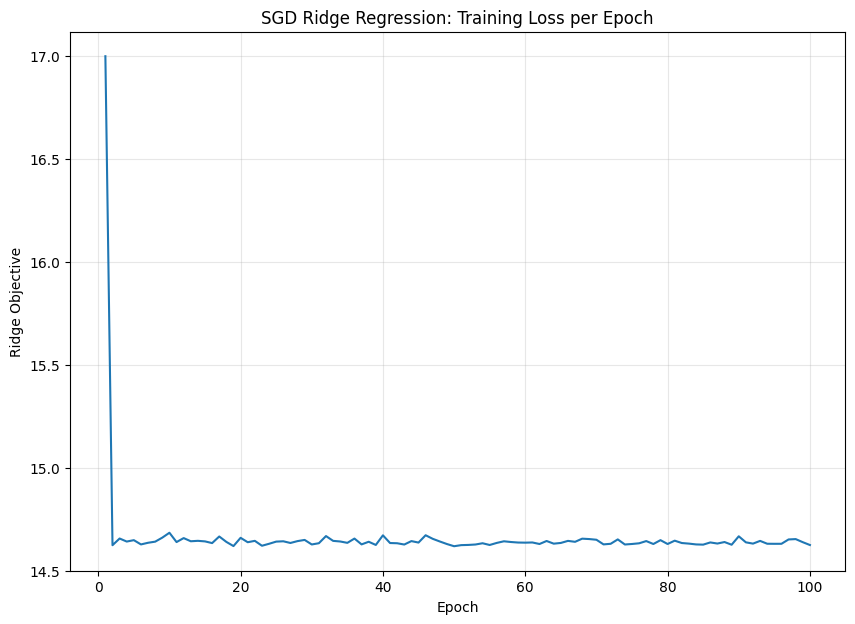

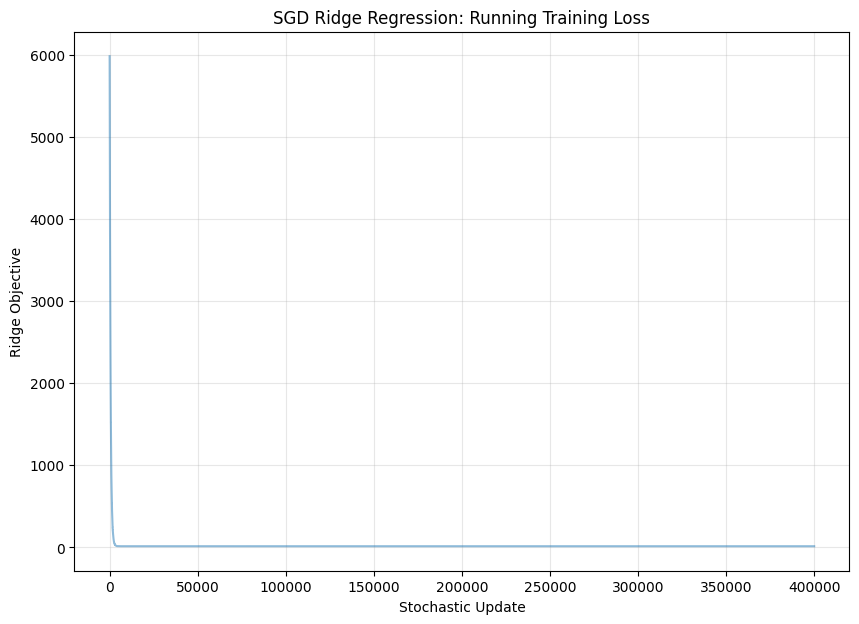

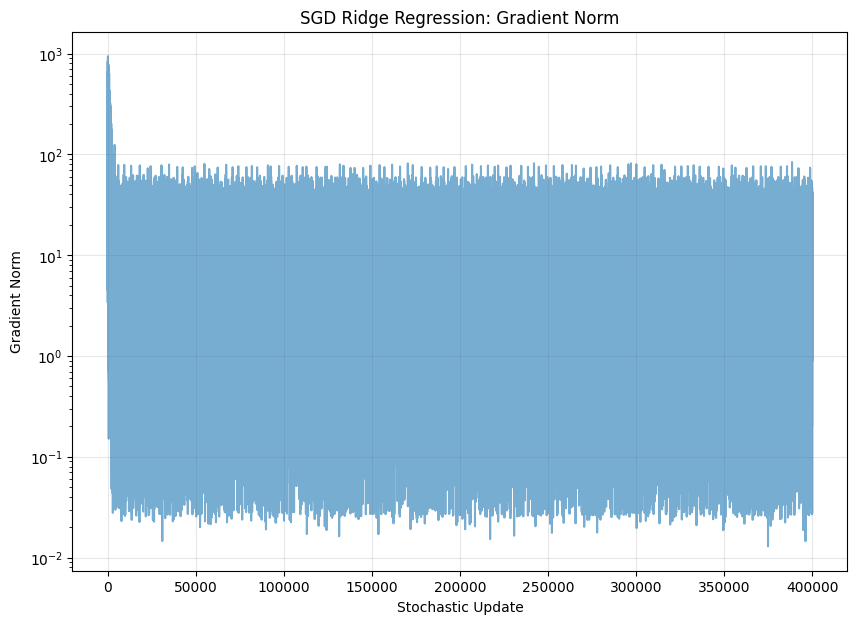

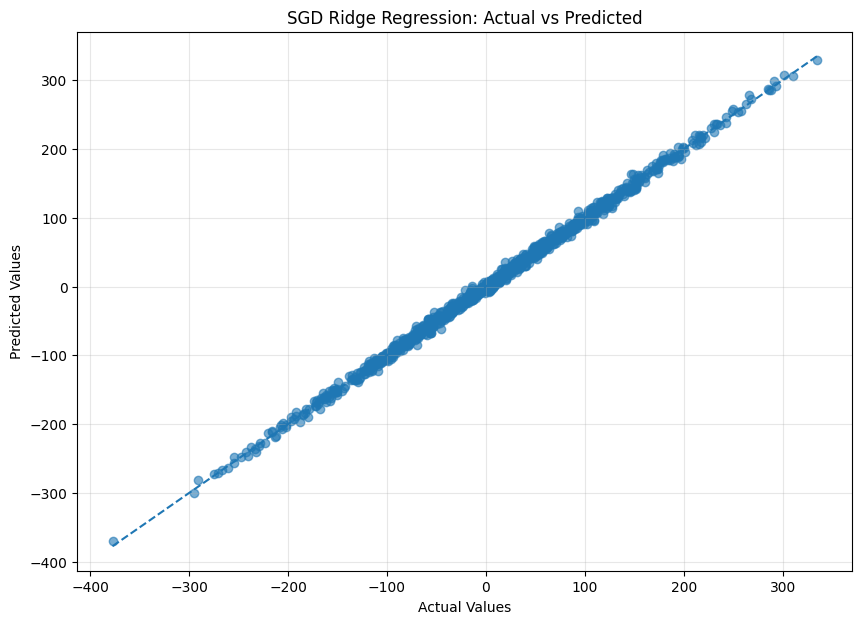

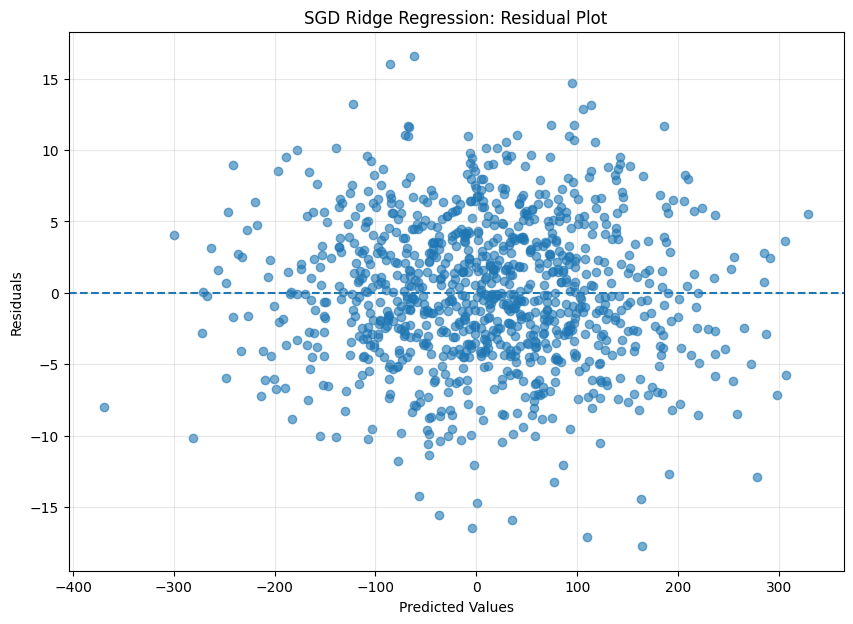

...

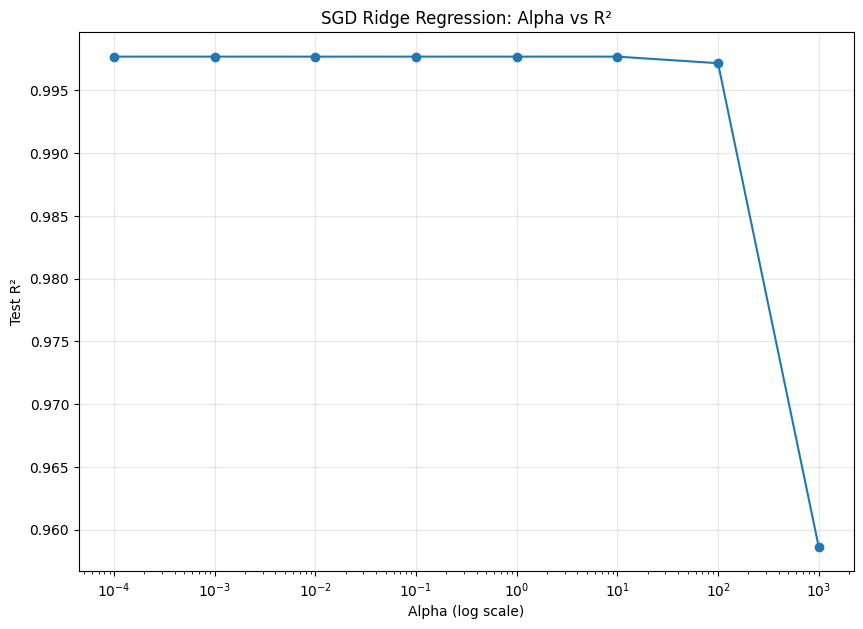

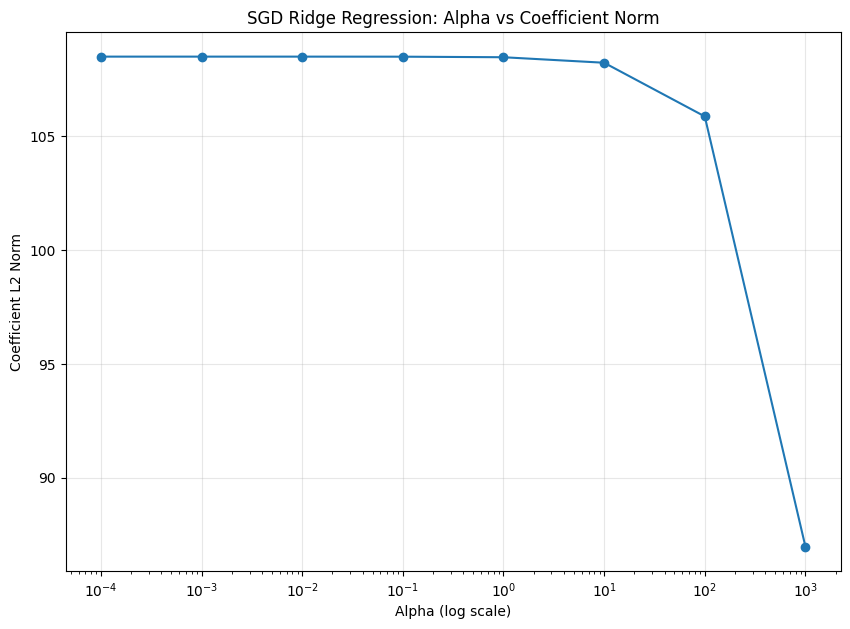

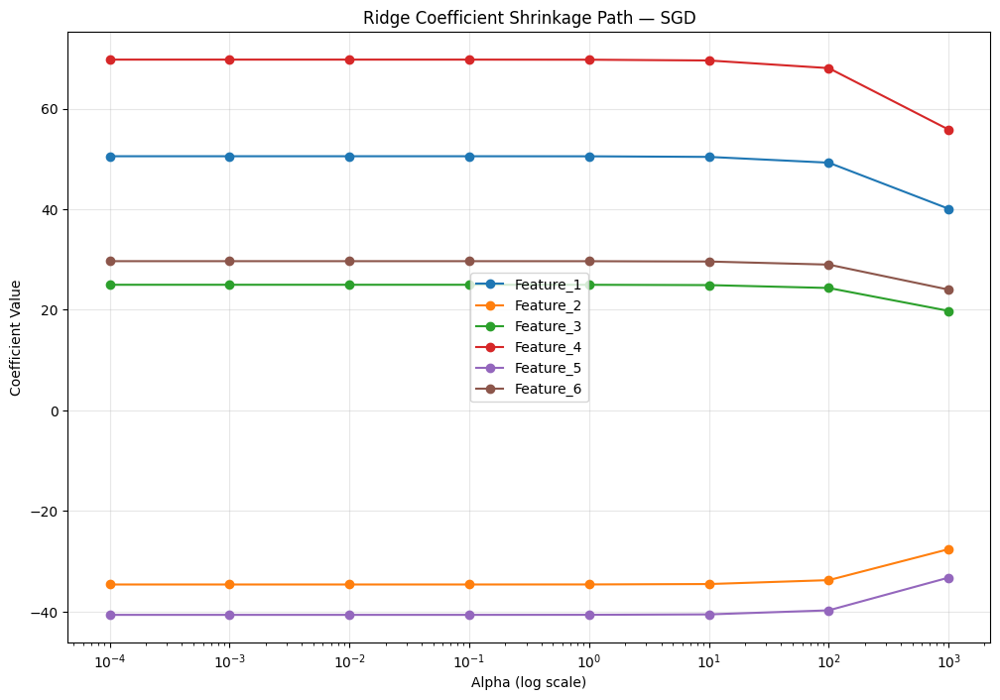

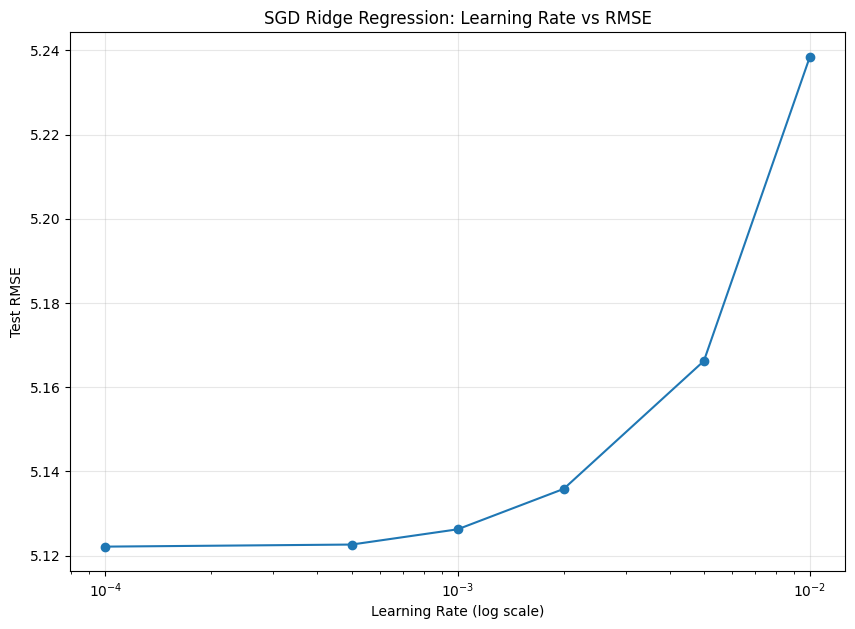

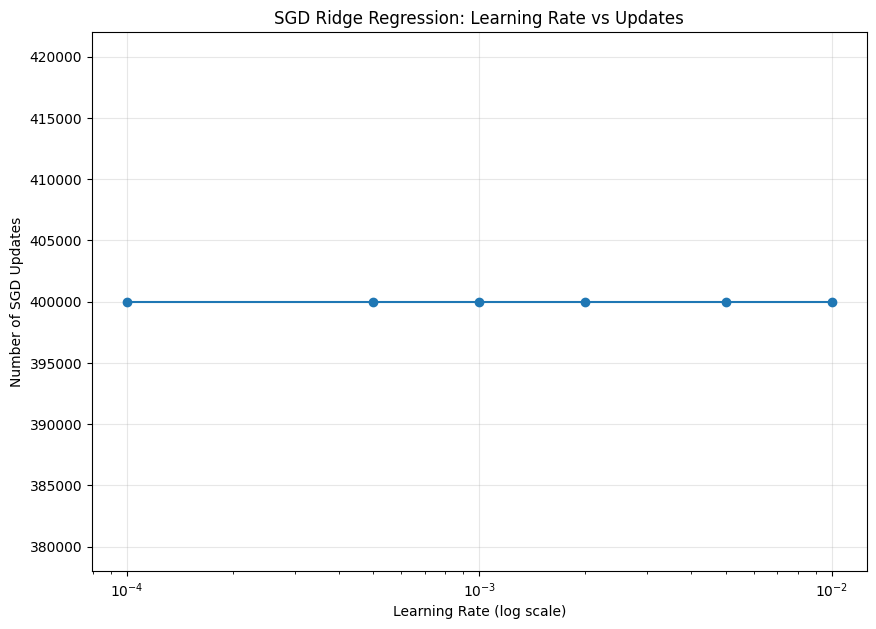



BEST ALPHA ANALYSIS
Best Alpha: 10.0
Best Test RMSE: 5.126100178941814
Corresponding Test R²: 0.9976904889653884


OPTIMIZATION INFORMATION
Learning Rate: 0.001
Number of Epochs: 100
Number of Training Samples: 4000
Total SGD Updates: 400000
Final Epoch Loss: 14.62478394052714
Final Gradient Norm: 42.08138998213689


FINAL SUMMARY
Algorithm       : Ridge Regression
Optimization     : Stochastic Gradient Descent
Regularization   : L2 / Ridge
Alpha            : 1.0
Learning Rate    : 0.001
Epochs           : 100
Training RMSE    : 5.129081591765852
Testing RMSE     : 5.12624770492443
Training R²      : 0.997759600155897
Testing R²       : 0.9976903560308863
Adjusted Test R² : 0.9976764004782028
Test MAE         : 4.0886660980729665
Test MSE         : 26.278415532242988
Explained Var.   : 0.9976904010162482
Best Alpha       : 10.0
Total SGD Updates: 400000


In [14]:
# ============================================================
# RIDGE REGRESSION FROM SCRATCH
# STOCHASTIC GRADIENT DESCENT (SGD) BASED IMPLEMENTATION
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ============================================================
# 1. REPRODUCIBILITY
# ============================================================

np.random.seed(42)


# ============================================================
# 2. GENERATE LARGE SYNTHETIC REGRESSION DATASET
# ============================================================

n_samples = 5000
n_features = 6

true_intercept = 15.0

true_coefficients = np.array([
    5.0,
    -3.5,
    2.5,
    7.0,
    -4.0,
    3.0
])

# Generate features
X = np.random.normal(
    loc=0.0,
    scale=10.0,
    size=(n_samples, n_features)
)

# Generate noise
noise = np.random.normal(
    loc=0.0,
    scale=5.0,
    size=n_samples
)

# Generate target
y = (
    true_intercept
    + X @ true_coefficients
    + noise
)

print("=" * 75)
print("DATASET INFORMATION")
print("=" * 75)

print("X shape:", X.shape)
print("y shape:", y.shape)
print("Number of samples:", n_samples)
print("Number of features:", n_features)


# ============================================================
# 3. TRAIN / TEST SPLIT
# ============================================================

test_size = 0.20

indices = np.random.permutation(
    n_samples
)

test_count = int(
    n_samples * test_size
)

test_indices = indices[
    :test_count
]

train_indices = indices[
    test_count:
]

X_train = X[
    train_indices
]

X_test = X[
    test_indices
]

y_train = y[
    train_indices
]

y_test = y[
    test_indices
]

print("\nTrain samples:", X_train.shape[0])
print("Test samples :", X_test.shape[0])


# ============================================================
# 4. FEATURE STANDARDIZATION
# ============================================================

# Calculate statistics only from training data
X_mean = np.mean(
    X_train,
    axis=0
)

X_std = np.std(
    X_train,
    axis=0
)

# Avoid division by zero
X_std[X_std == 0] = 1.0

# Standardize training data
X_train_scaled = (
    X_train - X_mean
) / X_std

# Standardize test data using training statistics
X_test_scaled = (
    X_test - X_mean
) / X_std


# ============================================================
# 5. METRIC FUNCTIONS
# ============================================================

def mean_absolute_error(
    y_true,
    y_pred
):

    return np.mean(
        np.abs(
            y_true - y_pred
        )
    )


def mean_squared_error(
    y_true,
    y_pred
):

    return np.mean(
        (y_true - y_pred) ** 2
    )


def root_mean_squared_error(
    y_true,
    y_pred
):

    return np.sqrt(
        mean_squared_error(
            y_true,
            y_pred
        )
    )


def r2_score(
    y_true,
    y_pred
):

    ss_res = np.sum(
        (y_true - y_pred) ** 2
    )

    ss_tot = np.sum(
        (y_true - np.mean(y_true)) ** 2
    )

    return 1.0 - (
        ss_res / ss_tot
    )


def adjusted_r2_score(
    y_true,
    y_pred,
    n_features
):

    n = len(y_true)

    r2 = r2_score(
        y_true,
        y_pred
    )

    return (
        1.0
        -
        (
            (1.0 - r2)
            *
            (n - 1)
            /
            (n - n_features - 1)
        )
    )


def explained_variance_score(
    y_true,
    y_pred
):

    residual = (
        y_true - y_pred
    )

    variance_residual = np.var(
        residual
    )

    variance_y = np.var(
        y_true
    )

    return 1.0 - (
        variance_residual
        /
        variance_y
    )


# ============================================================
# 6. STOCHASTIC GRADIENT DESCENT RIDGE REGRESSION
# ============================================================

class RidgeRegressionSGD:

    def __init__(
        self,
        alpha=1.0,
        learning_rate=0.001,
        n_epochs=100,
        shuffle=True,
        random_state=42
    ):

        self.alpha = alpha

        self.learning_rate = learning_rate

        self.n_epochs = n_epochs

        self.shuffle = shuffle

        self.random_state = random_state

        self.coef_ = None

        self.intercept_ = None

        self.loss_history_ = []

        self.gradient_norm_history_ = []

        self.epoch_loss_history_ = []

    # --------------------------------------------------------
    # FIT
    # --------------------------------------------------------

    def fit(
        self,
        X,
        y
    ):

        X = np.asarray(
            X,
            dtype=float
        )

        y = np.asarray(
            y,
            dtype=float
        )

        n_samples, n_features = X.shape

        # ----------------------------------------------------
        # Initialize parameters
        # ----------------------------------------------------

        self.coef_ = np.zeros(
            n_features
        )

        self.intercept_ = 0.0

        self.loss_history_ = []

        self.gradient_norm_history_ = []

        self.epoch_loss_history_ = []

        # Random number generator
        rng = np.random.default_rng(
            self.random_state
        )

        # ----------------------------------------------------
        # EPOCH LOOP
        # ----------------------------------------------------

        for epoch in range(
            self.n_epochs
        ):

            # ------------------------------------------------
            # Shuffle training data
            # ------------------------------------------------

            if self.shuffle:

                indices = rng.permutation(
                    n_samples
                )

            else:

                indices = np.arange(
                    n_samples
                )

            epoch_loss = 0.0

            # ------------------------------------------------
            # STOCHASTIC UPDATES
            # ------------------------------------------------

            for index in indices:

                # Select ONE training sample
                x_i = X[index]

                y_i = y[index]

                # --------------------------------------------
                # Prediction
                # --------------------------------------------

                y_pred_i = (
                    x_i @ self.coef_
                    +
                    self.intercept_
                )

                # --------------------------------------------
                # Error
                # --------------------------------------------

                error_i = (
                    y_pred_i - y_i
                )

                # --------------------------------------------
                # Gradient for ONE sample
                # --------------------------------------------

                dw = (
                    error_i
                    *
                    x_i
                )

                db = error_i

                # --------------------------------------------
                # Ridge L2 regularization
                #
                # IMPORTANT:
                # Intercept is NOT regularized.
                # --------------------------------------------

                ridge_gradient = (
                    (self.alpha / n_samples)
                    *
                    self.coef_
                )

                dw = (
                    dw
                    +
                    ridge_gradient
                )

                # --------------------------------------------
                # Gradient norm
                # --------------------------------------------

                gradient_norm = np.sqrt(
                    np.sum(dw ** 2)
                    +
                    db ** 2
                )

                self.gradient_norm_history_.append(
                    gradient_norm
                )

                # --------------------------------------------
                # Update coefficients
                # --------------------------------------------

                self.coef_ -= (
                    self.learning_rate
                    *
                    dw
                )

                # --------------------------------------------
                # Update intercept
                # --------------------------------------------

                self.intercept_ -= (
                    self.learning_rate
                    *
                    db
                )

                # --------------------------------------------
                # Sample squared loss
                # --------------------------------------------

                sample_loss = (
                    0.5
                    *
                    error_i ** 2
                )

                epoch_loss += sample_loss

                # --------------------------------------------
                # Store running loss
                # --------------------------------------------

                current_prediction = (
                    X @ self.coef_
                    +
                    self.intercept_
                )

                current_error = (
                    current_prediction - y
                )

                current_mse_loss = (
                    0.5
                    *
                    np.mean(
                        current_error ** 2
                    )
                )

                current_ridge_penalty = (
                    self.alpha
                    /
                    (2.0 * n_samples)
                    *
                    np.sum(
                        self.coef_ ** 2
                    )
                )

                current_total_loss = (
                    current_mse_loss
                    +
                    current_ridge_penalty
                )

                self.loss_history_.append(
                    current_total_loss
                )

            # ------------------------------------------------
            # Full epoch Ridge objective
            # ------------------------------------------------

            epoch_prediction = (
                X @ self.coef_
                +
                self.intercept_
            )

            epoch_error = (
                epoch_prediction - y
            )

            epoch_mse = (
                0.5
                *
                np.mean(
                    epoch_error ** 2
                )
            )

            epoch_ridge = (
                self.alpha
                /
                (2.0 * n_samples)
                *
                np.sum(
                    self.coef_ ** 2
                )
            )

            total_epoch_loss = (
                epoch_mse
                +
                epoch_ridge
            )

            self.epoch_loss_history_.append(
                total_epoch_loss
            )

        return self

    # --------------------------------------------------------
    # PREDICT
    # --------------------------------------------------------

    def predict(
        self,
        X
    ):

        X = np.asarray(
            X,
            dtype=float
        )

        return (
            X @ self.coef_
            +
            self.intercept_
        )


# ============================================================
# 7. TRAIN MODEL
# ============================================================

alpha = 1.0

learning_rate = 0.001

n_epochs = 100

model = RidgeRegressionSGD(
    alpha=alpha,
    learning_rate=learning_rate,
    n_epochs=n_epochs,
    shuffle=True,
    random_state=42
)

model.fit(
    X_train_scaled,
    y_train
)


# ============================================================
# 8. PREDICTIONS
# ============================================================

y_train_pred = model.predict(
    X_train_scaled
)

y_test_pred = model.predict(
    X_test_scaled
)


# ============================================================
# 9. TRAIN EVALUATION
# ============================================================

train_mae = mean_absolute_error(
    y_train,
    y_train_pred
)

train_mse = mean_squared_error(
    y_train,
    y_train_pred
)

train_rmse = root_mean_squared_error(
    y_train,
    y_train_pred
)

train_r2 = r2_score(
    y_train,
    y_train_pred
)

train_adj_r2 = adjusted_r2_score(
    y_train,
    y_train_pred,
    n_features
)

train_ev = explained_variance_score(
    y_train,
    y_train_pred
)


# ============================================================
# 10. TEST EVALUATION
# ============================================================

test_mae = mean_absolute_error(
    y_test,
    y_test_pred
)

test_mse = mean_squared_error(
    y_test,
    y_test_pred
)

test_rmse = root_mean_squared_error(
    y_test,
    y_test_pred
)

test_r2 = r2_score(
    y_test,
    y_test_pred
)

test_adj_r2 = adjusted_r2_score(
    y_test,
    y_test_pred,
    n_features
)

test_ev = explained_variance_score(
    y_test,
    y_test_pred
)


# ============================================================
# 11. EVALUATION TABLE
# ============================================================

print("\n")
print("=" * 75)
print("STOCHASTIC GD RIDGE REGRESSION EVALUATION")
print("=" * 75)

results = pd.DataFrame({

    "Metric": [
        "MAE",
        "MSE",
        "RMSE",
        "R²",
        "Adjusted R²",
        "Explained Variance"
    ],

    "Train": [
        train_mae,
        train_mse,
        train_rmse,
        train_r2,
        train_adj_r2,
        train_ev
    ],

    "Test": [
        test_mae,
        test_mse,
        test_rmse,
        test_r2,
        test_adj_r2,
        test_ev
    ]
})

print(
    results.to_string(
        index=False
    )
)


# ============================================================
# 12. MODEL PARAMETERS
# ============================================================

print("\n")
print("=" * 75)
print("MODEL PARAMETERS")
print("=" * 75)

print(
    "Intercept:",
    model.intercept_
)

coefficient_table = pd.DataFrame({

    "Feature": [
        f"Feature_{i+1}"
        for i in range(n_features)
    ],

    "True Coefficient":
        true_coefficients,

    "Learned Coefficient":
        model.coef_,

    "Absolute Difference":
        np.abs(
            true_coefficients
            -
            model.coef_
        )
})

print(
    coefficient_table.to_string(
        index=False
    )
)


# ============================================================
# 13. TRAINING LOSS PER EPOCH
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    range(
        1,
        len(model.epoch_loss_history_) + 1
    ),
    model.epoch_loss_history_
)

plt.xlabel(
    "Epoch"
)

plt.ylabel(
    "Ridge Objective"
)

plt.title(
    "SGD Ridge Regression: Training Loss per Epoch"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 14. RUNNING LOSS DURING STOCHASTIC UPDATES
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    model.loss_history_,
    alpha=0.5
)

plt.xlabel(
    "Stochastic Update"
)

plt.ylabel(
    "Ridge Objective"
)

plt.title(
    "SGD Ridge Regression: Running Training Loss"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 15. GRADIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogy(
    model.gradient_norm_history_,
    alpha=0.6
)

plt.xlabel(
    "Stochastic Update"
)

plt.ylabel(
    "Gradient Norm"
)

plt.title(
    "SGD Ridge Regression: Gradient Norm"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 16. ACTUAL VS PREDICTED
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.6
)

minimum = min(
    np.min(y_test),
    np.min(y_test_pred)
)

maximum = max(
    np.max(y_test),
    np.max(y_test_pred)
)

plt.plot(
    [minimum, maximum],
    [minimum, maximum],
    linestyle="--"
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Predicted Values"
)

plt.title(
    "SGD Ridge Regression: Actual vs Predicted"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 17. RESIDUAL PLOT
# ============================================================

residuals = (
    y_test - y_test_pred
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test_pred,
    residuals,
    alpha=0.6
)

plt.axhline(
    y=0,
    linestyle="--"
)

plt.xlabel(
    "Predicted Values"
)

plt.ylabel(
    "Residuals"
)

plt.title(
    "SGD Ridge Regression: Residual Plot"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 18. RESIDUAL DISTRIBUTION
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.hist(
    residuals,
    bins=40
)

plt.xlabel(
    "Residual"
)

plt.ylabel(
    "Frequency"
)

plt.title(
    "SGD Ridge Regression: Residual Distribution"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 19. ABSOLUTE ERROR
# ============================================================

absolute_errors = np.abs(
    residuals
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test,
    absolute_errors,
    alpha=0.6
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Absolute Error"
)

plt.title(
    "SGD Ridge Regression: Absolute Error"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 20. SORTED ACTUAL VS PREDICTED
# ============================================================

sort_indices = np.argsort(
    y_test
)

sorted_actual = (
    y_test[sort_indices]
)

sorted_predicted = (
    y_test_pred[sort_indices]
)

plt.figure(
    figsize=(12, 7)
)

plt.plot(
    sorted_actual,
    label="Actual"
)

plt.plot(
    sorted_predicted,
    label="Predicted"
)

plt.xlabel(
    "Sorted Test Sample Index"
)

plt.ylabel(
    "Target Value"
)

plt.title(
    "SGD Ridge Regression: Sorted Actual vs Predicted"
)

plt.legend()

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 21. TRUE VS LEARNED COEFFICIENTS
# ============================================================

feature_names = [
    f"Feature_{i+1}"
    for i in range(n_features)
]

x_positions = np.arange(
    n_features
)

width = 0.35

plt.figure(
    figsize=(12, 7)
)

plt.bar(
    x_positions - width / 2,
    true_coefficients,
    width,
    label="True"
)

plt.bar(
    x_positions + width / 2,
    model.coef_,
    width,
    label="SGD Ridge"
)

plt.xticks(
    x_positions,
    feature_names
)

plt.xlabel(
    "Features"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "True vs Learned Coefficients"
)

plt.legend()

plt.grid(
    axis="y",
    alpha=0.3
)

plt.show()


# ============================================================
# 22. ALPHA ANALYSIS
# ============================================================

alphas = np.array([
    0.0001,
    0.001,
    0.01,
    0.1,
    1.0,
    10.0,
    100.0,
    1000.0
])

alpha_rmse = []

alpha_r2 = []

alpha_coefficient_norm = []

alpha_models = []


for current_alpha in alphas:

    current_model = RidgeRegressionSGD(
        alpha=current_alpha,
        learning_rate=0.001,
        n_epochs=100,
        shuffle=True,
        random_state=42
    )

    current_model.fit(
        X_train_scaled,
        y_train
    )

    current_pred = (
        current_model.predict(
            X_test_scaled
        )
    )

    current_rmse = (
        root_mean_squared_error(
            y_test,
            current_pred
        )
    )

    current_r2 = (
        r2_score(
            y_test,
            current_pred
        )
    )

    coefficient_norm = np.linalg.norm(
        current_model.coef_
    )

    alpha_rmse.append(
        current_rmse
    )

    alpha_r2.append(
        current_r2
    )

    alpha_coefficient_norm.append(
        coefficient_norm
    )

    alpha_models.append(
        current_model
    )


# ============================================================
# 23. ALPHA VS RMSE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    alphas,
    alpha_rmse,
    marker="o"
)

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "SGD Ridge Regression: Alpha vs RMSE"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 24. ALPHA VS R²
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    alphas,
    alpha_r2,
    marker="o"
)

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Test R²"
)

plt.title(
    "SGD Ridge Regression: Alpha vs R²"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 25. ALPHA VS COEFFICIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    alphas,
    alpha_coefficient_norm,
    marker="o"
)

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Coefficient L2 Norm"
)

plt.title(
    "SGD Ridge Regression: Alpha vs Coefficient Norm"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 26. COEFFICIENT SHRINKAGE PATH
# ============================================================

coefficient_paths = np.array([
    current_model.coef_
    for current_model in alpha_models
])

plt.figure(
    figsize=(12, 8)
)

for j in range(
    n_features
):

    plt.semilogx(
        alphas,
        coefficient_paths[:, j],
        marker="o",
        label=f"Feature_{j+1}"
    )

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "Ridge Coefficient Shrinkage Path — SGD"
)

plt.legend()

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 27. LEARNING RATE ANALYSIS
# ============================================================

learning_rates = np.array([
    0.0001,
    0.0005,
    0.001,
    0.002,
    0.005,
    0.01
])

lr_rmse = []

lr_iterations = []

lr_models = []


for current_lr in learning_rates:

    lr_model = RidgeRegressionSGD(
        alpha=1.0,
        learning_rate=current_lr,
        n_epochs=100,
        shuffle=True,
        random_state=42
    )

    lr_model.fit(
        X_train_scaled,
        y_train
    )

    lr_pred = lr_model.predict(
        X_test_scaled
    )

    lr_rmse.append(
        root_mean_squared_error(
            y_test,
            lr_pred
        )
    )

    lr_iterations.append(
        len(
            lr_model.loss_history_
        )
    )

    lr_models.append(
        lr_model
    )


# ============================================================
# 28. LEARNING RATE VS RMSE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    learning_rates,
    lr_rmse,
    marker="o"
)

plt.xlabel(
    "Learning Rate (log scale)"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "SGD Ridge Regression: Learning Rate vs RMSE"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 29. LEARNING RATE VS NUMBER OF UPDATES
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    learning_rates,
    lr_iterations,
    marker="o"
)

plt.xlabel(
    "Learning Rate (log scale)"
)

plt.ylabel(
    "Number of SGD Updates"
)

plt.title(
    "SGD Ridge Regression: Learning Rate vs Updates"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 30. FIND BEST ALPHA
# ============================================================

best_index = np.argmin(
    alpha_rmse
)

best_alpha = alphas[
    best_index
]

best_rmse = alpha_rmse[
    best_index
]

best_r2 = alpha_r2[
    best_index
]


print("\n")
print("=" * 75)
print("BEST ALPHA ANALYSIS")
print("=" * 75)

print(
    "Best Alpha:",
    best_alpha
)

print(
    "Best Test RMSE:",
    best_rmse
)

print(
    "Corresponding Test R²:",
    best_r2
)


# ============================================================
# 31. OPTIMIZATION INFORMATION
# ============================================================

print("\n")
print("=" * 75)
print("OPTIMIZATION INFORMATION")
print("=" * 75)

print(
    "Learning Rate:",
    model.learning_rate
)

print(
    "Number of Epochs:",
    model.n_epochs
)

print(
    "Number of Training Samples:",
    X_train_scaled.shape[0]
)

print(
    "Total SGD Updates:",
    len(model.loss_history_)
)

print(
    "Final Epoch Loss:",
    model.epoch_loss_history_[-1]
)

print(
    "Final Gradient Norm:",
    model.gradient_norm_history_[-1]
)


# ============================================================
# 32. FINAL SUMMARY
# ============================================================

print("\n")
print("=" * 75)
print("FINAL SUMMARY")
print("=" * 75)

print(
    "Algorithm       : Ridge Regression"
)

print(
    "Optimization     : Stochastic Gradient Descent"
)

print(
    "Regularization   : L2 / Ridge"
)

print(
    "Alpha            :",
    alpha
)

print(
    "Learning Rate    :",
    learning_rate
)

print(
    "Epochs           :",
    n_epochs
)

print(
    "Training RMSE    :",
    train_rmse
)

print(
    "Testing RMSE     :",
    test_rmse
)

print(
    "Training R²      :",
    train_r2
)

print(
    "Testing R²       :",
    test_r2
)

print(
    "Adjusted Test R² :",
    test_adj_r2
)

print(
    "Test MAE         :",
    test_mae
)

print(
    "Test MSE         :",
    test_mse
)

print(
    "Explained Var.   :",
    test_ev
)

print(
    "Best Alpha       :",
    best_alpha
)

print(
    "Total SGD Updates:",
    len(model.loss_history_)
)

print("=" * 75)

DATASET INFORMATION
X shape: (5000, 6)
y shape: (5000,)
Number of samples: 5000
Number of features: 6

Train samples: 4000
Test samples : 1000


MINI-BATCH GD RIDGE REGRESSION EVALUATION
            Metric     Train      Test
               MAE  4.084178  4.088854
               MSE 26.287814 26.237346
              RMSE  5.127164  5.122240
                R²  0.997761  0.997694
       Adjusted R²  0.997758  0.997680
Explained Variance  0.997761  0.997694


MODEL PARAMETERS
Intercept: 15.111471777396906
  Feature  True Coefficient  Learned Coefficient  Absolute Difference
Feature_1               5.0            50.591163            45.591163
Feature_2              -3.5           -34.606732            31.106732
Feature_3               2.5            24.957671            22.457671
Feature_4               7.0            69.765177            62.765177
Feature_5              -4.0           -40.655905            36.655905
Feature_6               3.0            29.648306            26.648306


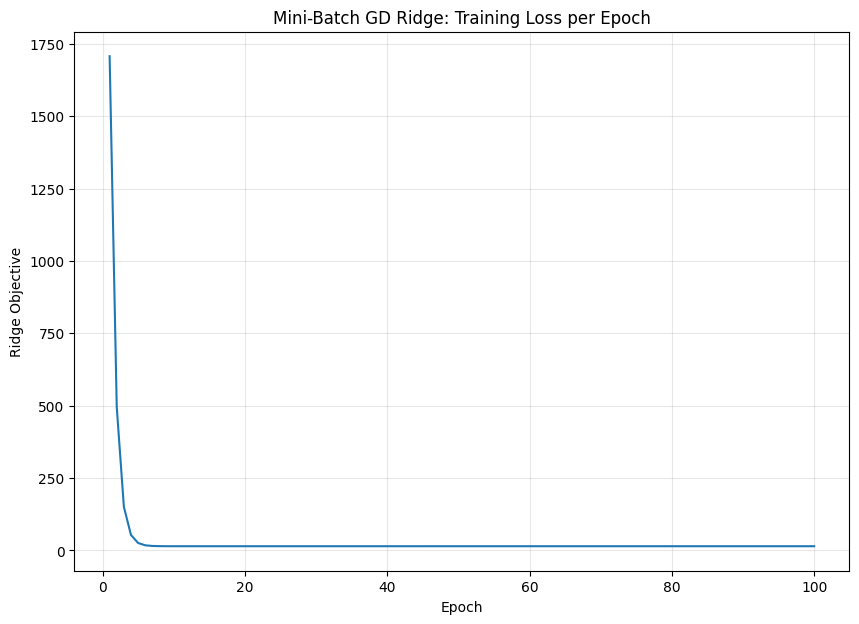

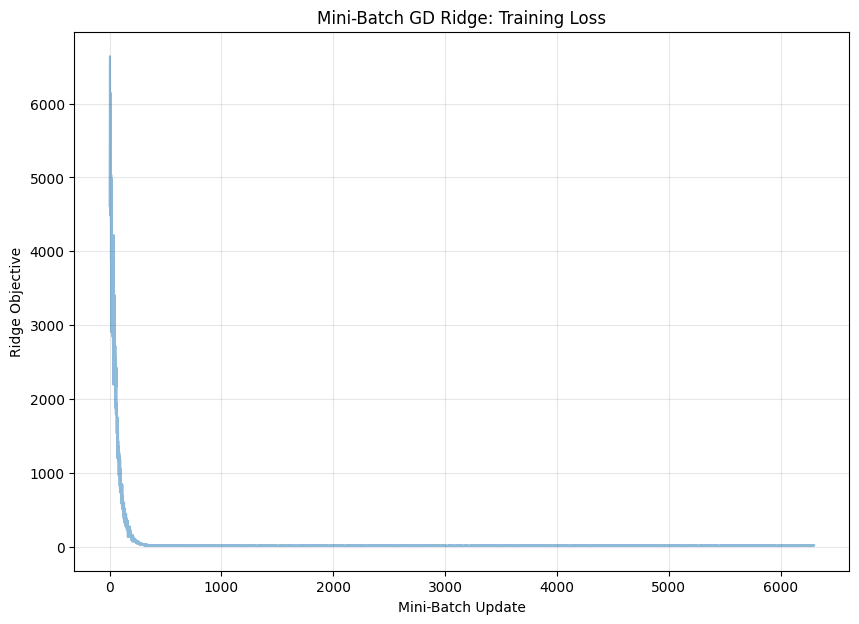

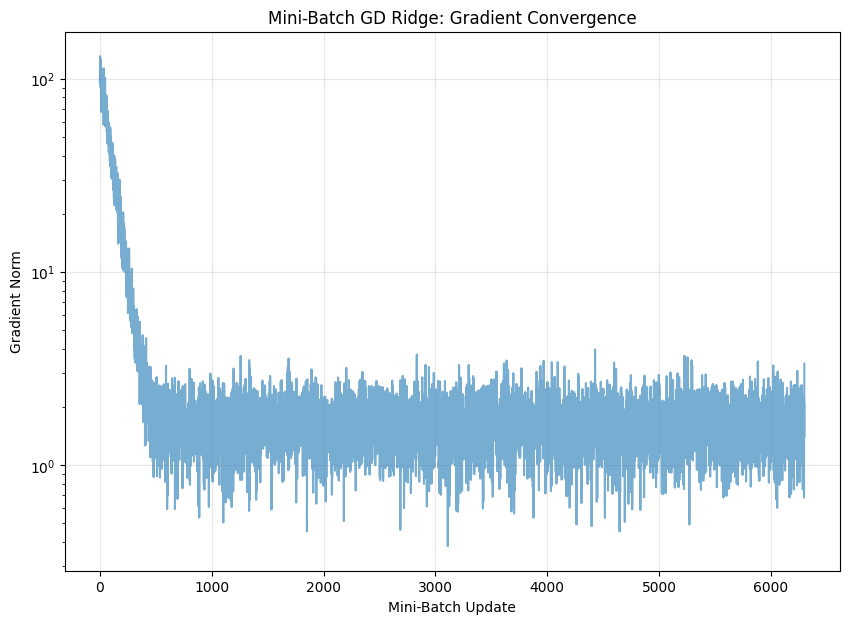

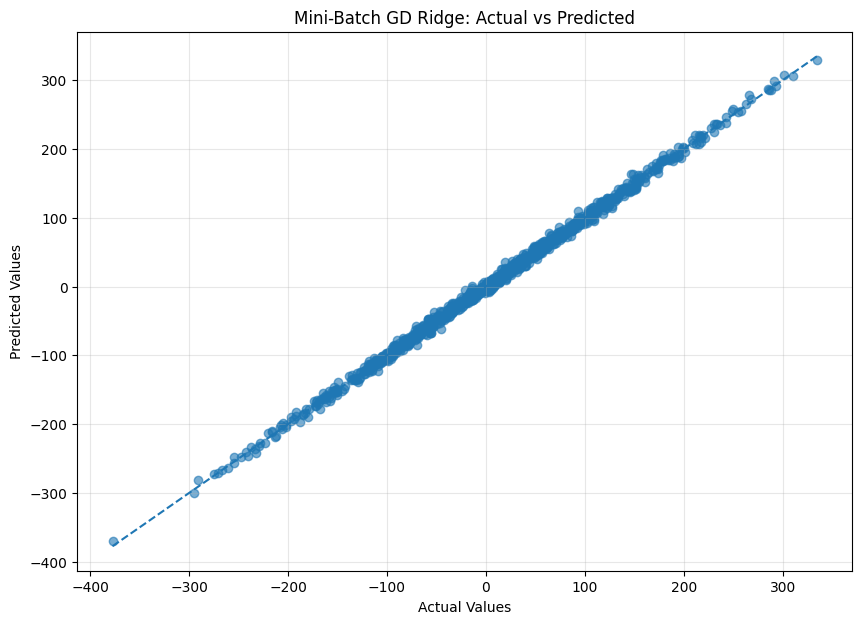

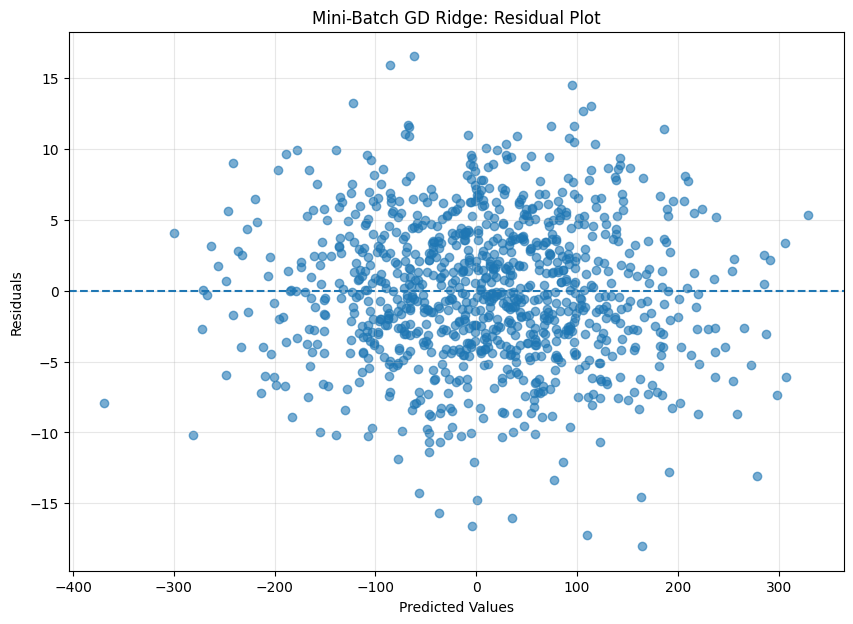

...

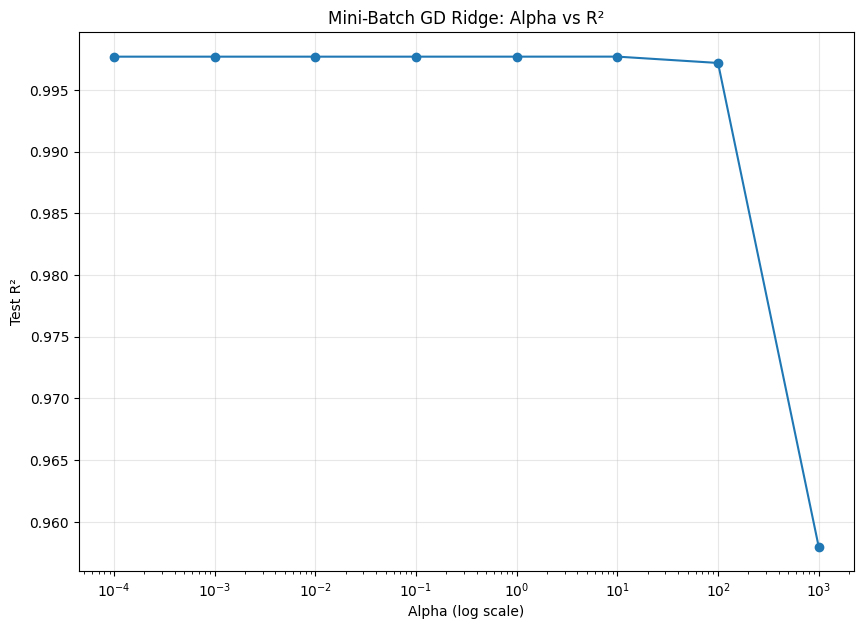

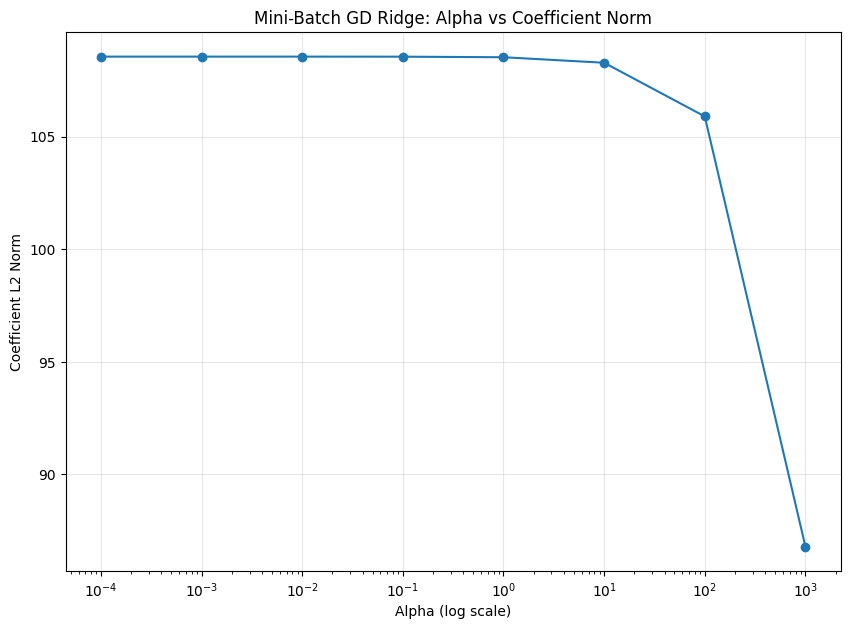

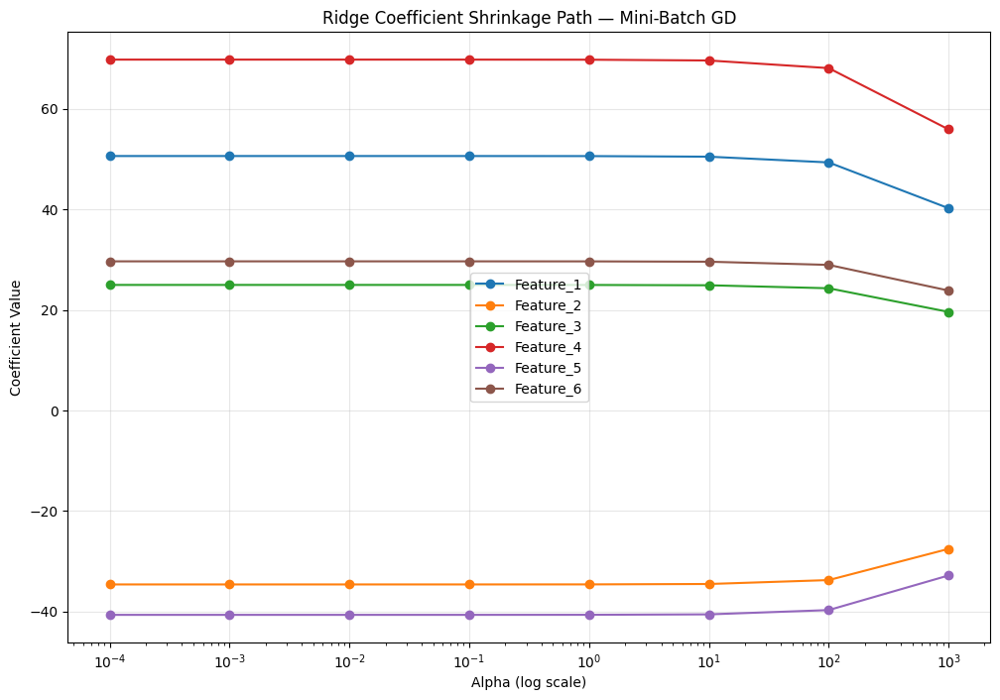

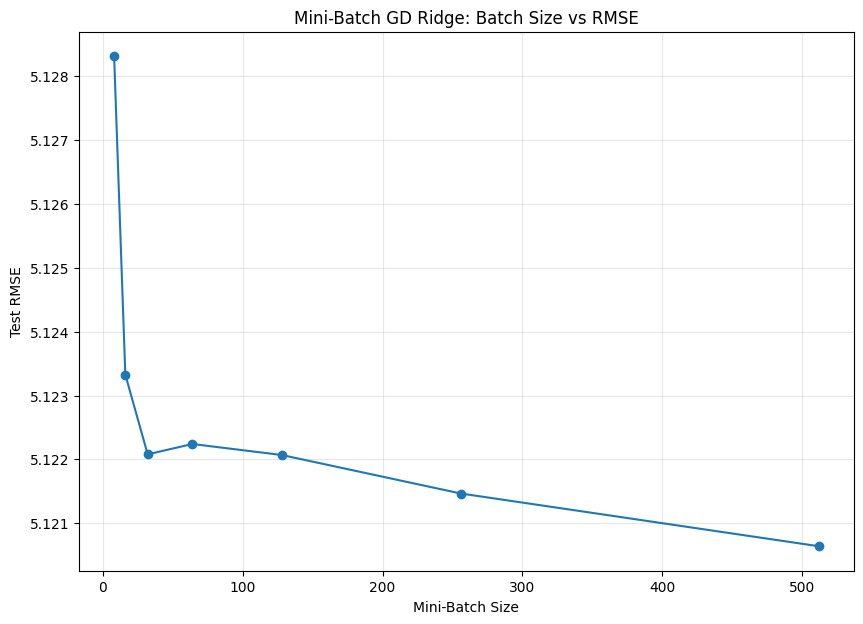

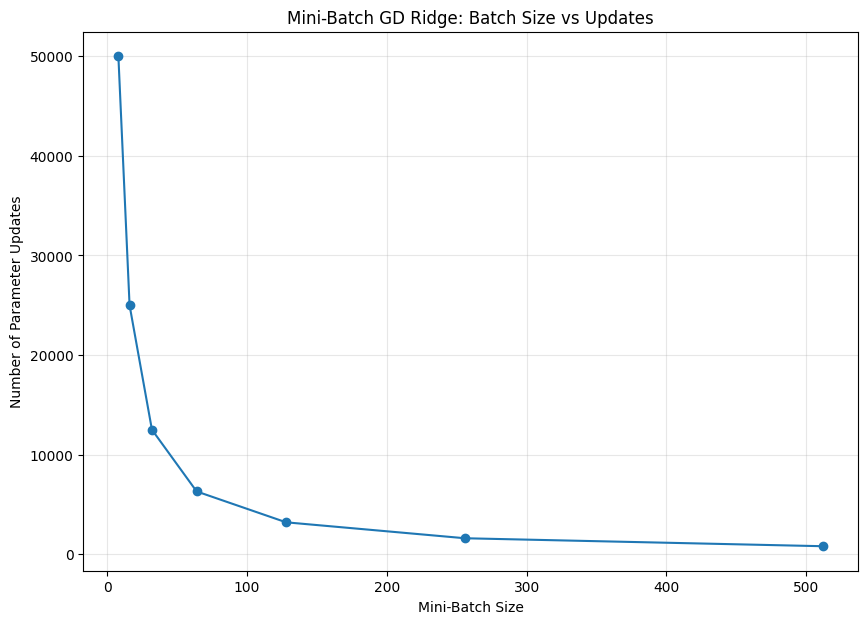



BATCH SIZE ANALYSIS
 Batch Size  Test RMSE  Total Updates
          8   5.128315          50000
         16   5.123328          25000
         32   5.122079          12500
         64   5.122240           6300
        128   5.122068           3200
        256   5.121465           1600
        512   5.120639            800


BEST ALPHA ANALYSIS
Best Alpha: 10.0
Best Test RMSE: 5.119705725903667
Corresponding Test R²: 0.9976962472800032


OPTIMIZATION INFORMATION
Learning Rate: 0.01
Mini-Batch Size: 64
Number of Epochs: 100
Training Samples: 4000
Mini-Batches per Epoch: 63
Total Parameter Updates: 6300
Final Epoch Loss: 14.616292292102374
Final Gradient Norm: 3.3540003303026324


FINAL SUMMARY
Algorithm       : Ridge Regression
Optimization     : Mini-Batch Gradient Descent
Regularization   : L2 / Ridge
Alpha            : 1.0
Learning Rate    : 0.01
Mini-Batch Size  : 64
Epochs           : 100
Training RMSE    : 5.127164340825306
Testing RMSE     : 5.122240324235604
Training R²      : 

In [8]:
# ============================================================
# RIDGE REGRESSION FROM SCRATCH
# MINI-BATCH GRADIENT DESCENT BASED IMPLEMENTATION
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ============================================================
# 1. REPRODUCIBILITY
# ============================================================

np.random.seed(42)


# ============================================================
# 2. GENERATE LARGE SYNTHETIC REGRESSION DATASET
# ============================================================

n_samples = 5000
n_features = 6

true_intercept = 15.0

true_coefficients = np.array([
    5.0,
    -3.5,
    2.5,
    7.0,
    -4.0,
    3.0
])

# Generate features
X = np.random.normal(
    loc=0.0,
    scale=10.0,
    size=(n_samples, n_features)
)

# Generate noise
noise = np.random.normal(
    loc=0.0,
    scale=5.0,
    size=n_samples
)

# Generate target
y = (
    true_intercept
    + X @ true_coefficients
    + noise
)

print("=" * 75)
print("DATASET INFORMATION")
print("=" * 75)

print("X shape:", X.shape)
print("y shape:", y.shape)
print("Number of samples:", n_samples)
print("Number of features:", n_features)


# ============================================================
# 3. TRAIN / TEST SPLIT
# ============================================================

test_size = 0.20

indices = np.random.permutation(
    n_samples
)

test_count = int(
    n_samples * test_size
)

test_indices = indices[
    :test_count
]

train_indices = indices[
    test_count:
]

X_train = X[
    train_indices
]

X_test = X[
    test_indices
]

y_train = y[
    train_indices
]

y_test = y[
    test_indices
]

print("\nTrain samples:", X_train.shape[0])
print("Test samples :", X_test.shape[0])


# ============================================================
# 4. FEATURE STANDARDIZATION
# ============================================================

# Calculate statistics only from training data
X_mean = np.mean(
    X_train,
    axis=0
)

X_std = np.std(
    X_train,
    axis=0
)

# Avoid division by zero
X_std[X_std == 0] = 1.0

# Standardize training data
X_train_scaled = (
    X_train - X_mean
) / X_std

# Standardize test data
X_test_scaled = (
    X_test - X_mean
) / X_std


# ============================================================
# 5. EVALUATION METRICS
# ============================================================

def mean_absolute_error(
    y_true,
    y_pred
):

    return np.mean(
        np.abs(
            y_true - y_pred
        )
    )


def mean_squared_error(
    y_true,
    y_pred
):

    return np.mean(
        (y_true - y_pred) ** 2
    )


def root_mean_squared_error(
    y_true,
    y_pred
):

    return np.sqrt(
        mean_squared_error(
            y_true,
            y_pred
        )
    )


def r2_score(
    y_true,
    y_pred
):

    ss_res = np.sum(
        (y_true - y_pred) ** 2
    )

    ss_tot = np.sum(
        (y_true - np.mean(y_true)) ** 2
    )

    return 1.0 - (
        ss_res / ss_tot
    )


def adjusted_r2_score(
    y_true,
    y_pred,
    n_features
):

    n = len(y_true)

    r2 = r2_score(
        y_true,
        y_pred
    )

    return (
        1.0
        -
        (
            (1.0 - r2)
            *
            (n - 1)
            /
            (n - n_features - 1)
        )
    )


def explained_variance_score(
    y_true,
    y_pred
):

    residual = (
        y_true - y_pred
    )

    return 1.0 - (
        np.var(residual)
        /
        np.var(y_true)
    )


# ============================================================
# 6. MINI-BATCH GRADIENT DESCENT RIDGE REGRESSION
# ============================================================

class RidgeRegressionMiniBatchGD:

    def __init__(
        self,
        alpha=1.0,
        learning_rate=0.01,
        batch_size=64,
        n_epochs=100,
        shuffle=True,
        random_state=42
    ):

        self.alpha = alpha

        self.learning_rate = learning_rate

        self.batch_size = batch_size

        self.n_epochs = n_epochs

        self.shuffle = shuffle

        self.random_state = random_state

        self.coef_ = None

        self.intercept_ = None

        self.loss_history_ = []

        self.epoch_loss_history_ = []

        self.gradient_norm_history_ = []

    # --------------------------------------------------------
    # FIT
    # --------------------------------------------------------

    def fit(
        self,
        X,
        y
    ):

        X = np.asarray(
            X,
            dtype=float
        )

        y = np.asarray(
            y,
            dtype=float
        )

        n_samples, n_features = X.shape

        # ----------------------------------------------------
        # Initialize parameters
        # ----------------------------------------------------

        self.coef_ = np.zeros(
            n_features
        )

        self.intercept_ = 0.0

        self.loss_history_ = []

        self.epoch_loss_history_ = []

        self.gradient_norm_history_ = []

        # Random number generator
        rng = np.random.default_rng(
            self.random_state
        )

        # ----------------------------------------------------
        # EPOCH LOOP
        # ----------------------------------------------------

        for epoch in range(
            self.n_epochs
        ):

            # ------------------------------------------------
            # Shuffle indices
            # ------------------------------------------------

            if self.shuffle:

                indices = rng.permutation(
                    n_samples
                )

            else:

                indices = np.arange(
                    n_samples
                )

            # ------------------------------------------------
            # MINI-BATCH LOOP
            # ------------------------------------------------

            for start in range(
                0,
                n_samples,
                self.batch_size
            ):

                end = min(
                    start + self.batch_size,
                    n_samples
                )

                batch_indices = indices[
                    start:end
                ]

                X_batch = X[
                    batch_indices
                ]

                y_batch = y[
                    batch_indices
                ]

                batch_count = len(
                    batch_indices
                )

                # --------------------------------------------
                # Prediction for mini-batch
                # --------------------------------------------

                y_batch_pred = (
                    X_batch @ self.coef_
                    +
                    self.intercept_
                )

                # --------------------------------------------
                # Error
                # --------------------------------------------

                error = (
                    y_batch_pred
                    -
                    y_batch
                )

                # --------------------------------------------
                # Gradient of MSE
                # --------------------------------------------

                dw = (
                    (1.0 / batch_count)
                    *
                    (
                        X_batch.T
                        @
                        error
                    )
                )

                db = (
                    (1.0 / batch_count)
                    *
                    np.sum(error)
                )

                # --------------------------------------------
                # Ridge L2 gradient
                #
                # Intercept is NOT regularized.
                # --------------------------------------------

                ridge_gradient = (
                    (self.alpha / n_samples)
                    *
                    self.coef_
                )

                dw = (
                    dw
                    +
                    ridge_gradient
                )

                # --------------------------------------------
                # Gradient norm
                # --------------------------------------------

                gradient_norm = np.sqrt(
                    np.sum(dw ** 2)
                    +
                    db ** 2
                )

                self.gradient_norm_history_.append(
                    gradient_norm
                )

                # --------------------------------------------
                # Parameter update
                # --------------------------------------------

                self.coef_ -= (
                    self.learning_rate
                    *
                    dw
                )

                self.intercept_ -= (
                    self.learning_rate
                    *
                    db
                )

                # --------------------------------------------
                # Mini-batch loss
                # --------------------------------------------

                batch_mse = (
                    0.5
                    *
                    np.mean(
                        error ** 2
                    )
                )

                batch_ridge = (
                    self.alpha
                    /
                    (2.0 * n_samples)
                    *
                    np.sum(
                        self.coef_ ** 2
                    )
                )

                batch_loss = (
                    batch_mse
                    +
                    batch_ridge
                )

                self.loss_history_.append(
                    batch_loss
                )

            # ------------------------------------------------
            # Full training loss after each epoch
            # ------------------------------------------------

            full_prediction = (
                X @ self.coef_
                +
                self.intercept_
            )

            full_error = (
                full_prediction - y
            )

            full_mse = (
                0.5
                *
                np.mean(
                    full_error ** 2
                )
            )

            full_ridge = (
                self.alpha
                /
                (2.0 * n_samples)
                *
                np.sum(
                    self.coef_ ** 2
                )
            )

            full_loss = (
                full_mse
                +
                full_ridge
            )

            self.epoch_loss_history_.append(
                full_loss
            )

        return self

    # --------------------------------------------------------
    # PREDICT
    # --------------------------------------------------------

    def predict(
        self,
        X
    ):

        X = np.asarray(
            X,
            dtype=float
        )

        return (
            X @ self.coef_
            +
            self.intercept_
        )


# ============================================================
# 7. TRAIN MODEL
# ============================================================

alpha = 1.0

learning_rate = 0.01

batch_size = 64

n_epochs = 100

model = RidgeRegressionMiniBatchGD(
    alpha=alpha,
    learning_rate=learning_rate,
    batch_size=batch_size,
    n_epochs=n_epochs,
    shuffle=True,
    random_state=42
)

model.fit(
    X_train_scaled,
    y_train
)


# ============================================================
# 8. PREDICTIONS
# ============================================================

y_train_pred = model.predict(
    X_train_scaled
)

y_test_pred = model.predict(
    X_test_scaled
)


# ============================================================
# 9. TRAIN EVALUATION
# ============================================================

train_mae = mean_absolute_error(
    y_train,
    y_train_pred
)

train_mse = mean_squared_error(
    y_train,
    y_train_pred
)

train_rmse = root_mean_squared_error(
    y_train,
    y_train_pred
)

train_r2 = r2_score(
    y_train,
    y_train_pred
)

train_adj_r2 = adjusted_r2_score(
    y_train,
    y_train_pred,
    n_features
)

train_ev = explained_variance_score(
    y_train,
    y_train_pred
)


# ============================================================
# 10. TEST EVALUATION
# ============================================================

test_mae = mean_absolute_error(
    y_test,
    y_test_pred
)

test_mse = mean_squared_error(
    y_test,
    y_test_pred
)

test_rmse = root_mean_squared_error(
    y_test,
    y_test_pred
)

test_r2 = r2_score(
    y_test,
    y_test_pred
)

test_adj_r2 = adjusted_r2_score(
    y_test,
    y_test_pred,
    n_features
)

test_ev = explained_variance_score(
    y_test,
    y_test_pred
)


# ============================================================
# 11. EVALUATION TABLE
# ============================================================

print("\n")
print("=" * 75)
print("MINI-BATCH GD RIDGE REGRESSION EVALUATION")
print("=" * 75)

results = pd.DataFrame({

    "Metric": [
        "MAE",
        "MSE",
        "RMSE",
        "R²",
        "Adjusted R²",
        "Explained Variance"
    ],

    "Train": [
        train_mae,
        train_mse,
        train_rmse,
        train_r2,
        train_adj_r2,
        train_ev
    ],

    "Test": [
        test_mae,
        test_mse,
        test_rmse,
        test_r2,
        test_adj_r2,
        test_ev
    ]
})

print(
    results.to_string(
        index=False
    )
)


# ============================================================
# 12. MODEL PARAMETERS
# ============================================================

print("\n")
print("=" * 75)
print("MODEL PARAMETERS")
print("=" * 75)

print(
    "Intercept:",
    model.intercept_
)

coefficient_table = pd.DataFrame({

    "Feature": [
        f"Feature_{i+1}"
        for i in range(n_features)
    ],

    "True Coefficient":
        true_coefficients,

    "Learned Coefficient":
        model.coef_,

    "Absolute Difference":
        np.abs(
            true_coefficients
            -
            model.coef_
        )
})

print(
    coefficient_table.to_string(
        index=False
    )
)


# ============================================================
# 13. EPOCH LOSS CURVE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    range(
        1,
        len(
            model.epoch_loss_history_
        ) + 1
    ),
    model.epoch_loss_history_
)

plt.xlabel(
    "Epoch"
)

plt.ylabel(
    "Ridge Objective"
)

plt.title(
    "Mini-Batch GD Ridge: Training Loss per Epoch"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 14. MINI-BATCH LOSS CURVE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    model.loss_history_,
    alpha=0.5
)

plt.xlabel(
    "Mini-Batch Update"
)

plt.ylabel(
    "Ridge Objective"
)

plt.title(
    "Mini-Batch GD Ridge: Training Loss"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 15. GRADIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogy(
    model.gradient_norm_history_,
    alpha=0.6
)

plt.xlabel(
    "Mini-Batch Update"
)

plt.ylabel(
    "Gradient Norm"
)

plt.title(
    "Mini-Batch GD Ridge: Gradient Convergence"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 16. ACTUAL VS PREDICTED
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.6
)

minimum = min(
    np.min(y_test),
    np.min(y_test_pred)
)

maximum = max(
    np.max(y_test),
    np.max(y_test_pred)
)

plt.plot(
    [minimum, maximum],
    [minimum, maximum],
    linestyle="--"
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Predicted Values"
)

plt.title(
    "Mini-Batch GD Ridge: Actual vs Predicted"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 17. RESIDUAL PLOT
# ============================================================

residuals = (
    y_test - y_test_pred
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test_pred,
    residuals,
    alpha=0.6
)

plt.axhline(
    y=0,
    linestyle="--"
)

plt.xlabel(
    "Predicted Values"
)

plt.ylabel(
    "Residuals"
)

plt.title(
    "Mini-Batch GD Ridge: Residual Plot"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 18. RESIDUAL DISTRIBUTION
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.hist(
    residuals,
    bins=40
)

plt.xlabel(
    "Residual"
)

plt.ylabel(
    "Frequency"
)

plt.title(
    "Mini-Batch GD Ridge: Residual Distribution"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 19. ABSOLUTE ERROR
# ============================================================

absolute_errors = np.abs(
    residuals
)

plt.figure(
    figsize=(10, 7)
)

plt.scatter(
    y_test,
    absolute_errors,
    alpha=0.6
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Absolute Error"
)

plt.title(
    "Mini-Batch GD Ridge: Absolute Error"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 20. SORTED ACTUAL VS PREDICTED
# ============================================================

sort_indices = np.argsort(
    y_test
)

sorted_actual = (
    y_test[sort_indices]
)

sorted_predicted = (
    y_test_pred[sort_indices]
)

plt.figure(
    figsize=(12, 7)
)

plt.plot(
    sorted_actual,
    label="Actual"
)

plt.plot(
    sorted_predicted,
    label="Predicted"
)

plt.xlabel(
    "Sorted Test Sample Index"
)

plt.ylabel(
    "Target Value"
)

plt.title(
    "Mini-Batch GD Ridge: Sorted Actual vs Predicted"
)

plt.legend()

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 21. TRUE VS LEARNED COEFFICIENTS
# ============================================================

feature_names = [
    f"Feature_{i+1}"
    for i in range(n_features)
]

x_positions = np.arange(
    n_features
)

width = 0.35

plt.figure(
    figsize=(12, 7)
)

plt.bar(
    x_positions - width / 2,
    true_coefficients,
    width,
    label="True"
)

plt.bar(
    x_positions + width / 2,
    model.coef_,
    width,
    label="Mini-Batch GD Ridge"
)

plt.xticks(
    x_positions,
    feature_names
)

plt.xlabel(
    "Features"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "True vs Learned Coefficients"
)

plt.legend()

plt.grid(
    axis="y",
    alpha=0.3
)

plt.show()


# ============================================================
# 22. ALPHA ANALYSIS
# ============================================================

alphas = np.array([
    0.0001,
    0.001,
    0.01,
    0.1,
    1.0,
    10.0,
    100.0,
    1000.0
])

alpha_rmse = []

alpha_r2 = []

alpha_coefficient_norm = []

alpha_models = []


for current_alpha in alphas:

    current_model = RidgeRegressionMiniBatchGD(
        alpha=current_alpha,
        learning_rate=0.01,
        batch_size=64,
        n_epochs=100,
        shuffle=True,
        random_state=42
    )

    current_model.fit(
        X_train_scaled,
        y_train
    )

    current_pred = (
        current_model.predict(
            X_test_scaled
        )
    )

    current_rmse = (
        root_mean_squared_error(
            y_test,
            current_pred
        )
    )

    current_r2 = (
        r2_score(
            y_test,
            current_pred
        )
    )

    coefficient_norm = np.linalg.norm(
        current_model.coef_
    )

    alpha_rmse.append(
        current_rmse
    )

    alpha_r2.append(
        current_r2
    )

    alpha_coefficient_norm.append(
        coefficient_norm
    )

    alpha_models.append(
        current_model
    )


# ============================================================
# 23. ALPHA VS RMSE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    alphas,
    alpha_rmse,
    marker="o"
)

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "Mini-Batch GD Ridge: Alpha vs RMSE"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 24. ALPHA VS R²
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    alphas,
    alpha_r2,
    marker="o"
)

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Test R²"
)

plt.title(
    "Mini-Batch GD Ridge: Alpha vs R²"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 25. ALPHA VS COEFFICIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.semilogx(
    alphas,
    alpha_coefficient_norm,
    marker="o"
)

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Coefficient L2 Norm"
)

plt.title(
    "Mini-Batch GD Ridge: Alpha vs Coefficient Norm"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 26. COEFFICIENT SHRINKAGE PATH
# ============================================================

coefficient_paths = np.array([
    current_model.coef_
    for current_model in alpha_models
])

plt.figure(
    figsize=(12, 8)
)

for j in range(
    n_features
):

    plt.semilogx(
        alphas,
        coefficient_paths[:, j],
        marker="o",
        label=f"Feature_{j+1}"
    )

plt.xlabel(
    "Alpha (log scale)"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "Ridge Coefficient Shrinkage Path — Mini-Batch GD"
)

plt.legend()

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 27. BATCH SIZE ANALYSIS
# ============================================================

batch_sizes = np.array([
    8,
    16,
    32,
    64,
    128,
    256,
    512
])

batch_rmse = []

batch_updates = []

batch_models = []


for current_batch_size in batch_sizes:

    batch_model = RidgeRegressionMiniBatchGD(
        alpha=1.0,
        learning_rate=0.01,
        batch_size=int(current_batch_size),
        n_epochs=100,
        shuffle=True,
        random_state=42
    )

    batch_model.fit(
        X_train_scaled,
        y_train
    )

    batch_pred = (
        batch_model.predict(
            X_test_scaled
        )
    )

    batch_rmse.append(
        root_mean_squared_error(
            y_test,
            batch_pred
        )
    )

    batch_updates.append(
        len(
            batch_model.loss_history_
        )
    )

    batch_models.append(
        batch_model
    )


# ============================================================
# 28. BATCH SIZE VS RMSE
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    batch_sizes,
    batch_rmse,
    marker="o"
)

plt.xlabel(
    "Mini-Batch Size"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "Mini-Batch GD Ridge: Batch Size vs RMSE"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 29. BATCH SIZE VS NUMBER OF UPDATES
# ============================================================

plt.figure(
    figsize=(10, 7)
)

plt.plot(
    batch_sizes,
    batch_updates,
    marker="o"
)

plt.xlabel(
    "Mini-Batch Size"
)

plt.ylabel(
    "Number of Parameter Updates"
)

plt.title(
    "Mini-Batch GD Ridge: Batch Size vs Updates"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ============================================================
# 30. BATCH SIZE COMPARISON TABLE
# ============================================================

batch_results = pd.DataFrame({

    "Batch Size":
        batch_sizes,

    "Test RMSE":
        batch_rmse,

    "Total Updates":
        batch_updates
})

print("\n")
print("=" * 75)
print("BATCH SIZE ANALYSIS")
print("=" * 75)

print(
    batch_results.to_string(
        index=False
    )
)


# ============================================================
# 31. FIND BEST ALPHA
# ============================================================

best_index = np.argmin(
    alpha_rmse
)

best_alpha = alphas[
    best_index
]

best_rmse = alpha_rmse[
    best_index
]

best_r2 = alpha_r2[
    best_index
]


print("\n")
print("=" * 75)
print("BEST ALPHA ANALYSIS")
print("=" * 75)

print(
    "Best Alpha:",
    best_alpha
)

print(
    "Best Test RMSE:",
    best_rmse
)

print(
    "Corresponding Test R²:",
    best_r2
)


# ============================================================
# 32. OPTIMIZATION INFORMATION
# ============================================================

print("\n")
print("=" * 75)
print("OPTIMIZATION INFORMATION")
print("=" * 75)

print(
    "Learning Rate:",
    model.learning_rate
)

print(
    "Mini-Batch Size:",
    model.batch_size
)

print(
    "Number of Epochs:",
    model.n_epochs
)

print(
    "Training Samples:",
    X_train_scaled.shape[0]
)

print(
    "Mini-Batches per Epoch:",
    int(
        np.ceil(
            X_train_scaled.shape[0]
            /
            model.batch_size
        )
    )
)

print(
    "Total Parameter Updates:",
    len(
        model.loss_history_
    )
)

print(
    "Final Epoch Loss:",
    model.epoch_loss_history_[-1]
)

print(
    "Final Gradient Norm:",
    model.gradient_norm_history_[-1]
)


# ============================================================
# 33. FINAL SUMMARY
# ============================================================

print("\n")
print("=" * 75)
print("FINAL SUMMARY")
print("=" * 75)

print(
    "Algorithm       : Ridge Regression"
)

print(
    "Optimization     : Mini-Batch Gradient Descent"
)

print(
    "Regularization   : L2 / Ridge"
)

print(
    "Alpha            :",
    alpha
)

print(
    "Learning Rate    :",
    learning_rate
)

print(
    "Mini-Batch Size  :",
    batch_size
)

print(
    "Epochs           :",
    n_epochs
)

print(
    "Training RMSE    :",
    train_rmse
)

print(
    "Testing RMSE     :",
    test_rmse
)

print(
    "Training R²      :",
    train_r2
)

print(
    "Testing R²       :",
    test_r2
)

print(
    "Adjusted Test R² :",
    test_adj_r2
)

print(
    "Test MAE         :",
    test_mae
)

print(
    "Test MSE         :",
    test_mse
)

print(
    "Explained Var.   :",
    test_ev
)

print(
    "Best Alpha       :",
    best_alpha
)

print(
    "Total Updates    :",
    len(
        model.loss_history_
    )
)

print("=" * 75)

DATASET INFORMATION
Number of samples : 5000
Number of features: 6
X shape           : (5000, 6)
y shape           : (5000,)

TRAIN / TEST SPLIT
Training samples: 4000
Testing samples : 1000
Newton's Method converged at iteration 2

EVALUATION RESULTS
            Metric     Train      Test
               MAE  4.059473  4.199866
               MSE 26.134430 26.873437
              RMSE  5.112185  5.183960
                R²  0.821699  0.801361
       Adjusted R²  0.821431  0.800161
Explained Variance  0.821699  0.801441

COEFFICIENT COMPARISON
Feature  True Coefficient  Learned Coefficient  Absolute Difference
     X1               5.0             5.114671             0.114671
     X2              -3.5            -3.444627             0.055373
     X3               2.5             2.327873             0.172127
     X4               7.0             7.028951             0.028951
     X5              -4.0            -4.304521             0.304521
     X6               3.0             3.049

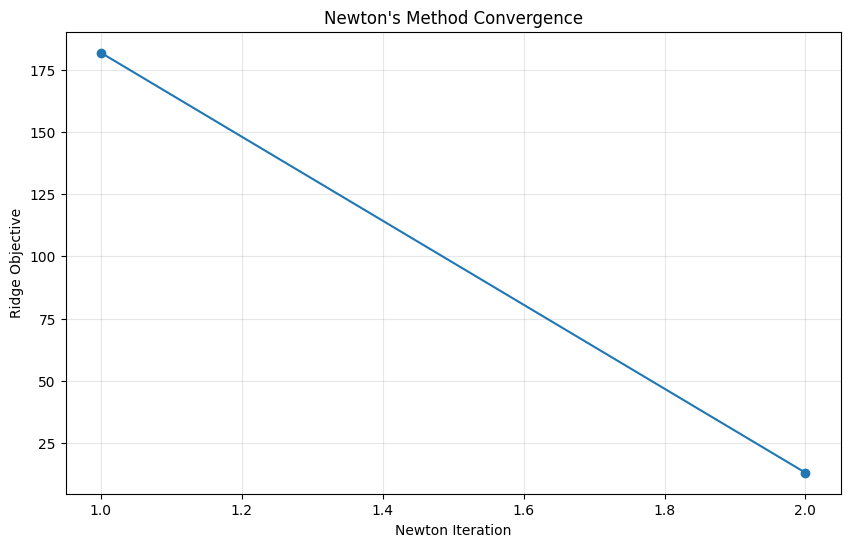

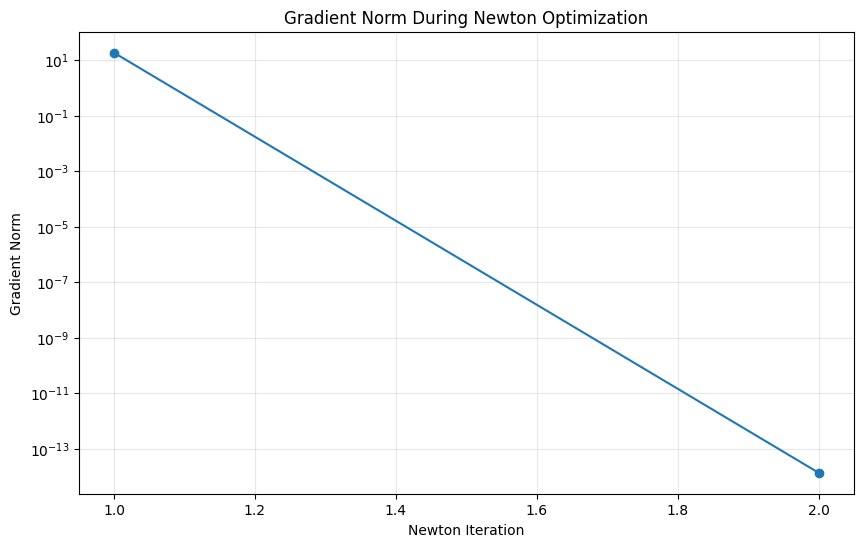

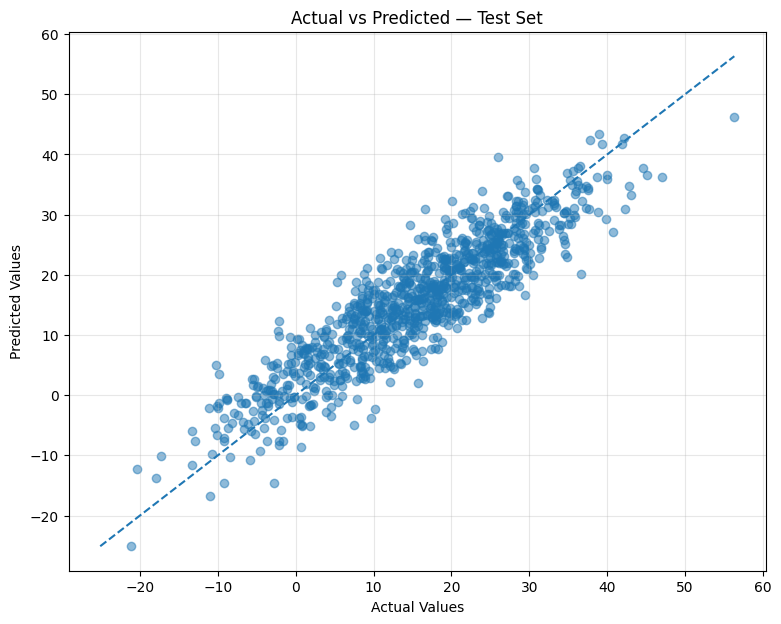

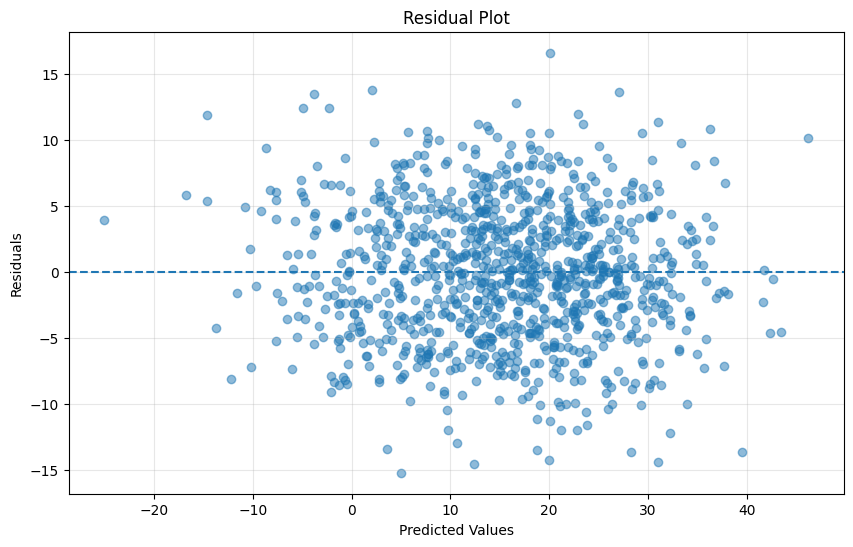

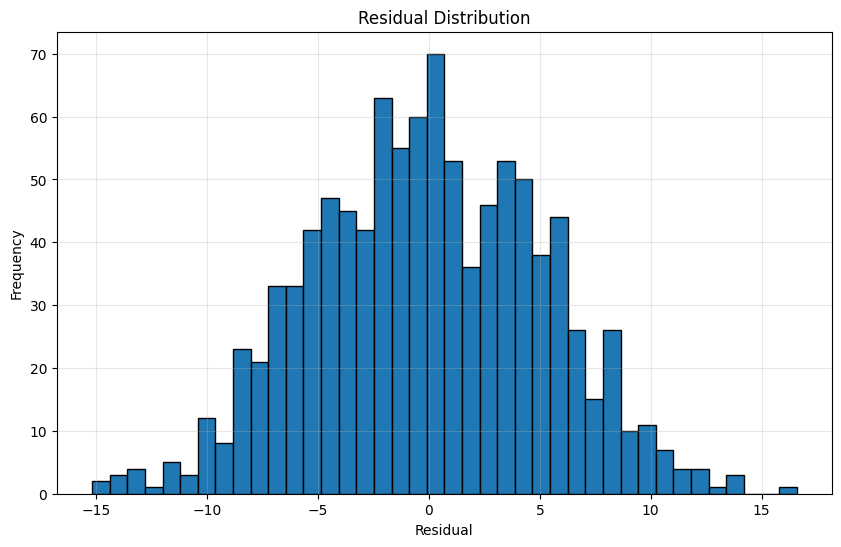

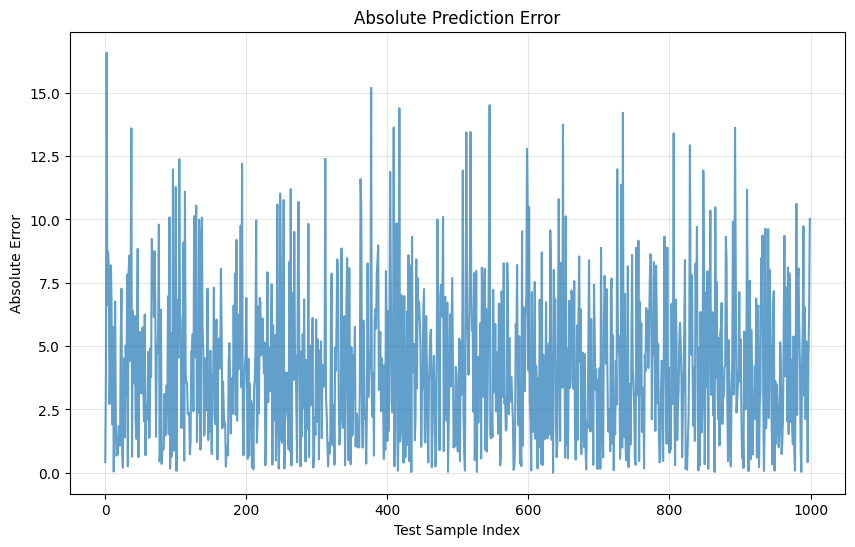

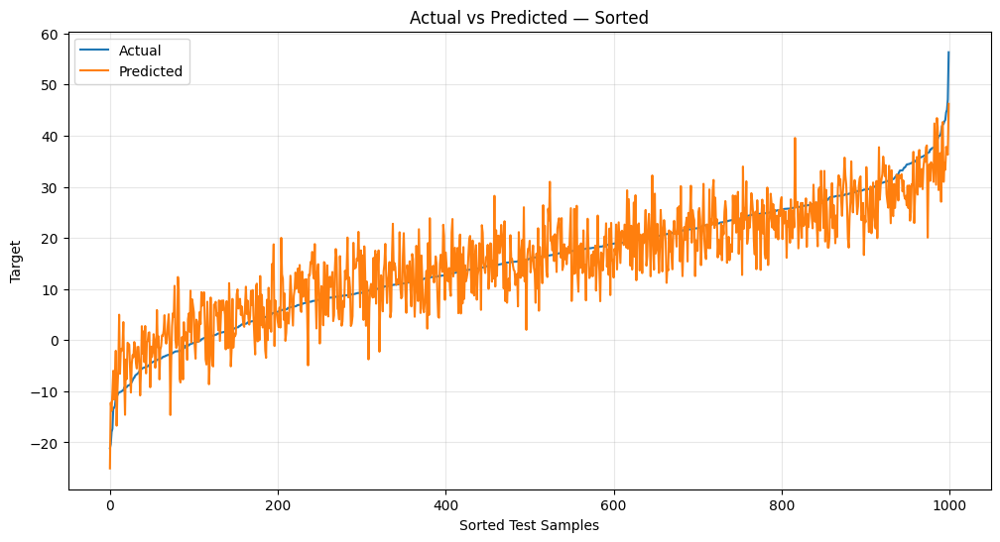

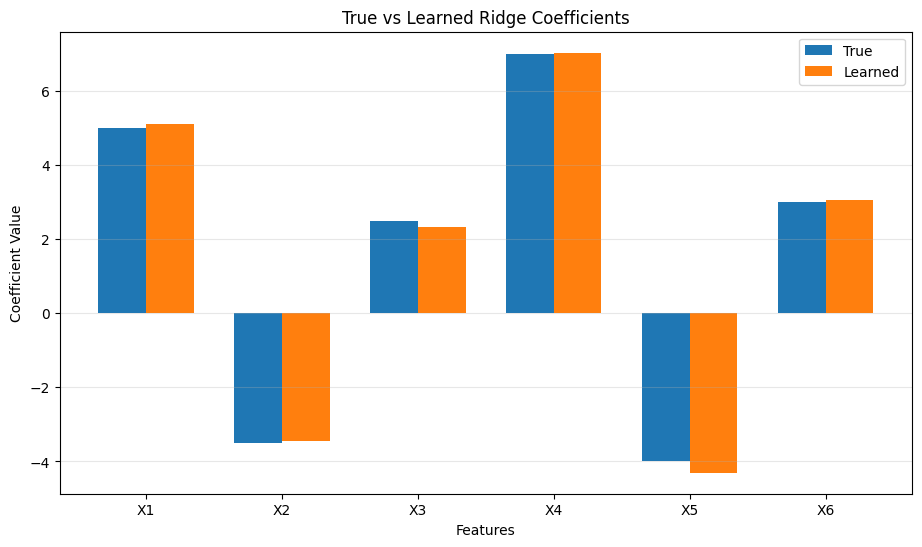

Newton's Method converged at iteration 2
Newton's Method converged at iteration 2
Newton's Method converged at iteration 2
Newton's Method converged at iteration 2
Newton's Method converged at iteration 2
Newton's Method converged at iteration 2
Newton's Method converged at iteration 2
Newton's Method converged at iteration 2

ALPHA ANALYSIS
    Alpha  Test RMSE  Test R²  Coefficient Norm
   0.0001   5.184100 0.801350         10.988151
   0.0010   5.184099 0.801350         10.988149
   0.0100   5.184098 0.801350         10.988124
   0.1000   5.184085 0.801351         10.987876
   1.0000   5.183960 0.801361         10.985397
  10.0000   5.182765 0.801453         10.960667
 100.0000   5.176969 0.801896         10.719364
1000.0000   5.505152 0.775984          8.785498


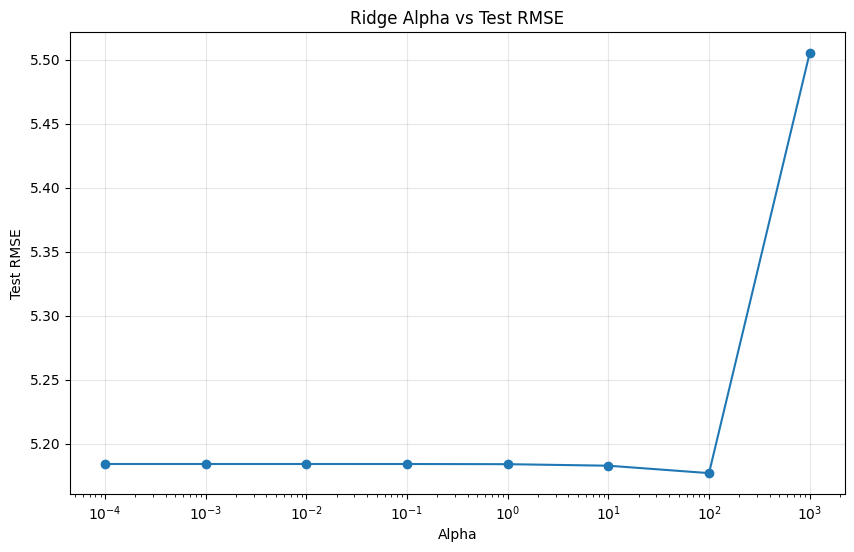

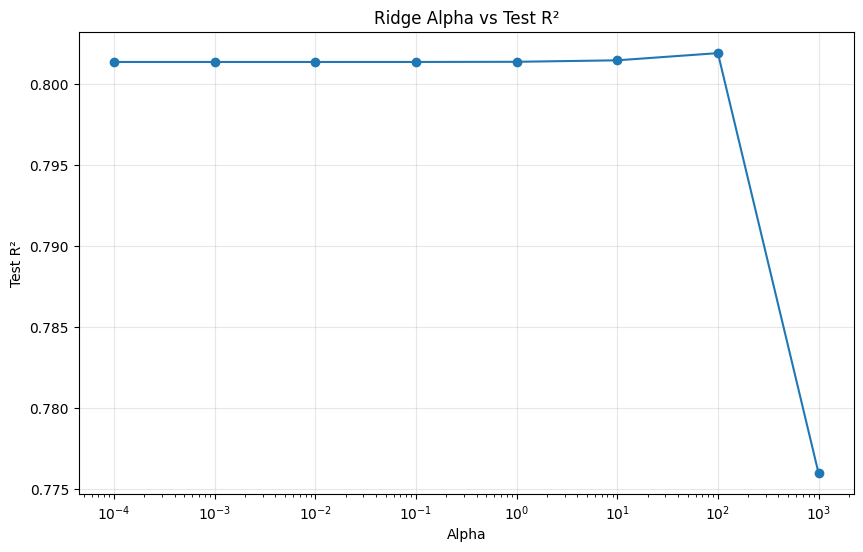

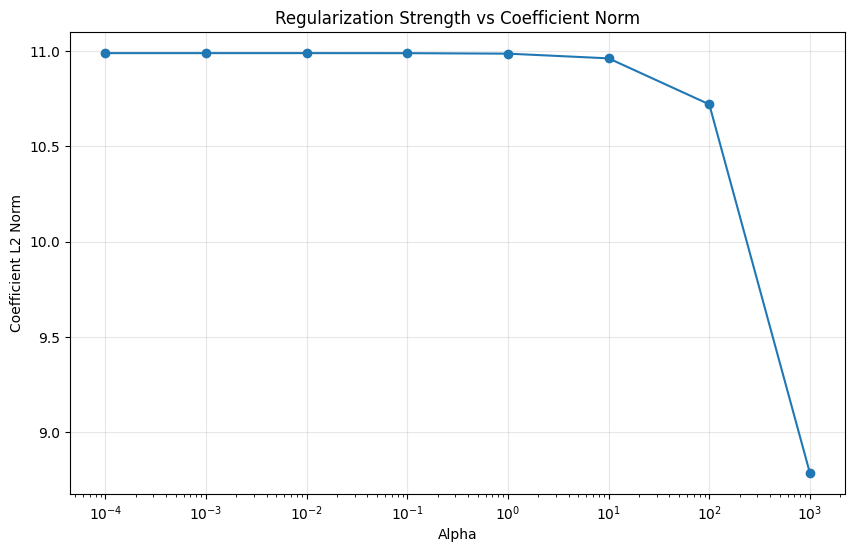

Newton's Method converged at iteration 2
Newton's Method converged at iteration 2
Newton's Method converged at iteration 2
Newton's Method converged at iteration 2
Newton's Method converged at iteration 2
Newton's Method converged at iteration 2
Newton's Method converged at iteration 2
Newton's Method converged at iteration 2


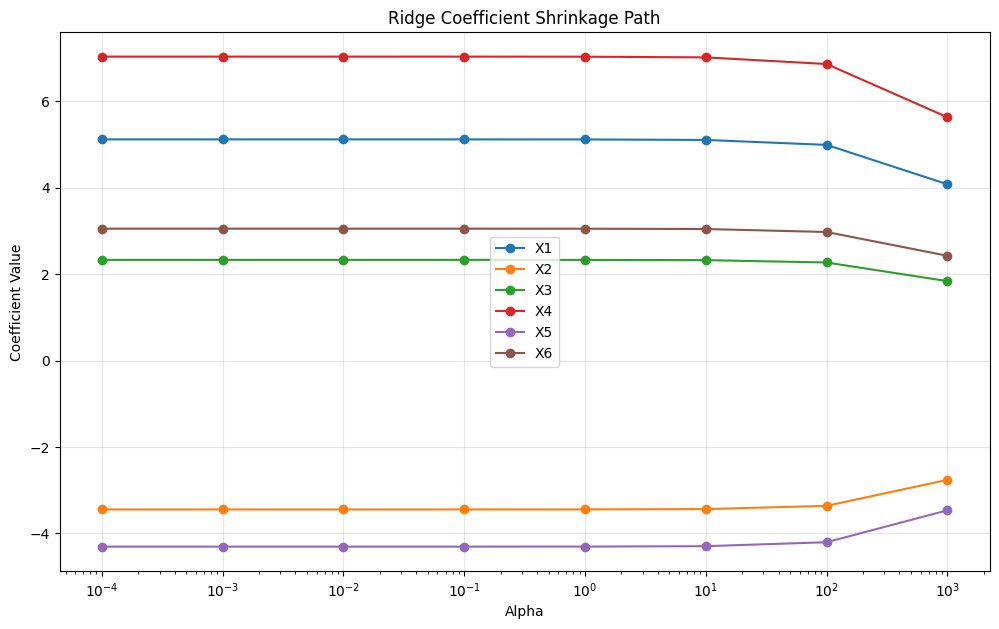


FINAL SUMMARY
Method               : Ridge Regression
Optimization Method  : Newton's Method
Scikit-learn used    : NO
Number of samples    : 5000
Number of features   : 6
Training samples     : 4000
Testing samples      : 1000
Initial alpha        : 1.0
Best alpha           : 100.0
Best Test RMSE       : 5.176968992028747
Best Test R²         : 0.8018963726038291
Newton iterations    : 2
Final gradient norm  : 1.3468828803783337e-14
Final step norm      : 1.2985338597471814e-14
Final Test MAE       : 4.199865608232594
Final Test MSE       : 26.87343674156796
Final Test RMSE      : 5.18395956210771
Final Test R²        : 0.8013610044015849
Final Test Adj. R²   : 0.8001607687786337
Final Test Exp.Var.  : 0.8014406342381939


In [9]:
# ============================================================
# RIDGE REGRESSION FROM SCRATCH
# NEWTON'S METHOD
# NO SCIKIT-LEARN
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

np.random.seed(42)


# ============================================================
# 1. GENERATE LARGE SYNTHETIC DATASET
# ============================================================

n_samples = 5000
n_features = 6

X = np.random.randn(n_samples, n_features)

true_intercept = 15.0

true_coefficients = np.array([
    5.0,
    -3.5,
    2.5,
    7.0,
    -4.0,
    3.0
])

noise = np.random.normal(
    loc=0.0,
    scale=5.0,
    size=n_samples
)

y = (
    true_intercept
    + X @ true_coefficients
    + noise
)


print("=" * 70)
print("DATASET INFORMATION")
print("=" * 70)

print("Number of samples :", n_samples)
print("Number of features:", n_features)
print("X shape           :", X.shape)
print("y shape           :", y.shape)


# ============================================================
# 2. TRAIN / TEST SPLIT
# ============================================================

train_ratio = 0.80

indices = np.random.permutation(n_samples)

train_size = int(train_ratio * n_samples)

train_indices = indices[:train_size]
test_indices = indices[train_size:]

X_train = X[train_indices]
X_test = X[test_indices]

y_train = y[train_indices]
y_test = y[test_indices]


print("\n" + "=" * 70)
print("TRAIN / TEST SPLIT")
print("=" * 70)

print("Training samples:", len(X_train))
print("Testing samples :", len(X_test))


# ============================================================
# 3. STANDARDIZATION
# ============================================================

X_mean = np.mean(X_train, axis=0)
X_std = np.std(X_train, axis=0)

# Avoid division by zero
X_std[X_std == 0] = 1.0

X_train_scaled = (
    X_train - X_mean
) / X_std

X_test_scaled = (
    X_test - X_mean
) / X_std


# ============================================================
# 4. RIDGE REGRESSION USING NEWTON'S METHOD
# ============================================================

class RidgeRegressionNewton:

    def __init__(
        self,
        alpha=1.0,
        n_iterations=100,
        tolerance=1e-12
    ):

        self.alpha = alpha
        self.n_iterations = n_iterations
        self.tolerance = tolerance

        self.coef_ = None
        self.intercept_ = None

        self.loss_history_ = []
        self.gradient_norm_history_ = []
        self.step_norm_history_ = []


    # --------------------------------------------------------
    # FIT
    # --------------------------------------------------------

    def fit(self, X, y):

        n_samples, n_features = X.shape

        # ----------------------------------------------------
        # Add intercept column
        # ----------------------------------------------------

        X_b = np.column_stack(
            (
                np.ones(n_samples),
                X
            )
        )

        # ----------------------------------------------------
        # Initialize parameters
        # ----------------------------------------------------

        theta = np.zeros(n_features + 1)

        # ----------------------------------------------------
        # Ridge penalty matrix
        #
        # Intercept is NOT regularized
        # ----------------------------------------------------

        penalty = np.eye(n_features + 1)

        penalty[0, 0] = 0.0

        # ----------------------------------------------------
        # Hessian
        #
        # H = (X^T X + alpha I) / n
        # ----------------------------------------------------

        H = (
            X_b.T @ X_b
            + self.alpha * penalty
        ) / n_samples

        # ----------------------------------------------------
        # Store Hessian
        # ----------------------------------------------------

        self.hessian_ = H

        # ----------------------------------------------------
        # Newton iterations
        # ----------------------------------------------------

        for iteration in range(
            self.n_iterations
        ):

            # ------------------------------------------------
            # Predictions
            # ------------------------------------------------

            predictions = X_b @ theta

            # ------------------------------------------------
            # Error
            # ------------------------------------------------

            error = predictions - y

            # ------------------------------------------------
            # Ridge objective
            #
            # J(theta)
            # =
            # 1/(2n) * ||y-Xtheta||²
            #
            # + alpha/(2n) * ||w||²
            #
            # Intercept excluded
            # ------------------------------------------------

            loss = (
                0.5
                * np.mean(error ** 2)
                +
                self.alpha
                / (2 * n_samples)
                * np.sum(theta[1:] ** 2)
            )

            self.loss_history_.append(loss)

            # ------------------------------------------------
            # Gradient
            #
            # grad =
            # X^T(Xtheta-y)/n
            #
            # + alpha*w/n
            # ------------------------------------------------

            gradient = (
                X_b.T @ error
            ) / n_samples

            gradient[1:] += (
                self.alpha
                / n_samples
                * theta[1:]
            )

            gradient_norm = np.linalg.norm(
                gradient
            )

            self.gradient_norm_history_.append(
                gradient_norm
            )

            # ------------------------------------------------
            # Newton Step
            #
            # H delta = gradient
            #
            # Instead of explicitly calculating H^-1
            # solve the linear system.
            # ------------------------------------------------

            try:

                step = np.linalg.solve(
                    H,
                    gradient
                )

            except np.linalg.LinAlgError:

                # Small numerical stabilization
                H_stable = (
                    H
                    + 1e-10
                    * np.eye(n_features + 1)
                )

                step = np.linalg.solve(
                    H_stable,
                    gradient
                )

            # ------------------------------------------------
            # Update
            #
            # theta_new =
            # theta_old - H^-1 gradient
            # ------------------------------------------------

            theta_new = theta - step

            step_norm = np.linalg.norm(
                theta_new - theta
            )

            self.step_norm_history_.append(
                step_norm
            )

            # ------------------------------------------------
            # Convergence
            # ------------------------------------------------

            theta = theta_new

            if step_norm < self.tolerance:

                print(
                    f"Newton's Method converged at "
                    f"iteration {iteration + 1}"
                )

                break

        # ----------------------------------------------------
        # Store parameters
        # ----------------------------------------------------

        self.intercept_ = theta[0]

        self.coef_ = theta[1:]

        self.theta_ = theta

        self.n_iterations_run_ = (
            iteration + 1
        )

        return self


    # --------------------------------------------------------
    # PREDICT
    # --------------------------------------------------------

    def predict(self, X):

        return (
            self.intercept_
            + X @ self.coef_
        )


    # --------------------------------------------------------
    # SCORE
    # --------------------------------------------------------

    def score(self, X, y):

        predictions = self.predict(X)

        ss_res = np.sum(
            (y - predictions) ** 2
        )

        ss_tot = np.sum(
            (y - np.mean(y)) ** 2
        )

        return 1 - (
            ss_res / ss_tot
        )


# ============================================================
# 5. EVALUATION METRICS FROM SCRATCH
# ============================================================

def mean_absolute_error(y_true, y_pred):

    return np.mean(
        np.abs(y_true - y_pred)
    )


def mean_squared_error(y_true, y_pred):

    return np.mean(
        (y_true - y_pred) ** 2
    )


def root_mean_squared_error(y_true, y_pred):

    return np.sqrt(
        mean_squared_error(
            y_true,
            y_pred
        )
    )


def r2_score(y_true, y_pred):

    ss_res = np.sum(
        (y_true - y_pred) ** 2
    )

    ss_tot = np.sum(
        (y_true - np.mean(y_true)) ** 2
    )

    return 1 - (
        ss_res / ss_tot
    )


def adjusted_r2_score(
    y_true,
    y_pred,
    n_features
):

    n = len(y_true)

    r2 = r2_score(
        y_true,
        y_pred
    )

    return (
        1
        -
        (
            (1 - r2)
            * (n - 1)
            / (n - n_features - 1)
        )
    )


def explained_variance_score(
    y_true,
    y_pred
):

    residual = y_true - y_pred

    variance_residual = np.var(
        residual
    )

    variance_y = np.var(
        y_true
    )

    return 1 - (
        variance_residual
        / variance_y
    )


# ============================================================
# 6. TRAIN MODEL
# ============================================================

alpha = 1.0

model = RidgeRegressionNewton(
    alpha=alpha,
    n_iterations=100,
    tolerance=1e-12
)

model.fit(
    X_train_scaled,
    y_train
)


# ============================================================
# 7. PREDICTIONS
# ============================================================

y_train_pred = model.predict(
    X_train_scaled
)

y_test_pred = model.predict(
    X_test_scaled
)


# ============================================================
# 8. EVALUATION
# ============================================================

train_mae = mean_absolute_error(
    y_train,
    y_train_pred
)

train_mse = mean_squared_error(
    y_train,
    y_train_pred
)

train_rmse = root_mean_squared_error(
    y_train,
    y_train_pred
)

train_r2 = r2_score(
    y_train,
    y_train_pred
)

train_adj_r2 = adjusted_r2_score(
    y_train,
    y_train_pred,
    n_features
)

train_ev = explained_variance_score(
    y_train,
    y_train_pred
)


test_mae = mean_absolute_error(
    y_test,
    y_test_pred
)

test_mse = mean_squared_error(
    y_test,
    y_test_pred
)

test_rmse = root_mean_squared_error(
    y_test,
    y_test_pred
)

test_r2 = r2_score(
    y_test,
    y_test_pred
)

test_adj_r2 = adjusted_r2_score(
    y_test,
    y_test_pred,
    n_features
)

test_ev = explained_variance_score(
    y_test,
    y_test_pred
)


# ============================================================
# 9. EVALUATION TABLE
# ============================================================

evaluation_results = pd.DataFrame({

    "Metric": [
        "MAE",
        "MSE",
        "RMSE",
        "R²",
        "Adjusted R²",
        "Explained Variance"
    ],

    "Train": [
        train_mae,
        train_mse,
        train_rmse,
        train_r2,
        train_adj_r2,
        train_ev
    ],

    "Test": [
        test_mae,
        test_mse,
        test_rmse,
        test_r2,
        test_adj_r2,
        test_ev
    ]
})


print("\n" + "=" * 70)
print("EVALUATION RESULTS")
print("=" * 70)

print(
    evaluation_results.to_string(
        index=False
    )
)


# ============================================================
# 10. TRUE VS LEARNED COEFFICIENTS
# ============================================================

coefficient_results = pd.DataFrame({

    "Feature": [
        f"X{i+1}"
        for i in range(n_features)
    ],

    "True Coefficient": (
        true_coefficients
    ),

    "Learned Coefficient": (
        model.coef_
    ),

    "Absolute Difference": np.abs(
        true_coefficients
        - model.coef_
    )
})


print("\n" + "=" * 70)
print("COEFFICIENT COMPARISON")
print("=" * 70)

print(
    coefficient_results.to_string(
        index=False
    )
)

print("\nTrue Intercept   :", true_intercept)
print(
    "Learned Intercept:",
    model.intercept_
)


# ============================================================
# 11. NEWTON'S METHOD CONVERGENCE
# ============================================================

print("\n" + "=" * 70)
print("NEWTON OPTIMIZATION")
print("=" * 70)

print(
    "Iterations executed:",
    model.n_iterations_run_
)

print(
    "Final loss:",
    model.loss_history_[-1]
)

print(
    "Final gradient norm:",
    model.gradient_norm_history_[-1]
)

print(
    "Final step norm:",
    model.step_norm_history_[-1]
)


# ============================================================
# 12. HESSIAN INFORMATION
# ============================================================

eigenvalues = np.linalg.eigvalsh(
    model.hessian_
)

condition_number = (
    np.max(eigenvalues)
    /
    np.min(eigenvalues)
)

print("\n" + "=" * 70)
print("HESSIAN INFORMATION")
print("=" * 70)

print(
    "Minimum Hessian eigenvalue:",
    np.min(eigenvalues)
)

print(
    "Maximum Hessian eigenvalue:",
    np.max(eigenvalues)
)

print(
    "Hessian condition number:",
    condition_number
)


# ============================================================
# 13. PLOT 1 — NEWTON LOSS
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    range(
        1,
        len(model.loss_history_) + 1
    ),
    model.loss_history_,
    marker="o"
)

plt.xlabel(
    "Newton Iteration"
)

plt.ylabel(
    "Ridge Objective"
)

plt.title(
    "Newton's Method Convergence"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 14. PLOT 2 — GRADIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogy(
    range(
        1,
        len(
            model.gradient_norm_history_
        ) + 1
    ),
    model.gradient_norm_history_,
    marker="o"
)

plt.xlabel(
    "Newton Iteration"
)

plt.ylabel(
    "Gradient Norm"
)

plt.title(
    "Gradient Norm During Newton Optimization"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 15. PLOT 3 — ACTUAL VS PREDICTED
# ============================================================

plt.figure(
    figsize=(9, 7)
)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.5
)

minimum = min(
    y_test.min(),
    y_test_pred.min()
)

maximum = max(
    y_test.max(),
    y_test_pred.max()
)

plt.plot(
    [minimum, maximum],
    [minimum, maximum],
    linestyle="--"
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Predicted Values"
)

plt.title(
    "Actual vs Predicted — Test Set"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 16. PLOT 4 — RESIDUAL PLOT
# ============================================================

residuals = (
    y_test
    - y_test_pred
)

plt.figure(
    figsize=(10, 6)
)

plt.scatter(
    y_test_pred,
    residuals,
    alpha=0.5
)

plt.axhline(
    0,
    linestyle="--"
)

plt.xlabel(
    "Predicted Values"
)

plt.ylabel(
    "Residuals"
)

plt.title(
    "Residual Plot"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 17. PLOT 5 — RESIDUAL DISTRIBUTION
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.hist(
    residuals,
    bins=40,
    edgecolor="black"
)

plt.xlabel(
    "Residual"
)

plt.ylabel(
    "Frequency"
)

plt.title(
    "Residual Distribution"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 18. PLOT 6 — ABSOLUTE ERROR
# ============================================================

absolute_errors = np.abs(
    residuals
)

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    absolute_errors,
    alpha=0.7
)

plt.xlabel(
    "Test Sample Index"
)

plt.ylabel(
    "Absolute Error"
)

plt.title(
    "Absolute Prediction Error"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 19. PLOT 7 — SORTED ACTUAL VS PREDICTED
# ============================================================

sorted_indices = np.argsort(
    y_test
)

sorted_actual = (
    y_test[sorted_indices]
)

sorted_predicted = (
    y_test_pred[sorted_indices]
)

plt.figure(
    figsize=(12, 6)
)

plt.plot(
    sorted_actual,
    label="Actual"
)

plt.plot(
    sorted_predicted,
    label="Predicted"
)

plt.xlabel(
    "Sorted Test Samples"
)

plt.ylabel(
    "Target"
)

plt.title(
    "Actual vs Predicted — Sorted"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 20. PLOT 8 — TRUE VS LEARNED COEFFICIENTS
# ============================================================

feature_names = [
    f"X{i+1}"
    for i in range(n_features)
]

x_positions = np.arange(
    n_features
)

width = 0.35

plt.figure(
    figsize=(11, 6)
)

plt.bar(
    x_positions - width / 2,
    true_coefficients,
    width,
    label="True"
)

plt.bar(
    x_positions + width / 2,
    model.coef_,
    width,
    label="Learned"
)

plt.xticks(
    x_positions,
    feature_names
)

plt.xlabel(
    "Features"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "True vs Learned Ridge Coefficients"
)

plt.legend()

plt.grid(
    axis="y",
    alpha=0.3
)

plt.show()


# ============================================================
# 21. ALPHA ANALYSIS
# ============================================================

alpha_values = np.array([
    0.0001,
    0.001,
    0.01,
    0.1,
    1.0,
    10.0,
    100.0,
    1000.0
])

alpha_rmse = []
alpha_r2 = []
alpha_coefficient_norm = []


for current_alpha in alpha_values:

    temp_model = RidgeRegressionNewton(
        alpha=current_alpha,
        n_iterations=10,
        tolerance=1e-12
    )

    temp_model.fit(
        X_train_scaled,
        y_train
    )

    temp_pred = temp_model.predict(
        X_test_scaled
    )

    rmse = root_mean_squared_error(
        y_test,
        temp_pred
    )

    r2 = r2_score(
        y_test,
        temp_pred
    )

    coefficient_norm = np.linalg.norm(
        temp_model.coef_
    )

    alpha_rmse.append(
        rmse
    )

    alpha_r2.append(
        r2
    )

    alpha_coefficient_norm.append(
        coefficient_norm
    )


alpha_results = pd.DataFrame({

    "Alpha": alpha_values,

    "Test RMSE": alpha_rmse,

    "Test R²": alpha_r2,

    "Coefficient Norm": (
        alpha_coefficient_norm
    )
})


print("\n" + "=" * 70)
print("ALPHA ANALYSIS")
print("=" * 70)

print(
    alpha_results.to_string(
        index=False
    )
)


# ============================================================
# 22. PLOT 9 — ALPHA VS RMSE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_rmse,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "Ridge Alpha vs Test RMSE"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 23. PLOT 10 — ALPHA VS R²
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_r2,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Test R²"
)

plt.title(
    "Ridge Alpha vs Test R²"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 24. PLOT 11 — ALPHA VS COEFFICIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_coefficient_norm,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Coefficient L2 Norm"
)

plt.title(
    "Regularization Strength vs Coefficient Norm"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 25. COEFFICIENT SHRINKAGE PATH
# ============================================================

coefficient_paths = []


for current_alpha in alpha_values:

    temp_model = RidgeRegressionNewton(
        alpha=current_alpha,
        n_iterations=10,
        tolerance=1e-12
    )

    temp_model.fit(
        X_train_scaled,
        y_train
    )

    coefficient_paths.append(
        temp_model.coef_
    )


coefficient_paths = np.array(
    coefficient_paths
)


# ============================================================
# 26. PLOT 12 — COEFFICIENT SHRINKAGE
# ============================================================

plt.figure(
    figsize=(12, 7)
)

for j in range(n_features):

    plt.semilogx(
        alpha_values,
        coefficient_paths[:, j],
        marker="o",
        label=f"X{j+1}"
    )

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "Ridge Coefficient Shrinkage Path"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 27. FINAL SUMMARY
# ============================================================

best_alpha_index = np.argmin(
    alpha_rmse
)

best_alpha = (
    alpha_values[
        best_alpha_index
    ]
)

best_rmse = (
    alpha_rmse[
        best_alpha_index
    ]
)

best_r2 = (
    alpha_r2[
        best_alpha_index
    ]
)


print("\n" + "=" * 70)
print("FINAL SUMMARY")
print("=" * 70)

print(
    "Method               : Ridge Regression"
)

print(
    "Optimization Method  : Newton's Method"
)

print(
    "Scikit-learn used    : NO"
)

print(
    "Number of samples    :",
    n_samples
)

print(
    "Number of features   :",
    n_features
)

print(
    "Training samples     :",
    len(X_train)
)

print(
    "Testing samples      :",
    len(X_test)
)

print(
    "Initial alpha        :",
    alpha
)

print(
    "Best alpha           :",
    best_alpha
)

print(
    "Best Test RMSE       :",
    best_rmse
)

print(
    "Best Test R²         :",
    best_r2
)

print(
    "Newton iterations    :",
    model.n_iterations_run_
)

print(
    "Final gradient norm  :",
    model.gradient_norm_history_[-1]
)

print(
    "Final step norm      :",
    model.step_norm_history_[-1]
)

print(
    "Final Test MAE       :",
    test_mae
)

print(
    "Final Test MSE       :",
    test_mse
)

print(
    "Final Test RMSE      :",
    test_rmse
)

print(
    "Final Test R²        :",
    test_r2
)

print(
    "Final Test Adj. R²   :",
    test_adj_r2
)

print(
    "Final Test Exp.Var.  :",
    test_ev
)

print("=" * 70)

DATASET INFORMATION
Number of samples : 5000
Number of features: 6
X shape           : (5000, 6)
y shape           : (5000,)

TRAIN / TEST SPLIT
Training samples: 4000
Testing samples : 1000
BFGS converged at iteration 8

BFGS RIDGE REGRESSION — EVALUATION
            Metric     Train      Test
               MAE  4.059473  4.199866
               MSE 26.134430 26.873437
              RMSE  5.112185  5.183960
                R²  0.821699  0.801361
       Adjusted R²  0.821431  0.800161
Explained Variance  0.821699  0.801441

COEFFICIENT COMPARISON
Feature  True Coefficient  Learned Coefficient  Absolute Difference
     X1               5.0             5.114671             0.114671
     X2              -3.5            -3.444627             0.055373
     X3               2.5             2.327873             0.172127
     X4               7.0             7.028951             0.028951
     X5              -4.0            -4.304521             0.304521
     X6               3.0             

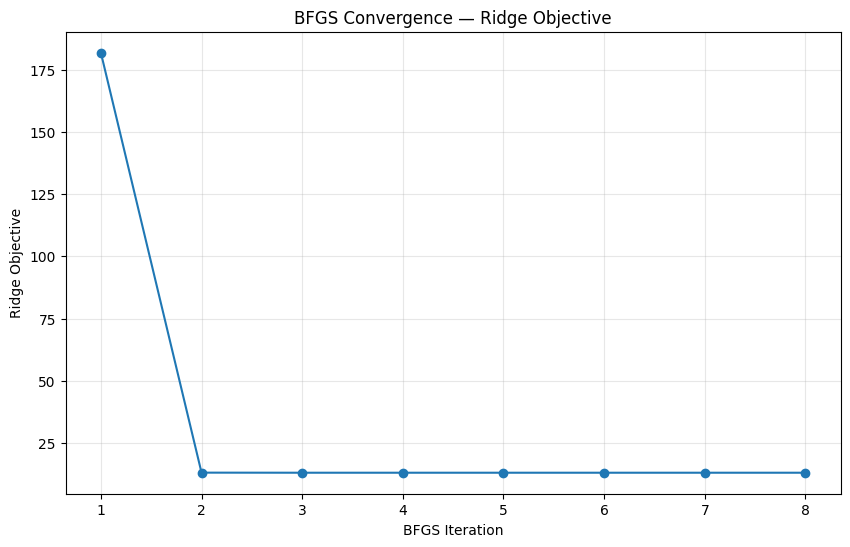

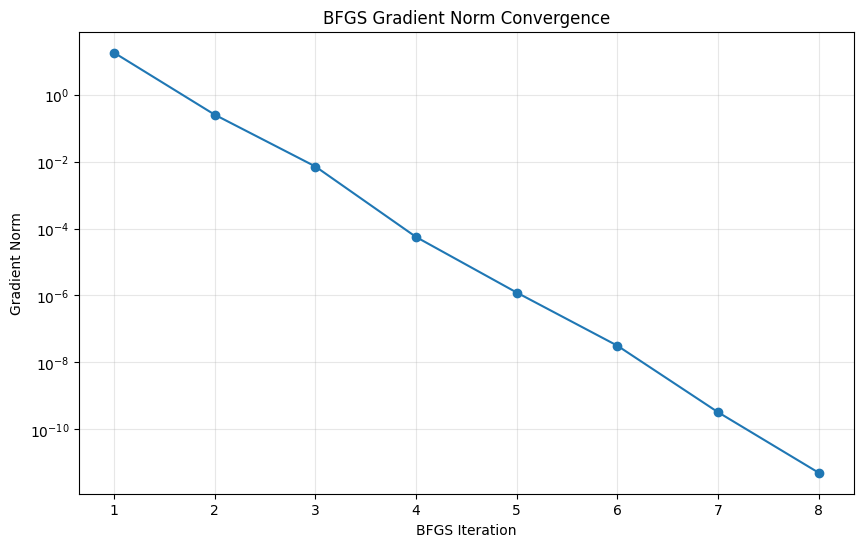

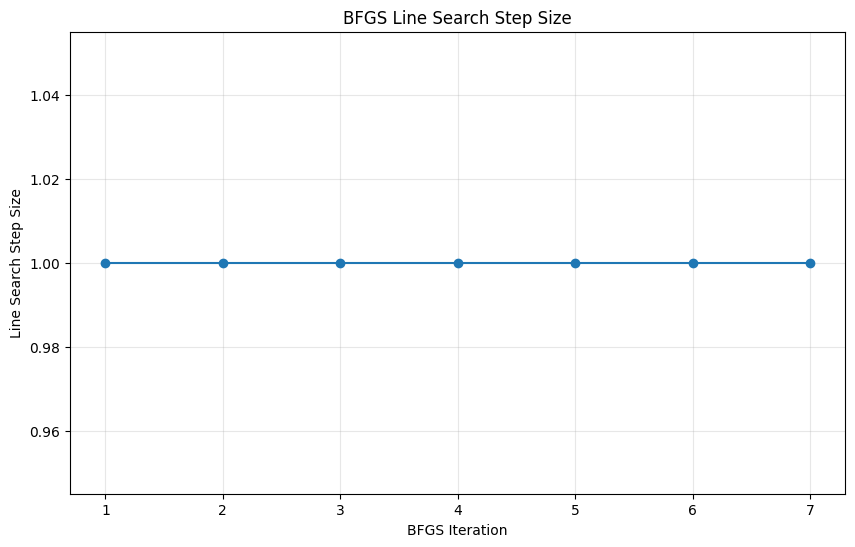

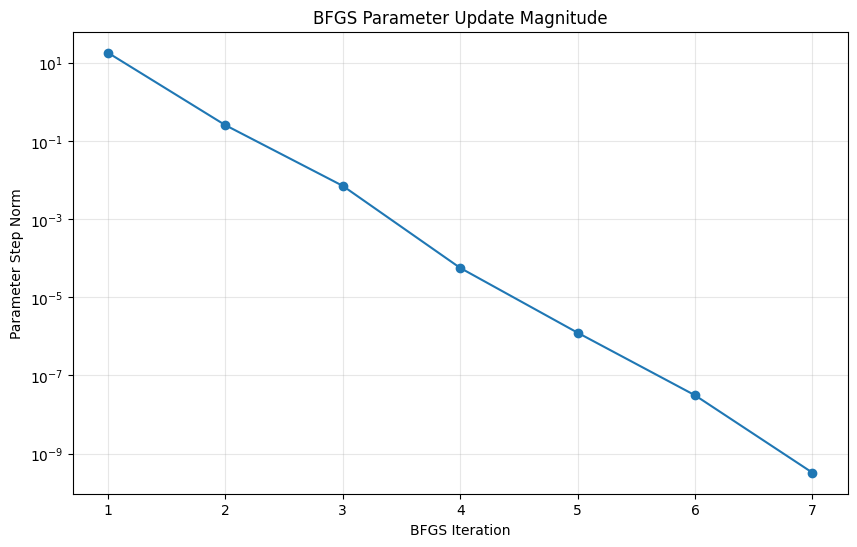

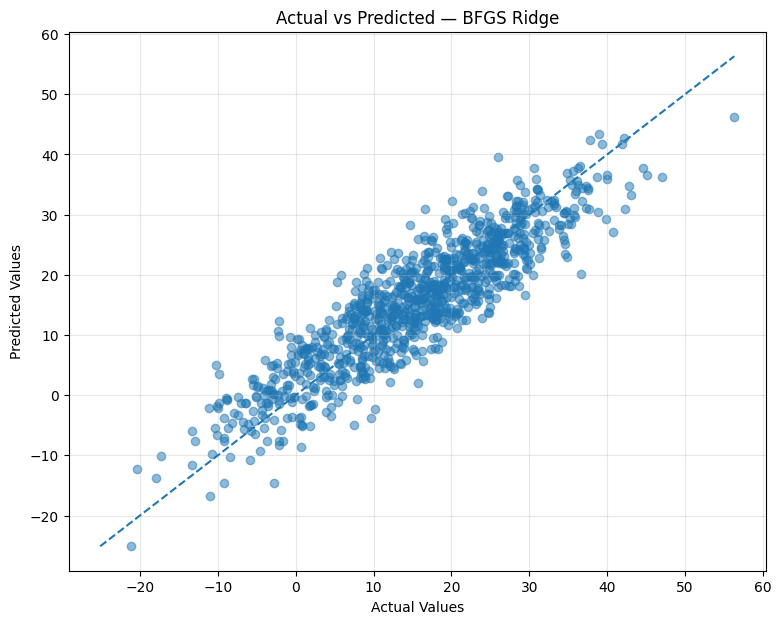

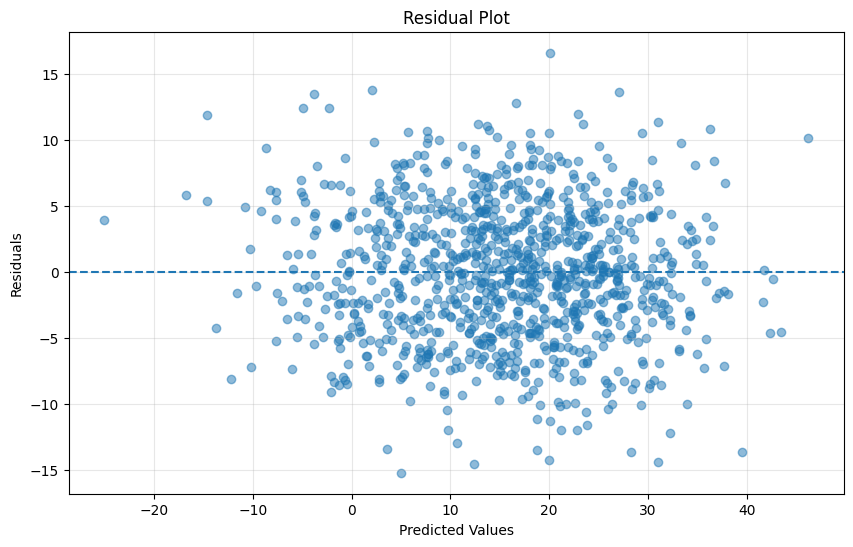

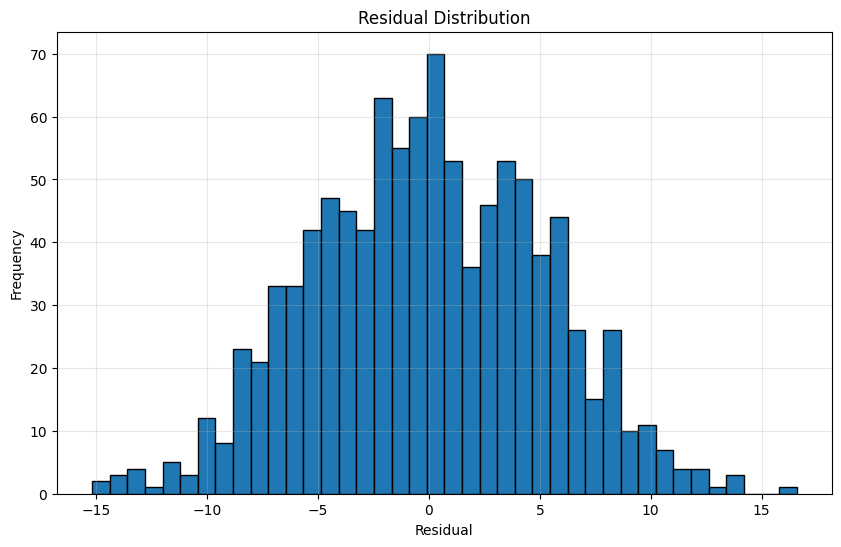

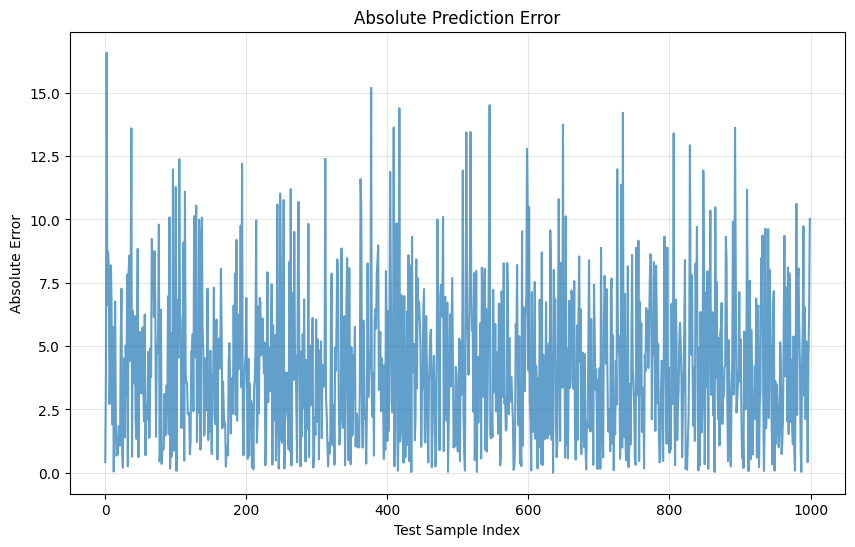

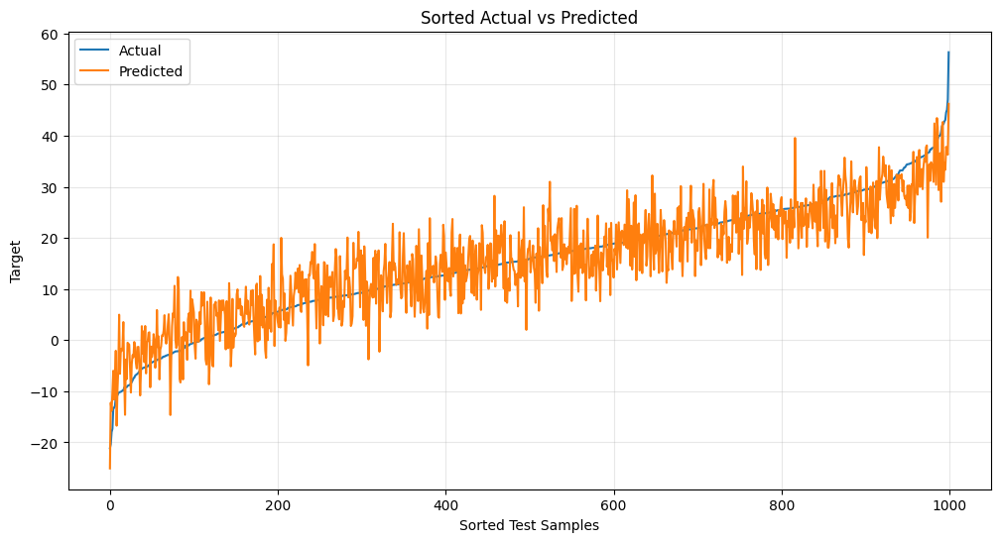

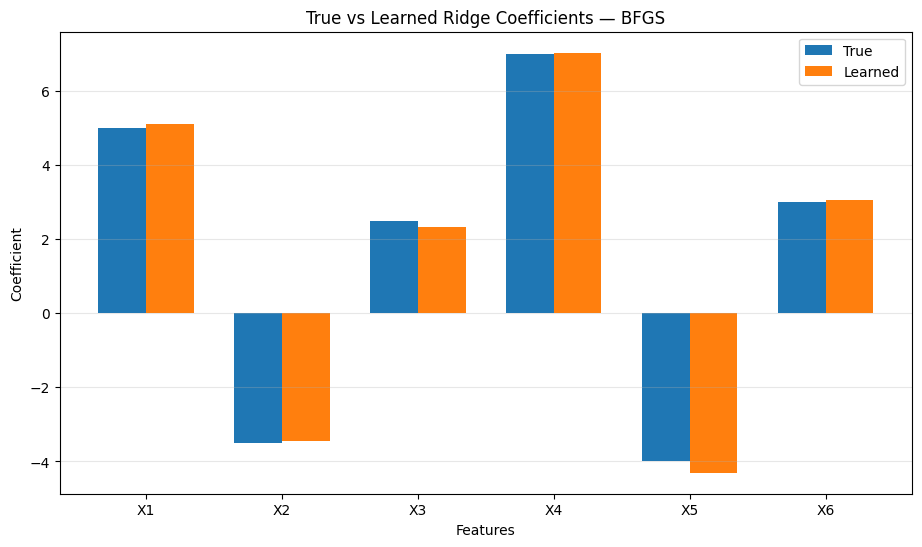

BFGS converged at iteration 8
BFGS converged at iteration 8
BFGS converged at iteration 8
BFGS converged at iteration 7
BFGS converged at iteration 8
BFGS converged at iteration 8
BFGS converged at iteration 9
BFGS converged at iteration 14

ALPHA ANALYSIS
    Alpha  Test RMSE  Test R²  Coefficient Norm
   0.0001   5.184100 0.801350         10.988151
   0.0010   5.184099 0.801350         10.988149
   0.0100   5.184098 0.801350         10.988124
   0.1000   5.184085 0.801351         10.987876
   1.0000   5.183960 0.801361         10.985397
  10.0000   5.182765 0.801453         10.960667
 100.0000   5.176969 0.801896         10.719364
1000.0000   5.505152 0.775984          8.785498


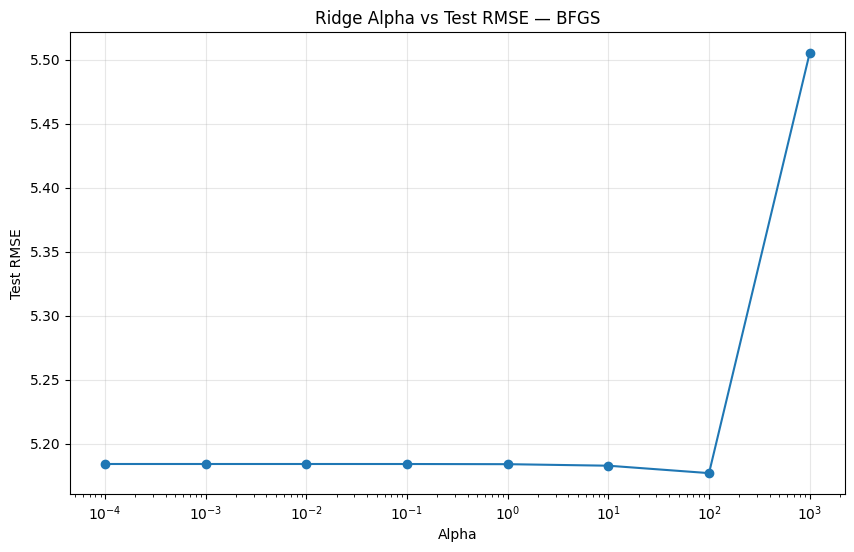

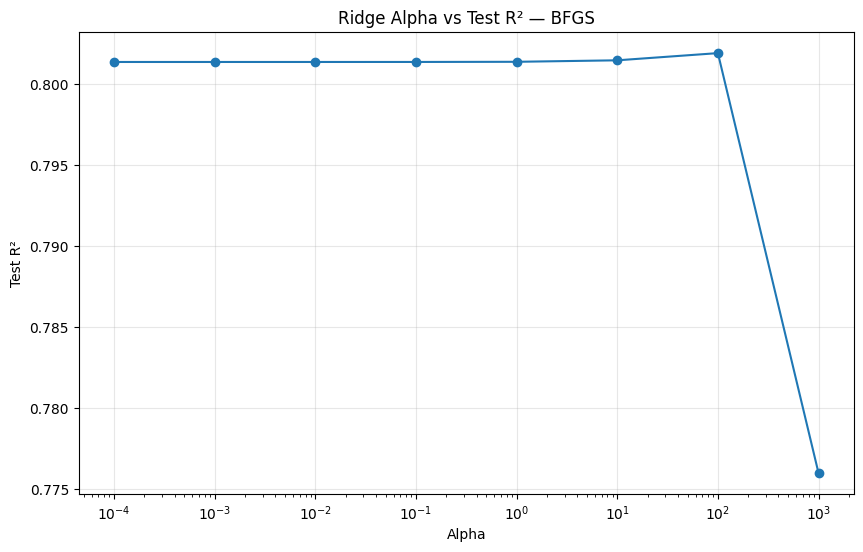

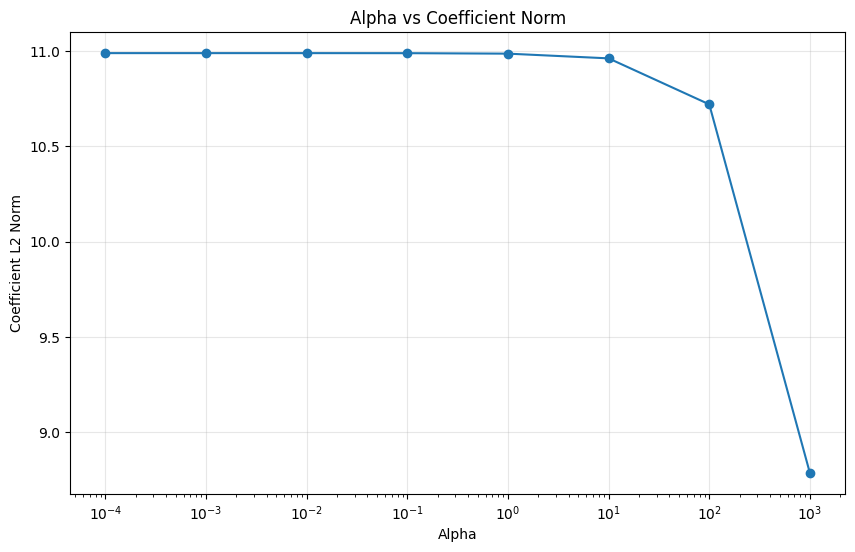

BFGS converged at iteration 8
BFGS converged at iteration 8
BFGS converged at iteration 8
BFGS converged at iteration 7
BFGS converged at iteration 8
BFGS converged at iteration 8
BFGS converged at iteration 9
BFGS converged at iteration 14


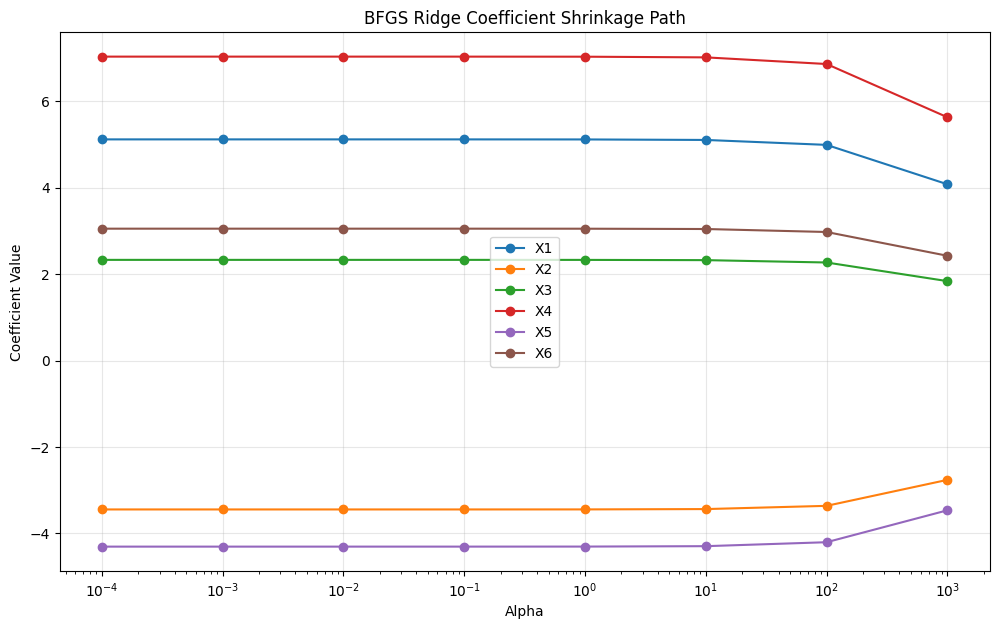


FINAL SUMMARY
Regression Method   : Ridge Regression
Optimization Method : BFGS
Scikit-learn Used   : NO
Number of Samples   : 5000
Number of Features  : 6
Training Samples    : 4000
Testing Samples     : 1000
Initial Alpha       : 1.0
Best Alpha          : 100.0
Best Test RMSE      : 5.176968992026857
Best Test R²        : 0.8018963726039736
BFGS Iterations     : 8
Final Test MAE      : 4.199865608232556
Final Test MSE      : 26.873436741565843
Final Test RMSE     : 5.183959562107506
Final Test R²       : 0.8013610044016006
Final Test Adj. R²  : 0.8001607687786496
Final Test Exp.Var. : 0.8014406342382097


In [10]:
# ============================================================
# RIDGE REGRESSION FROM SCRATCH
# BFGS / QUASI-NEWTON METHOD
# NO SCIKIT-LEARN
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ============================================================
# 1. RANDOM SEED
# ============================================================

np.random.seed(42)


# ============================================================
# 2. GENERATE LARGE SYNTHETIC DATASET
# ============================================================

n_samples = 5000
n_features = 6

X = np.random.randn(
    n_samples,
    n_features
)

# True parameters
true_intercept = 15.0

true_coefficients = np.array([
    5.0,
    -3.5,
    2.5,
    7.0,
    -4.0,
    3.0
])

# Gaussian noise
noise = np.random.normal(
    loc=0.0,
    scale=5.0,
    size=n_samples
)

# Target
y = (
    true_intercept
    + X @ true_coefficients
    + noise
)


print("=" * 70)
print("DATASET INFORMATION")
print("=" * 70)

print("Number of samples :", n_samples)
print("Number of features:", n_features)
print("X shape           :", X.shape)
print("y shape           :", y.shape)


# ============================================================
# 3. TRAIN / TEST SPLIT
# ============================================================

train_ratio = 0.80

indices = np.random.permutation(
    n_samples
)

train_size = int(
    train_ratio * n_samples
)

train_indices = indices[
    :train_size
]

test_indices = indices[
    train_size:
]

X_train = X[
    train_indices
]

X_test = X[
    test_indices
]

y_train = y[
    train_indices
]

y_test = y[
    test_indices
]


print("\n" + "=" * 70)
print("TRAIN / TEST SPLIT")
print("=" * 70)

print(
    "Training samples:",
    len(X_train)
)

print(
    "Testing samples :",
    len(X_test)
)


# ============================================================
# 4. STANDARDIZATION
# ============================================================

X_mean = np.mean(
    X_train,
    axis=0
)

X_std = np.std(
    X_train,
    axis=0
)

# Prevent division by zero
X_std[
    X_std == 0
] = 1.0

X_train_scaled = (
    X_train - X_mean
) / X_std

X_test_scaled = (
    X_test - X_mean
) / X_std


# ============================================================
# 5. RIDGE REGRESSION — BFGS
# ============================================================

class RidgeRegressionBFGS:

    def __init__(
        self,
        alpha=1.0,
        n_iterations=100,
        tolerance=1e-10,
        line_search=True,
        c1=1e-4,
        backtracking_factor=0.5
    ):

        self.alpha = alpha

        self.n_iterations = (
            n_iterations
        )

        self.tolerance = tolerance

        self.line_search = (
            line_search
        )

        self.c1 = c1

        self.backtracking_factor = (
            backtracking_factor
        )

        self.coef_ = None
        self.intercept_ = None

        # Optimization history
        self.loss_history_ = []

        self.gradient_norm_history_ = []

        self.step_norm_history_ = []

        self.learning_rate_history_ = []

        self.parameter_history_ = []


    # ========================================================
    # OBJECTIVE FUNCTION
    # ========================================================

    def _objective(
        self,
        theta,
        X,
        y
    ):

        n = X.shape[0]

        intercept = theta[0]

        coefficients = theta[1:]

        predictions = (
            intercept
            + X @ coefficients
        )

        error = (
            predictions - y
        )

        # Mean squared loss
        mse_loss = (
            0.5
            * np.mean(
                error ** 2
            )
        )

        # Ridge penalty
        ridge_penalty = (
            self.alpha
            / (2 * n)
            * np.sum(
                coefficients ** 2
            )
        )

        return (
            mse_loss
            + ridge_penalty
        )


    # ========================================================
    # GRADIENT
    # ========================================================

    def _gradient(
        self,
        theta,
        X,
        y
    ):

        n = X.shape[0]

        intercept = theta[0]

        coefficients = theta[1:]

        predictions = (
            intercept
            + X @ coefficients
        )

        error = (
            predictions - y
        )

        # ----------------------------------------------------
        # Gradient of intercept
        # ----------------------------------------------------

        gradient_intercept = (
            np.mean(error)
        )

        # ----------------------------------------------------
        # Gradient of coefficients
        # ----------------------------------------------------

        gradient_coefficients = (
            X.T @ error
        ) / n

        # Ridge regularization
        gradient_coefficients += (
            self.alpha
            / n
            * coefficients
        )

        # Combine
        gradient = np.concatenate(
            [
                np.array([
                    gradient_intercept
                ]),
                gradient_coefficients
            ]
        )

        return gradient


    # ========================================================
    # BACKTRACKING LINE SEARCH
    # ========================================================

    def _line_search(
        self,
        theta,
        direction,
        gradient,
        X,
        y
    ):

        current_loss = (
            self._objective(
                theta,
                X,
                y
            )
        )

        step_size = 1.0

        directional_derivative = (
            gradient @ direction
        )

        # Backtracking
        for _ in range(100):

            candidate_theta = (
                theta
                + step_size
                * direction
            )

            candidate_loss = (
                self._objective(
                    candidate_theta,
                    X,
                    y
                )
            )

            # Armijo condition
            if (
                candidate_loss
                <=
                current_loss
                +
                self.c1
                * step_size
                * directional_derivative
            ):

                return step_size

            step_size *= (
                self.backtracking_factor
            )

        return step_size


    # ========================================================
    # FIT
    # ========================================================

    def fit(
        self,
        X,
        y
    ):

        n_samples, n_features = (
            X.shape
        )

        # ----------------------------------------------------
        # Initial parameters
        # ----------------------------------------------------

        theta = np.zeros(
            n_features + 1
        )

        # ----------------------------------------------------
        # Initial inverse Hessian approximation
        #
        # B_0 = I
        # ----------------------------------------------------

        H_inv = np.eye(
            n_features + 1
        )

        # ----------------------------------------------------
        # Initial gradient
        # ----------------------------------------------------

        gradient = self._gradient(
            theta,
            X,
            y
        )

        # ----------------------------------------------------
        # BFGS iterations
        # ----------------------------------------------------

        for iteration in range(
            self.n_iterations
        ):

            # ------------------------------------------------
            # Current loss
            # ------------------------------------------------

            loss = self._objective(
                theta,
                X,
                y
            )

            self.loss_history_.append(
                loss
            )

            # ------------------------------------------------
            # Gradient norm
            # ------------------------------------------------

            gradient_norm = np.linalg.norm(
                gradient
            )

            self.gradient_norm_history_.append(
                gradient_norm
            )

            # ------------------------------------------------
            # Store parameters
            # ------------------------------------------------

            self.parameter_history_.append(
                theta.copy()
            )

            # ------------------------------------------------
            # Check convergence
            # ------------------------------------------------

            if (
                gradient_norm
                < self.tolerance
            ):

                print(
                    "BFGS converged at "
                    f"iteration {iteration + 1}"
                )

                break

            # ------------------------------------------------
            # BFGS search direction
            #
            # p_k = -H_k * gradient
            # ------------------------------------------------

            direction = -(
                H_inv @ gradient
            )

            # ------------------------------------------------
            # Make sure direction is descent direction
            # ------------------------------------------------

            if (
                gradient @ direction
                >= 0
            ):

                H_inv = np.eye(
                    n_features + 1
                )

                direction = -gradient

            # ------------------------------------------------
            # Line search
            # ------------------------------------------------

            if self.line_search:

                step_size = (
                    self._line_search(
                        theta,
                        direction,
                        gradient,
                        X,
                        y
                    )
                )

            else:

                step_size = 1.0

            self.learning_rate_history_.append(
                step_size
            )

            # ------------------------------------------------
            # Parameter update
            #
            # theta_new =
            # theta + alpha_k * p_k
            # ------------------------------------------------

            theta_new = (
                theta
                + step_size
                * direction
            )

            # ------------------------------------------------
            # Difference in parameters
            #
            # s_k = theta_(k+1) - theta_k
            # ------------------------------------------------

            s = (
                theta_new
                - theta
            )

            step_norm = np.linalg.norm(
                s
            )

            self.step_norm_history_.append(
                step_norm
            )

            # ------------------------------------------------
            # New gradient
            # ------------------------------------------------

            new_gradient = self._gradient(
                theta_new,
                X,
                y
            )

            # ------------------------------------------------
            # Difference in gradients
            #
            # y_k = g_(k+1) - g_k
            # ------------------------------------------------

            y_difference = (
                new_gradient
                - gradient
            )

            # ------------------------------------------------
            # BFGS update
            #
            # rho = 1 / (y_k^T s_k)
            #
            # H_(k+1) =
            #
            # (I-rho*s*y^T)
            # H_k
            # (I-rho*y*s^T)
            #
            # + rho*s*s^T
            # ------------------------------------------------

            curvature = (
                y_difference @ s
            )

            if (
                curvature
                > 1e-12
            ):

                rho = (
                    1.0
                    / curvature
                )

                identity = np.eye(
                    n_features + 1
                )

                left = (
                    identity
                    -
                    rho
                    * np.outer(
                        s,
                        y_difference
                    )
                )

                right = (
                    identity
                    -
                    rho
                    * np.outer(
                        y_difference,
                        s
                    )
                )

                H_inv = (
                    left
                    @ H_inv
                    @ right
                    +
                    rho
                    * np.outer(
                        s,
                        s
                    )
                )

            else:

                # Reset if curvature condition
                # becomes numerically unstable

                H_inv = np.eye(
                    n_features + 1
                )

            # ------------------------------------------------
            # Update
            # ------------------------------------------------

            theta = theta_new

            gradient = new_gradient

            # ------------------------------------------------
            # Parameter convergence
            # ------------------------------------------------

            if (
                step_norm
                < self.tolerance
            ):

                print(
                    "BFGS converged at "
                    f"iteration {iteration + 1}"
                )

                break

        # ----------------------------------------------------
        # Final parameters
        # ----------------------------------------------------

        self.theta_ = theta

        self.intercept_ = theta[0]

        self.coef_ = theta[1:]

        self.inverse_hessian_ = H_inv

        self.n_iterations_run_ = (
            iteration + 1
        )

        return self


    # ========================================================
    # PREDICT
    # ========================================================

    def predict(
        self,
        X
    ):

        return (
            self.intercept_
            + X @ self.coef_
        )


    # ========================================================
    # SCORE
    # ========================================================

    def score(
        self,
        X,
        y
    ):

        predictions = self.predict(
            X
        )

        ss_res = np.sum(
            (y - predictions) ** 2
        )

        ss_tot = np.sum(
            (y - np.mean(y)) ** 2
        )

        return (
            1
            -
            ss_res / ss_tot
        )


# ============================================================
# 6. EVALUATION METRICS FROM SCRATCH
# ============================================================

def mean_absolute_error(
    y_true,
    y_pred
):

    return np.mean(
        np.abs(
            y_true - y_pred
        )
    )


def mean_squared_error(
    y_true,
    y_pred
):

    return np.mean(
        (y_true - y_pred) ** 2
    )


def root_mean_squared_error(
    y_true,
    y_pred
):

    return np.sqrt(
        mean_squared_error(
            y_true,
            y_pred
        )
    )


def r2_score(
    y_true,
    y_pred
):

    ss_res = np.sum(
        (y_true - y_pred) ** 2
    )

    ss_tot = np.sum(
        (y_true - np.mean(y_true)) ** 2
    )

    return (
        1
        -
        ss_res / ss_tot
    )


def adjusted_r2_score(
    y_true,
    y_pred,
    n_features
):

    n = len(y_true)

    r2 = r2_score(
        y_true,
        y_pred
    )

    return (
        1
        -
        (
            (1 - r2)
            *
            (n - 1)
            /
            (n - n_features - 1)
        )
    )


def explained_variance_score(
    y_true,
    y_pred
):

    residuals = (
        y_true - y_pred
    )

    return (
        1
        -
        np.var(residuals)
        /
        np.var(y_true)
    )


# ============================================================
# 7. TRAIN BFGS RIDGE MODEL
# ============================================================

alpha = 1.0

model = RidgeRegressionBFGS(
    alpha=alpha,
    n_iterations=100,
    tolerance=1e-10,
    line_search=True
)

model.fit(
    X_train_scaled,
    y_train
)


# ============================================================
# 8. PREDICTIONS
# ============================================================

y_train_pred = model.predict(
    X_train_scaled
)

y_test_pred = model.predict(
    X_test_scaled
)


# ============================================================
# 9. CALCULATE EVALUATION METRICS
# ============================================================

train_mae = mean_absolute_error(
    y_train,
    y_train_pred
)

train_mse = mean_squared_error(
    y_train,
    y_train_pred
)

train_rmse = root_mean_squared_error(
    y_train,
    y_train_pred
)

train_r2 = r2_score(
    y_train,
    y_train_pred
)

train_adj_r2 = adjusted_r2_score(
    y_train,
    y_train_pred,
    n_features
)

train_ev = explained_variance_score(
    y_train,
    y_train_pred
)


test_mae = mean_absolute_error(
    y_test,
    y_test_pred
)

test_mse = mean_squared_error(
    y_test,
    y_test_pred
)

test_rmse = root_mean_squared_error(
    y_test,
    y_test_pred
)

test_r2 = r2_score(
    y_test,
    y_test_pred
)

test_adj_r2 = adjusted_r2_score(
    y_test,
    y_test_pred,
    n_features
)

test_ev = explained_variance_score(
    y_test,
    y_test_pred
)


# ============================================================
# 10. EVALUATION TABLE
# ============================================================

evaluation_results = pd.DataFrame({

    "Metric": [
        "MAE",
        "MSE",
        "RMSE",
        "R²",
        "Adjusted R²",
        "Explained Variance"
    ],

    "Train": [
        train_mae,
        train_mse,
        train_rmse,
        train_r2,
        train_adj_r2,
        train_ev
    ],

    "Test": [
        test_mae,
        test_mse,
        test_rmse,
        test_r2,
        test_adj_r2,
        test_ev
    ]
})


print("\n" + "=" * 70)
print("BFGS RIDGE REGRESSION — EVALUATION")
print("=" * 70)

print(
    evaluation_results.to_string(
        index=False
    )
)


# ============================================================
# 11. COEFFICIENT COMPARISON
# ============================================================

coefficient_results = pd.DataFrame({

    "Feature": [
        f"X{i+1}"
        for i in range(n_features)
    ],

    "True Coefficient":
        true_coefficients,

    "Learned Coefficient":
        model.coef_,

    "Absolute Difference":
        np.abs(
            true_coefficients
            - model.coef_
        )
})


print("\n" + "=" * 70)
print("COEFFICIENT COMPARISON")
print("=" * 70)

print(
    coefficient_results.to_string(
        index=False
    )
)

print(
    "\nTrue Intercept   :",
    true_intercept
)

print(
    "Learned Intercept:",
    model.intercept_
)


# ============================================================
# 12. OPTIMIZATION INFORMATION
# ============================================================

print("\n" + "=" * 70)
print("BFGS OPTIMIZATION INFORMATION")
print("=" * 70)

print(
    "Iterations executed:",
    model.n_iterations_run_
)

print(
    "Final objective:",
    model.loss_history_[-1]
)

print(
    "Final gradient norm:",
    model.gradient_norm_history_[-1]
)

print(
    "Final step norm:",
    model.step_norm_history_[-1]
)

print(
    "Final BFGS step size:",
    model.learning_rate_history_[-1]
)


# ============================================================
# 13. PLOT 1 — OBJECTIVE FUNCTION CONVERGENCE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    range(
        1,
        len(model.loss_history_) + 1
    ),
    model.loss_history_,
    marker="o"
)

plt.xlabel(
    "BFGS Iteration"
)

plt.ylabel(
    "Ridge Objective"
)

plt.title(
    "BFGS Convergence — Ridge Objective"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 14. PLOT 2 — GRADIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogy(
    range(
        1,
        len(
            model.gradient_norm_history_
        ) + 1
    ),
    model.gradient_norm_history_,
    marker="o"
)

plt.xlabel(
    "BFGS Iteration"
)

plt.ylabel(
    "Gradient Norm"
)

plt.title(
    "BFGS Gradient Norm Convergence"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 15. PLOT 3 — BFGS STEP SIZE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    range(
        1,
        len(
            model.learning_rate_history_
        ) + 1
    ),
    model.learning_rate_history_,
    marker="o"
)

plt.xlabel(
    "BFGS Iteration"
)

plt.ylabel(
    "Line Search Step Size"
)

plt.title(
    "BFGS Line Search Step Size"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 16. PLOT 4 — PARAMETER STEP NORM
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogy(
    range(
        1,
        len(
            model.step_norm_history_
        ) + 1
    ),
    model.step_norm_history_,
    marker="o"
)

plt.xlabel(
    "BFGS Iteration"
)

plt.ylabel(
    "Parameter Step Norm"
)

plt.title(
    "BFGS Parameter Update Magnitude"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 17. PLOT 5 — ACTUAL VS PREDICTED
# ============================================================

plt.figure(
    figsize=(9, 7)
)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.5
)

minimum = min(
    y_test.min(),
    y_test_pred.min()
)

maximum = max(
    y_test.max(),
    y_test_pred.max()
)

plt.plot(
    [minimum, maximum],
    [minimum, maximum],
    linestyle="--"
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Predicted Values"
)

plt.title(
    "Actual vs Predicted — BFGS Ridge"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 18. PLOT 6 — RESIDUAL PLOT
# ============================================================

residuals = (
    y_test
    - y_test_pred
)

plt.figure(
    figsize=(10, 6)
)

plt.scatter(
    y_test_pred,
    residuals,
    alpha=0.5
)

plt.axhline(
    0,
    linestyle="--"
)

plt.xlabel(
    "Predicted Values"
)

plt.ylabel(
    "Residuals"
)

plt.title(
    "Residual Plot"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 19. PLOT 7 — RESIDUAL DISTRIBUTION
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.hist(
    residuals,
    bins=40,
    edgecolor="black"
)

plt.xlabel(
    "Residual"
)

plt.ylabel(
    "Frequency"
)

plt.title(
    "Residual Distribution"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 20. PLOT 8 — ABSOLUTE ERROR
# ============================================================

absolute_errors = np.abs(
    residuals
)

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    absolute_errors,
    alpha=0.7
)

plt.xlabel(
    "Test Sample Index"
)

plt.ylabel(
    "Absolute Error"
)

plt.title(
    "Absolute Prediction Error"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 21. PLOT 9 — SORTED ACTUAL VS PREDICTED
# ============================================================

sorted_indices = np.argsort(
    y_test
)

sorted_actual = (
    y_test[
        sorted_indices
    ]
)

sorted_predicted = (
    y_test_pred[
        sorted_indices
    ]
)

plt.figure(
    figsize=(12, 6)
)

plt.plot(
    sorted_actual,
    label="Actual"
)

plt.plot(
    sorted_predicted,
    label="Predicted"
)

plt.xlabel(
    "Sorted Test Samples"
)

plt.ylabel(
    "Target"
)

plt.title(
    "Sorted Actual vs Predicted"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 22. PLOT 10 — TRUE VS LEARNED COEFFICIENTS
# ============================================================

feature_names = [
    f"X{i+1}"
    for i in range(n_features)
]

x_positions = np.arange(
    n_features
)

width = 0.35

plt.figure(
    figsize=(11, 6)
)

plt.bar(
    x_positions - width / 2,
    true_coefficients,
    width,
    label="True"
)

plt.bar(
    x_positions + width / 2,
    model.coef_,
    width,
    label="Learned"
)

plt.xticks(
    x_positions,
    feature_names
)

plt.xlabel(
    "Features"
)

plt.ylabel(
    "Coefficient"
)

plt.title(
    "True vs Learned Ridge Coefficients — BFGS"
)

plt.legend()

plt.grid(
    axis="y",
    alpha=0.3
)

plt.show()


# ============================================================
# 23. ALPHA ANALYSIS
# ============================================================

alpha_values = np.array([
    0.0001,
    0.001,
    0.01,
    0.1,
    1.0,
    10.0,
    100.0,
    1000.0
])

alpha_rmse = []

alpha_r2 = []

alpha_coefficient_norm = []


for current_alpha in alpha_values:

    temp_model = RidgeRegressionBFGS(
        alpha=current_alpha,
        n_iterations=100,
        tolerance=1e-10,
        line_search=True
    )

    temp_model.fit(
        X_train_scaled,
        y_train
    )

    temp_prediction = (
        temp_model.predict(
            X_test_scaled
        )
    )

    rmse = root_mean_squared_error(
        y_test,
        temp_prediction
    )

    r2 = r2_score(
        y_test,
        temp_prediction
    )

    coefficient_norm = (
        np.linalg.norm(
            temp_model.coef_
        )
    )

    alpha_rmse.append(
        rmse
    )

    alpha_r2.append(
        r2
    )

    alpha_coefficient_norm.append(
        coefficient_norm
    )


alpha_results = pd.DataFrame({

    "Alpha": alpha_values,

    "Test RMSE": alpha_rmse,

    "Test R²": alpha_r2,

    "Coefficient Norm":
        alpha_coefficient_norm
})


print("\n" + "=" * 70)
print("ALPHA ANALYSIS")
print("=" * 70)

print(
    alpha_results.to_string(
        index=False
    )
)


# ============================================================
# 24. PLOT 11 — ALPHA VS RMSE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_rmse,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "Ridge Alpha vs Test RMSE — BFGS"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 25. PLOT 12 — ALPHA VS R²
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_r2,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Test R²"
)

plt.title(
    "Ridge Alpha vs Test R² — BFGS"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 26. PLOT 13 — ALPHA VS COEFFICIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_coefficient_norm,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Coefficient L2 Norm"
)

plt.title(
    "Alpha vs Coefficient Norm"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 27. COEFFICIENT SHRINKAGE PATH
# ============================================================

coefficient_paths = []


for current_alpha in alpha_values:

    temp_model = RidgeRegressionBFGS(
        alpha=current_alpha,
        n_iterations=100,
        tolerance=1e-10,
        line_search=True
    )

    temp_model.fit(
        X_train_scaled,
        y_train
    )

    coefficient_paths.append(
        temp_model.coef_
    )


coefficient_paths = np.array(
    coefficient_paths
)


# ============================================================
# 28. PLOT 14 — COEFFICIENT SHRINKAGE PATH
# ============================================================

plt.figure(
    figsize=(12, 7)
)

for j in range(
    n_features
):

    plt.semilogx(
        alpha_values,
        coefficient_paths[:, j],
        marker="o",
        label=f"X{j+1}"
    )

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "BFGS Ridge Coefficient Shrinkage Path"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 29. FINAL SUMMARY
# ============================================================

best_alpha_index = np.argmin(
    alpha_rmse
)

best_alpha = (
    alpha_values[
        best_alpha_index
    ]
)

best_rmse = (
    alpha_rmse[
        best_alpha_index
    ]
)

best_r2 = (
    alpha_r2[
        best_alpha_index
    ]
)


print("\n" + "=" * 70)
print("FINAL SUMMARY")
print("=" * 70)

print(
    "Regression Method   : Ridge Regression"
)

print(
    "Optimization Method : BFGS"
)

print(
    "Scikit-learn Used   : NO"
)

print(
    "Number of Samples   :",
    n_samples
)

print(
    "Number of Features  :",
    n_features
)

print(
    "Training Samples    :",
    len(X_train)
)

print(
    "Testing Samples     :",
    len(X_test)
)

print(
    "Initial Alpha       :",
    alpha
)

print(
    "Best Alpha          :",
    best_alpha
)

print(
    "Best Test RMSE      :",
    best_rmse
)

print(
    "Best Test R²        :",
    best_r2
)

print(
    "BFGS Iterations     :",
    model.n_iterations_run_
)

print(
    "Final Test MAE      :",
    test_mae
)

print(
    "Final Test MSE      :",
    test_mse
)

print(
    "Final Test RMSE     :",
    test_rmse
)

print(
    "Final Test R²       :",
    test_r2
)

print(
    "Final Test Adj. R²  :",
    test_adj_r2
)

print(
    "Final Test Exp.Var. :",
    test_ev
)

print("=" * 70)

DATASET INFORMATION
Number of samples : 5000
Number of features: 6
X shape           : (5000, 6)
y shape           : (5000,)

TRAIN / TEST SPLIT
Training samples: 4000
Testing samples : 1000
L-BFGS converged at iteration 8

L-BFGS RIDGE REGRESSION — EVALUATION
            Metric     Train      Test
               MAE  4.059473  4.199866
               MSE 26.134430 26.873437
              RMSE  5.112185  5.183960
                R²  0.821699  0.801361
       Adjusted R²  0.821431  0.800161
Explained Variance  0.821699  0.801441

COEFFICIENT COMPARISON
Feature  True Coefficient  Learned Coefficient  Absolute Difference
     X1               5.0             5.114671             0.114671
     X2              -3.5            -3.444627             0.055373
     X3               2.5             2.327873             0.172127
     X4               7.0             7.028951             0.028951
     X5              -4.0            -4.304521             0.304521
     X6               3.0         

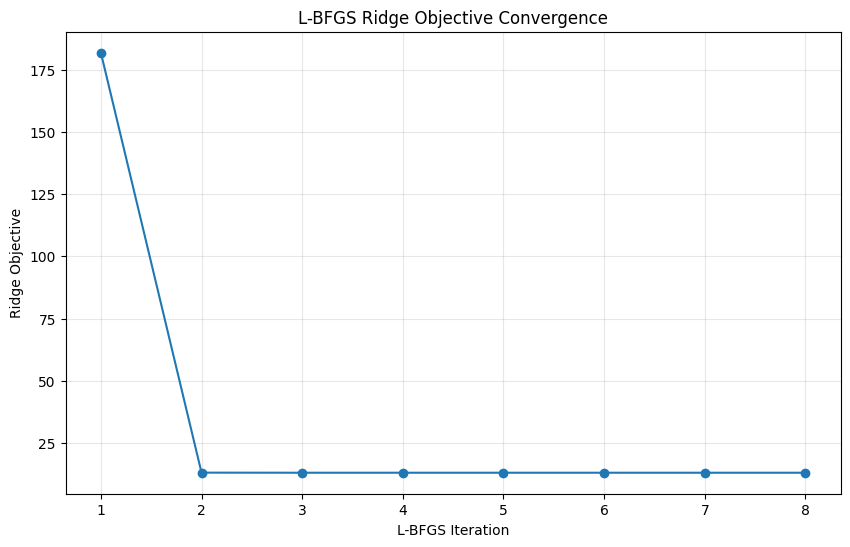

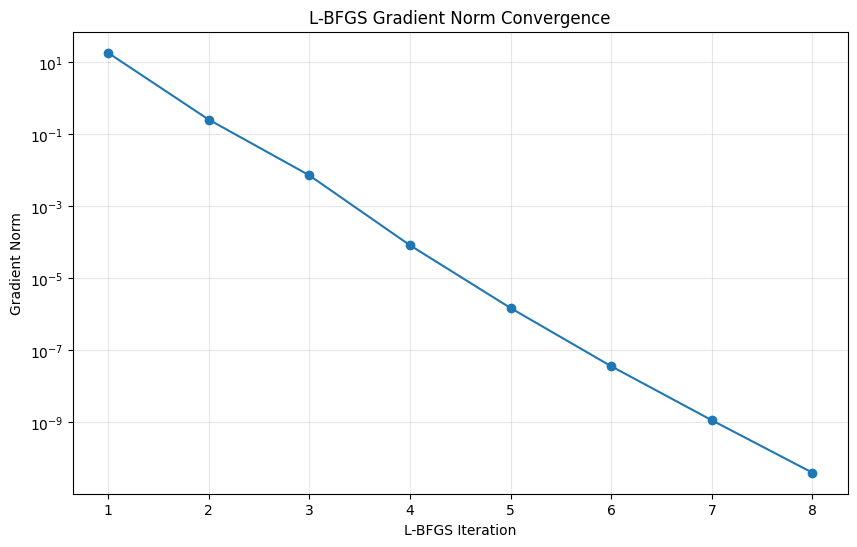

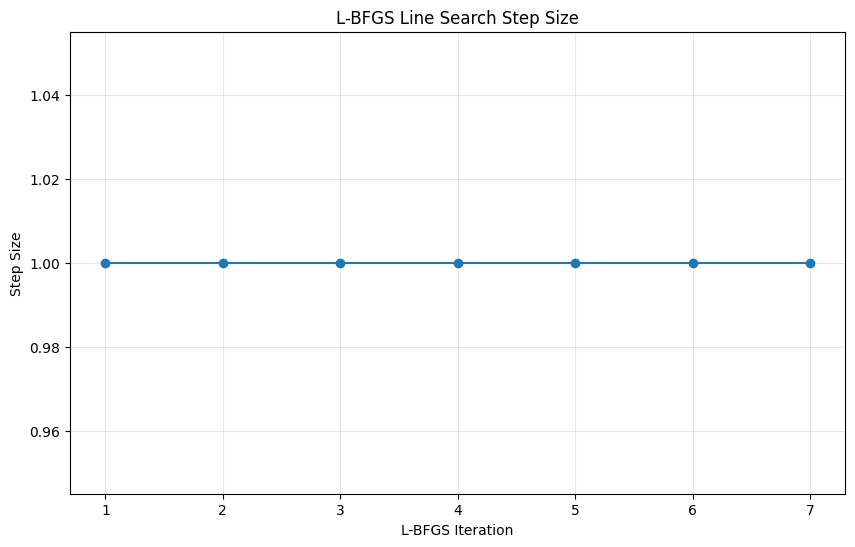

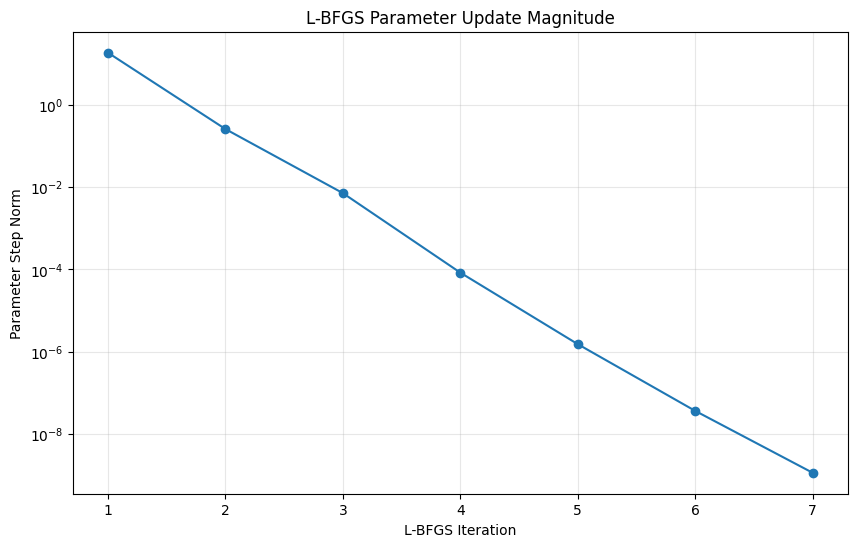

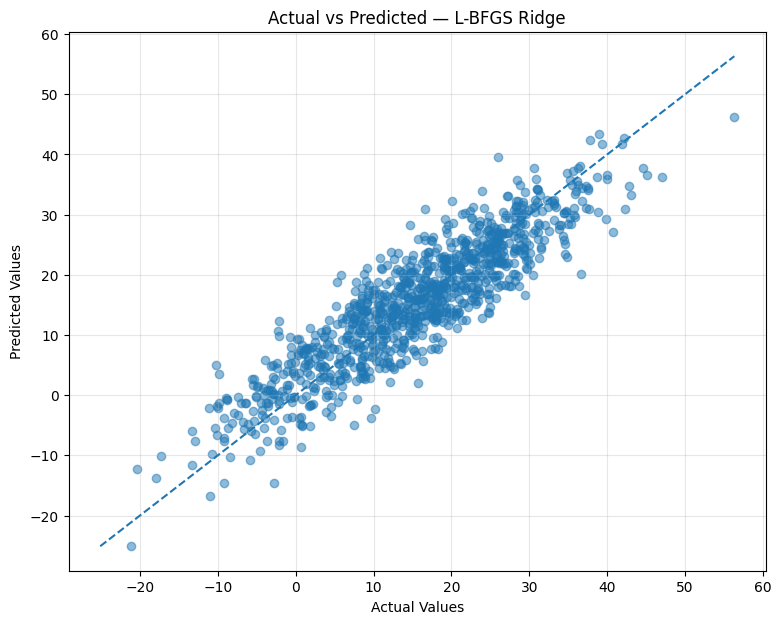

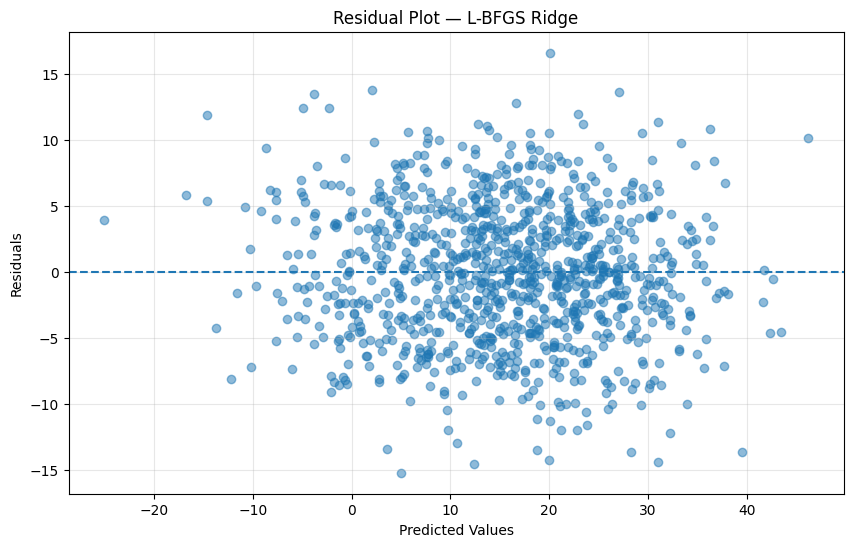

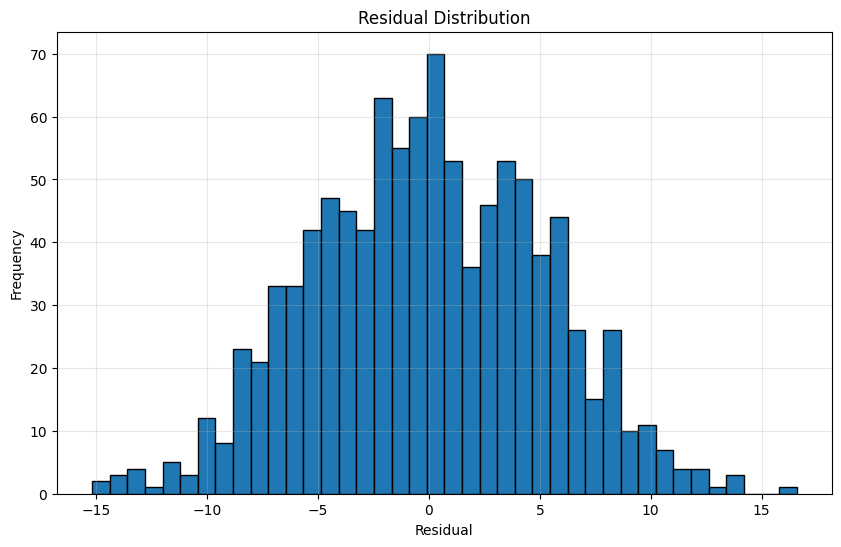

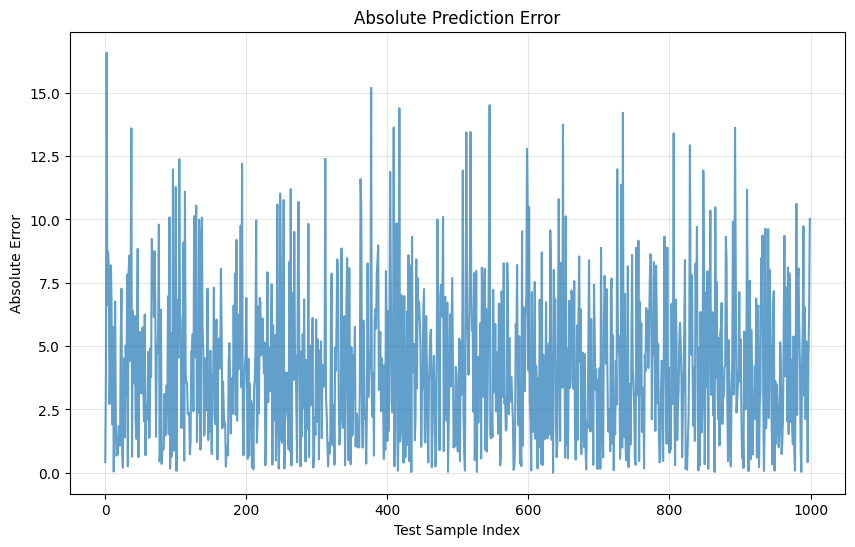

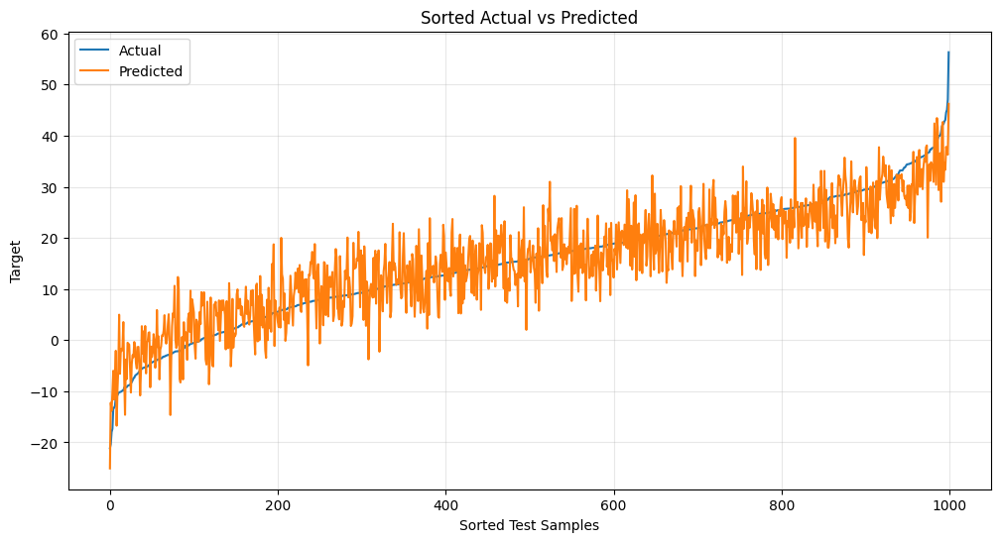

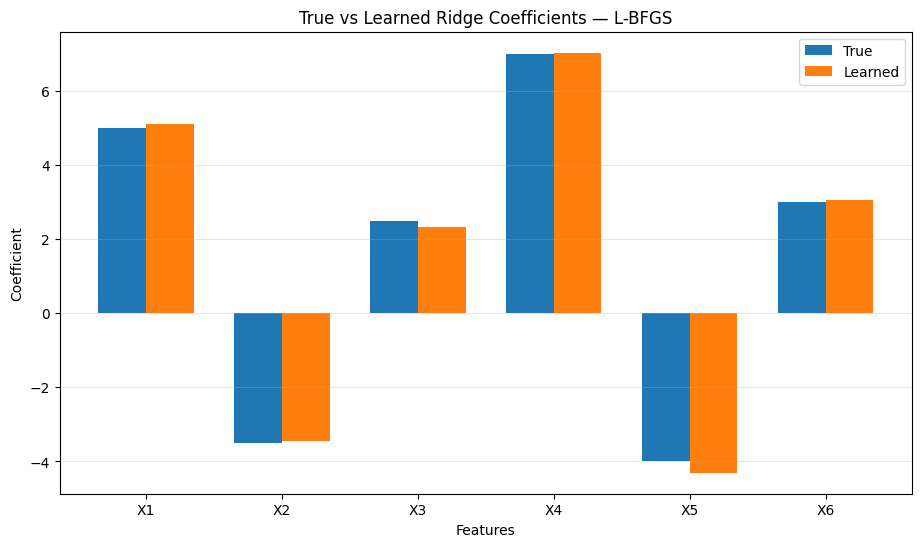

L-BFGS converged at iteration 11
L-BFGS converged at iteration 9
L-BFGS converged at iteration 8
L-BFGS converged at iteration 10
L-BFGS converged at iteration 8
L-BFGS converged at iteration 8
L-BFGS converged at iteration 10
L-BFGS converged at iteration 9

ALPHA ANALYSIS
    Alpha  Test RMSE  Test R²  Coefficient Norm
   0.0001   5.184100 0.801350         10.988151
   0.0010   5.184099 0.801350         10.988149
   0.0100   5.184098 0.801350         10.988124
   0.1000   5.184085 0.801351         10.987876
   1.0000   5.183960 0.801361         10.985397
  10.0000   5.182765 0.801453         10.960667
 100.0000   5.176969 0.801896         10.719364
1000.0000   5.505152 0.775984          8.785498


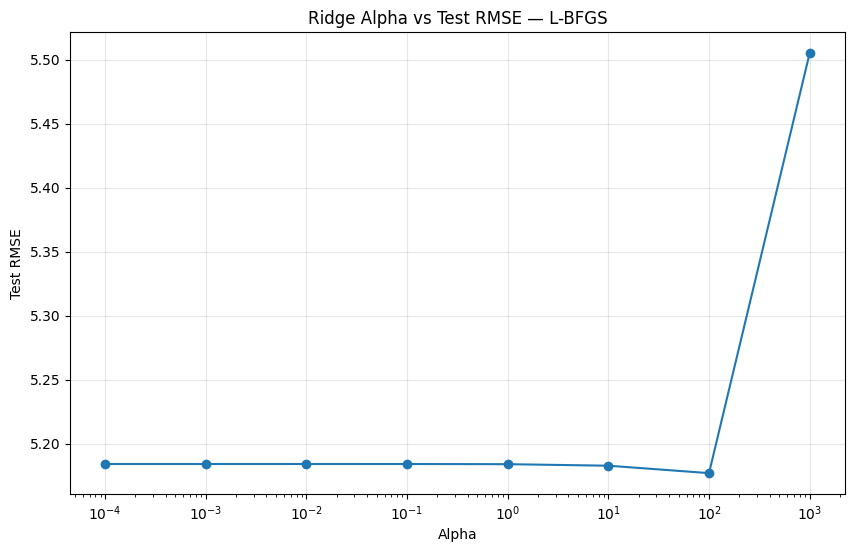

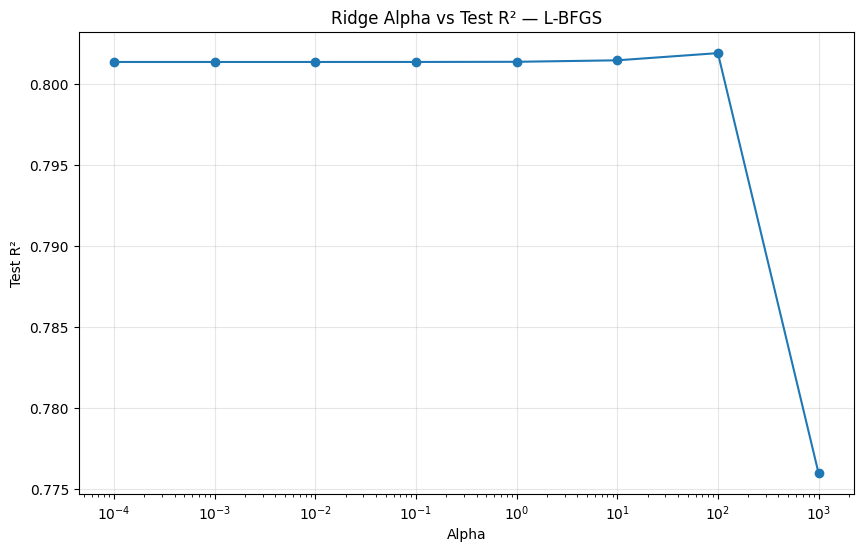

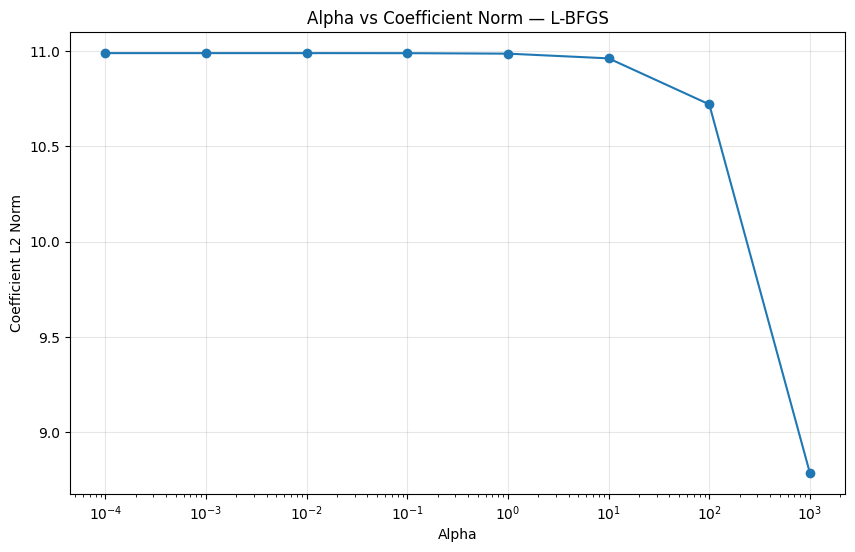

L-BFGS converged at iteration 11
L-BFGS converged at iteration 9
L-BFGS converged at iteration 8
L-BFGS converged at iteration 10
L-BFGS converged at iteration 8
L-BFGS converged at iteration 8
L-BFGS converged at iteration 10
L-BFGS converged at iteration 9


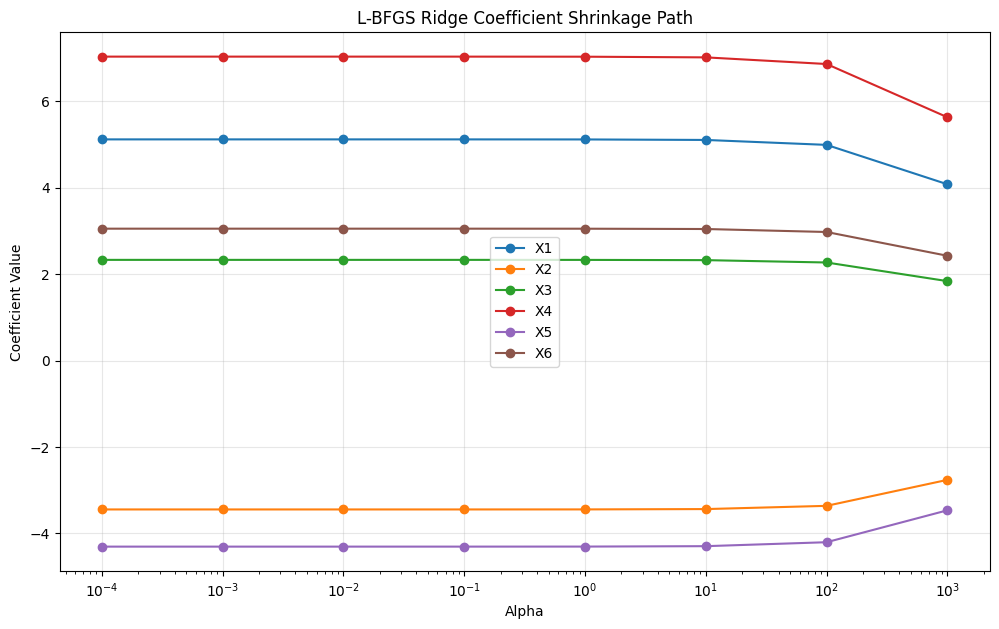

L-BFGS converged at iteration 8
L-BFGS converged at iteration 8
L-BFGS converged at iteration 8
L-BFGS converged at iteration 8
L-BFGS converged at iteration 8

L-BFGS MEMORY SIZE ANALYSIS
 Memory Size  Test RMSE  Iterations
           1    5.18396           8
           3    5.18396           8
           5    5.18396           8
          10    5.18396           8
          20    5.18396           8


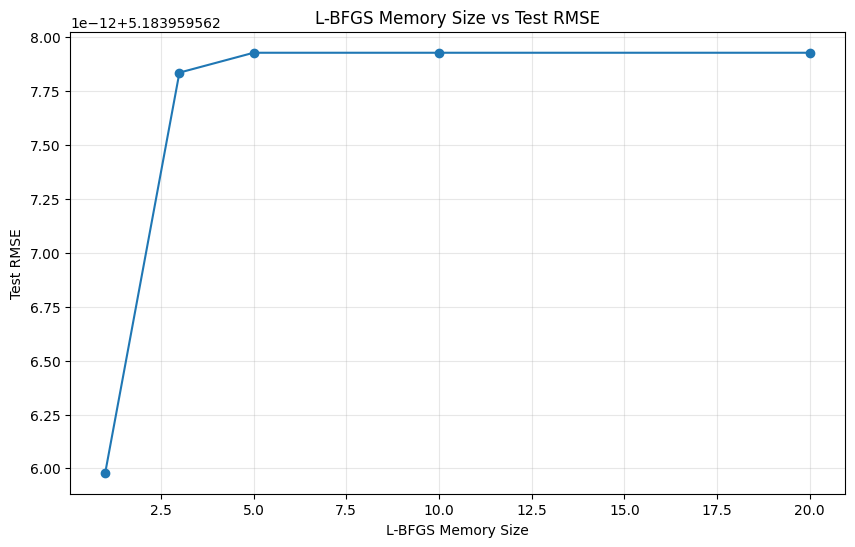

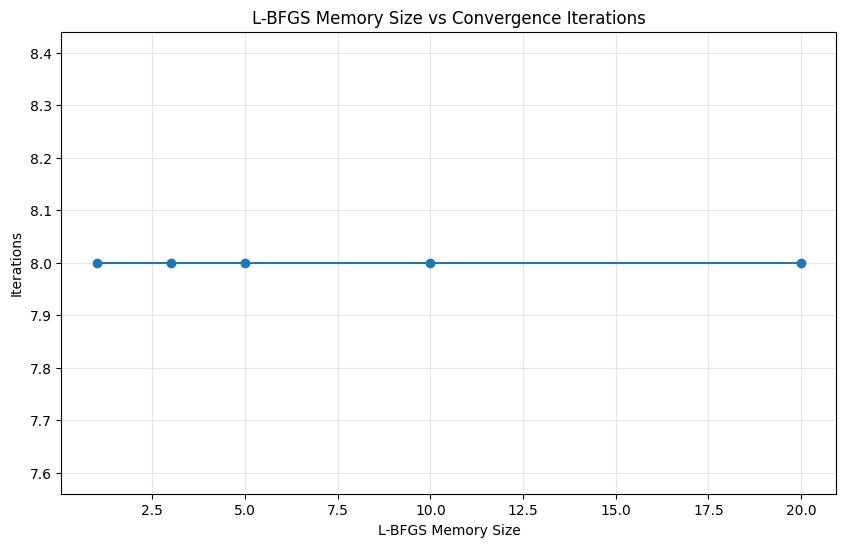


FINAL SUMMARY
Regression Method   : Ridge Regression
Optimization Method : L-BFGS
Scikit-learn Used   : NO
Number of Samples   : 5000
Number of Features  : 6
Training Samples    : 4000
Testing Samples     : 1000
Alpha               : 1.0
L-BFGS Memory Size  : 10
Best Alpha          : 100.0
Best Test RMSE      : 5.176968992028173
Best Test R²        : 0.8018963726038729
L-BFGS Iterations   : 8
Final Test MAE      : 4.199865608233736
Final Test MSE      : 26.873436741570227
Final Test RMSE     : 5.183959562107929
Final Test R²       : 0.8013610044015681
Final Test Adj. R²  : 0.8001607687786169
Final Test Exp.Var. : 0.8014406342381781


In [11]:
# ============================================================
# RIDGE REGRESSION FROM SCRATCH
# L-BFGS / LIMITED-MEMORY BFGS
# NO SCIKIT-LEARN
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ============================================================
# 1. RANDOM SEED
# ============================================================

np.random.seed(42)


# ============================================================
# 2. GENERATE LARGE SYNTHETIC DATASET
# ============================================================

n_samples = 5000
n_features = 6

X = np.random.randn(
    n_samples,
    n_features
)

# True intercept
true_intercept = 15.0

# True coefficients
true_coefficients = np.array([
    5.0,
    -3.5,
    2.5,
    7.0,
    -4.0,
    3.0
])

# Noise
noise = np.random.normal(
    loc=0.0,
    scale=5.0,
    size=n_samples
)

# Target variable
y = (
    true_intercept
    + X @ true_coefficients
    + noise
)


print("=" * 75)
print("DATASET INFORMATION")
print("=" * 75)

print("Number of samples :", n_samples)
print("Number of features:", n_features)
print("X shape           :", X.shape)
print("y shape           :", y.shape)


# ============================================================
# 3. TRAIN / TEST SPLIT
# ============================================================

train_ratio = 0.80

indices = np.random.permutation(
    n_samples
)

train_size = int(
    train_ratio * n_samples
)

train_indices = indices[
    :train_size
]

test_indices = indices[
    train_size:
]

X_train = X[
    train_indices
]

X_test = X[
    test_indices
]

y_train = y[
    train_indices
]

y_test = y[
    test_indices
]


print("\n" + "=" * 75)
print("TRAIN / TEST SPLIT")
print("=" * 75)

print(
    "Training samples:",
    len(X_train)
)

print(
    "Testing samples :",
    len(X_test)
)


# ============================================================
# 4. STANDARDIZATION
# ============================================================

X_mean = np.mean(
    X_train,
    axis=0
)

X_std = np.std(
    X_train,
    axis=0
)

# Avoid division by zero
X_std[
    X_std == 0
] = 1.0

X_train_scaled = (
    X_train - X_mean
) / X_std

X_test_scaled = (
    X_test - X_mean
) / X_std


# ============================================================
# 5. L-BFGS RIDGE REGRESSION
# ============================================================

class RidgeRegressionLBFGS:

    def __init__(
        self,
        alpha=1.0,
        n_iterations=100,
        memory_size=10,
        tolerance=1e-10,
        line_search=True,
        c1=1e-4,
        backtracking_factor=0.5
    ):

        # Ridge regularization
        self.alpha = alpha

        # Maximum L-BFGS iterations
        self.n_iterations = (
            n_iterations
        )

        # Number of correction pairs
        self.memory_size = (
            memory_size
        )

        # Convergence tolerance
        self.tolerance = (
            tolerance
        )

        # Line search
        self.line_search = (
            line_search
        )

        self.c1 = c1

        self.backtracking_factor = (
            backtracking_factor
        )

        # Model parameters
        self.coef_ = None

        self.intercept_ = None

        # Optimization histories
        self.loss_history_ = []

        self.gradient_norm_history_ = []

        self.step_norm_history_ = []

        self.learning_rate_history_ = []

        self.parameter_history_ = []


    # ========================================================
    # OBJECTIVE FUNCTION
    # ========================================================

    def _objective(
        self,
        theta,
        X,
        y
    ):

        n = X.shape[0]

        intercept = theta[0]

        coefficients = theta[1:]

        # Predictions
        predictions = (
            intercept
            + X @ coefficients
        )

        # Error
        error = (
            predictions - y
        )

        # ----------------------------------------------------
        # Least-squares component
        # ----------------------------------------------------

        mse_component = (
            0.5
            * np.mean(
                error ** 2
            )
        )

        # ----------------------------------------------------
        # Ridge penalty
        #
        # Intercept is NOT regularized
        # ----------------------------------------------------

        ridge_component = (
            self.alpha
            / (2 * n)
            * np.sum(
                coefficients ** 2
            )
        )

        return (
            mse_component
            + ridge_component
        )


    # ========================================================
    # GRADIENT
    # ========================================================

    def _gradient(
        self,
        theta,
        X,
        y
    ):

        n = X.shape[0]

        intercept = theta[0]

        coefficients = theta[1:]

        # Predictions
        predictions = (
            intercept
            + X @ coefficients
        )

        # Error
        error = (
            predictions - y
        )

        # ----------------------------------------------------
        # Intercept gradient
        # ----------------------------------------------------

        gradient_intercept = (
            np.mean(error)
        )

        # ----------------------------------------------------
        # Coefficient gradient
        # ----------------------------------------------------

        gradient_coefficients = (
            X.T @ error
        ) / n

        # ----------------------------------------------------
        # Ridge gradient
        # ----------------------------------------------------

        gradient_coefficients += (
            self.alpha
            / n
            * coefficients
        )

        # ----------------------------------------------------
        # Combine intercept + coefficients
        # ----------------------------------------------------

        gradient = np.concatenate(
            [
                np.array([
                    gradient_intercept
                ]),
                gradient_coefficients
            ]
        )

        return gradient


    # ========================================================
    # BACKTRACKING LINE SEARCH
    # ========================================================

    def _line_search(
        self,
        theta,
        direction,
        gradient,
        X,
        y
    ):

        # Current objective
        current_loss = (
            self._objective(
                theta,
                X,
                y
            )
        )

        # Start with full step
        step_size = 1.0

        # Directional derivative
        directional_derivative = (
            gradient @ direction
        )

        # ----------------------------------------------------
        # Backtracking
        # ----------------------------------------------------

        for _ in range(100):

            candidate_theta = (
                theta
                + step_size
                * direction
            )

            candidate_loss = (
                self._objective(
                    candidate_theta,
                    X,
                    y
                )
            )

            # Armijo condition
            if (
                candidate_loss
                <=
                current_loss
                +
                self.c1
                * step_size
                * directional_derivative
            ):

                return step_size

            step_size *= (
                self.backtracking_factor
            )

        return step_size


    # ========================================================
    # L-BFGS TWO-LOOP RECURSION
    # ========================================================

    def _two_loop_recursion(
        self,
        gradient,
        s_history,
        y_history,
        rho_history
    ):

        # ----------------------------------------------------
        # Initial vector
        # ----------------------------------------------------

        q = gradient.copy()

        alpha_values = []

        # ----------------------------------------------------
        # First loop
        #
        # Process newest -> oldest
        # ----------------------------------------------------

        for i in range(
            len(s_history) - 1,
            -1,
            -1
        ):

            s = s_history[i]

            y = y_history[i]

            rho = rho_history[i]

            alpha_value = (
                rho
                * (s @ q)
            )

            alpha_values.append(
                alpha_value
            )

            q = (
                q
                - alpha_value * y
            )

        # ----------------------------------------------------
        # Initial Hessian scaling
        # ----------------------------------------------------

        if len(
            s_history
        ) > 0:

            last_s = s_history[-1]

            last_y = y_history[-1]

            denominator = (
                last_y @ last_y
            )

            if denominator > 1e-20:

                gamma = (
                    last_s @ last_y
                ) / denominator

            else:

                gamma = 1.0

        else:

            gamma = 1.0

        r = (
            gamma * q
        )

        # ----------------------------------------------------
        # Second loop
        #
        # Process oldest -> newest
        # ----------------------------------------------------

        for i in range(
            len(s_history)
        ):

            s = s_history[i]

            y = y_history[i]

            rho = rho_history[i]

            alpha_value = (
                alpha_values[
                    len(s_history) - 1 - i
                ]
            )

            beta = (
                rho
                * (y @ r)
            )

            r = (
                r
                + s
                * (
                    alpha_value
                    - beta
                )
            )

        # ----------------------------------------------------
        # Search direction
        # ----------------------------------------------------

        direction = -r

        return direction


    # ========================================================
    # FIT
    # ========================================================

    def fit(
        self,
        X,
        y
    ):

        n_samples, n_features = (
            X.shape
        )

        # ----------------------------------------------------
        # Initialize parameters
        # ----------------------------------------------------

        theta = np.zeros(
            n_features + 1
        )

        # ----------------------------------------------------
        # L-BFGS memory
        #
        # Store only recent:
        #
        # s_k = theta_(k+1) - theta_k
        #
        # y_k = gradient_(k+1) - gradient_k
        # ----------------------------------------------------

        s_history = []

        y_history = []

        rho_history = []

        # ----------------------------------------------------
        # Initial gradient
        # ----------------------------------------------------

        gradient = self._gradient(
            theta,
            X,
            y
        )

        # ----------------------------------------------------
        # Optimization
        # ----------------------------------------------------

        for iteration in range(
            self.n_iterations
        ):

            # ------------------------------------------------
            # Current loss
            # ------------------------------------------------

            loss = self._objective(
                theta,
                X,
                y
            )

            self.loss_history_.append(
                loss
            )

            # ------------------------------------------------
            # Gradient norm
            # ------------------------------------------------

            gradient_norm = (
                np.linalg.norm(
                    gradient
                )
            )

            self.gradient_norm_history_.append(
                gradient_norm
            )

            # ------------------------------------------------
            # Save parameters
            # ------------------------------------------------

            self.parameter_history_.append(
                theta.copy()
            )

            # ------------------------------------------------
            # Convergence test
            # ------------------------------------------------

            if (
                gradient_norm
                < self.tolerance
            ):

                print(
                    "L-BFGS converged at "
                    f"iteration {iteration + 1}"
                )

                break

            # ------------------------------------------------
            # Determine search direction
            # ------------------------------------------------

            direction = (
                self._two_loop_recursion(
                    gradient,
                    s_history,
                    y_history,
                    rho_history
                )
            )

            # ------------------------------------------------
            # Ensure descent direction
            # ------------------------------------------------

            if (
                gradient @ direction
                >= 0
            ):

                direction = -gradient

                # Reset memory
                s_history = []

                y_history = []

                rho_history = []

            # ------------------------------------------------
            # Line search
            # ------------------------------------------------

            if self.line_search:

                step_size = (
                    self._line_search(
                        theta,
                        direction,
                        gradient,
                        X,
                        y
                    )
                )

            else:

                step_size = 1.0

            self.learning_rate_history_.append(
                step_size
            )

            # ------------------------------------------------
            # Parameter update
            # ------------------------------------------------

            theta_new = (
                theta
                + step_size
                * direction
            )

            # ------------------------------------------------
            # s_k
            # ------------------------------------------------

            s = (
                theta_new
                - theta
            )

            step_norm = (
                np.linalg.norm(
                    s
                )
            )

            self.step_norm_history_.append(
                step_norm
            )

            # ------------------------------------------------
            # New gradient
            # ------------------------------------------------

            new_gradient = (
                self._gradient(
                    theta_new,
                    X,
                    y
                )
            )

            # ------------------------------------------------
            # y_k
            # ------------------------------------------------

            y_difference = (
                new_gradient
                - gradient
            )

            # ------------------------------------------------
            # Curvature
            # ------------------------------------------------

            curvature = (
                y_difference @ s
            )

            # ------------------------------------------------
            # Update memory
            # ------------------------------------------------

            if (
                curvature
                > 1e-12
            ):

                rho = (
                    1.0
                    / curvature
                )

                s_history.append(
                    s.copy()
                )

                y_history.append(
                    y_difference.copy()
                )

                rho_history.append(
                    rho
                )

                # ------------------------------------------------
                # Keep only latest memory_size pairs
                # ------------------------------------------------

                if (
                    len(s_history)
                    >
                    self.memory_size
                ):

                    s_history.pop(0)

                    y_history.pop(0)

                    rho_history.pop(0)

            else:

                # Numerical safeguard
                s_history = []

                y_history = []

                rho_history = []

            # ------------------------------------------------
            # Update
            # ------------------------------------------------

            theta = theta_new

            gradient = new_gradient

            # ------------------------------------------------
            # Parameter convergence
            # ------------------------------------------------

            if (
                step_norm
                < self.tolerance
            ):

                print(
                    "L-BFGS converged at "
                    f"iteration {iteration + 1}"
                )

                break

        # ----------------------------------------------------
        # Store final parameters
        # ----------------------------------------------------

        self.theta_ = theta

        self.intercept_ = theta[0]

        self.coef_ = theta[1:]

        self.n_iterations_run_ = (
            iteration + 1
        )

        # Store final memory
        self.s_history_ = s_history

        self.y_history_ = y_history

        self.rho_history_ = rho_history

        return self


    # ========================================================
    # PREDICT
    # ========================================================

    def predict(
        self,
        X
    ):

        return (
            self.intercept_
            + X @ self.coef_
        )


    # ========================================================
    # SCORE
    # ========================================================

    def score(
        self,
        X,
        y
    ):

        predictions = self.predict(
            X
        )

        ss_res = np.sum(
            (y - predictions) ** 2
        )

        ss_tot = np.sum(
            (y - np.mean(y)) ** 2
        )

        return (
            1
            -
            ss_res / ss_tot
        )


# ============================================================
# 6. EVALUATION METRICS FROM SCRATCH
# ============================================================

def mean_absolute_error(
    y_true,
    y_pred
):

    return np.mean(
        np.abs(
            y_true - y_pred
        )
    )


def mean_squared_error(
    y_true,
    y_pred
):

    return np.mean(
        (y_true - y_pred) ** 2
    )


def root_mean_squared_error(
    y_true,
    y_pred
):

    return np.sqrt(
        mean_squared_error(
            y_true,
            y_pred
        )
    )


def r2_score(
    y_true,
    y_pred
):

    ss_res = np.sum(
        (y_true - y_pred) ** 2
    )

    ss_tot = np.sum(
        (y_true - np.mean(y_true)) ** 2
    )

    return (
        1
        -
        ss_res / ss_tot
    )


def adjusted_r2_score(
    y_true,
    y_pred,
    n_features
):

    n = len(y_true)

    r2 = r2_score(
        y_true,
        y_pred
    )

    return (
        1
        -
        (
            (1 - r2)
            *
            (n - 1)
            /
            (n - n_features - 1)
        )
    )


def explained_variance_score(
    y_true,
    y_pred
):

    residuals = (
        y_true - y_pred
    )

    return (
        1
        -
        np.var(residuals)
        /
        np.var(y_true)
    )


# ============================================================
# 7. TRAIN L-BFGS RIDGE MODEL
# ============================================================

alpha = 1.0

model = RidgeRegressionLBFGS(
    alpha=alpha,
    n_iterations=100,
    memory_size=10,
    tolerance=1e-10,
    line_search=True
)

model.fit(
    X_train_scaled,
    y_train
)


# ============================================================
# 8. PREDICTIONS
# ============================================================

y_train_pred = (
    model.predict(
        X_train_scaled
    )
)

y_test_pred = (
    model.predict(
        X_test_scaled
    )
)


# ============================================================
# 9. EVALUATION
# ============================================================

train_mae = mean_absolute_error(
    y_train,
    y_train_pred
)

train_mse = mean_squared_error(
    y_train,
    y_train_pred
)

train_rmse = root_mean_squared_error(
    y_train,
    y_train_pred
)

train_r2 = r2_score(
    y_train,
    y_train_pred
)

train_adj_r2 = adjusted_r2_score(
    y_train,
    y_train_pred,
    n_features
)

train_ev = explained_variance_score(
    y_train,
    y_train_pred
)


test_mae = mean_absolute_error(
    y_test,
    y_test_pred
)

test_mse = mean_squared_error(
    y_test,
    y_test_pred
)

test_rmse = root_mean_squared_error(
    y_test,
    y_test_pred
)

test_r2 = r2_score(
    y_test,
    y_test_pred
)

test_adj_r2 = adjusted_r2_score(
    y_test,
    y_test_pred,
    n_features
)

test_ev = explained_variance_score(
    y_test,
    y_test_pred
)


# ============================================================
# 10. EVALUATION TABLE
# ============================================================

evaluation_results = pd.DataFrame({

    "Metric": [
        "MAE",
        "MSE",
        "RMSE",
        "R²",
        "Adjusted R²",
        "Explained Variance"
    ],

    "Train": [
        train_mae,
        train_mse,
        train_rmse,
        train_r2,
        train_adj_r2,
        train_ev
    ],

    "Test": [
        test_mae,
        test_mse,
        test_rmse,
        test_r2,
        test_adj_r2,
        test_ev
    ]
})


print("\n" + "=" * 75)
print("L-BFGS RIDGE REGRESSION — EVALUATION")
print("=" * 75)

print(
    evaluation_results.to_string(
        index=False
    )
)


# ============================================================
# 11. COEFFICIENT COMPARISON
# ============================================================

coefficient_results = pd.DataFrame({

    "Feature": [
        f"X{i+1}"
        for i in range(n_features)
    ],

    "True Coefficient":
        true_coefficients,

    "Learned Coefficient":
        model.coef_,

    "Absolute Difference":
        np.abs(
            true_coefficients
            - model.coef_
        )
})


print("\n" + "=" * 75)
print("COEFFICIENT COMPARISON")
print("=" * 75)

print(
    coefficient_results.to_string(
        index=False
    )
)

print(
    "\nTrue Intercept   :",
    true_intercept
)

print(
    "Learned Intercept:",
    model.intercept_
)


# ============================================================
# 12. L-BFGS OPTIMIZATION INFORMATION
# ============================================================

print("\n" + "=" * 75)
print("L-BFGS OPTIMIZATION INFORMATION")
print("=" * 75)

print(
    "Iterations executed:",
    model.n_iterations_run_
)

print(
    "Memory size:",
    model.memory_size
)

print(
    "Stored correction pairs:",
    len(model.s_history_)
)

print(
    "Final objective:",
    model.loss_history_[-1]
)

print(
    "Final gradient norm:",
    model.gradient_norm_history_[-1]
)

print(
    "Final step norm:",
    model.step_norm_history_[-1]
)

print(
    "Final step size:",
    model.learning_rate_history_[-1]
)


# ============================================================
# 13. PLOT 1 — OBJECTIVE CONVERGENCE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    range(
        1,
        len(model.loss_history_) + 1
    ),
    model.loss_history_,
    marker="o"
)

plt.xlabel(
    "L-BFGS Iteration"
)

plt.ylabel(
    "Ridge Objective"
)

plt.title(
    "L-BFGS Ridge Objective Convergence"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 14. PLOT 2 — GRADIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogy(
    range(
        1,
        len(
            model.gradient_norm_history_
        ) + 1
    ),
    model.gradient_norm_history_,
    marker="o"
)

plt.xlabel(
    "L-BFGS Iteration"
)

plt.ylabel(
    "Gradient Norm"
)

plt.title(
    "L-BFGS Gradient Norm Convergence"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 15. PLOT 3 — STEP SIZE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    range(
        1,
        len(
            model.learning_rate_history_
        ) + 1
    ),
    model.learning_rate_history_,
    marker="o"
)

plt.xlabel(
    "L-BFGS Iteration"
)

plt.ylabel(
    "Step Size"
)

plt.title(
    "L-BFGS Line Search Step Size"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 16. PLOT 4 — STEP NORM
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogy(
    range(
        1,
        len(
            model.step_norm_history_
        ) + 1
    ),
    model.step_norm_history_,
    marker="o"
)

plt.xlabel(
    "L-BFGS Iteration"
)

plt.ylabel(
    "Parameter Step Norm"
)

plt.title(
    "L-BFGS Parameter Update Magnitude"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 17. PLOT 5 — ACTUAL VS PREDICTED
# ============================================================

plt.figure(
    figsize=(9, 7)
)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.5
)

minimum = min(
    y_test.min(),
    y_test_pred.min()
)

maximum = max(
    y_test.max(),
    y_test_pred.max()
)

plt.plot(
    [minimum, maximum],
    [minimum, maximum],
    linestyle="--"
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Predicted Values"
)

plt.title(
    "Actual vs Predicted — L-BFGS Ridge"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 18. PLOT 6 — RESIDUALS
# ============================================================

residuals = (
    y_test
    - y_test_pred
)

plt.figure(
    figsize=(10, 6)
)

plt.scatter(
    y_test_pred,
    residuals,
    alpha=0.5
)

plt.axhline(
    0,
    linestyle="--"
)

plt.xlabel(
    "Predicted Values"
)

plt.ylabel(
    "Residuals"
)

plt.title(
    "Residual Plot — L-BFGS Ridge"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 19. PLOT 7 — RESIDUAL DISTRIBUTION
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.hist(
    residuals,
    bins=40,
    edgecolor="black"
)

plt.xlabel(
    "Residual"
)

plt.ylabel(
    "Frequency"
)

plt.title(
    "Residual Distribution"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 20. PLOT 8 — ABSOLUTE ERROR
# ============================================================

absolute_errors = np.abs(
    residuals
)

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    absolute_errors,
    alpha=0.7
)

plt.xlabel(
    "Test Sample Index"
)

plt.ylabel(
    "Absolute Error"
)

plt.title(
    "Absolute Prediction Error"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 21. PLOT 9 — SORTED ACTUAL VS PREDICTED
# ============================================================

sorted_indices = np.argsort(
    y_test
)

sorted_actual = (
    y_test[
        sorted_indices
    ]
)

sorted_predicted = (
    y_test_pred[
        sorted_indices
    ]
)

plt.figure(
    figsize=(12, 6)
)

plt.plot(
    sorted_actual,
    label="Actual"
)

plt.plot(
    sorted_predicted,
    label="Predicted"
)

plt.xlabel(
    "Sorted Test Samples"
)

plt.ylabel(
    "Target"
)

plt.title(
    "Sorted Actual vs Predicted"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 22. PLOT 10 — TRUE VS LEARNED COEFFICIENTS
# ============================================================

feature_names = [
    f"X{i+1}"
    for i in range(n_features)
]

x_positions = np.arange(
    n_features
)

width = 0.35

plt.figure(
    figsize=(11, 6)
)

plt.bar(
    x_positions - width / 2,
    true_coefficients,
    width,
    label="True"
)

plt.bar(
    x_positions + width / 2,
    model.coef_,
    width,
    label="Learned"
)

plt.xticks(
    x_positions,
    feature_names
)

plt.xlabel(
    "Features"
)

plt.ylabel(
    "Coefficient"
)

plt.title(
    "True vs Learned Ridge Coefficients — L-BFGS"
)

plt.legend()

plt.grid(
    axis="y",
    alpha=0.3
)

plt.show()


# ============================================================
# 23. ALPHA ANALYSIS
# ============================================================

alpha_values = np.array([
    0.0001,
    0.001,
    0.01,
    0.1,
    1.0,
    10.0,
    100.0,
    1000.0
])

alpha_rmse = []

alpha_r2 = []

alpha_coefficient_norm = []


for current_alpha in alpha_values:

    temp_model = RidgeRegressionLBFGS(
        alpha=current_alpha,
        n_iterations=100,
        memory_size=10,
        tolerance=1e-10,
        line_search=True
    )

    temp_model.fit(
        X_train_scaled,
        y_train
    )

    temp_prediction = (
        temp_model.predict(
            X_test_scaled
        )
    )

    rmse = root_mean_squared_error(
        y_test,
        temp_prediction
    )

    r2 = r2_score(
        y_test,
        temp_prediction
    )

    coefficient_norm = (
        np.linalg.norm(
            temp_model.coef_
        )
    )

    alpha_rmse.append(
        rmse
    )

    alpha_r2.append(
        r2
    )

    alpha_coefficient_norm.append(
        coefficient_norm
    )


alpha_results = pd.DataFrame({

    "Alpha": alpha_values,

    "Test RMSE": alpha_rmse,

    "Test R²": alpha_r2,

    "Coefficient Norm":
        alpha_coefficient_norm
})


print("\n" + "=" * 75)
print("ALPHA ANALYSIS")
print("=" * 75)

print(
    alpha_results.to_string(
        index=False
    )
)


# ============================================================
# 24. PLOT 11 — ALPHA VS RMSE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_rmse,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "Ridge Alpha vs Test RMSE — L-BFGS"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 25. PLOT 12 — ALPHA VS R²
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_r2,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Test R²"
)

plt.title(
    "Ridge Alpha vs Test R² — L-BFGS"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 26. PLOT 13 — ALPHA VS COEFFICIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_coefficient_norm,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Coefficient L2 Norm"
)

plt.title(
    "Alpha vs Coefficient Norm — L-BFGS"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 27. COEFFICIENT SHRINKAGE PATH
# ============================================================

coefficient_paths = []


for current_alpha in alpha_values:

    temp_model = RidgeRegressionLBFGS(
        alpha=current_alpha,
        n_iterations=100,
        memory_size=10,
        tolerance=1e-10,
        line_search=True
    )

    temp_model.fit(
        X_train_scaled,
        y_train
    )

    coefficient_paths.append(
        temp_model.coef_
    )


coefficient_paths = np.array(
    coefficient_paths
)


# ============================================================
# 28. PLOT 14 — COEFFICIENT SHRINKAGE
# ============================================================

plt.figure(
    figsize=(12, 7)
)

for j in range(
    n_features
):

    plt.semilogx(
        alpha_values,
        coefficient_paths[:, j],
        marker="o",
        label=f"X{j+1}"
    )

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "L-BFGS Ridge Coefficient Shrinkage Path"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 29. MEMORY SIZE ANALYSIS
# ============================================================

memory_values = [
    1,
    3,
    5,
    10,
    20
]

memory_rmse = []

memory_iterations = []


for memory in memory_values:

    temp_model = RidgeRegressionLBFGS(
        alpha=alpha,
        n_iterations=100,
        memory_size=memory,
        tolerance=1e-10,
        line_search=True
    )

    temp_model.fit(
        X_train_scaled,
        y_train
    )

    temp_prediction = (
        temp_model.predict(
            X_test_scaled
        )
    )

    rmse = root_mean_squared_error(
        y_test,
        temp_prediction
    )

    memory_rmse.append(
        rmse
    )

    memory_iterations.append(
        temp_model.n_iterations_run_
    )


memory_results = pd.DataFrame({

    "Memory Size": memory_values,

    "Test RMSE": memory_rmse,

    "Iterations": memory_iterations
})


print("\n" + "=" * 75)
print("L-BFGS MEMORY SIZE ANALYSIS")
print("=" * 75)

print(
    memory_results.to_string(
        index=False
    )
)


# ============================================================
# 30. PLOT 15 — MEMORY SIZE VS RMSE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    memory_values,
    memory_rmse,
    marker="o"
)

plt.xlabel(
    "L-BFGS Memory Size"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "L-BFGS Memory Size vs Test RMSE"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 31. PLOT 16 — MEMORY SIZE VS ITERATIONS
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    memory_values,
    memory_iterations,
    marker="o"
)

plt.xlabel(
    "L-BFGS Memory Size"
)

plt.ylabel(
    "Iterations"
)

plt.title(
    "L-BFGS Memory Size vs Convergence Iterations"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 32. FINAL SUMMARY
# ============================================================

best_alpha_index = np.argmin(
    alpha_rmse
)

best_alpha = (
    alpha_values[
        best_alpha_index
    ]
)

best_rmse = (
    alpha_rmse[
        best_alpha_index
    ]
)

best_r2 = (
    alpha_r2[
        best_alpha_index
    ]
)


print("\n" + "=" * 75)
print("FINAL SUMMARY")
print("=" * 75)

print(
    "Regression Method   : Ridge Regression"
)

print(
    "Optimization Method : L-BFGS"
)

print(
    "Scikit-learn Used   : NO"
)

print(
    "Number of Samples   :",
    n_samples
)

print(
    "Number of Features  :",
    n_features
)

print(
    "Training Samples    :",
    len(X_train)
)

print(
    "Testing Samples     :",
    len(X_test)
)

print(
    "Alpha               :",
    alpha
)

print(
    "L-BFGS Memory Size  :",
    model.memory_size
)

print(
    "Best Alpha          :",
    best_alpha
)

print(
    "Best Test RMSE      :",
    best_rmse
)

print(
    "Best Test R²        :",
    best_r2
)

print(
    "L-BFGS Iterations   :",
    model.n_iterations_run_
)

print(
    "Final Test MAE      :",
    test_mae
)

print(
    "Final Test MSE      :",
    test_mse
)

print(
    "Final Test RMSE     :",
    test_rmse
)

print(
    "Final Test R²       :",
    test_r2
)

print(
    "Final Test Adj. R²  :",
    test_adj_r2
)

print(
    "Final Test Exp.Var. :",
    test_ev
)

print("=" * 75)

DATASET INFORMATION
Number of samples : 5000
Number of features: 6
X shape           : (5000, 6)
y shape           : (5000,)

TRAIN / TEST SPLIT
Training samples: 4000
Testing samples : 1000
Coordinate Descent converged at iteration 7

COORDINATE DESCENT RIDGE — EVALUATION
            Metric     Train      Test
               MAE  4.059473  4.199866
               MSE 26.134430 26.873437
              RMSE  5.112185  5.183960
                R²  0.821699  0.801361
       Adjusted R²  0.821431  0.800161
Explained Variance  0.821699  0.801441

COEFFICIENT COMPARISON
Feature  True Coefficient  Learned Coefficient  Absolute Difference
     X1               5.0             5.114671             0.114671
     X2              -3.5            -3.444627             0.055373
     X3               2.5             2.327873             0.172127
     X4               7.0             7.028951             0.028951
     X5              -4.0            -4.304521             0.304521
     X6              

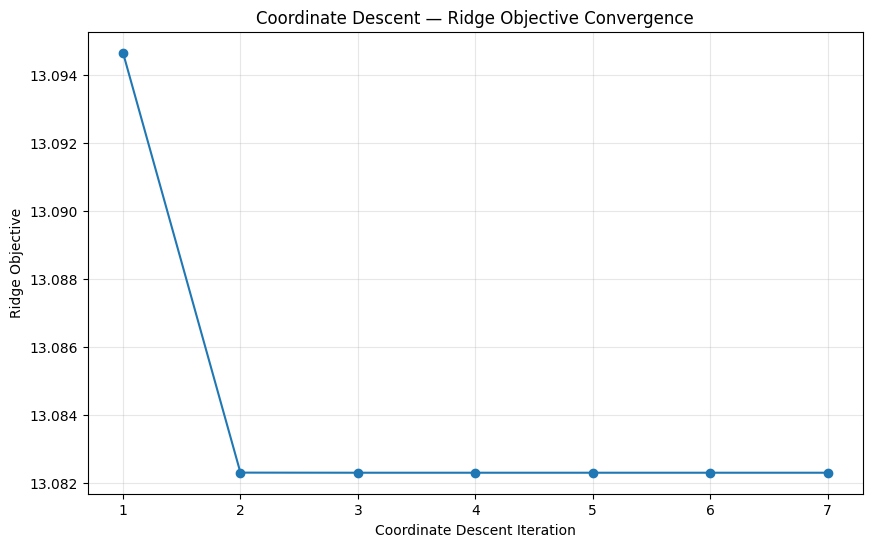

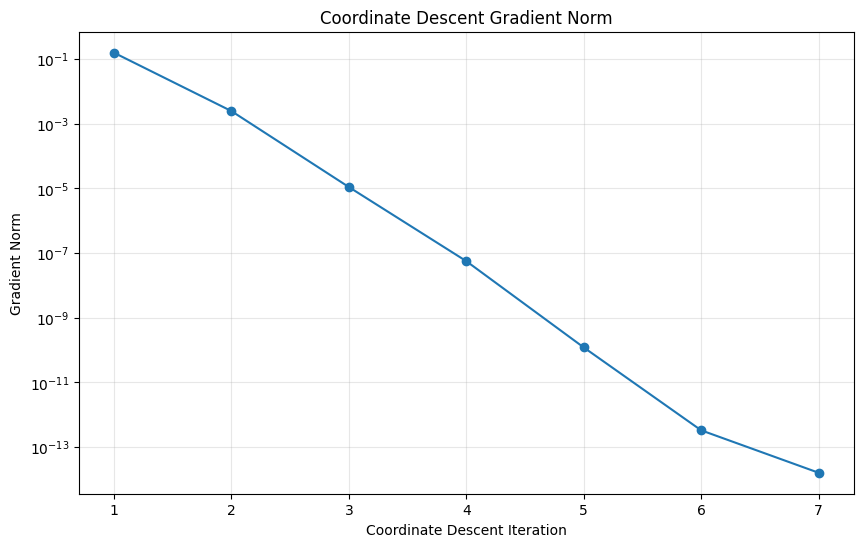

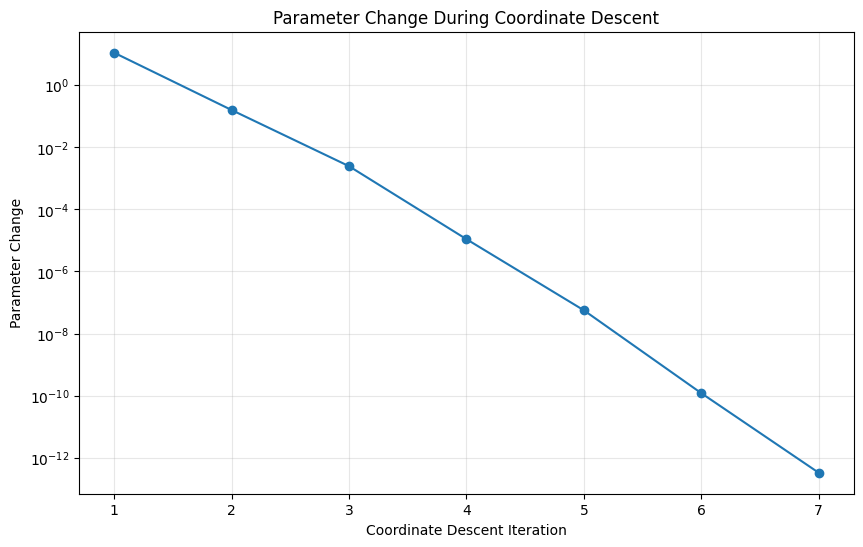

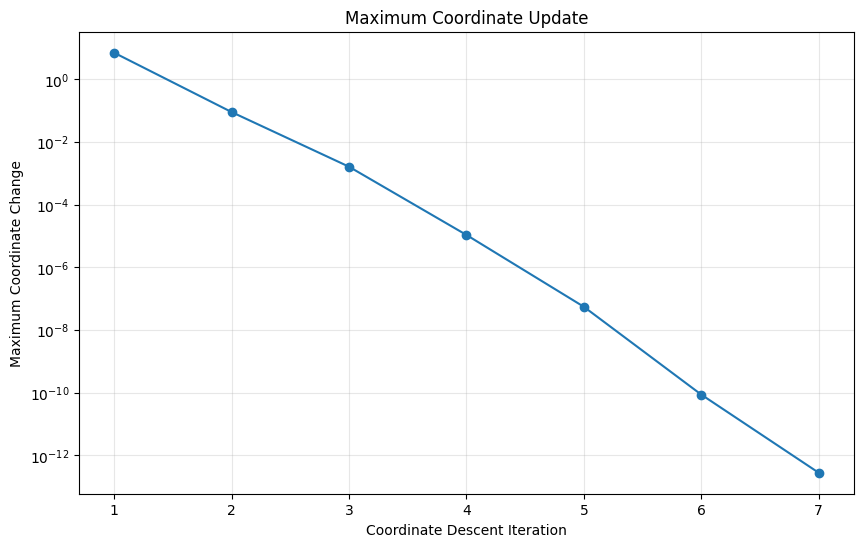

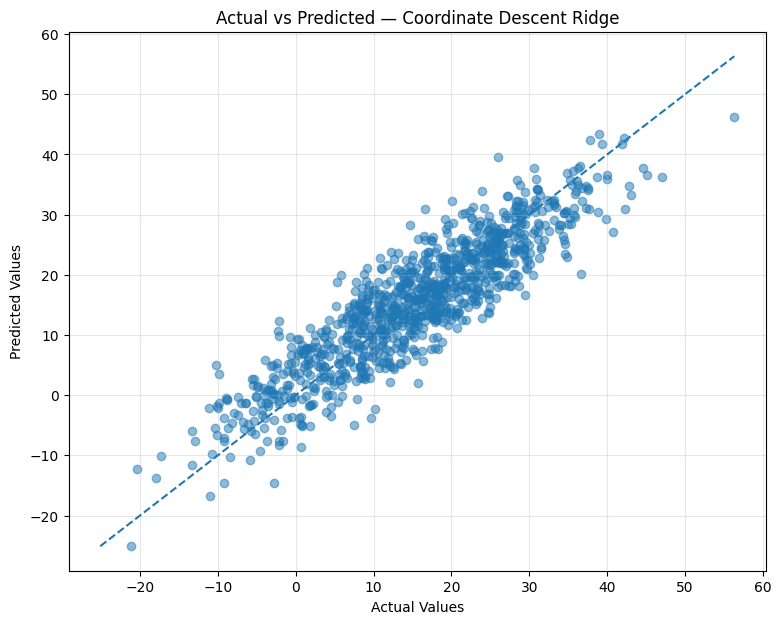

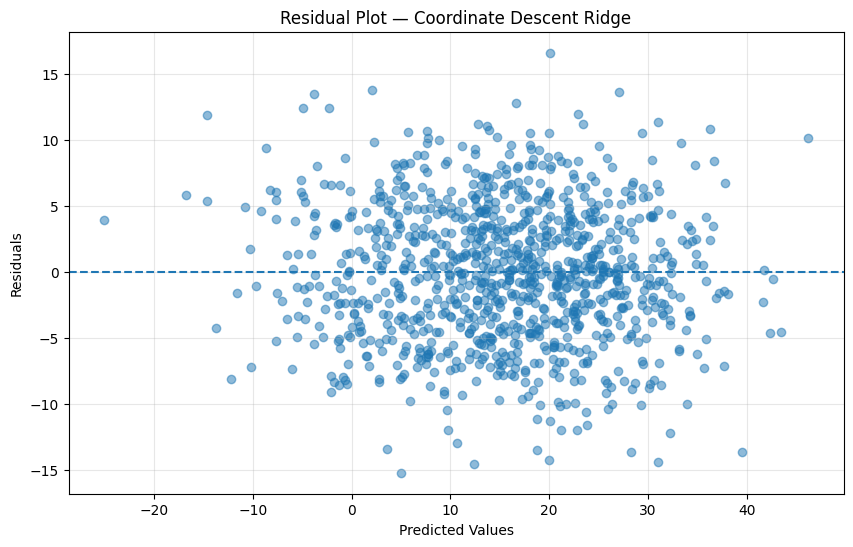

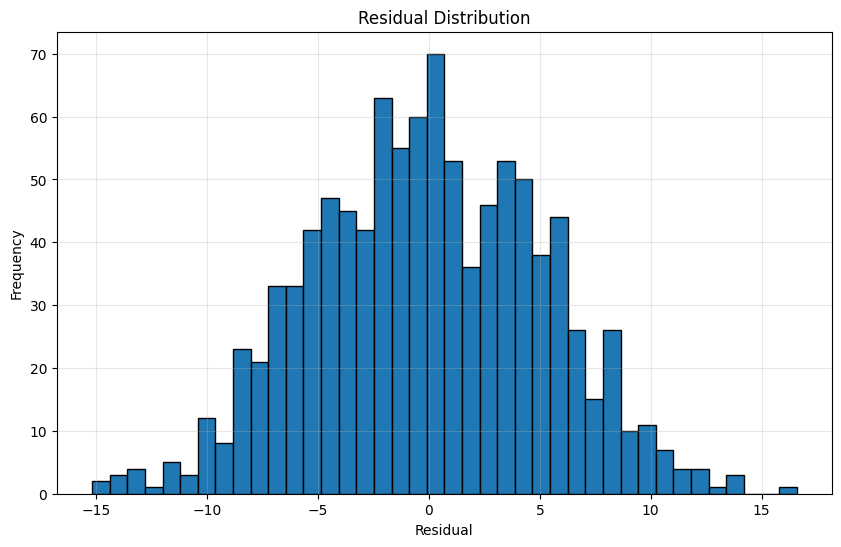

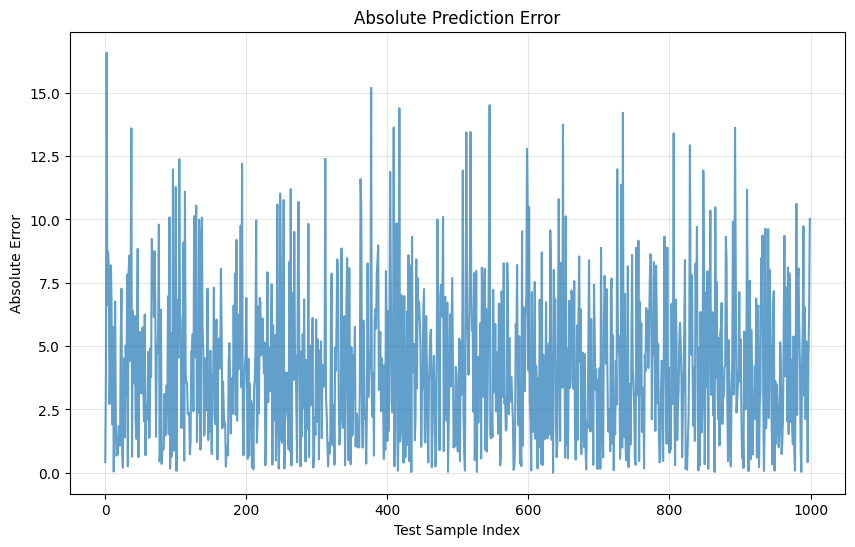

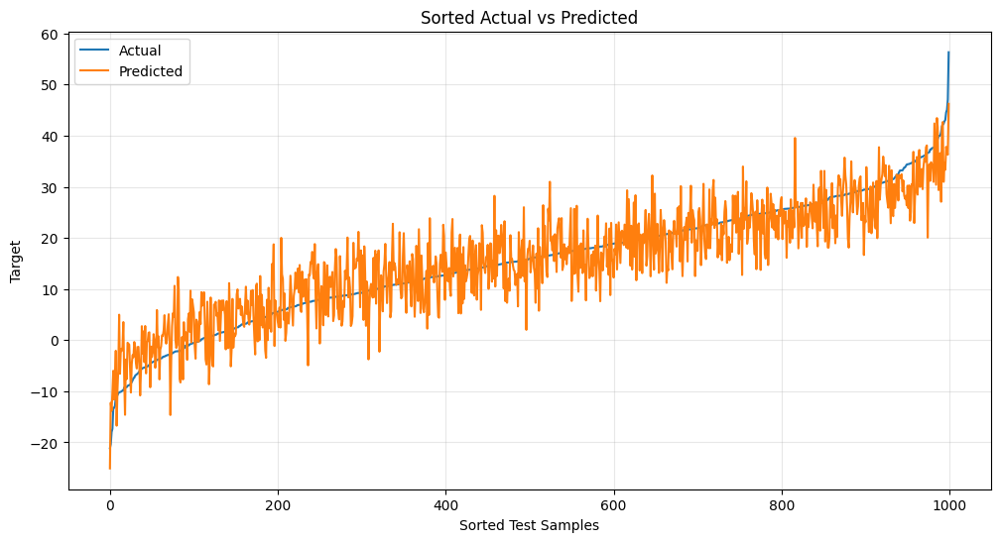

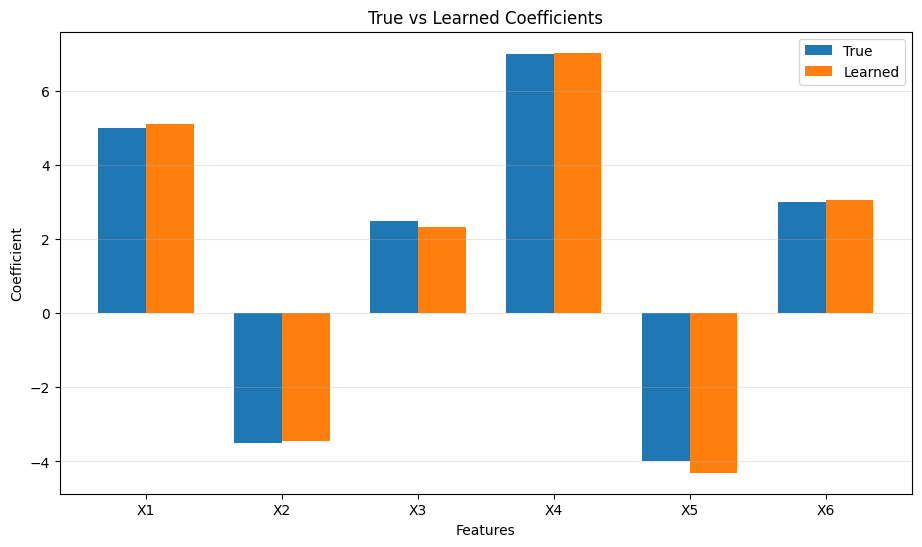

Coordinate Descent converged at iteration 7
Coordinate Descent converged at iteration 7
Coordinate Descent converged at iteration 7
Coordinate Descent converged at iteration 7
Coordinate Descent converged at iteration 7
Coordinate Descent converged at iteration 7
Coordinate Descent converged at iteration 7
Coordinate Descent converged at iteration 6

ALPHA ANALYSIS
    Alpha  Test RMSE  Test R²  Coefficient Norm  Iterations
   0.0001   5.184100 0.801350         10.988151           7
   0.0010   5.184099 0.801350         10.988149           7
   0.0100   5.184098 0.801350         10.988124           7
   0.1000   5.184085 0.801351         10.987876           7
   1.0000   5.183960 0.801361         10.985397           7
  10.0000   5.182765 0.801453         10.960667           7
 100.0000   5.176969 0.801896         10.719364           7
1000.0000   5.505152 0.775984          8.785498           6


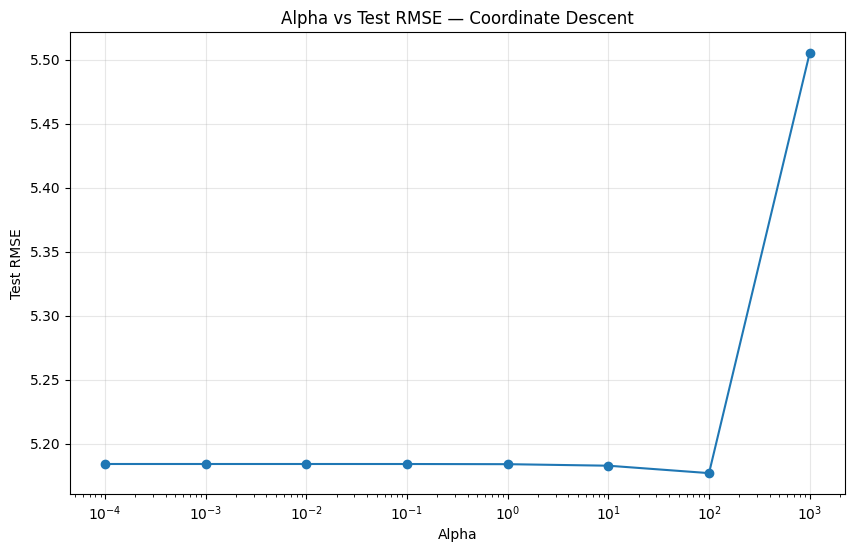

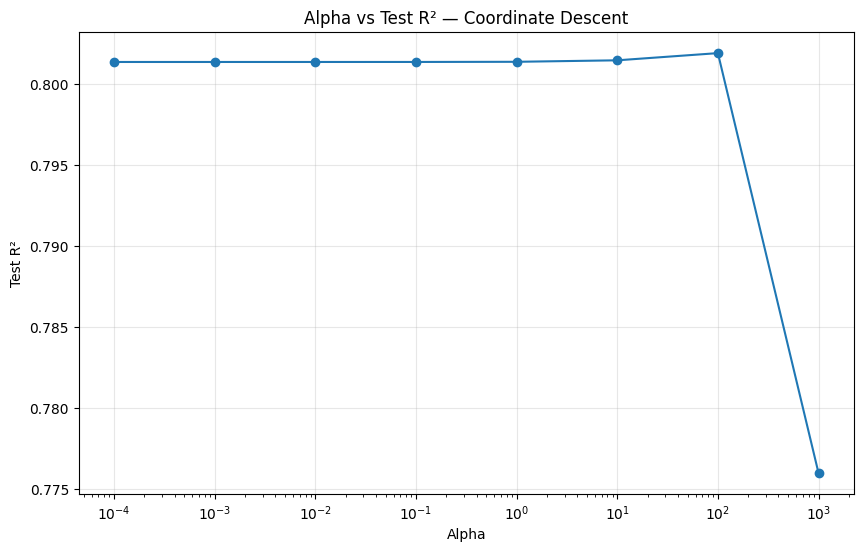

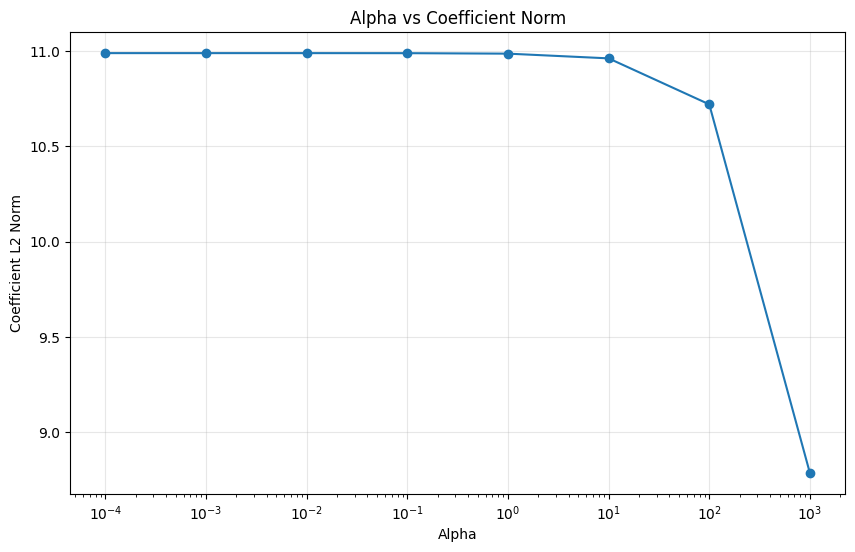

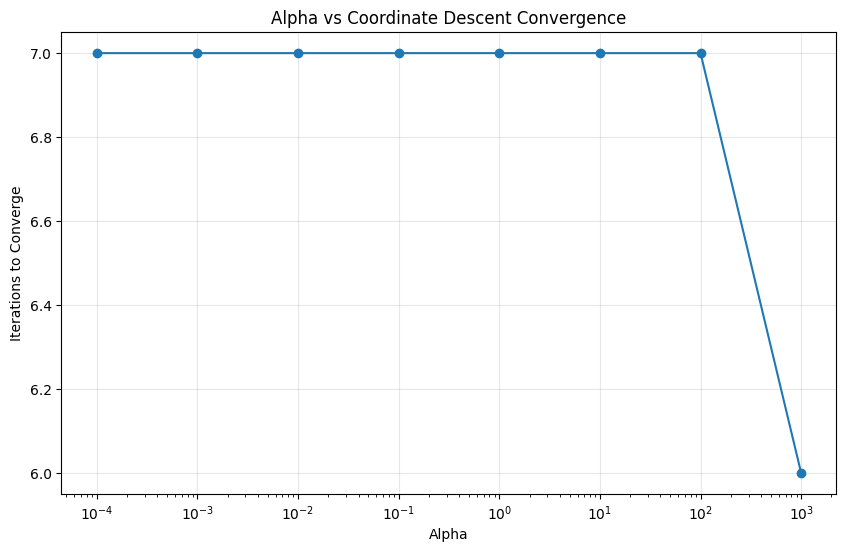

Coordinate Descent converged at iteration 7
Coordinate Descent converged at iteration 7
Coordinate Descent converged at iteration 7
Coordinate Descent converged at iteration 7
Coordinate Descent converged at iteration 7
Coordinate Descent converged at iteration 7
Coordinate Descent converged at iteration 7
Coordinate Descent converged at iteration 6


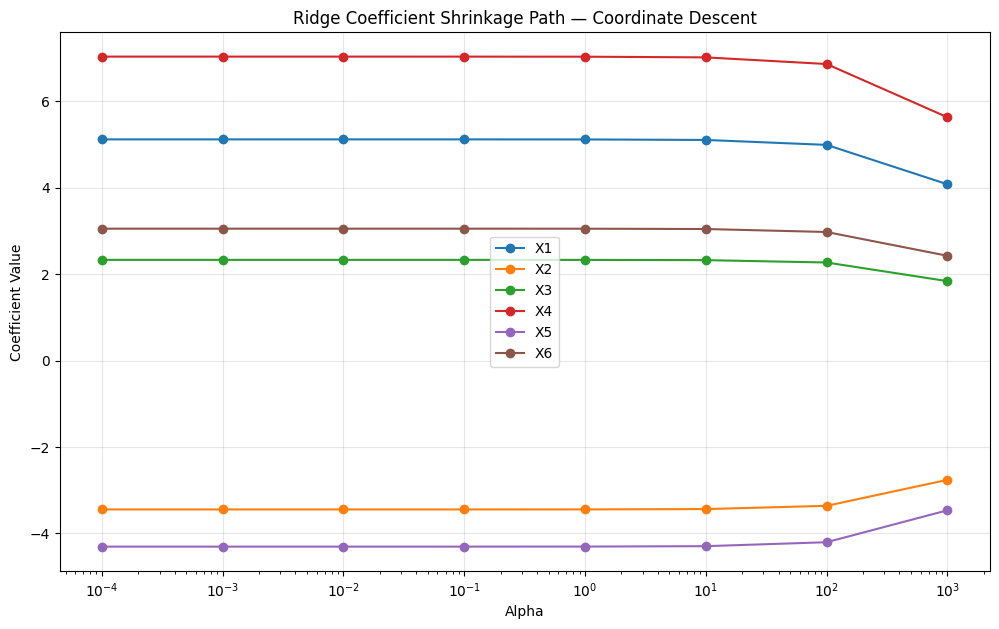

Coordinate Descent converged at iteration 7

FINAL SUMMARY
Regression Method    : Ridge Regression
Optimization Method  : Coordinate Descent
Scikit-learn Used    : NO
Number of Samples    : 5000
Number of Features   : 6
Training Samples     : 4000
Testing Samples      : 1000
Alpha                : 1.0
Best Alpha           : 100.0
Best Test RMSE       : 5.176968992028747
Best Test R²         : 0.8018963726038291
Iterations Executed  : 7
Final Test MAE       : 4.199865608232596
Final Test MSE       : 26.87343674156797
Final Test RMSE      : 5.183959562107711
Final Test R²        : 0.8013610044015849
Final Test Adj. R²   : 0.8001607687786337
Final Test Exp.Var.  : 0.8014406342381938


In [12]:
# ============================================================
# RIDGE REGRESSION FROM SCRATCH
# COORDINATE DESCENT
# NO SCIKIT-LEARN
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ============================================================
# 1. RANDOM SEED
# ============================================================

np.random.seed(42)


# ============================================================
# 2. GENERATE LARGE SYNTHETIC DATASET
# ============================================================

n_samples = 5000
n_features = 6

X = np.random.randn(
    n_samples,
    n_features
)

# True intercept
true_intercept = 15.0

# True coefficients
true_coefficients = np.array([
    5.0,
    -3.5,
    2.5,
    7.0,
    -4.0,
    3.0
])

# Gaussian noise
noise = np.random.normal(
    loc=0.0,
    scale=5.0,
    size=n_samples
)

# Generate target
y = (
    true_intercept
    + X @ true_coefficients
    + noise
)


print("=" * 75)
print("DATASET INFORMATION")
print("=" * 75)

print(
    "Number of samples :",
    n_samples
)

print(
    "Number of features:",
    n_features
)

print(
    "X shape           :",
    X.shape
)

print(
    "y shape           :",
    y.shape
)


# ============================================================
# 3. TRAIN / TEST SPLIT
# ============================================================

train_ratio = 0.80

indices = np.random.permutation(
    n_samples
)

train_size = int(
    train_ratio * n_samples
)

train_indices = indices[
    :train_size
]

test_indices = indices[
    train_size:
]

X_train = X[
    train_indices
]

X_test = X[
    test_indices
]

y_train = y[
    train_indices
]

y_test = y[
    test_indices
]


print("\n" + "=" * 75)
print("TRAIN / TEST SPLIT")
print("=" * 75)

print(
    "Training samples:",
    len(X_train)
)

print(
    "Testing samples :",
    len(X_test)
)


# ============================================================
# 4. STANDARDIZATION
# ============================================================

# Calculate statistics only from training data
X_mean = np.mean(
    X_train,
    axis=0
)

X_std = np.std(
    X_train,
    axis=0
)

# Avoid division by zero
X_std[
    X_std == 0
] = 1.0

# Standardize
X_train_scaled = (
    X_train - X_mean
) / X_std

X_test_scaled = (
    X_test - X_mean
) / X_std


# ============================================================
# 5. COORDINATE DESCENT RIDGE REGRESSION
# ============================================================

class RidgeRegressionCoordinateDescent:

    def __init__(
        self,
        alpha=1.0,
        n_iterations=1000,
        tolerance=1e-10,
        fit_intercept=True,
        random_order=False,
        random_state=42
    ):

        # Ridge regularization strength
        self.alpha = alpha

        # Maximum coordinate-descent iterations
        self.n_iterations = (
            n_iterations
        )

        # Convergence tolerance
        self.tolerance = (
            tolerance
        )

        # Intercept
        self.fit_intercept = (
            fit_intercept
        )

        # Coordinate ordering
        self.random_order = (
            random_order
        )

        self.random_state = (
            random_state
        )

        # Model parameters
        self.coef_ = None

        self.intercept_ = None

        # Optimization histories
        self.loss_history_ = []

        self.gradient_norm_history_ = []

        self.parameter_change_history_ = []

        self.max_coordinate_change_history_ = []

        self.coordinate_update_history_ = []


    # ========================================================
    # RIDGE OBJECTIVE
    # ========================================================

    def _objective(
        self,
        theta,
        X,
        y
    ):

        n = X.shape[0]

        intercept = theta[0]

        coefficients = theta[1:]

        # Prediction
        predictions = (
            intercept
            + X @ coefficients
        )

        # Residual
        residual = (
            predictions - y
        )

        # ----------------------------------------------------
        # Squared error component
        # ----------------------------------------------------

        squared_error = (
            0.5
            * np.mean(
                residual ** 2
            )
        )

        # ----------------------------------------------------
        # Ridge penalty
        #
        # Intercept is NOT regularized
        # ----------------------------------------------------

        ridge_penalty = (
            self.alpha
            / (2 * n)
            * np.sum(
                coefficients ** 2
            )
        )

        return (
            squared_error
            + ridge_penalty
        )


    # ========================================================
    # FULL GRADIENT
    # ========================================================

    def _gradient(
        self,
        theta,
        X,
        y
    ):

        n = X.shape[0]

        intercept = theta[0]

        coefficients = theta[1:]

        # Prediction
        predictions = (
            intercept
            + X @ coefficients
        )

        # Error
        error = (
            predictions - y
        )

        # Intercept gradient
        gradient_intercept = (
            np.mean(error)
        )

        # Coefficient gradient
        gradient_coefficients = (
            X.T @ error
        ) / n

        # Ridge gradient
        gradient_coefficients += (
            self.alpha
            / n
            * coefficients
        )

        # Combine
        gradient = np.concatenate(
            [
                np.array([
                    gradient_intercept
                ]),
                gradient_coefficients
            ]
        )

        return gradient


    # ========================================================
    # FIT
    # ========================================================

    def fit(
        self,
        X,
        y
    ):

        n_samples, n_features = (
            X.shape
        )

        # ----------------------------------------------------
        # Initialize coefficients
        # ----------------------------------------------------

        coefficients = np.zeros(
            n_features
        )

        # ----------------------------------------------------
        # Initialize intercept
        # ----------------------------------------------------

        if self.fit_intercept:

            intercept = np.mean(
                y
            )

        else:

            intercept = 0.0

        # ----------------------------------------------------
        # Initial residual
        #
        # r = y - intercept - X @ beta
        # ----------------------------------------------------

        residual = (
            y
            - intercept
            - X @ coefficients
        )

        # ----------------------------------------------------
        # Precompute X_j^T X_j
        # ----------------------------------------------------

        feature_squared_norms = np.sum(
            X ** 2,
            axis=0
        )

        # ----------------------------------------------------
        # Random number generator
        # ----------------------------------------------------

        rng = np.random.default_rng(
            self.random_state
        )

        # ----------------------------------------------------
        # Coordinate Descent
        # ----------------------------------------------------

        for iteration in range(
            self.n_iterations
        ):

            # Save parameters before iteration
            old_coefficients = (
                coefficients.copy()
            )

            old_intercept = (
                intercept
            )

            # =================================================
            # INTERCEPT UPDATE
            # =================================================

            if self.fit_intercept:

                # For unregularized intercept:
                #
                # b = mean(y - X beta)

                intercept_new = np.mean(
                    y
                    - X @ coefficients
                )

                # Update residual
                residual += (
                    old_intercept
                    - intercept_new
                )

                intercept = (
                    intercept_new
                )

            # =================================================
            # COORDINATE ORDER
            # =================================================

            coordinate_order = np.arange(
                n_features
            )

            if self.random_order:

                rng.shuffle(
                    coordinate_order
                )

            # Number of coordinate updates
            coordinate_updates = 0

            max_coordinate_change = 0.0

            # =================================================
            # UPDATE EACH COORDINATE
            # =================================================

            for j in coordinate_order:

                # Current coefficient
                old_beta_j = (
                    coefficients[j]
                )

                # ------------------------------------------------
                # Remove current coordinate from residual
                #
                # residual currently:
                #
                # r = y - b - X beta
                #
                # Therefore:
                #
                # r_without_j =
                # r + X_j beta_j
                # ------------------------------------------------

                residual_without_j = (
                    residual
                    + X[:, j]
                    * old_beta_j
                )

                # ------------------------------------------------
                # Coordinate-wise Ridge solution
                #
                # beta_j =
                #
                # X_j^T r_without_j
                # ---------------------
                # X_j^T X_j + alpha
                # ------------------------------------------------

                numerator = (
                    X[:, j]
                    @ residual_without_j
                )

                denominator = (
                    feature_squared_norms[j]
                    + self.alpha
                )

                new_beta_j = (
                    numerator
                    / denominator
                )

                # ------------------------------------------------
                # Update residual
                # ------------------------------------------------

                residual = (
                    residual_without_j
                    - X[:, j]
                    * new_beta_j
                )

                # ------------------------------------------------
                # Update coefficient
                # ------------------------------------------------

                coefficients[j] = (
                    new_beta_j
                )

                # ------------------------------------------------
                # Track coordinate change
                # ------------------------------------------------

                coordinate_change = abs(
                    new_beta_j
                    - old_beta_j
                )

                max_coordinate_change = max(
                    max_coordinate_change,
                    coordinate_change
                )

                coordinate_updates += 1

            # =================================================
            # BUILD FULL PARAMETER VECTOR
            # =================================================

            theta = np.concatenate(
                [
                    np.array([
                        intercept
                    ]),
                    coefficients
                ]
            )

            # =================================================
            # CALCULATE OBJECTIVE
            # =================================================

            loss = self._objective(
                theta,
                X,
                y
            )

            self.loss_history_.append(
                loss
            )

            # =================================================
            # CALCULATE GRADIENT
            # =================================================

            gradient = self._gradient(
                theta,
                X,
                y
            )

            gradient_norm = (
                np.linalg.norm(
                    gradient
                )
            )

            self.gradient_norm_history_.append(
                gradient_norm
            )

            # =================================================
            # PARAMETER CHANGE
            # =================================================

            parameter_change = np.linalg.norm(
                np.concatenate(
                    [
                        np.array([
                            intercept
                            - old_intercept
                        ]),
                        coefficients
                        - old_coefficients
                    ]
                )
            )

            self.parameter_change_history_.append(
                parameter_change
            )

            self.max_coordinate_change_history_.append(
                max_coordinate_change
            )

            self.coordinate_update_history_.append(
                coordinate_updates
            )

            # =================================================
            # CONVERGENCE CHECK
            # =================================================

            if (
                parameter_change
                < self.tolerance
            ):

                print(
                    "Coordinate Descent converged at "
                    f"iteration {iteration + 1}"
                )

                break

        # ----------------------------------------------------
        # Store final parameters
        # ----------------------------------------------------

        self.coef_ = coefficients

        self.intercept_ = intercept

        self.theta_ = np.concatenate(
            [
                np.array([
                    intercept
                ]),
                coefficients
            ]
        )

        self.n_iterations_run_ = (
            iteration + 1
        )

        return self


    # ========================================================
    # PREDICT
    # ========================================================

    def predict(
        self,
        X
    ):

        return (
            self.intercept_
            + X @ self.coef_
        )


    # ========================================================
    # SCORE
    # ========================================================

    def score(
        self,
        X,
        y
    ):

        predictions = self.predict(
            X
        )

        ss_res = np.sum(
            (y - predictions) ** 2
        )

        ss_tot = np.sum(
            (y - np.mean(y)) ** 2
        )

        return (
            1
            - ss_res / ss_tot
        )


# ============================================================
# 6. EVALUATION METRICS FROM SCRATCH
# ============================================================

def mean_absolute_error(
    y_true,
    y_pred
):

    return np.mean(
        np.abs(
            y_true - y_pred
        )
    )


def mean_squared_error(
    y_true,
    y_pred
):

    return np.mean(
        (y_true - y_pred) ** 2
    )


def root_mean_squared_error(
    y_true,
    y_pred
):

    return np.sqrt(
        mean_squared_error(
            y_true,
            y_pred
        )
    )


def r2_score(
    y_true,
    y_pred
):

    ss_res = np.sum(
        (y_true - y_pred) ** 2
    )

    ss_tot = np.sum(
        (y_true - np.mean(y_true)) ** 2
    )

    return (
        1
        - ss_res / ss_tot
    )


def adjusted_r2_score(
    y_true,
    y_pred,
    n_features
):

    n = len(y_true)

    r2 = r2_score(
        y_true,
        y_pred
    )

    return (
        1
        -
        (
            (1 - r2)
            * (n - 1)
            /
            (n - n_features - 1)
        )
    )


def explained_variance_score(
    y_true,
    y_pred
):

    residuals = (
        y_true - y_pred
    )

    return (
        1
        -
        np.var(residuals)
        /
        np.var(y_true)
    )


# ============================================================
# 7. TRAIN MODEL
# ============================================================

alpha = 1.0

model = RidgeRegressionCoordinateDescent(
    alpha=alpha,
    n_iterations=1000,
    tolerance=1e-10,
    fit_intercept=True,
    random_order=False,
    random_state=42
)

model.fit(
    X_train_scaled,
    y_train
)


# ============================================================
# 8. PREDICTIONS
# ============================================================

y_train_pred = model.predict(
    X_train_scaled
)

y_test_pred = model.predict(
    X_test_scaled
)


# ============================================================
# 9. EVALUATION METRICS
# ============================================================

train_mae = mean_absolute_error(
    y_train,
    y_train_pred
)

train_mse = mean_squared_error(
    y_train,
    y_train_pred
)

train_rmse = root_mean_squared_error(
    y_train,
    y_train_pred
)

train_r2 = r2_score(
    y_train,
    y_train_pred
)

train_adj_r2 = adjusted_r2_score(
    y_train,
    y_train_pred,
    n_features
)

train_ev = explained_variance_score(
    y_train,
    y_train_pred
)


test_mae = mean_absolute_error(
    y_test,
    y_test_pred
)

test_mse = mean_squared_error(
    y_test,
    y_test_pred
)

test_rmse = root_mean_squared_error(
    y_test,
    y_test_pred
)

test_r2 = r2_score(
    y_test,
    y_test_pred
)

test_adj_r2 = adjusted_r2_score(
    y_test,
    y_test_pred,
    n_features
)

test_ev = explained_variance_score(
    y_test,
    y_test_pred
)


# ============================================================
# 10. EVALUATION TABLE
# ============================================================

evaluation_results = pd.DataFrame({

    "Metric": [
        "MAE",
        "MSE",
        "RMSE",
        "R²",
        "Adjusted R²",
        "Explained Variance"
    ],

    "Train": [
        train_mae,
        train_mse,
        train_rmse,
        train_r2,
        train_adj_r2,
        train_ev
    ],

    "Test": [
        test_mae,
        test_mse,
        test_rmse,
        test_r2,
        test_adj_r2,
        test_ev
    ]
})


print("\n" + "=" * 75)
print("COORDINATE DESCENT RIDGE — EVALUATION")
print("=" * 75)

print(
    evaluation_results.to_string(
        index=False
    )
)


# ============================================================
# 11. COEFFICIENT COMPARISON
# ============================================================

coefficient_results = pd.DataFrame({

    "Feature": [
        f"X{i+1}"
        for i in range(n_features)
    ],

    "True Coefficient":
        true_coefficients,

    "Learned Coefficient":
        model.coef_,

    "Absolute Difference":
        np.abs(
            true_coefficients
            - model.coef_
        )
})


print("\n" + "=" * 75)
print("COEFFICIENT COMPARISON")
print("=" * 75)

print(
    coefficient_results.to_string(
        index=False
    )
)

print(
    "\nTrue Intercept   :",
    true_intercept
)

print(
    "Learned Intercept:",
    model.intercept_
)


# ============================================================
# 12. OPTIMIZATION INFORMATION
# ============================================================

print("\n" + "=" * 75)
print("COORDINATE DESCENT OPTIMIZATION")
print("=" * 75)

print(
    "Iterations executed:",
    model.n_iterations_run_
)

print(
    "Final objective:",
    model.loss_history_[-1]
)

print(
    "Final gradient norm:",
    model.gradient_norm_history_[-1]
)

print(
    "Final parameter change:",
    model.parameter_change_history_[-1]
)

print(
    "Final maximum coordinate change:",
    model.max_coordinate_change_history_[-1]
)


# ============================================================
# 13. PLOT 1 — OBJECTIVE FUNCTION
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    range(
        1,
        len(model.loss_history_) + 1
    ),
    model.loss_history_,
    marker="o"
)

plt.xlabel(
    "Coordinate Descent Iteration"
)

plt.ylabel(
    "Ridge Objective"
)

plt.title(
    "Coordinate Descent — Ridge Objective Convergence"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 14. PLOT 2 — GRADIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogy(
    range(
        1,
        len(
            model.gradient_norm_history_
        ) + 1
    ),
    model.gradient_norm_history_,
    marker="o"
)

plt.xlabel(
    "Coordinate Descent Iteration"
)

plt.ylabel(
    "Gradient Norm"
)

plt.title(
    "Coordinate Descent Gradient Norm"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 15. PLOT 3 — PARAMETER CHANGE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogy(
    range(
        1,
        len(
            model.parameter_change_history_
        ) + 1
    ),
    model.parameter_change_history_,
    marker="o"
)

plt.xlabel(
    "Coordinate Descent Iteration"
)

plt.ylabel(
    "Parameter Change"
)

plt.title(
    "Parameter Change During Coordinate Descent"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 16. PLOT 4 — MAXIMUM COORDINATE CHANGE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogy(
    range(
        1,
        len(
            model.max_coordinate_change_history_
        ) + 1
    ),
    model.max_coordinate_change_history_,
    marker="o"
)

plt.xlabel(
    "Coordinate Descent Iteration"
)

plt.ylabel(
    "Maximum Coordinate Change"
)

plt.title(
    "Maximum Coordinate Update"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 17. PLOT 5 — ACTUAL VS PREDICTED
# ============================================================

plt.figure(
    figsize=(9, 7)
)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.5
)

minimum = min(
    y_test.min(),
    y_test_pred.min()
)

maximum = max(
    y_test.max(),
    y_test_pred.max()
)

plt.plot(
    [minimum, maximum],
    [minimum, maximum],
    linestyle="--"
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Predicted Values"
)

plt.title(
    "Actual vs Predicted — Coordinate Descent Ridge"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 18. PLOT 6 — RESIDUAL PLOT
# ============================================================

residuals = (
    y_test
    - y_test_pred
)

plt.figure(
    figsize=(10, 6)
)

plt.scatter(
    y_test_pred,
    residuals,
    alpha=0.5
)

plt.axhline(
    0,
    linestyle="--"
)

plt.xlabel(
    "Predicted Values"
)

plt.ylabel(
    "Residuals"
)

plt.title(
    "Residual Plot — Coordinate Descent Ridge"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 19. PLOT 7 — RESIDUAL DISTRIBUTION
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.hist(
    residuals,
    bins=40,
    edgecolor="black"
)

plt.xlabel(
    "Residual"
)

plt.ylabel(
    "Frequency"
)

plt.title(
    "Residual Distribution"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 20. PLOT 8 — ABSOLUTE ERROR
# ============================================================

absolute_errors = np.abs(
    residuals
)

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    absolute_errors,
    alpha=0.7
)

plt.xlabel(
    "Test Sample Index"
)

plt.ylabel(
    "Absolute Error"
)

plt.title(
    "Absolute Prediction Error"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 21. PLOT 9 — SORTED ACTUAL VS PREDICTED
# ============================================================

sorted_indices = np.argsort(
    y_test
)

sorted_actual = (
    y_test[
        sorted_indices
    ]
)

sorted_predicted = (
    y_test_pred[
        sorted_indices
    ]
)

plt.figure(
    figsize=(12, 6)
)

plt.plot(
    sorted_actual,
    label="Actual"
)

plt.plot(
    sorted_predicted,
    label="Predicted"
)

plt.xlabel(
    "Sorted Test Samples"
)

plt.ylabel(
    "Target"
)

plt.title(
    "Sorted Actual vs Predicted"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 22. PLOT 10 — TRUE VS LEARNED COEFFICIENTS
# ============================================================

feature_names = [
    f"X{i+1}"
    for i in range(n_features)
]

x_positions = np.arange(
    n_features
)

width = 0.35

plt.figure(
    figsize=(11, 6)
)

plt.bar(
    x_positions - width / 2,
    true_coefficients,
    width,
    label="True"
)

plt.bar(
    x_positions + width / 2,
    model.coef_,
    width,
    label="Learned"
)

plt.xticks(
    x_positions,
    feature_names
)

plt.xlabel(
    "Features"
)

plt.ylabel(
    "Coefficient"
)

plt.title(
    "True vs Learned Coefficients"
)

plt.legend()

plt.grid(
    axis="y",
    alpha=0.3
)

plt.show()


# ============================================================
# 23. ALPHA ANALYSIS
# ============================================================

alpha_values = np.array([
    0.0001,
    0.001,
    0.01,
    0.1,
    1.0,
    10.0,
    100.0,
    1000.0
])

alpha_rmse = []

alpha_r2 = []

alpha_coefficient_norm = []

alpha_iterations = []


for current_alpha in alpha_values:

    temp_model = (
        RidgeRegressionCoordinateDescent(
            alpha=current_alpha,
            n_iterations=1000,
            tolerance=1e-10,
            fit_intercept=True,
            random_order=False,
            random_state=42
        )
    )

    temp_model.fit(
        X_train_scaled,
        y_train
    )

    temp_prediction = (
        temp_model.predict(
            X_test_scaled
        )
    )

    rmse = root_mean_squared_error(
        y_test,
        temp_prediction
    )

    r2 = r2_score(
        y_test,
        temp_prediction
    )

    coefficient_norm = (
        np.linalg.norm(
            temp_model.coef_
        )
    )

    alpha_rmse.append(
        rmse
    )

    alpha_r2.append(
        r2
    )

    alpha_coefficient_norm.append(
        coefficient_norm
    )

    alpha_iterations.append(
        temp_model.n_iterations_run_
    )


alpha_results = pd.DataFrame({

    "Alpha": alpha_values,

    "Test RMSE": alpha_rmse,

    "Test R²": alpha_r2,

    "Coefficient Norm":
        alpha_coefficient_norm,

    "Iterations":
        alpha_iterations
})


print("\n" + "=" * 75)
print("ALPHA ANALYSIS")
print("=" * 75)

print(
    alpha_results.to_string(
        index=False
    )
)


# ============================================================
# 24. PLOT 11 — ALPHA VS RMSE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_rmse,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "Alpha vs Test RMSE — Coordinate Descent"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 25. PLOT 12 — ALPHA VS R²
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_r2,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Test R²"
)

plt.title(
    "Alpha vs Test R² — Coordinate Descent"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 26. PLOT 13 — ALPHA VS COEFFICIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_coefficient_norm,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Coefficient L2 Norm"
)

plt.title(
    "Alpha vs Coefficient Norm"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 27. PLOT 14 — ALPHA VS ITERATIONS
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_iterations,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Iterations to Converge"
)

plt.title(
    "Alpha vs Coordinate Descent Convergence"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 28. COEFFICIENT SHRINKAGE PATH
# ============================================================

coefficient_paths = []


for current_alpha in alpha_values:

    temp_model = (
        RidgeRegressionCoordinateDescent(
            alpha=current_alpha,
            n_iterations=1000,
            tolerance=1e-10,
            fit_intercept=True,
            random_order=False,
            random_state=42
        )
    )

    temp_model.fit(
        X_train_scaled,
        y_train
    )

    coefficient_paths.append(
        temp_model.coef_
    )


coefficient_paths = np.array(
    coefficient_paths
)


# ============================================================
# 29. PLOT 15 — COEFFICIENT SHRINKAGE PATH
# ============================================================

plt.figure(
    figsize=(12, 7)
)

for j in range(
    n_features
):

    plt.semilogx(
        alpha_values,
        coefficient_paths[:, j],
        marker="o",
        label=f"X{j+1}"
    )

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "Ridge Coefficient Shrinkage Path — Coordinate Descent"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 30. COORDINATE UPDATE VISUALIZATION
# ============================================================

# Store coefficient values across iterations
# by running a small tracking experiment.

tracking_model = (
    RidgeRegressionCoordinateDescent(
        alpha=alpha,
        n_iterations=100,
        tolerance=1e-12,
        fit_intercept=True,
        random_order=False,
        random_state=42
    )
)

tracking_model.fit(
    X_train_scaled,
    y_train
)


# ============================================================
# 31. FINAL SUMMARY
# ============================================================

best_alpha_index = np.argmin(
    alpha_rmse
)

best_alpha = (
    alpha_values[
        best_alpha_index
    ]
)

best_rmse = (
    alpha_rmse[
        best_alpha_index
    ]
)

best_r2 = (
    alpha_r2[
        best_alpha_index
    ]
)


print("\n" + "=" * 75)
print("FINAL SUMMARY")
print("=" * 75)

print(
    "Regression Method    : Ridge Regression"
)

print(
    "Optimization Method  : Coordinate Descent"
)

print(
    "Scikit-learn Used    : NO"
)

print(
    "Number of Samples    :",
    n_samples
)

print(
    "Number of Features   :",
    n_features
)

print(
    "Training Samples     :",
    len(X_train)
)

print(
    "Testing Samples      :",
    len(X_test)
)

print(
    "Alpha                :",
    alpha
)

print(
    "Best Alpha           :",
    best_alpha
)

print(
    "Best Test RMSE       :",
    best_rmse
)

print(
    "Best Test R²         :",
    best_r2
)

print(
    "Iterations Executed  :",
    model.n_iterations_run_
)

print(
    "Final Test MAE       :",
    test_mae
)

print(
    "Final Test MSE       :",
    test_mse
)

print(
    "Final Test RMSE      :",
    test_rmse
)

print(
    "Final Test R²        :",
    test_r2
)

print(
    "Final Test Adj. R²   :",
    test_adj_r2
)

print(
    "Final Test Exp.Var.  :",
    test_ev
)

print("=" * 75)

DATASET INFORMATION
Number of samples : 5000
Number of features: 6
X shape           : (5000, 6)
y shape           : (5000,)

TRAIN / TEST SPLIT
Training samples: 4000
Testing samples : 1000

CONJUGATE GRADIENT RIDGE — EVALUATION
            Metric     Train      Test
               MAE  4.059473  4.199866
               MSE 26.134430 26.873437
              RMSE  5.112185  5.183960
                R²  0.821699  0.801361
       Adjusted R²  0.821431  0.800161
Explained Variance  0.821699  0.801441

COEFFICIENT COMPARISON
Feature  True Coefficient  Learned Coefficient  Absolute Difference
     X1               5.0             5.114671             0.114671
     X2              -3.5            -3.444627             0.055373
     X3               2.5             2.327873             0.172127
     X4               7.0             7.028951             0.028951
     X5              -4.0            -4.304521             0.304521
     X6               3.0             3.049521             0.0495

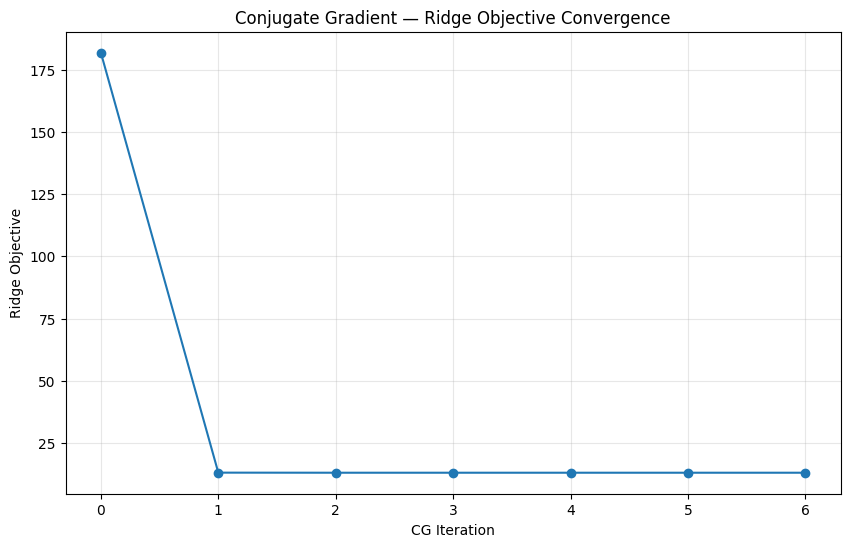

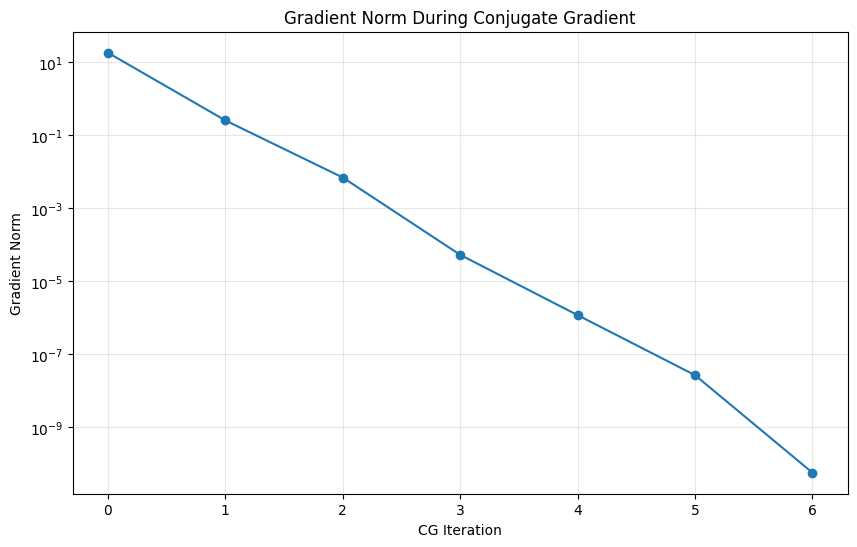

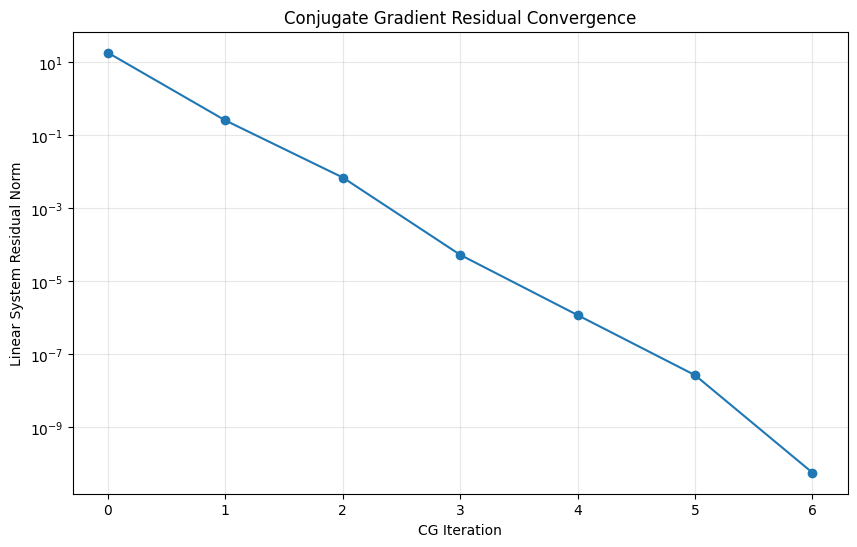

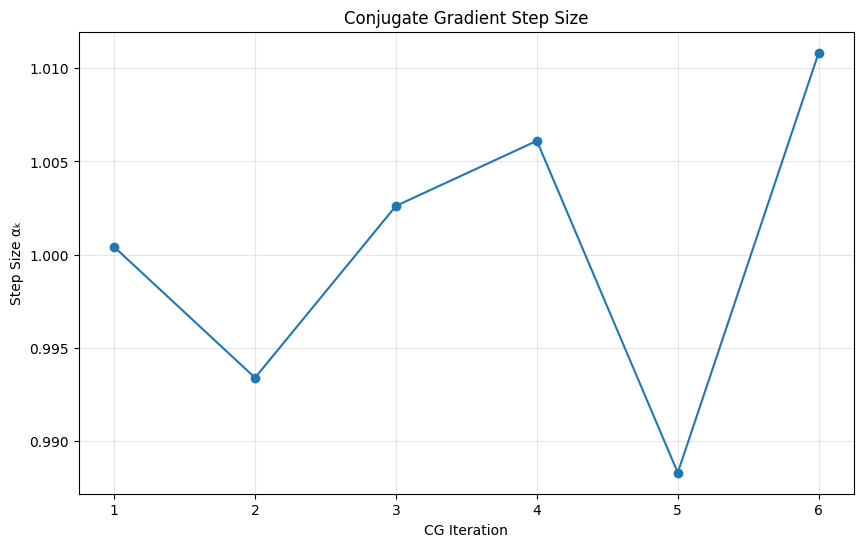

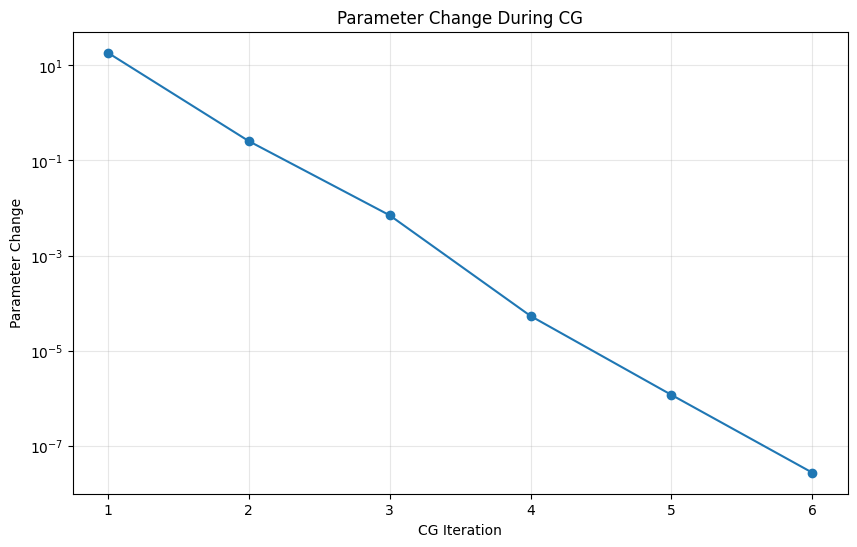

...

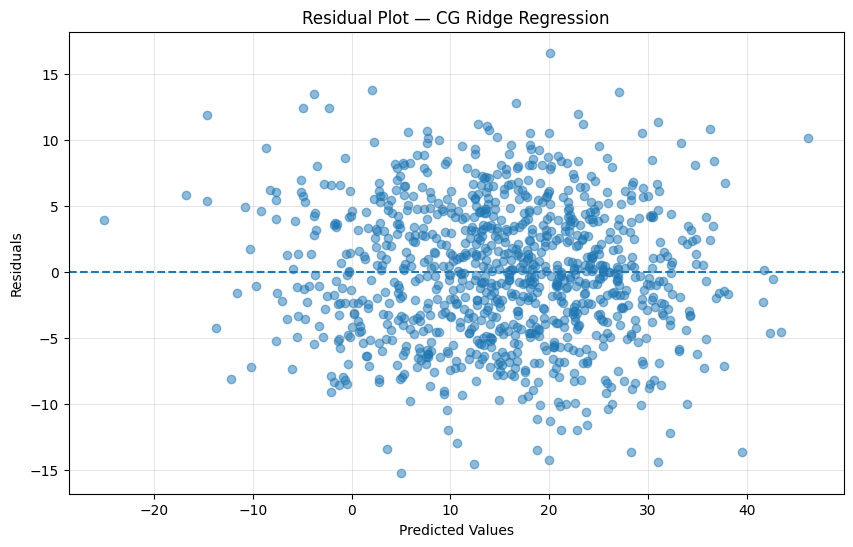

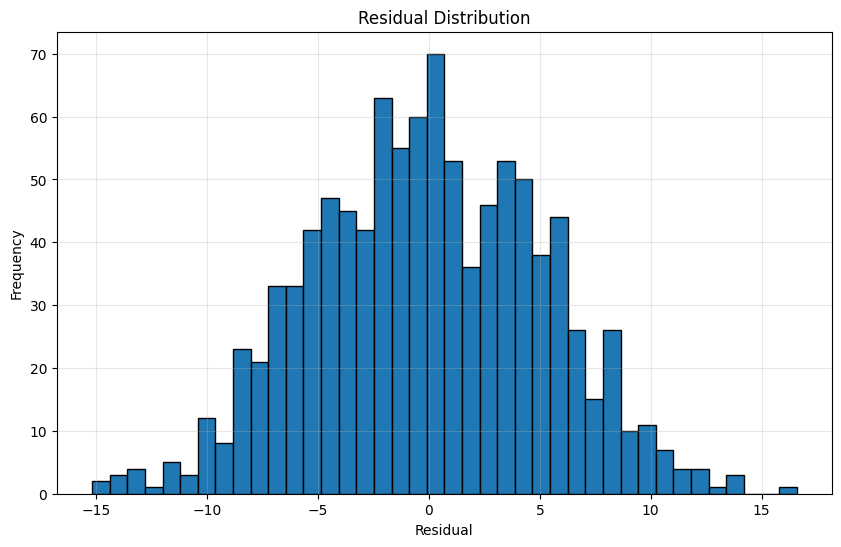

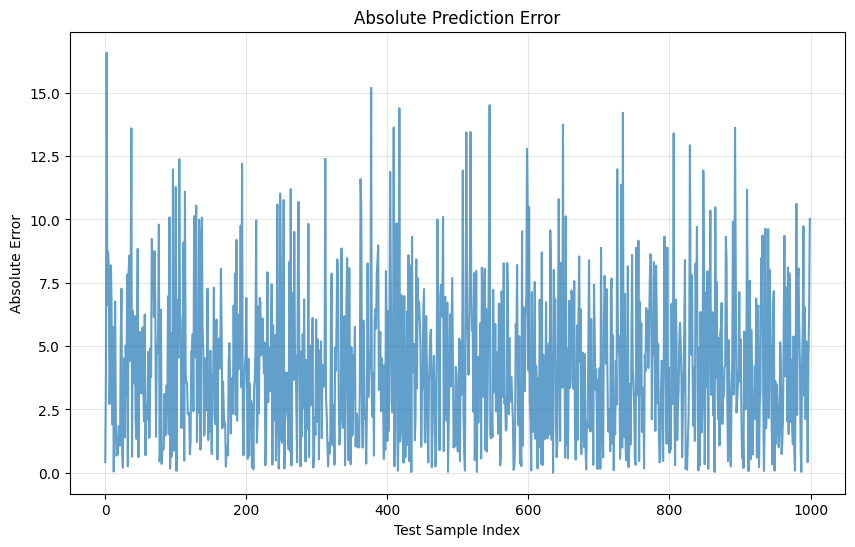

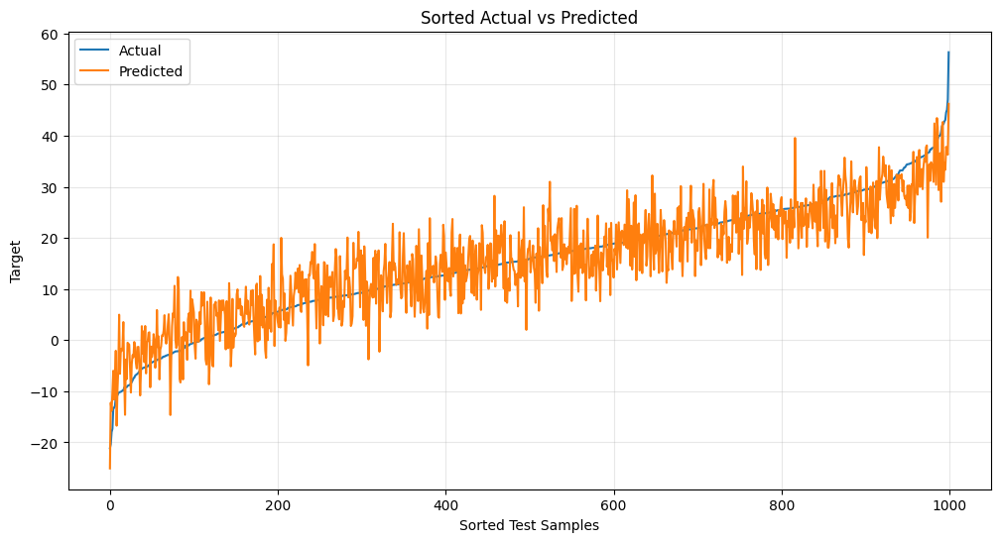

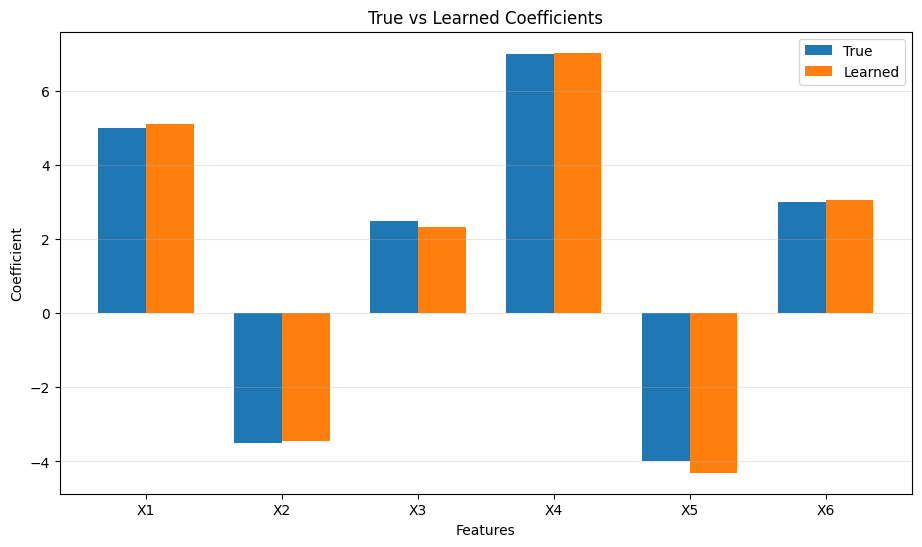


ALPHA ANALYSIS
    Alpha  Test RMSE  Test R²  Coefficient Norm  CG Iterations
   0.0001   5.184100 0.801350         10.988151              6
   0.0010   5.184099 0.801350         10.988149              6
   0.0100   5.184098 0.801350         10.988124              6
   0.1000   5.184085 0.801351         10.987876              6
   1.0000   5.183960 0.801361         10.985397              6
  10.0000   5.182765 0.801453         10.960667              7
 100.0000   5.176969 0.801896         10.719364              7
1000.0000   5.505152 0.775984          8.785498              7


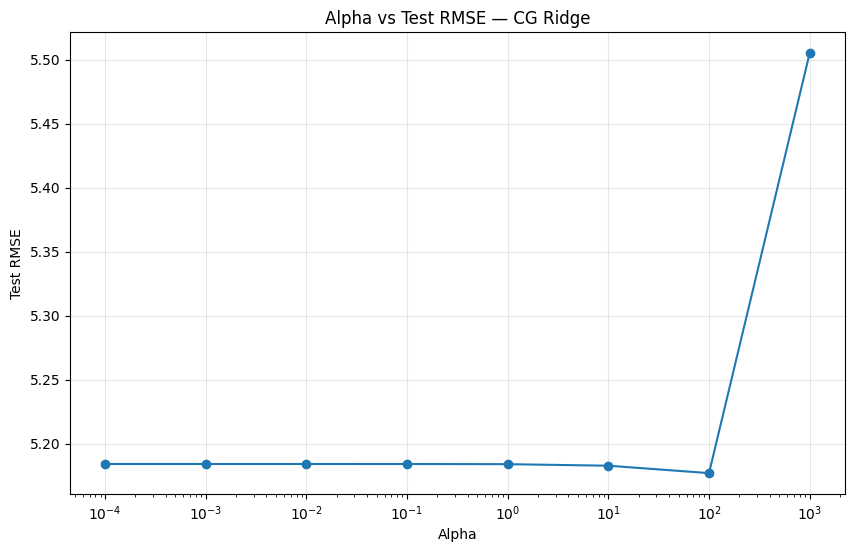

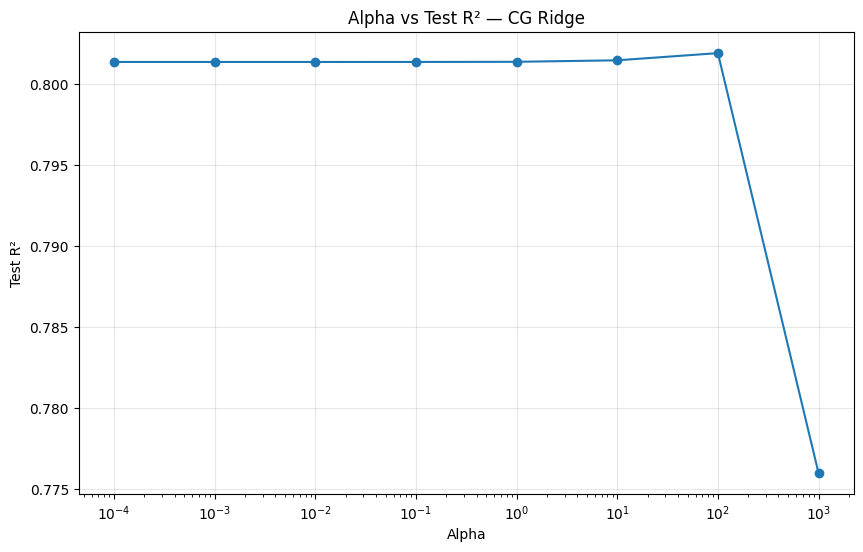

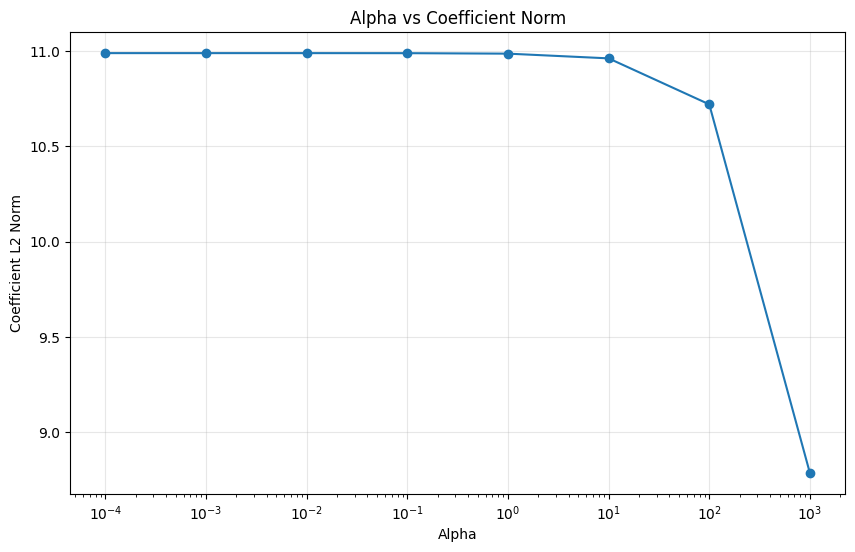

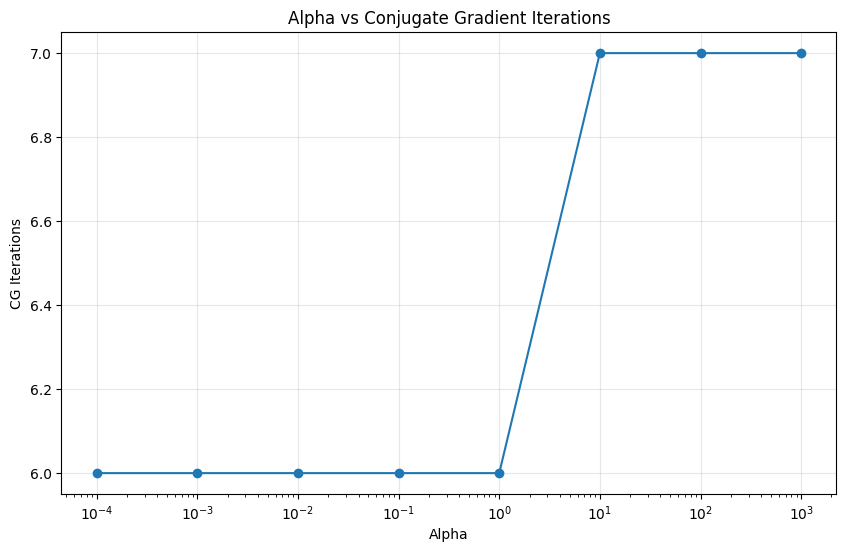

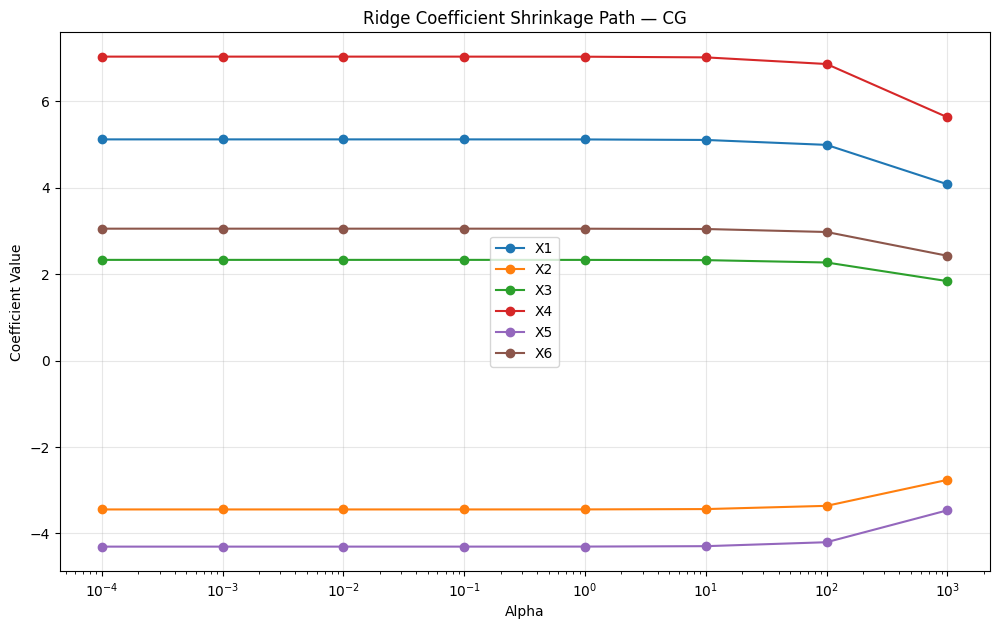

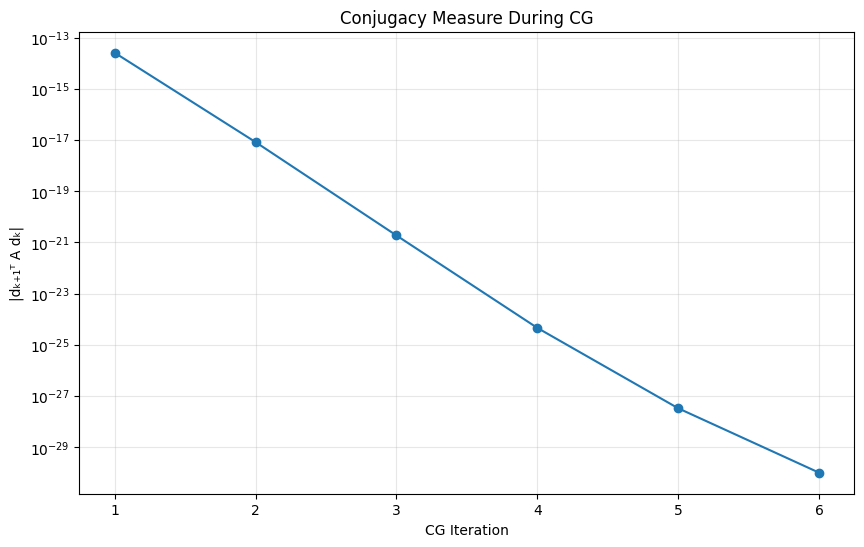


FINAL SUMMARY
Regression Method    : Ridge Regression
Optimization Method  : Conjugate Gradient
Scikit-learn Used    : NO
Number of Samples    : 5000
Number of Features   : 6
Training Samples     : 4000
Testing Samples      : 1000
Alpha                : 1.0
Best Alpha           : 100.0
Best Test RMSE       : 5.176968992028745
Best Test R²         : 0.8018963726038291
CG Iterations        : 6
Test MAE             : 4.199865608231343
Test MSE             : 26.87343674154202
Test RMSE            : 5.1839595621052075
Test R²              : 0.8013610044017767
Test Adjusted R²     : 0.8001607687788267
Test Explained Var.  : 0.8014406342384124


In [13]:
# ============================================================
# RIDGE REGRESSION FROM SCRATCH
# CONJUGATE GRADIENT METHOD
# NO SCIKIT-LEARN
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ============================================================
# 1. RANDOM SEED
# ============================================================

np.random.seed(42)


# ============================================================
# 2. GENERATE LARGE SYNTHETIC DATASET
# ============================================================

n_samples = 5000
n_features = 6

X = np.random.randn(
    n_samples,
    n_features
)

# True model parameters
true_intercept = 15.0

true_coefficients = np.array([
    5.0,
    -3.5,
    2.5,
    7.0,
    -4.0,
    3.0
])

# Gaussian noise
noise = np.random.normal(
    loc=0.0,
    scale=5.0,
    size=n_samples
)

# Target
y = (
    true_intercept
    + X @ true_coefficients
    + noise
)


print("=" * 75)
print("DATASET INFORMATION")
print("=" * 75)

print("Number of samples :", n_samples)
print("Number of features:", n_features)
print("X shape           :", X.shape)
print("y shape           :", y.shape)


# ============================================================
# 3. TRAIN / TEST SPLIT
# ============================================================

train_ratio = 0.80

indices = np.random.permutation(
    n_samples
)

train_size = int(
    train_ratio * n_samples
)

train_indices = indices[
    :train_size
]

test_indices = indices[
    train_size:
]

X_train = X[
    train_indices
]

X_test = X[
    test_indices
]

y_train = y[
    train_indices
]

y_test = y[
    test_indices
]


print("\n" + "=" * 75)
print("TRAIN / TEST SPLIT")
print("=" * 75)

print(
    "Training samples:",
    len(X_train)
)

print(
    "Testing samples :",
    len(X_test)
)


# ============================================================
# 4. STANDARDIZE FEATURES
# ============================================================

# Statistics calculated ONLY from training data
X_mean = np.mean(
    X_train,
    axis=0
)

X_std = np.std(
    X_train,
    axis=0
)

# Avoid division by zero
X_std[
    X_std == 0
] = 1.0

# Transform training data
X_train_scaled = (
    X_train - X_mean
) / X_std

# Transform test data using training statistics
X_test_scaled = (
    X_test - X_mean
) / X_std


# ============================================================
# 5. CONJUGATE GRADIENT RIDGE REGRESSION
# ============================================================

class RidgeRegressionConjugateGradient:

    def __init__(
        self,
        alpha=1.0,
        n_iterations=100,
        tolerance=1e-10,
        fit_intercept=True
    ):

        # Ridge regularization
        self.alpha = alpha

        # Maximum CG iterations
        self.n_iterations = (
            n_iterations
        )

        # Convergence tolerance
        self.tolerance = (
            tolerance
        )

        # Whether to fit intercept
        self.fit_intercept = (
            fit_intercept
        )

        # Model parameters
        self.coef_ = None

        self.intercept_ = None

        # Optimization histories
        self.objective_history_ = []

        self.gradient_norm_history_ = []

        self.residual_norm_history_ = []

        self.step_size_history_ = []

        self.parameter_change_history_ = []

        self.conjugacy_history_ = []

        self.parameter_history_ = []

        self.iterations_run_ = 0


    # ========================================================
    # BUILD AUGMENTED DESIGN MATRIX
    # ========================================================

    def _build_design_matrix(
        self,
        X
    ):

        n_samples = X.shape[0]

        if self.fit_intercept:

            X_design = np.column_stack(
                [
                    np.ones(n_samples),
                    X
                ]
            )

        else:

            X_design = X.copy()

        return X_design


    # ========================================================
    # BUILD RIDGE SYSTEM
    # ========================================================

    def _build_ridge_system(
        self,
        X,
        y
    ):

        n_features = X.shape[1]

        # ----------------------------------------------------
        # Design matrix
        # ----------------------------------------------------

        X_design = (
            self._build_design_matrix(X)
        )

        # ----------------------------------------------------
        # Number of parameters
        # ----------------------------------------------------

        n_parameters = (
            X_design.shape[1]
        )

        # ----------------------------------------------------
        # Ridge penalty matrix
        # ----------------------------------------------------

        P = np.eye(
            n_parameters
        )

        # Do NOT regularize intercept
        if self.fit_intercept:

            P[0, 0] = 0.0

        # ----------------------------------------------------
        # A matrix
        #
        # A = X^T X + alpha P
        # ----------------------------------------------------

        A = (
            X_design.T @ X_design
            + self.alpha * P
        )

        # ----------------------------------------------------
        # b vector
        #
        # b = X^T y
        # ----------------------------------------------------

        b = (
            X_design.T @ y
        )

        return (
            X_design,
            A,
            b
        )


    # ========================================================
    # RIDGE OBJECTIVE
    # ========================================================

    def _objective(
        self,
        theta,
        X_design,
        y
    ):

        n = X_design.shape[0]

        # Prediction
        predictions = (
            X_design @ theta
        )

        # Error
        error = (
            predictions - y
        )

        # Squared-error component
        squared_error = (
            0.5
            * np.mean(
                error ** 2
            )
        )

        # Ridge penalty
        if self.fit_intercept:

            coefficients = (
                theta[1:]
            )

        else:

            coefficients = theta

        ridge_penalty = (
            self.alpha
            / (2 * n)
            * np.sum(
                coefficients ** 2
            )
        )

        return (
            squared_error
            + ridge_penalty
        )


    # ========================================================
    # OBJECTIVE GRADIENT
    # ========================================================

    def _objective_gradient(
        self,
        theta,
        X_design,
        y
    ):

        n = X_design.shape[0]

        # Prediction
        predictions = (
            X_design @ theta
        )

        # Error
        error = (
            predictions - y
        )

        # Gradient
        gradient = (
            X_design.T @ error
        ) / n

        # Ridge penalty
        if self.fit_intercept:

            gradient[1:] += (
                self.alpha
                / n
                * theta[1:]
            )

        else:

            gradient += (
                self.alpha
                / n
                * theta
            )

        return gradient


    # ========================================================
    # FIT USING CONJUGATE GRADIENT
    # ========================================================

    def fit(
        self,
        X,
        y
    ):

        # ----------------------------------------------------
        # Build system
        # ----------------------------------------------------

        (
            X_design,
            A,
            b
        ) = self._build_ridge_system(
            X,
            y
        )

        n_samples = (
            X_design.shape[0]
        )

        n_parameters = (
            X_design.shape[1]
        )

        # ----------------------------------------------------
        # IMPORTANT SCALING
        #
        # Our objective uses:
        #
        # 1/(2n) ||y-Xθ||²
        #
        # Therefore:
        #
        # A = (X^T X + alpha P) / n
        #
        # b = X^T y / n
        #
        # Multiplying both sides by n does not change
        # the solution, but we use the normalized form
        # for consistency with the objective.
        # ----------------------------------------------------

        A_normalized = (
            A / n_samples
        )

        b_normalized = (
            b / n_samples
        )

        # ----------------------------------------------------
        # Initial parameter vector
        # ----------------------------------------------------

        theta = np.zeros(
            n_parameters
        )

        # ----------------------------------------------------
        # Initial residual of linear system
        #
        # r = b - Aθ
        # ----------------------------------------------------

        linear_residual = (
            b_normalized
            - A_normalized @ theta
        )

        # ----------------------------------------------------
        # Initial search direction
        #
        # d = r
        # ----------------------------------------------------

        direction = (
            linear_residual.copy()
        )

        # ----------------------------------------------------
        # Initial squared residual
        # ----------------------------------------------------

        residual_squared = (
            linear_residual
            @ linear_residual
        )

        # Store initial information
        self.parameter_history_.append(
            theta.copy()
        )

        initial_objective = (
            self._objective(
                theta,
                X_design,
                y
            )
        )

        self.objective_history_.append(
            initial_objective
        )

        initial_gradient = (
            self._objective_gradient(
                theta,
                X_design,
                y
            )
        )

        self.gradient_norm_history_.append(
            np.linalg.norm(
                initial_gradient
            )
        )

        self.residual_norm_history_.append(
            np.sqrt(
                residual_squared
            )
        )

        # ----------------------------------------------------
        # CONJUGATE GRADIENT ITERATIONS
        # ----------------------------------------------------

        for iteration in range(
            self.n_iterations
        ):

            # Save old parameters
            theta_old = (
                theta.copy()
            )

            # ------------------------------------------------
            # A d
            # ------------------------------------------------

            A_direction = (
                A_normalized @ direction
            )

            # ------------------------------------------------
            # denominator
            #
            # d^T A d
            # ------------------------------------------------

            denominator = (
                direction
                @ A_direction
            )

            # Numerical safety
            if abs(
                denominator
            ) < 1e-30:

                break

            # ------------------------------------------------
            # STEP SIZE
            #
            # alpha_k =
            #
            # r_k^T r_k
            # -----------
            # d_k^T A d_k
            # ------------------------------------------------

            step_size = (
                residual_squared
                / denominator
            )

            # ------------------------------------------------
            # PARAMETER UPDATE
            #
            # theta_(k+1)
            # =
            # theta_k + alpha_k d_k
            # ------------------------------------------------

            theta = (
                theta
                + step_size * direction
            )

            # ------------------------------------------------
            # NEW LINEAR-SYSTEM RESIDUAL
            #
            # r_(k+1)
            # =
            # r_k - alpha_k A d_k
            # ------------------------------------------------

            new_linear_residual = (
                linear_residual
                - step_size
                * A_direction
            )

            # ------------------------------------------------
            # NEW RESIDUAL SQUARED
            # ------------------------------------------------

            new_residual_squared = (
                new_linear_residual
                @ new_linear_residual
            )

            # ------------------------------------------------
            # BETA
            #
            # beta_k =
            #
            # r_(k+1)^T r_(k+1)
            # -----------------
            # r_k^T r_k
            # ------------------------------------------------

            if (
                abs(residual_squared)
                < 1e-30
            ):

                beta = 0.0

            else:

                beta = (
                    new_residual_squared
                    / residual_squared
                )

            # ------------------------------------------------
            # NEW CONJUGATE DIRECTION
            #
            # d_(k+1)
            # =
            # r_(k+1) + beta d_k
            # ------------------------------------------------

            new_direction = (
                new_linear_residual
                + beta * direction
            )

            # ------------------------------------------------
            # Parameter change
            # ------------------------------------------------

            parameter_change = (
                np.linalg.norm(
                    theta
                    - theta_old
                )
            )

            # ------------------------------------------------
            # Objective
            # ------------------------------------------------

            objective = (
                self._objective(
                    theta,
                    X_design,
                    y
                )
            )

            # ------------------------------------------------
            # Gradient
            # ------------------------------------------------

            gradient = (
                self._objective_gradient(
                    theta,
                    X_design,
                    y
                )
            )

            gradient_norm = (
                np.linalg.norm(
                    gradient
                )
            )

            # ------------------------------------------------
            # Residual norm
            # ------------------------------------------------

            residual_norm = np.sqrt(
                new_residual_squared
            )

            # ------------------------------------------------
            # Conjugacy measure
            #
            # d_new^T A d_old
            #
            # Ideally approximately zero.
            # ------------------------------------------------

            conjugacy_measure = abs(
                new_direction
                @ (
                    A_normalized
                    @ direction
                )
            )

            # ------------------------------------------------
            # Store histories
            # ------------------------------------------------

            self.objective_history_.append(
                objective
            )

            self.gradient_norm_history_.append(
                gradient_norm
            )

            self.residual_norm_history_.append(
                residual_norm
            )

            self.step_size_history_.append(
                step_size
            )

            self.parameter_change_history_.append(
                parameter_change
            )

            self.conjugacy_history_.append(
                conjugacy_measure
            )

            self.parameter_history_.append(
                theta.copy()
            )

            # ------------------------------------------------
            # Update state
            # ------------------------------------------------

            linear_residual = (
                new_linear_residual
            )

            residual_squared = (
                new_residual_squared
            )

            direction = (
                new_direction
            )

            # ------------------------------------------------
            # CONVERGENCE
            # ------------------------------------------------

            if (
                gradient_norm
                < self.tolerance
            ):

                break

            if (
                parameter_change
                < self.tolerance
            ):

                break

            if (
                residual_norm
                < self.tolerance
            ):

                break

        # ----------------------------------------------------
        # Store final parameters
        # ----------------------------------------------------

        if self.fit_intercept:

            self.intercept_ = (
                theta[0]
            )

            self.coef_ = (
                theta[1:].copy()
            )

        else:

            self.intercept_ = 0.0

            self.coef_ = (
                theta.copy()
            )

        self.theta_ = (
            theta.copy()
        )

        self.iterations_run_ = (
            iteration + 1
        )

        return self


    # ========================================================
    # PREDICT
    # ========================================================

    def predict(
        self,
        X
    ):

        return (
            self.intercept_
            + X @ self.coef_
        )


    # ========================================================
    # R² SCORE
    # ========================================================

    def score(
        self,
        X,
        y
    ):

        predictions = (
            self.predict(X)
        )

        ss_res = np.sum(
            (y - predictions) ** 2
        )

        ss_tot = np.sum(
            (y - np.mean(y)) ** 2
        )

        return (
            1
            - ss_res / ss_tot
        )


# ============================================================
# 6. EVALUATION METRICS FROM SCRATCH
# ============================================================

def mean_absolute_error(
    y_true,
    y_pred
):

    return np.mean(
        np.abs(
            y_true - y_pred
        )
    )


def mean_squared_error(
    y_true,
    y_pred
):

    return np.mean(
        (y_true - y_pred) ** 2
    )


def root_mean_squared_error(
    y_true,
    y_pred
):

    return np.sqrt(
        mean_squared_error(
            y_true,
            y_pred
        )
    )


def r2_score(
    y_true,
    y_pred
):

    ss_res = np.sum(
        (y_true - y_pred) ** 2
    )

    ss_tot = np.sum(
        (y_true - np.mean(y_true)) ** 2
    )

    return (
        1
        - ss_res / ss_tot
    )


def adjusted_r2_score(
    y_true,
    y_pred,
    n_features
):

    n = len(y_true)

    r2 = r2_score(
        y_true,
        y_pred
    )

    return (
        1
        -
        (
            (1 - r2)
            * (n - 1)
            /
            (n - n_features - 1)
        )
    )


def explained_variance_score(
    y_true,
    y_pred
):

    residuals = (
        y_true - y_pred
    )

    return (
        1
        -
        np.var(residuals)
        /
        np.var(y_true)
    )


# ============================================================
# 7. TRAIN MODEL
# ============================================================

alpha = 1.0

model = (
    RidgeRegressionConjugateGradient(
        alpha=alpha,
        n_iterations=100,
        tolerance=1e-10,
        fit_intercept=True
    )
)

model.fit(
    X_train_scaled,
    y_train
)


# ============================================================
# 8. PREDICTIONS
# ============================================================

y_train_pred = (
    model.predict(
        X_train_scaled
    )
)

y_test_pred = (
    model.predict(
        X_test_scaled
    )
)


# ============================================================
# 9. EVALUATION
# ============================================================

train_mae = mean_absolute_error(
    y_train,
    y_train_pred
)

train_mse = mean_squared_error(
    y_train,
    y_train_pred
)

train_rmse = root_mean_squared_error(
    y_train,
    y_train_pred
)

train_r2 = r2_score(
    y_train,
    y_train_pred
)

train_adj_r2 = adjusted_r2_score(
    y_train,
    y_train_pred,
    n_features
)

train_ev = explained_variance_score(
    y_train,
    y_train_pred
)


test_mae = mean_absolute_error(
    y_test,
    y_test_pred
)

test_mse = mean_squared_error(
    y_test,
    y_test_pred
)

test_rmse = root_mean_squared_error(
    y_test,
    y_test_pred
)

test_r2 = r2_score(
    y_test,
    y_test_pred
)

test_adj_r2 = adjusted_r2_score(
    y_test,
    y_test_pred,
    n_features
)

test_ev = explained_variance_score(
    y_test,
    y_test_pred
)


# ============================================================
# 10. EVALUATION TABLE
# ============================================================

evaluation_results = pd.DataFrame({

    "Metric": [
        "MAE",
        "MSE",
        "RMSE",
        "R²",
        "Adjusted R²",
        "Explained Variance"
    ],

    "Train": [
        train_mae,
        train_mse,
        train_rmse,
        train_r2,
        train_adj_r2,
        train_ev
    ],

    "Test": [
        test_mae,
        test_mse,
        test_rmse,
        test_r2,
        test_adj_r2,
        test_ev
    ]
})


print("\n" + "=" * 75)
print("CONJUGATE GRADIENT RIDGE — EVALUATION")
print("=" * 75)

print(
    evaluation_results.to_string(
        index=False
    )
)


# ============================================================
# 11. COEFFICIENT COMPARISON
# ============================================================

coefficient_results = pd.DataFrame({

    "Feature": [
        f"X{i+1}"
        for i in range(n_features)
    ],

    "True Coefficient":
        true_coefficients,

    "Learned Coefficient":
        model.coef_,

    "Absolute Difference":
        np.abs(
            true_coefficients
            - model.coef_
        )
})


print("\n" + "=" * 75)
print("COEFFICIENT COMPARISON")
print("=" * 75)

print(
    coefficient_results.to_string(
        index=False
    )
)

print(
    "\nTrue Intercept   :",
    true_intercept
)

print(
    "Learned Intercept:",
    model.intercept_
)


# ============================================================
# 12. OPTIMIZATION INFORMATION
# ============================================================

print("\n" + "=" * 75)
print("CONJUGATE GRADIENT OPTIMIZATION")
print("=" * 75)

print(
    "Iterations executed:",
    model.iterations_run_
)

print(
    "Final objective:",
    model.objective_history_[-1]
)

print(
    "Final gradient norm:",
    model.gradient_norm_history_[-1]
)

print(
    "Final linear residual norm:",
    model.residual_norm_history_[-1]
)

print(
    "Final parameter change:",
    model.parameter_change_history_[-1]
)

if len(model.step_size_history_) > 0:

    print(
        "Final CG step size:",
        model.step_size_history_[-1]
    )


# ============================================================
# 13. PLOT 1 — OBJECTIVE CONVERGENCE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    range(
        len(model.objective_history_)
    ),
    model.objective_history_,
    marker="o"
)

plt.xlabel(
    "CG Iteration"
)

plt.ylabel(
    "Ridge Objective"
)

plt.title(
    "Conjugate Gradient — Ridge Objective Convergence"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 14. PLOT 2 — GRADIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogy(
    range(
        len(model.gradient_norm_history_)
    ),
    model.gradient_norm_history_,
    marker="o"
)

plt.xlabel(
    "CG Iteration"
)

plt.ylabel(
    "Gradient Norm"
)

plt.title(
    "Gradient Norm During Conjugate Gradient"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 15. PLOT 3 — LINEAR RESIDUAL NORM
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogy(
    range(
        len(model.residual_norm_history_)
    ),
    model.residual_norm_history_,
    marker="o"
)

plt.xlabel(
    "CG Iteration"
)

plt.ylabel(
    "Linear System Residual Norm"
)

plt.title(
    "Conjugate Gradient Residual Convergence"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 16. PLOT 4 — CG STEP SIZE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    range(
        1,
        len(model.step_size_history_) + 1
    ),
    model.step_size_history_,
    marker="o"
)

plt.xlabel(
    "CG Iteration"
)

plt.ylabel(
    "Step Size αₖ"
)

plt.title(
    "Conjugate Gradient Step Size"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 17. PLOT 5 — PARAMETER CHANGE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogy(
    range(
        1,
        len(
            model.parameter_change_history_
        ) + 1
    ),
    model.parameter_change_history_,
    marker="o"
)

plt.xlabel(
    "CG Iteration"
)

plt.ylabel(
    "Parameter Change"
)

plt.title(
    "Parameter Change During CG"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 18. PLOT 6 — ACTUAL VS PREDICTED
# ============================================================

plt.figure(
    figsize=(9, 7)
)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.5
)

minimum = min(
    y_test.min(),
    y_test_pred.min()
)

maximum = max(
    y_test.max(),
    y_test_pred.max()
)

plt.plot(
    [minimum, maximum],
    [minimum, maximum],
    linestyle="--"
)

plt.xlabel(
    "Actual Values"
)

plt.ylabel(
    "Predicted Values"
)

plt.title(
    "Actual vs Predicted — CG Ridge Regression"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 19. PLOT 7 — RESIDUALS
# ============================================================

residuals = (
    y_test
    - y_test_pred
)

plt.figure(
    figsize=(10, 6)
)

plt.scatter(
    y_test_pred,
    residuals,
    alpha=0.5
)

plt.axhline(
    0,
    linestyle="--"
)

plt.xlabel(
    "Predicted Values"
)

plt.ylabel(
    "Residuals"
)

plt.title(
    "Residual Plot — CG Ridge Regression"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 20. PLOT 8 — RESIDUAL DISTRIBUTION
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.hist(
    residuals,
    bins=40,
    edgecolor="black"
)

plt.xlabel(
    "Residual"
)

plt.ylabel(
    "Frequency"
)

plt.title(
    "Residual Distribution"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 21. PLOT 9 — ABSOLUTE ERROR
# ============================================================

absolute_errors = np.abs(
    residuals
)

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    absolute_errors,
    alpha=0.7
)

plt.xlabel(
    "Test Sample Index"
)

plt.ylabel(
    "Absolute Error"
)

plt.title(
    "Absolute Prediction Error"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 22. PLOT 10 — SORTED ACTUAL VS PREDICTED
# ============================================================

sorted_indices = np.argsort(
    y_test
)

sorted_actual = (
    y_test[
        sorted_indices
    ]
)

sorted_predicted = (
    y_test_pred[
        sorted_indices
    ]
)

plt.figure(
    figsize=(12, 6)
)

plt.plot(
    sorted_actual,
    label="Actual"
)

plt.plot(
    sorted_predicted,
    label="Predicted"
)

plt.xlabel(
    "Sorted Test Samples"
)

plt.ylabel(
    "Target"
)

plt.title(
    "Sorted Actual vs Predicted"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 23. PLOT 11 — TRUE VS LEARNED COEFFICIENTS
# ============================================================

feature_names = [
    f"X{i+1}"
    for i in range(n_features)
]

positions = np.arange(
    n_features
)

width = 0.35

plt.figure(
    figsize=(11, 6)
)

plt.bar(
    positions - width / 2,
    true_coefficients,
    width,
    label="True"
)

plt.bar(
    positions + width / 2,
    model.coef_,
    width,
    label="Learned"
)

plt.xticks(
    positions,
    feature_names
)

plt.xlabel(
    "Features"
)

plt.ylabel(
    "Coefficient"
)

plt.title(
    "True vs Learned Coefficients"
)

plt.legend()

plt.grid(
    axis="y",
    alpha=0.3
)

plt.show()


# ============================================================
# 24. ALPHA ANALYSIS
# ============================================================

alpha_values = np.array([
    0.0001,
    0.001,
    0.01,
    0.1,
    1.0,
    10.0,
    100.0,
    1000.0
])

alpha_rmse = []

alpha_r2 = []

alpha_coefficient_norm = []

alpha_iterations = []


for current_alpha in alpha_values:

    temp_model = (
        RidgeRegressionConjugateGradient(
            alpha=current_alpha,
            n_iterations=100,
            tolerance=1e-10,
            fit_intercept=True
        )
    )

    temp_model.fit(
        X_train_scaled,
        y_train
    )

    temp_prediction = (
        temp_model.predict(
            X_test_scaled
        )
    )

    current_rmse = (
        root_mean_squared_error(
            y_test,
            temp_prediction
        )
    )

    current_r2 = (
        r2_score(
            y_test,
            temp_prediction
        )
    )

    current_coefficient_norm = (
        np.linalg.norm(
            temp_model.coef_
        )
    )

    alpha_rmse.append(
        current_rmse
    )

    alpha_r2.append(
        current_r2
    )

    alpha_coefficient_norm.append(
        current_coefficient_norm
    )

    alpha_iterations.append(
        temp_model.iterations_run_
    )


alpha_results = pd.DataFrame({

    "Alpha":
        alpha_values,

    "Test RMSE":
        alpha_rmse,

    "Test R²":
        alpha_r2,

    "Coefficient Norm":
        alpha_coefficient_norm,

    "CG Iterations":
        alpha_iterations
})


print("\n" + "=" * 75)
print("ALPHA ANALYSIS")
print("=" * 75)

print(
    alpha_results.to_string(
        index=False
    )
)


# ============================================================
# 25. PLOT 12 — ALPHA VS RMSE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_rmse,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Test RMSE"
)

plt.title(
    "Alpha vs Test RMSE — CG Ridge"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 26. PLOT 13 — ALPHA VS R²
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_r2,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Test R²"
)

plt.title(
    "Alpha vs Test R² — CG Ridge"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 27. PLOT 14 — ALPHA VS COEFFICIENT NORM
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_coefficient_norm,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Coefficient L2 Norm"
)

plt.title(
    "Alpha vs Coefficient Norm"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 28. PLOT 15 — ALPHA VS CG ITERATIONS
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.semilogx(
    alpha_values,
    alpha_iterations,
    marker="o"
)

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "CG Iterations"
)

plt.title(
    "Alpha vs Conjugate Gradient Iterations"
)

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 29. COEFFICIENT SHRINKAGE PATH
# ============================================================

coefficient_paths = []


for current_alpha in alpha_values:

    temp_model = (
        RidgeRegressionConjugateGradient(
            alpha=current_alpha,
            n_iterations=100,
            tolerance=1e-10,
            fit_intercept=True
        )
    )

    temp_model.fit(
        X_train_scaled,
        y_train
    )

    coefficient_paths.append(
        temp_model.coef_
    )


coefficient_paths = np.array(
    coefficient_paths
)


# ============================================================
# 30. PLOT 16 — COEFFICIENT SHRINKAGE
# ============================================================

plt.figure(
    figsize=(12, 7)
)

for j in range(
    n_features
):

    plt.semilogx(
        alpha_values,
        coefficient_paths[:, j],
        marker="o",
        label=f"X{j+1}"
    )

plt.xlabel(
    "Alpha"
)

plt.ylabel(
    "Coefficient Value"
)

plt.title(
    "Ridge Coefficient Shrinkage Path — CG"
)

plt.legend()

plt.grid(
    True,
    alpha=0.3
)

plt.show()


# ============================================================
# 31. CG CONJUGACY ANALYSIS
# ============================================================

if len(
    model.conjugacy_history_
) > 0:

    plt.figure(
        figsize=(10, 6)
    )

    plt.semilogy(
        range(
            1,
            len(
                model.conjugacy_history_
            ) + 1
        ),
        np.maximum(
            model.conjugacy_history_,
            1e-30
        ),
        marker="o"
    )

    plt.xlabel(
        "CG Iteration"
    )

    plt.ylabel(
        "|dₖ₊₁ᵀ A dₖ|"
    )

    plt.title(
        "Conjugacy Measure During CG"
    )

    plt.grid(
        True,
        alpha=0.3
    )

    plt.show()


# ============================================================
# 32. FINAL SUMMARY
# ============================================================

best_alpha_index = np.argmin(
    alpha_rmse
)

best_alpha = (
    alpha_values[
        best_alpha_index
    ]
)

best_rmse = (
    alpha_rmse[
        best_alpha_index
    ]
)

best_r2 = (
    alpha_r2[
        best_alpha_index
    ]
)


print("\n" + "=" * 75)
print("FINAL SUMMARY")
print("=" * 75)

print(
    "Regression Method    : Ridge Regression"
)

print(
    "Optimization Method  : Conjugate Gradient"
)

print(
    "Scikit-learn Used    : NO"
)

print(
    "Number of Samples    :",
    n_samples
)

print(
    "Number of Features   :",
    n_features
)

print(
    "Training Samples     :",
    len(X_train)
)

print(
    "Testing Samples      :",
    len(X_test)
)

print(
    "Alpha                :",
    alpha
)

print(
    "Best Alpha           :",
    best_alpha
)

print(
    "Best Test RMSE       :",
    best_rmse
)

print(
    "Best Test R²         :",
    best_r2
)

print(
    "CG Iterations        :",
    model.iterations_run_
)

print(
    "Test MAE             :",
    test_mae
)

print(
    "Test MSE             :",
    test_mse
)

print(
    "Test RMSE            :",
    test_rmse
)

print(
    "Test R²              :",
    test_r2
)

print(
    "Test Adjusted R²     :",
    test_adj_r2
)

print(
    "Test Explained Var.  :",
    test_ev
)

print("=" * 75)